**Chapter 12 – Custom Models and Training with TensorFlow**

_This notebook contains all the sample code and solutions to the exercises in chapter 12, as well as code examples from Appendix C_

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/ageron/handson-ml3/blob/main/12_custom_models_and_training_with_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/ageron/handson-ml3/blob/main/12_custom_models_and_training_with_tensorflow.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

# Setup

This project requires Python 3.7 or above:

In [1]:
from IPython.core.interactiveshell import InteractiveShell # make all output in ipython show, not just last line
InteractiveShell.ast_node_interactivity = "all"   # pretty print all cell's output and not just the last one
%matplotlib inline
import sklearn
sklearn.set_config(display="diagram")

In [2]:
import sys

assert sys.version_info >= (3, 7)

And TensorFlow ≥ 2.8:

In [3]:
from packaging import version
import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")

## Using TensorFlow like NumPy

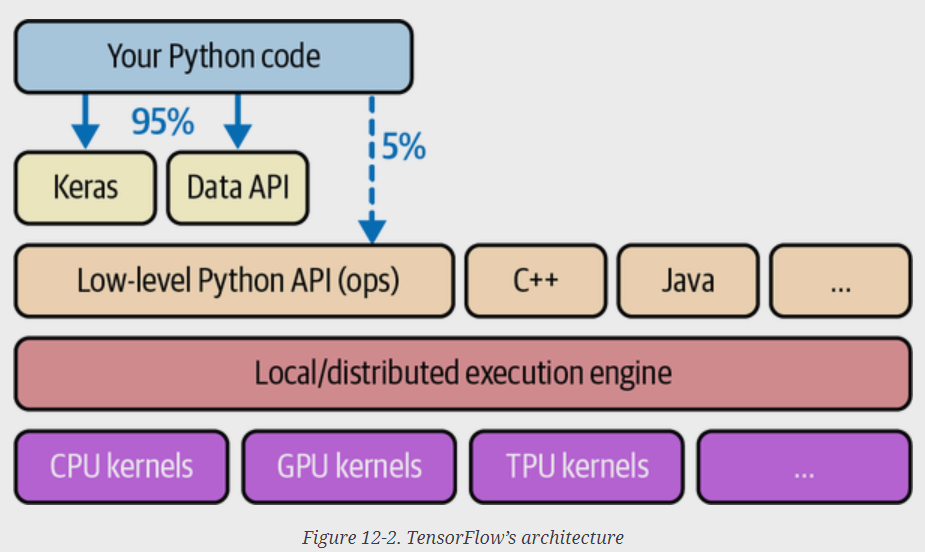

TensorFlow is at the center of an extensive ecosystem of libraries. First, there’s TensorBoard for visualization (see Chapter 10). Next, there’s TensorFlow Extended (TFX), which is a set of libraries built by Google to productionize TensorFlow projects: it includes tools for data validation, preprocessing, model analysis, and serving (with TF Serving; see Chapter 19). Google’s TensorFlow Hub provides a way to easily download and reuse pretrained neural networks. You can also get many neural network architectures, some of them pretrained, in TensorFlow’s model garden. Check out the TensorFlow Resources and https://github.com/jtoy/awesome-tensorflow for more TensorFlow-based projects. You will find hundreds of TensorFlow projects on GitHub, so it is often easy to find existing code for whatever you are trying to do.

### Tensors and Operations
TensorFlow’s API revolves around tensors, which flow from operation to operation—hence the name TensorFlow. A tensor is very similar to a NumPy ndarray: it is usually a multidimensional array, but it can also hold a scalar (a simple value, such as 42). These tensors will be important when we create custom cost functions, custom metrics, custom layers, and more, so let’s see how to create and manipulate them.


#### Tensors

In [4]:
t = tf.constant([[1., 2., 3.], [4., 5., 6.]]) #here is a tensor representing a matrix with two rows and three columns of floats
t

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

Just like an ndarray, a tf.Tensor has a shape and a data type (dtype):

In [5]:
t.shape

TensorShape([2, 3])

In [6]:
t.dtype

tf.float32

#### Indexing
Just like numpy

In [7]:
t[:, 1:]

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[2., 3.],
       [5., 6.]], dtype=float32)>

In [8]:
t[..., 1, tf.newaxis]

<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
array([[2.],
       [5.]], dtype=float32)>

#### Ops
Note that writing t + 10 is equivalent to calling tf.add(t, 10) (indeed, Python calls the magic method t.__add__(10), which just calls tf.add(t, 10)). Other operators, like - and *, are also supported. The @ operator was added in Python 3.5, for matrix multiplication: it is equivalent to calling the tf.matmul() function.

In [9]:
t + 10

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[11., 12., 13.],
       [14., 15., 16.]], dtype=float32)>

In [10]:
tf.square(t)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)>

In [11]:
t @ tf.transpose(t)

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[14., 32.],
       [32., 77.]], dtype=float32)>

#### Scalars

In [12]:
tf.constant(42)

<tf.Tensor: shape=(), dtype=int32, numpy=42>

#### Keras's low-level API

You may still run across code that uses Keras's low-level API:

In [13]:
K = tf.keras.backend
K.square(K.transpose(t)) + 10

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[11., 26.],
       [14., 35.],
       [19., 46.]], dtype=float32)>

But since Keras does not support multiple backends anymore, you should instead use TF's low-level API directly:

In [14]:
tf.square(tf.transpose(t)) + 10

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[11., 26.],
       [14., 35.],
       [19., 46.]], dtype=float32)>

### Tensors and NumPy
Tensors play nice with NumPy: you can create a tensor from a NumPy array, and vice versa. You can even apply TensorFlow operations to NumPy arrays and NumPy operations to tensors:

Notice that NumPy uses 64-bit precision by default, while TensorFlow uses 32-bit. This is because 32-bit precision is generally more than enough for neural networks, plus it runs faster and uses less RAM. So when you create a tensor from a NumPy array, make sure to set dtype=tf.float32.

In [15]:
import numpy as np

a = np.array([2., 4., 5.])
tf.constant(a)

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([2., 4., 5.])>

In [16]:
t.numpy()

array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)

In [17]:
np.array(t)

array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)

In [18]:
tf.square(a)

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([ 4., 16., 25.])>

In [19]:
np.square(t)

array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)

### Type Conversions
Type conversions can significantly hurt performance, and they can easily go unnoticed when they are done automatically. To avoid this, TensorFlow does not perform any type conversions automatically: it just raises an exception if you try to execute an operation on tensors with incompatible types. For example, you cannot add a float tensor and an integer tensor, and you cannot even add a 32-bit float and a 64-bit float:

In [20]:
try:
    tf.constant(2.0) + tf.constant(40)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

cannot compute AddV2 as input #1(zero-based) was expected to be a float tensor but is a int32 tensor [Op:AddV2]


In [21]:
try:
    tf.constant(2.0) + tf.constant(40., dtype=tf.float64)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

cannot compute AddV2 as input #1(zero-based) was expected to be a float tensor but is a double tensor [Op:AddV2]


In [22]:
t2 = tf.constant(40., dtype=tf.float64)
tf.constant(2.0) + tf.cast(t2, tf.float32)

<tf.Tensor: shape=(), dtype=float32, numpy=42.0>

### Variables
The tf.Tensor values we’ve seen so far are immutable: we cannot modify them. This means that we cannot use regular tensors to implement weights in a neural network, since they need to be tweaked by backpropagation. Plus, other parameters may also need to change over time (e.g., a momentum optimizer keeps track of past gradients). What we need is a tf.Variable:

A tf.Variable acts much like a tf.Tensor: you can perform the same operations with it, it plays nicely with NumPy as well, and it is just as picky with types. But it can also be modified in place using the assign() method (or assign_add() or assign_sub(), which increment or decrement the variable by the given value). You can also modify individual cells (or slices), by using the cell’s (or slice’s) assign() method or by using the scatter_update() or scatter_nd_update() methods:

In [23]:
v = tf.Variable([[1., 2., 3.], [4., 5., 6.]])
v

<tf.Variable 'Variable:0' shape=(2, 3) dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

In [24]:
v.assign(2 * v)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2.,  4.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [25]:
v[0, 1].assign(42)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [26]:
v[:, 2].assign([0., 1.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  0.],
       [ 8., 10.,  1.]], dtype=float32)>

In [27]:
v.scatter_nd_update(
    indices=[[0, 0], [1, 2]], updates=[100., 200.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[100.,  42.,   0.],
       [  8.,  10., 200.]], dtype=float32)>

In [28]:
# extra code – shows how to use scatter_update()
sparse_delta = tf.IndexedSlices(values=[[1., 2., 3.], [4., 5., 6.]],
                                indices=[1, 0])
v.scatter_update(sparse_delta)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[4., 5., 6.],
       [1., 2., 3.]], dtype=float32)>

In [29]:
try:
    v[1] = [7., 8., 9.]
except TypeError as ex:
    print(ex)

'ResourceVariable' object does not support item assignment


### Strings

The code in this section and all the following sections  in appendix C

In [30]:
tf.constant(b"hello world")

<tf.Tensor: shape=(), dtype=string, numpy=b'hello world'>

In [31]:
tf.constant("café")

<tf.Tensor: shape=(), dtype=string, numpy=b'caf\xc3\xa9'>

In [32]:
u = tf.constant([ord(c) for c in "café"])
u

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233])>

In [33]:
b = tf.strings.unicode_encode(u, "UTF-8")
tf.strings.length(b, unit="UTF8_CHAR")

<tf.Tensor: shape=(), dtype=int32, numpy=4>

In [34]:
tf.strings.unicode_decode(b, "UTF-8")

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233])>

### Other Data Structures
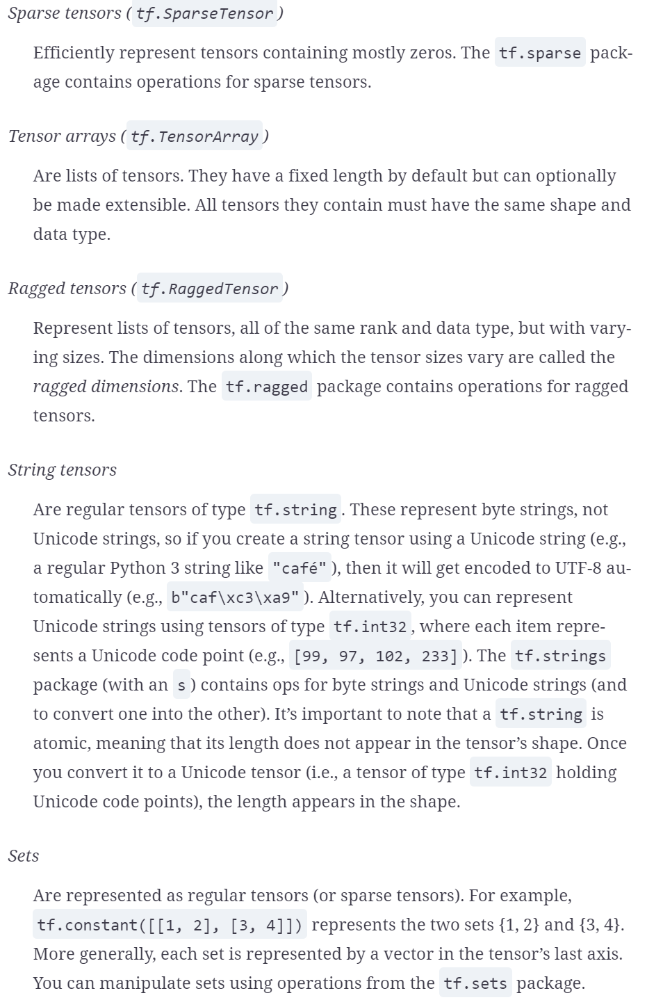
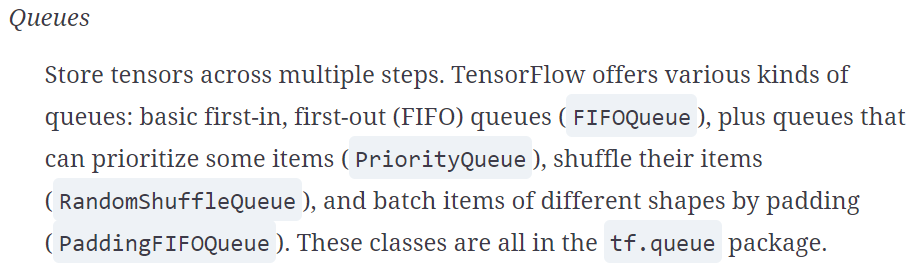

The code in this section is in Appendix C.

#### String arrays

In [35]:
tf.constant(b"hello world")

<tf.Tensor: shape=(), dtype=string, numpy=b'hello world'>

In [36]:
tf.constant("café")

<tf.Tensor: shape=(), dtype=string, numpy=b'caf\xc3\xa9'>

In [37]:
u = tf.constant([ord(c) for c in "café"])
u

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233])>

In [38]:
b = tf.strings.unicode_encode(u, "UTF-8")
b

<tf.Tensor: shape=(), dtype=string, numpy=b'caf\xc3\xa9'>

In [39]:
tf.strings.length(b, unit="UTF8_CHAR")

<tf.Tensor: shape=(), dtype=int32, numpy=4>

In [40]:
tf.strings.unicode_decode(b, "UTF-8")

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233])>

In [41]:
p = tf.constant(["Café", "Coffee", "caffè", "咖啡"])

In [42]:
tf.strings.length(p, unit="UTF8_CHAR")

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([4, 6, 5, 2])>

In [43]:
r = tf.strings.unicode_decode(p, "UTF8")
r

<tf.RaggedTensor [[67, 97, 102, 233], [67, 111, 102, 102, 101, 101],
 [99, 97, 102, 102, 232], [21654, 21857]]>

#### Ragged tensors

In [44]:
r[1]

<tf.Tensor: shape=(6,), dtype=int32, numpy=array([ 67, 111, 102, 102, 101, 101])>

In [45]:
r[1:3]  # extra code – a slice of a ragged tensor is a ragged tensor

<tf.RaggedTensor [[67, 111, 102, 102, 101, 101], [99, 97, 102, 102, 232]]>

In [46]:
r2 = tf.ragged.constant([[65, 66], [], [67]])
tf.concat([r, r2], axis=0)

<tf.RaggedTensor [[67, 97, 102, 233], [67, 111, 102, 102, 101, 101],
 [99, 97, 102, 102, 232], [21654, 21857], [65, 66], [], [67]]>

In [47]:
r3 = tf.ragged.constant([[68, 69, 70], [71], [], [72, 73]])
print(tf.concat([r, r3], axis=1))

<tf.RaggedTensor [[67, 97, 102, 233, 68, 69, 70], [67, 111, 102, 102, 101, 101, 71],
 [99, 97, 102, 102, 232], [21654, 21857, 72, 73]]>


In [48]:
r.to_tensor()

<tf.Tensor: shape=(4, 6), dtype=int32, numpy=
array([[   67,    97,   102,   233,     0,     0],
       [   67,   111,   102,   102,   101,   101],
       [   99,    97,   102,   102,   232,     0],
       [21654, 21857,     0,     0,     0,     0]])>

#### Sparse tensors

In [49]:
s = tf.SparseTensor(indices=[[0, 1], [1, 0], [2, 3]],
                    values=[1., 2., 3.],
                    dense_shape=[3, 4])

In [50]:
tf.sparse.to_dense(s)

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0., 1., 0., 0.],
       [2., 0., 0., 0.],
       [0., 0., 0., 3.]], dtype=float32)>

In [51]:
s * 42.0

In [52]:
try:
    s + 42.0
except TypeError as ex:
    print(ex)

unsupported operand type(s) for +: 'SparseTensor' and 'float'


In [53]:
# extra code – shows how to multiply a sparse tensor and a dense tensor
s4 = tf.constant([[10., 20.], [30., 40.], [50., 60.], [70., 80.]])
tf.sparse.sparse_dense_matmul(s, s4)

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[ 30.,  40.],
       [ 20.,  40.],
       [210., 240.]], dtype=float32)>

In [54]:
# extra code – when creating a sparse tensor, values must be given in "reading
#              order", or else `to_dense()` will fail.
s5 = tf.SparseTensor(indices=[[0, 2], [0, 1]],  # WRONG ORDER!
                     values=[1., 2.],
                     dense_shape=[3, 4])
try:
    tf.sparse.to_dense(s5)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

{{function_node __wrapped__SparseToDense_device_/job:localhost/replica:0/task:0/device:GPU:0}} indices[1] is out of order. Many sparse ops require sorted indices.
  Use `tf.sparse.reorder` to create a correctly ordered copy.


	 [[{{node SparseToDense}}]] [Op:SparseToDense]


In [55]:
# extra code – shows how to fix the sparse tensor s5 by reordering its values
s6 = tf.sparse.reorder(s5)
tf.sparse.to_dense(s6)

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0., 2., 1., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]], dtype=float32)>

#### Tensor Arrays

In [56]:
array = tf.TensorArray(dtype=tf.float32, size=3)
array = array.write(0, tf.constant([1., 2.]))
array = array.write(1, tf.constant([3., 10.]))
array = array.write(2, tf.constant([5., 7.]))
tensor1 = array.read(1)  # returns (and zeros out!) tf.constant([3., 10.])

In [57]:
array.stack()

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[1., 2.],
       [0., 0.],
       [5., 7.]], dtype=float32)>

In [58]:
# extra code – shows how to disable clear_after_read
array2 = tf.TensorArray(dtype=tf.float32, size=3, clear_after_read=False)
array2 = array2.write(0, tf.constant([1., 2.]))
array2 = array2.write(1, tf.constant([3., 10.]))
array2 = array2.write(2, tf.constant([5., 7.]))
tensor2 = array2.read(1)  # returns tf.constant([3., 10.])
array2.stack()

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[ 1.,  2.],
       [ 3., 10.],
       [ 5.,  7.]], dtype=float32)>

In [59]:
# extra code – shows how to create and use a tensor array with a dynamic size
array3 = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
array3 = array3.write(0, tf.constant([1., 2.]))
array3 = array3.write(1, tf.constant([3., 10.]))
array3 = array3.write(2, tf.constant([5., 7.]))
tensor3 = array3.read(1)
array3.stack()

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[1., 2.],
       [0., 0.],
       [5., 7.]], dtype=float32)>

#### Sets

In [60]:
a = tf.constant([[1, 5, 9]])
b = tf.constant([[5, 6, 9, 11]])
u = tf.sets.union(a, b)
u

In [61]:
tf.sparse.to_dense(u)

<tf.Tensor: shape=(1, 5), dtype=int32, numpy=array([[ 1,  5,  6,  9, 11]])>

In [62]:
a = tf.constant([[1, 5, 9], [10, 0, 0]])
b = tf.constant([[5, 6, 9, 11], [13, 0, 0, 0]])
u = tf.sets.union(a, b)
tf.sparse.to_dense(u)

<tf.Tensor: shape=(2, 5), dtype=int32, numpy=
array([[ 1,  5,  6,  9, 11],
       [ 0, 10, 13,  0,  0]])>

In [63]:
# extra code – shows how to use a different default value: -1 in this case
a = tf.constant([[1, 5, 9], [10, -1, -1]])
b = tf.constant([[5, 6, 9, 11], [13, -1, -1, -1]])
u = tf.sets.union(a, b)
tf.sparse.to_dense(u, default_value=-1)

<tf.Tensor: shape=(2, 5), dtype=int32, numpy=
array([[ 1,  5,  6,  9, 11],
       [-1, 10, 13, -1, -1]])>

In [64]:
# extra code – shows how to use `tf.sets.difference()`
set1 = tf.constant([[2, 3, 5, 7], [7, 9, 0, 0]])
set2 = tf.constant([[4, 5, 6], [9, 10, 0]])
tf.sparse.to_dense(tf.sets.difference(set1, set2))

<tf.Tensor: shape=(2, 3), dtype=int32, numpy=
array([[2, 3, 7],
       [7, 0, 0]])>

In [65]:
# extra code – shows how to use `tf.sets.difference()`
tf.sparse.to_dense(tf.sets.intersection(set1, set2))

<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[5, 0],
       [0, 9]])>

In [66]:
# extra code – check whether set1[0] contains 5
tf.sets.size(tf.sets.intersection(set1[:1], tf.constant([[5, 0, 0, 0]]))) > 0

<tf.Tensor: shape=(1,), dtype=bool, numpy=array([ True])>

#### Queues

In [67]:
q = tf.queue.FIFOQueue(3, [tf.int32, tf.string], shapes=[(), ()])
q.enqueue([10, b"windy"])
q.enqueue([15, b"sunny"])
q.size()

<tf.Tensor: shape=(), dtype=int32, numpy=2>

In [68]:
q.dequeue()

[<tf.Tensor: shape=(), dtype=int32, numpy=10>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'windy'>]

In [69]:
q.enqueue_many([[13, 16], [b'cloudy', b'rainy']])

In [70]:
q.dequeue_many(3)

[<tf.Tensor: shape=(3,), dtype=int32, numpy=array([15, 13, 16])>,
 <tf.Tensor: shape=(3,), dtype=string, numpy=array([b'sunny', b'cloudy', b'rainy'], dtype=object)>]

## Custom loss function
Suppose you want to train a regression model, but your training set is a bit noisy. Of course, you start by trying to clean up your dataset by removing or fixing the outliers, but that turns out to be insufficient; the dataset is still noisy. Which loss function should you use? The mean squared error might penalize large errors too much and cause your model to be imprecise. The mean absolute error would not penalize outliers as much, but training might take a while to converge, and the trained model might not be very precise. This is probably a good time to use the Huber loss (introduced in Chapter 10) instead of the good old MSE. The Huber loss is available in Keras (just use an instance of the tf.keras.losses.Huber class), but let’s pretend it’s not there. To implement it, just create a function that takes the labels and the model’s predictions as arguments, and uses TensorFlow operations to compute a tensor containing all the losses (one per sample):

For better performance, you should use a vectorized implementation, as in this example. Moreover, if you want to benefit from TensorFlow’s graph optimization features, you should use only TensorFlow operations.

In [71]:
def huber_fn(y_true, y_pred):
    error = y_true - y_pred
    is_small_error = tf.abs(error) < 1
    squared_loss = tf.square(error) / 2
    linear_loss  = tf.abs(error) - 0.5
    return tf.where(is_small_error, squared_loss, linear_loss)

<Figure size 800x350 with 0 Axes>

Text(2.1, 3.5, '$\\frac{1}{2}z^2$')

Text(3.0, 2.2, '$|z| - \\frac{1}{2}$')

(-4.0, 4.0, 0.0, 4.0)

Text(0.5, 0, '$z$')

Text(0.5, 1.0, 'Huber loss')

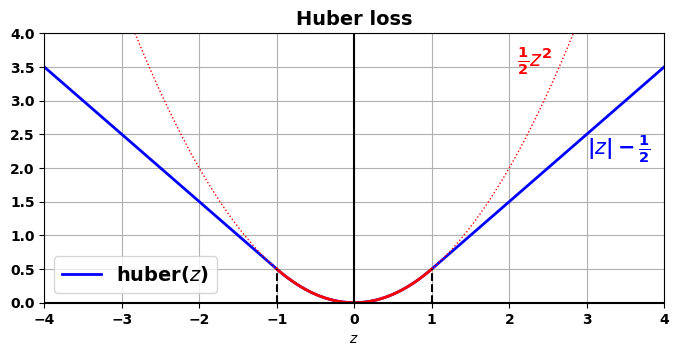

In [72]:
# extra code – shows what the Huber loss looks like

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3.5))
z = np.linspace(-4, 4, 200)
z_center = np.linspace(-1, 1, 200)
plt.plot(z, huber_fn(0, z), "b-", linewidth=2, label="huber($z$)")
plt.plot(z, z ** 2 / 2, "r:", linewidth=1)
plt.plot(z_center, z_center ** 2 / 2, "r", linewidth=2)
plt.plot([-1, -1], [0, huber_fn(0., -1.)], "k--")
plt.plot([1, 1], [0, huber_fn(0., 1.)], "k--")
plt.gca().axhline(y=0, color='k')
plt.gca().axvline(x=0, color='k')
plt.text(2.1, 3.5, r"$\frac{1}{2}z^2$", color="r", fontsize=15)
plt.text(3.0, 2.2, r"$|z| - \frac{1}{2}$", color="b", fontsize=15)
plt.axis([-4, 4, 0, 4])
plt.grid(True)
plt.xlabel("$z$")
plt.legend(fontsize=14)
plt.title("Huber loss", fontsize=14)
plt.show()

To test our custom loss function, let's create a basic Keras model and train it on the California housing dataset:

In [73]:
# extra code – loads, splits and scales the California housing dataset, then
#              creates a simple Keras model

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

housing = fetch_california_housing()
X_train_full, X_test, y_train_full, y_test = train_test_split(
    housing.data, housing.target.reshape(-1, 1), random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_full, y_train_full, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

input_shape = X_train.shape[1:]

tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1),
])

In [74]:
# Now you can use this Huber loss function when you compile the Keras model, then train your model as usual:
model.compile(loss=huber_fn, optimizer="nadam", metrics=["mae"])

For each batch during training, Keras will call the huber_fn() function to compute the loss, then it will use reverse-mode autodiff to compute the gradients of the loss with regard to all the model parameters, and finally it will perform a gradient descent step (in this example using a Nadam optimizer). Moreover, it will keep track of the total loss since the beginning of the epoch, and it will display the mean loss.

In [75]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 5s 12ms/step - loss: 0.6165 - mae: 0.9848 - val_loss: 0.3098 - val_mae: 0.6324
Epoch 2/2
363/363 [==============================] - 4s 12ms/step - loss: 0.2683 - mae: 0.5821 - val_loss: 0.2340 - val_mae: 0.5280


## Saving/Loading Models with Custom Objects
Saving a model containing a custom loss function works fine, but when you load it, you’ll need to provide a dictionary that maps the function name to the actual function. More generally, when you load a model containing custom objects, you need to map the names to the objects:

In [76]:
model.save("my_model_with_a_custom_loss")  # extra code – saving works fine

INFO:tensorflow:Assets written to: my_model_with_a_custom_loss\assets


In [77]:
model = tf.keras.models.load_model("my_model_with_a_custom_loss",
                                   custom_objects={"huber_fn": huber_fn})

In [78]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 5s 12ms/step - loss: 0.2173 - mae: 0.5091 - val_loss: 0.1912 - val_mae: 0.4689
Epoch 2/2
363/363 [==============================] - 4s 12ms/step - loss: 0.1923 - mae: 0.4731 - val_loss: 0.1751 - val_mae: 0.4504


With the current implementation, any error between –1 and 1 is considered “small”. But what if you want a different threshold? One solution is to create a function that creates a configured loss function:

In [79]:
def create_huber(threshold=1.0):
    def huber_fn(y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < threshold
        squared_loss = tf.square(error) / 2
        linear_loss  = threshold * tf.abs(error) - threshold ** 2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)
    return huber_fn

In [80]:
model.compile(loss=create_huber(2.0), optimizer="nadam", metrics=["mae"])

In [81]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 5s 13ms/step - loss: 0.2054 - mae: 0.4616 - val_loss: 0.1903 - val_mae: 0.4425
Epoch 2/2
363/363 [==============================] - 5s 14ms/step - loss: 0.1976 - mae: 0.4528 - val_loss: 0.1844 - val_mae: 0.4431


In [82]:
model.save("my_model_with_a_custom_loss_threshold_2")

INFO:tensorflow:Assets written to: my_model_with_a_custom_loss_threshold_2\assets


In [83]:
model = tf.keras.models.load_model("my_model_with_a_custom_loss_threshold_2",
                                   custom_objects={"huber_fn": create_huber(2.0)})

In [84]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 7s 16ms/step - loss: 0.1932 - mae: 0.4477 - val_loss: 0.1796 - val_mae: 0.4332
Epoch 2/2
363/363 [==============================] - 6s 16ms/step - loss: 0.1890 - mae: 0.4422 - val_loss: 0.1886 - val_mae: 0.4410


Unfortunately, when you save the model, the threshold will not be saved. This means that you will have to specify the threshold value when loading the model (note that the name to use is "huber_fn", which is the name of the function you gave Keras, not the name of the function that created it):
You can solve this by creating a subclass of the tf.keras.losses.Loss class, and then implementing its get_config() method:

The constructor accepts **kwargs and passes them to the parent constructor, which handles standard hyperparameters: the name of the loss and the reduction algorithm to use to aggregate the individual instance losses. By default this is "AUTO", which is equivalent to "SUM_OVER_BATCH_SIZE": the loss will be the sum of the instance losses, weighted by the sample weights, if any, and divided by the batch size (not by the sum of weights, so this is not the weighted mean).⁠6 Other possible values are "SUM" and "NONE".

The call() method takes the labels and predictions, computes all the instance losses, and returns them.

The get_config() method returns a dictionary mapping each hyperparameter name to its value. It first calls the parent class’s get_config() method, then adds the new hyperparameters to this dictionary.⁠7

You can then use any instance of this class when you compile the model:

In [85]:
class HuberLoss(tf.keras.losses.Loss):
    def __init__(self, threshold=1.0, **kwargs):
        self.threshold = threshold
        super().__init__(**kwargs)

    def call(self, y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < self.threshold
        squared_loss = tf.square(error) / 2
        linear_loss  = self.threshold * tf.abs(error) - self.threshold**2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "threshold": self.threshold}

In [86]:
# extra code – creates another basic Keras model
tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1),
])

In [87]:
model.compile(loss=HuberLoss(2.), optimizer="nadam", metrics=["mae"])

In [88]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 7s 16ms/step - loss: 0.9119 - mae: 1.0339 - val_loss: 0.3838 - val_mae: 0.6539
Epoch 2/2
363/363 [==============================] - 6s 15ms/step - loss: 0.3411 - mae: 0.6133 - val_loss: 0.2847 - val_mae: 0.5596


When you save the model, the threshold will be saved along with it; and when you load the model, you just need to map the class name to the class itself:

In [89]:
model.save("my_model_with_a_custom_loss_class")  # extra code – saving works

INFO:tensorflow:Assets written to: my_model_with_a_custom_loss_class\assets


In [90]:
model = tf.keras.models.load_model("my_model_with_a_custom_loss_class",
                                   custom_objects={"HuberLoss": HuberLoss})

In [91]:
# extra code – shows that loading worked fine, the model can be used normally
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 7s 16ms/step - loss: 0.2658 - mae: 0.5334 - val_loss: 0.2532 - val_mae: 0.5011
Epoch 2/2
363/363 [==============================] - 6s 15ms/step - loss: 0.2237 - mae: 0.4875 - val_loss: 0.2236 - val_mae: 0.4776


In [92]:
model.loss.threshold  # extra code – the treshold was loaded correctly

2.0

## Other Custom Functions
Most Keras functionalities, such as losses, regularizers, constraints, initializers, metrics, activation functions, layers, and even full models, can be customized in much the same way. Most of the time, you will just need to write a simple function with the appropriate inputs and outputs. Here are examples of a custom activation function (equivalent to tf.keras.activations.softplus() or tf.nn.softplus()), a custom Glorot initializer (equivalent to tf.keras.initializers.glorot_normal()), a custom ℓ1 regularizer (equivalent to tf.keras.regularizers.l1(0.01)), and a custom constraint that ensures weights are all positive (equivalent to tf.keras.​con⁠straints.nonneg() or tf.nn.relu()):

In [93]:
def my_softplus(z):
    return tf.math.log(1.0 + tf.exp(z))

def my_glorot_initializer(shape, dtype=tf.float32):
    stddev = tf.sqrt(2. / (shape[0] + shape[1]))
    return tf.random.normal(shape, stddev=stddev, dtype=dtype)

def my_l1_regularizer(weights):
    return tf.reduce_sum(tf.abs(0.01 * weights))

def my_positive_weights(weights):  # return value is just tf.nn.relu(weights)
    return tf.where(weights < 0., tf.zeros_like(weights), weights)

In [94]:
# uses functions defined above:
layer = tf.keras.layers.Dense(1, activation=my_softplus,
                              kernel_initializer=my_glorot_initializer,
                              kernel_regularizer=my_l1_regularizer,
                              kernel_constraint=my_positive_weights)

In [95]:
# extra code – show that building, training, saving, loading, and training again
#              works fine with a model containing many custom parts

tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1, activation=my_softplus,
                          kernel_initializer=my_glorot_initializer,
                          kernel_regularizer=my_l1_regularizer,
                          kernel_constraint=my_positive_weights)
])
model.compile(loss="mse", optimizer="nadam", metrics=["mae"])
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))
model.save("my_model_with_many_custom_parts")
model = tf.keras.models.load_model(
    "my_model_with_many_custom_parts",
    custom_objects={
       "my_l1_regularizer": my_l1_regularizer,
       "my_positive_weights": my_positive_weights,
       "my_glorot_initializer": my_glorot_initializer,
       "my_softplus": my_softplus,
    }
)
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 7s 17ms/step - loss: 1.5526 - mae: 0.8630 - val_loss: inf - val_mae: inf
Epoch 2/2
363/363 [==============================] - 6s 16ms/step - loss: 0.9320 - mae: 0.6564 - val_loss: inf - val_mae: inf


INFO:tensorflow:Assets written to: my_model_with_many_custom_parts\assets
Epoch 1/2
363/363 [==============================] - 8s 19ms/step - loss: 0.6522 - mae: 0.5696 - val_loss: inf - val_mae: inf
Epoch 2/2
363/363 [==============================] - 5s 13ms/step - loss: 0.5567 - mae: 0.5285 - val_loss: 2.6376 - val_mae: 0.5404


If a function has hyperparameters that need to be saved along with the model, then you will want to subclass the appropriate class, such as tf.keras.regu⁠larizers.​​Reg⁠⁠ularizer, tf.keras.constraints.Constraint, tf.keras.initializers.​Ini⁠tializer, or tf.keras.layers.Layer (for any layer, including activation functions). Much as you did for the custom loss, here is a simple class for ℓ1 regularization that saves its factor hyperparameter (this time you do not need to call the parent constructor or the get_config() method, as they are not defined by the parent class):

In [96]:
class MyL1Regularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, factor):
        self.factor = factor

    def __call__(self, weights):
        return tf.reduce_sum(tf.abs(self.factor * weights))

    def get_config(self):
        return {"factor": self.factor}

In [97]:
# extra code – again, show that everything works fine, this time using our
#              custom regularizer class

tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1, activation=my_softplus,
                          kernel_regularizer=MyL1Regularizer(0.01),
                          kernel_constraint=my_positive_weights,
                          kernel_initializer=my_glorot_initializer),
])
model.compile(loss="mse", optimizer="nadam", metrics=["mae"])
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))
model.save("my_model_with_many_custom_parts")
model = tf.keras.models.load_model(
    "my_model_with_many_custom_parts",
    custom_objects={
       "MyL1Regularizer": MyL1Regularizer,
       "my_positive_weights": my_positive_weights,
       "my_glorot_initializer": my_glorot_initializer,
       "my_softplus": my_softplus,
    }
)
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 6s 15ms/step - loss: 1.0782 - mae: 0.7564 - val_loss: 1.4403 - val_mae: 0.6596
Epoch 2/2
363/363 [==============================] - 5s 15ms/step - loss: 0.7031 - mae: 0.6067 - val_loss: 0.8110 - val_mae: 0.5598


INFO:tensorflow:Assets written to: my_model_with_many_custom_parts\assets
Epoch 1/2
363/363 [==============================] - 6s 14ms/step - loss: 0.5612 - mae: 0.5354 - val_loss: 0.5021 - val_mae: 0.4961
Epoch 2/2
363/363 [==============================] - 5s 13ms/step - loss: 0.5005 - mae: 0.5008 - val_loss: 0.4848 - val_mae: 0.4827


## Custom Metrics
Losses and metrics are conceptually not the same thing: losses (e.g., cross entropy) are used by gradient descent to train a model, so they must be differentiable (at least at the points where they are evaluated), and their gradients should not be zero everywhere. Plus, it’s OK if they are not easily interpretable by humans. In contrast, metrics (e.g., accuracy) are used to evaluate a model: they must be more easily interpretable, and they can be nondifferentiable or have zero gradients everywhere.

That said, in most cases, defining a custom metric function is exactly the same as defining a custom loss function. In fact, we could even use the Huber loss function we created earlier as a metric;⁠8 it would work just fine (and persistence would also work the same way, in this case only saving the name of the function, "huber_fn", not the threshold):

In [98]:
# extra code – once again, lets' create a basic Keras model
tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1),
])

In [99]:
model.compile(loss="mse", optimizer="nadam", metrics=[create_huber(2.0)])

In [100]:
# extra code – train the model with our custom metric
model.fit(X_train_scaled, y_train, epochs=2)

Epoch 1/2
363/363 [==============================] - 5s 12ms/step - loss: 1.7880 - huber_fn: 0.7429
Epoch 2/2
363/363 [==============================] - 5s 13ms/step - loss: 0.7208 - huber_fn: 0.3201


**Note**: if you use the same function as the loss and a metric, you may be surprised to see slightly different results. This is in part because the operations are not computed exactly in the same order, so there might be tiny floating point errors. More importantly, if you use sample weights or class weights, then the equations are a bit different:
* the `fit()` method keeps track of the mean of all batch losses seen so far since the start of the epoch. Each batch loss is the sum of the weighted instance losses divided by the _batch size_ (not the sum of weights, so the batch loss is _not_ the weighted mean of the losses).
* the metric since the start of the epoch is equal to the sum of weighted instance losses divided by sum of all weights seen so far. In other words, it is the weighted mean of all the instance losses. Not the same thing.

### Streaming metrics

For each batch during training, Keras will compute this metric and keep track of its mean since the beginning of the epoch. Most of the time, this is exactly what you want. But not always! Consider a binary classifier’s precision, for example. As you saw in Chapter 3, precision is the number of true positives divided by the number of positive predictions (including both true positives and false positives). Suppose the model made five positive predictions in the first batch, four of which were correct: that’s 80% precision. Then suppose the model made three positive predictions in the second batch, but they were all incorrect: that’s 0% precision for the second batch. If you just compute the mean of these two precisions, you get 40%. But wait a second—that’s not the model’s precision over these two batches! Indeed, there were a total of four true positives (4 + 0) out of eight positive predictions (5 + 3), so the overall precision is 50%, not 40%. What we need is an object that can keep track of the number of true positives and the number of false positives and that can compute the precision based on these numbers when requested. This is precisely what the tf.keras.metrics.Precision class does:

In [101]:
precision = tf.keras.metrics.Precision()
precision([0, 1, 1, 1, 0, 1, 0, 1], [1, 1, 0, 1, 0, 1, 0, 1])

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

In [102]:
precision([0, 1, 0, 0, 1, 0, 1, 1], [1, 0, 1, 1, 0, 0, 0, 0])

<tf.Tensor: shape=(), dtype=float32, numpy=0.5>

In this example, we created a Precision object, then we used it like a function, passing it the labels and predictions for the first batch, then for the second batch (you can optionally pass sample weights as well, if you want). We used the same number of true and false positives as in the example we just discussed. After the first batch, it returns a precision of 80%; then after the second batch, it returns 50% (which is the overall precision so far, not the second batch’s precision). This is called a streaming metric (or stateful metric), as it is gradually updated, batch after batch.

At any point, we can call the result() method to get the current value of the metric. We can also look at its variables (tracking the number of true and false positives) by using the variables attribute, and we can reset these variables using the reset_states() method:

In [103]:
precision.result()

<tf.Tensor: shape=(), dtype=float32, numpy=0.5>

In [104]:
precision.variables

[<tf.Variable 'true_positives:0' shape=(1,) dtype=float32, numpy=array([4.], dtype=float32)>,
 <tf.Variable 'false_positives:0' shape=(1,) dtype=float32, numpy=array([4.], dtype=float32)>]

In [105]:
precision.reset_states()

Creating a streaming metric:

If you need to define your own custom streaming metric, create a subclass of the tf.keras.metrics.Metric class. Here is a basic example that keeps track of the total Huber loss and the number of instances seen so far. When asked for the result, it returns the ratio, which is just the mean Huber loss:

In [106]:
class HuberMetric(tf.keras.metrics.Metric):
    def __init__(self, threshold=1.0, **kwargs):
        super().__init__(**kwargs)  # handles base args (e.g., dtype)
        self.threshold = threshold
        self.huber_fn = create_huber(threshold)
        self.total = self.add_weight("total", initializer="zeros")
        self.count = self.add_weight("count", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        sample_metrics = self.huber_fn(y_true, y_pred)
        self.total.assign_add(tf.reduce_sum(sample_metrics))
        self.count.assign_add(tf.cast(tf.size(y_true), tf.float32))

    def result(self):
        return self.total / self.count

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "threshold": self.threshold}

The constructor uses the add_weight() method to create the variables needed to keep track of the metric’s state over multiple batches—in this case, the sum of all Huber losses (total) and the number of instances seen so far (count). You could just create variables manually if you preferred. Keras tracks any tf.Variable that is set as an attribute (and more generally, any “trackable” object, such as layers or models).

The update_state() method is called when you use an instance of this class as a function (as we did with the Precision object). It updates the variables, given the labels and predictions for one batch (and sample weights, but in this case we ignore them).

The result() method computes and returns the final result, in this case the mean Huber metric over all instances. When you use the metric as a function, the update_state() method gets called first, then the result() method is called, and its output is returned.

We also implement the get_config() method to ensure the threshold gets saved along with the model.

The default implementation of the reset_states() method resets all variables to 0.0 (but you can override it if needed).

**Extra material** – the rest of this section tests the `HuberMetric` class and shows another implementation subclassing `tf.keras.metrics.Mean`.

In [107]:
m = HuberMetric(2.)

# total = 2 * |10 - 2| - 2²/2 = 14
# count = 1
# result = 14 / 1 = 14
m(tf.constant([[2.]]), tf.constant([[10.]]))

<tf.Tensor: shape=(), dtype=float32, numpy=14.0>

In [108]:
# total = total + (|1 - 0|² / 2) + (2 * |9.25 - 5| - 2² / 2) = 14 + 7 = 21
# count = count + 2 = 3
# result = total / count = 21 / 3 = 7
m(tf.constant([[0.], [5.]]), tf.constant([[1.], [9.25]]))

<tf.Tensor: shape=(), dtype=float32, numpy=7.0>

In [109]:
m.result()

<tf.Tensor: shape=(), dtype=float32, numpy=7.0>

In [110]:
m.variables

[<tf.Variable 'total:0' shape=() dtype=float32, numpy=21.0>,
 <tf.Variable 'count:0' shape=() dtype=float32, numpy=3.0>]

In [111]:
m.reset_states()
m.variables

[<tf.Variable 'total:0' shape=() dtype=float32, numpy=0.0>,
 <tf.Variable 'count:0' shape=() dtype=float32, numpy=0.0>]

Let's check that the `HuberMetric` class works well:

In [112]:
tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1),
])

In [113]:
model.compile(loss=create_huber(2.0), optimizer="nadam",
              metrics=[HuberMetric(2.0)])

In [114]:
model.fit(X_train_scaled, y_train, epochs=2)

Epoch 1/2
363/363 [==============================] - 5s 12ms/step - loss: 1.1300 - huber_metric_1: 1.1300
Epoch 2/2
363/363 [==============================] - 4s 12ms/step - loss: 0.2754 - huber_metric_1: 0.2754


In [115]:
model.save("my_model_with_a_custom_metric")

INFO:tensorflow:Assets written to: my_model_with_a_custom_metric\assets


In [116]:
model = tf.keras.models.load_model(
    "my_model_with_a_custom_metric",
    custom_objects={
        "huber_fn": create_huber(2.0),
        "HuberMetric": HuberMetric
    }
)

In [117]:
model.fit(X_train_scaled, y_train, epochs=2)

Epoch 1/2
363/363 [==============================] - 5s 11ms/step - loss: 0.2270 - huber_metric_1: 0.2270
Epoch 2/2
363/363 [==============================] - 4s 10ms/step - loss: 0.2032 - huber_metric_1: 0.2032


`model.metrics` contains the model's loss followed by the model's metric(s), so the `HuberMetric` is `model.metrics[-1]`:

In [118]:
model.metrics[-1].threshold

2.0

Looks like it works fine! More simply, we could have created the class like this:

In [119]:
class HuberMetric(tf.keras.metrics.Mean):
    def __init__(self, threshold=1.0, name='HuberMetric', dtype=None):
        self.threshold = threshold
        self.huber_fn = create_huber(threshold)
        super().__init__(name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        metric = self.huber_fn(y_true, y_pred)
        super(HuberMetric, self).update_state(metric, sample_weight)

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "threshold": self.threshold}        

This class handles shapes better, and it also supports sample weights.

In [120]:
tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          input_shape=input_shape),
    tf.keras.layers.Dense(1),
])

In [121]:
model.compile(loss=tf.keras.losses.Huber(2.0), optimizer="nadam",
              weighted_metrics=[HuberMetric(2.0)])

In [122]:
np.random.seed(42)
sample_weight = np.random.rand(len(y_train))
history = model.fit(X_train_scaled, y_train, epochs=2,
                    sample_weight=sample_weight)

Epoch 1/2
363/363 [==============================] - 5s 10ms/step - loss: 0.5105 - HuberMetric: 1.0287
Epoch 2/2
363/363 [==============================] - 5s 13ms/step - loss: 0.1460 - HuberMetric: 0.2942


In [123]:
(history.history["loss"][0],
 history.history["HuberMetric"][0] * sample_weight.mean())

(0.5104954242706299, 0.5104954783332705)

In [124]:
model.save("my_model_with_a_custom_metric_v2")

INFO:tensorflow:Assets written to: my_model_with_a_custom_metric_v2\assets


In [125]:
model = tf.keras.models.load_model("my_model_with_a_custom_metric_v2",
                                   custom_objects={"HuberMetric": HuberMetric})

In [126]:
model.fit(X_train_scaled, y_train, epochs=2)

Epoch 1/2
363/363 [==============================] - 5s 13ms/step - loss: 0.2301 - HuberMetric: 0.2301
Epoch 2/2
363/363 [==============================] - 5s 14ms/step - loss: 0.2023 - HuberMetric: 0.2023


In [127]:
model.metrics[-1].threshold

2.0

## Custom Layers

You may occasionally want to build an architecture that contains an exotic layer for which TensorFlow does not provide a default implementation. Or you may simply want to build a very repetitive architecture, in which a particular block of layers is repeated many times, and it would be convenient to treat each block as a single layer. For such cases, you’ll want to build a custom layer.

There are some layers that have no weights, such as tf.keras.layers.Flatten or tf.keras.layers.ReLU. If you want to create a custom layer without any weights, the simplest option is to write a function and wrap it in a tf.keras.layers.Lambda layer. For example, the following layer will apply the exponential function to its inputs:

In [128]:
exponential_layer = tf.keras.layers.Lambda(lambda x: tf.exp(x))

In [129]:
# extra code – like all layers, it can be used as a function:
exponential_layer([-1., 0., 1.])

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.36787948, 1.        , 2.7182817 ], dtype=float32)>

Adding an exponential layer at the output of a regression model can be useful if the values to predict are positive and with very different scales (e.g., 0.001, 10., 10000).

In [130]:
tf.random.set_seed(42)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu", input_shape=input_shape),
    tf.keras.layers.Dense(1),
    exponential_layer
])
model.compile(loss="mse", optimizer="sgd")
model.fit(X_train_scaled, y_train, epochs=5,
          validation_data=(X_valid_scaled, y_valid))
model.evaluate(X_test_scaled, y_test)

Epoch 1/5
363/363 [==============================] - 3s 6ms/step - loss: 0.7131 - val_loss: 0.4190
Epoch 2/5
363/363 [==============================] - 2s 6ms/step - loss: 0.4543 - val_loss: 0.3677
Epoch 3/5
363/363 [==============================] - 2s 6ms/step - loss: 0.4164 - val_loss: 0.3720
Epoch 4/5
363/363 [==============================] - 2s 6ms/step - loss: 0.4024 - val_loss: 0.3982
Epoch 5/5
363/363 [==============================] - 2s 6ms/step - loss: 0.3888 - val_loss: 0.3497


162/162 [==============================] - 1s 3ms/step - loss: 0.3676


0.3675534129142761

This custom layer can then be used like any other layer, using the sequential API, the functional API, or the subclassing API. You can also use it as an activation function, or you could use activation=tf.exp. The exponential layer is sometimes used in the output layer of a regression model when the values to predict have very different scales (e.g., 0.001, 10., 1,000.). In fact, the exponential function is one of the standard activation functions in Keras, so you can just use activation="exponential".

As you might guess, to build a custom stateful layer (i.e., a layer with weights), you need to create a subclass of the tf.keras.layers.Layer class. For example, the following class implements a simplified version of the Dense layer:

Alternatively, it's often preferable to replace the targets with the logarithm of the targets (and use no activation function in the output layer).

In [131]:
class MyDense(tf.keras.layers.Layer):
    def __init__(self, units, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, batch_input_shape):
        self.kernel = self.add_weight(
            name="kernel", shape=[batch_input_shape[-1], self.units],
            initializer="he_normal")
        self.bias = self.add_weight(
            name="bias", shape=[self.units], initializer="zeros")
        super().build(batch_input_shape)  # must be at the end

    def call(self, X):
        return self.activation(X @ self.kernel + self.bias)

    def compute_output_shape(self, batch_input_shape):
        return tf.TensorShape(batch_input_shape.as_list()[:-1] + [self.units])

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "units": self.units,
                "activation": tf.keras.activations.serialize(self.activation)}

The constructor takes all the hyperparameters as arguments (in this example, units and activation), and importantly it also takes a **kwargs argument. It calls the parent constructor, passing it the kwargs: this takes care of standard arguments such as input_shape, trainable, and name. Then it saves the hyperparameters as attributes, converting the activation argument to the appropriate activation function using the tf.keras.activations.get() function (it accepts functions, standard strings like "relu" or "swish", or simply None).

The build() method’s role is to create the layer’s variables by calling the add_weight() method for each weight. The build() method is called the first time the layer is used. At that point, Keras will know the shape of this layer’s inputs, and it will pass it to the build() method,⁠10 which is often necessary to create some of the weights. For example, we need to know the number of neurons in the previous layer in order to create the connection weights matrix (i.e., the "kernel"): this corresponds to the size of the last dimension of the inputs. At the end of the build() method (and only at the end), you must call the parent’s build() method: this tells Keras that the layer is built (it just sets self.built = True).

The call() method performs the desired operations. In this case, we compute the matrix multiplication of the inputs X and the layer’s kernel, we add the bias vector, and we apply the activation function to the result, and this gives us the output of the layer.

The get_config() method is just like in the previous custom classes. Note that we save the activation function’s full configuration by calling tf.keras.​activa⁠tions.serialize().

In [132]:
# extra code – shows that a custom layer can be used normally
tf.random.set_seed(42)
model = tf.keras.Sequential([
    MyDense(30, activation="relu", input_shape=input_shape),
    MyDense(1)
])
model.compile(loss="mse", optimizer="nadam")
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))
model.evaluate(X_test_scaled, y_test)
model.save("my_model_with_a_custom_layer")

Epoch 1/2
363/363 [==============================] - 5s 11ms/step - loss: 2.7772 - val_loss: 12.8630
Epoch 2/2
363/363 [==============================] - 4s 11ms/step - loss: 0.7820 - val_loss: 5.7273


162/162 [==============================] - 1s 3ms/step - loss: 0.6234


0.6234402060508728

INFO:tensorflow:Assets written to: my_model_with_a_custom_layer\assets


In [133]:
# extra code – shows how to load a model with a custom layer
model = tf.keras.models.load_model("my_model_with_a_custom_layer",
                                   custom_objects={"MyDense": MyDense})
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 [==============================] - 5s 13ms/step - loss: 0.5386 - val_loss: 0.4673
Epoch 2/2
363/363 [==============================] - 4s 12ms/step - loss: 0.4404 - val_loss: 0.4752


To create a layer with multiple inputs (e.g., Concatenate), the argument to the call() method should be a tuple containing all the inputs. To create a layer with multiple outputs, the call() method should return the list of outputs. For example, the following toy layer takes two inputs and returns three outputs:

In [134]:
class MyMultiLayer(tf.keras.layers.Layer):
    def call(self, X):
        X1, X2 = X
        print("X1.shape: ", X1.shape ," X2.shape: ", X2.shape)  # extra code
        return X1 + X2, X1 * X2, X1 / X2

    def compute_output_shape(self, batch_input_shape):
        batch_input_shape1, batch_input_shape2 = batch_input_shape
        return [batch_input_shape1, batch_input_shape1, batch_input_shape1]

Our custom layer can be called using the functional API like this:

In [135]:
# extra code – tests MyMultiLayer with symbolic inputs
inputs1 = tf.keras.layers.Input(shape=[2])
inputs2 = tf.keras.layers.Input(shape=[2])
MyMultiLayer()((inputs1, inputs2))

X1.shape:  (None, 2)  X2.shape:  (None, 2)


(<KerasTensor: shape=(None, 2) dtype=float32 (created by layer 'my_multi_layer')>,
 <KerasTensor: shape=(None, 2) dtype=float32 (created by layer 'my_multi_layer')>,
 <KerasTensor: shape=(None, 2) dtype=float32 (created by layer 'my_multi_layer')>)

Note that the `call()` method receives symbolic inputs, and it returns symbolic outputs. The shapes are only partially specified at this stage: we don't know the batch size, which is why the first dimension is `None`.

We can also pass actual data to the custom layer:

In [136]:
# extra code – tests MyMultiLayer with actual data 
X1, X2 = np.array([[3., 6.], [2., 7.]]), np.array([[6., 12.], [4., 3.]]) 
MyMultiLayer()((X1, X2))

X1.shape:  (2, 2)  X2.shape:  (2, 2)


(<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
 array([[ 9., 18.],
        [ 6., 10.]], dtype=float32)>,
 <tf.Tensor: shape=(2, 2), dtype=float32, numpy=
 array([[18., 72.],
        [ 8., 21.]], dtype=float32)>,
 <tf.Tensor: shape=(2, 2), dtype=float32, numpy=
 array([[0.5      , 0.5      ],
        [0.5      , 2.3333333]], dtype=float32)>)

Now let's create a layer with a different behavior during training and testing:

If your layer needs to have a different behavior during training and during testing (e.g., if it uses Dropout or BatchNormalization layers), then you must add a training argument to the call() method and use this argument to decide what to do. For example, let’s create a layer that adds Gaussian noise during training (for regularization) but does nothing during testing (Keras has a layer that does the same thing, tf.keras.layers.GaussianNoise):

In [137]:
class MyGaussianNoise(tf.keras.layers.Layer):
    def __init__(self, stddev, **kwargs):
        super().__init__(**kwargs)
        self.stddev = stddev

    def call(self, X, training=None):
        if training:
            noise = tf.random.normal(tf.shape(X), stddev=self.stddev)
            return X + noise
        else:
            return X

    def compute_output_shape(self, batch_input_shape):
        return batch_input_shape

Here's a simple model that uses this custom layer:

In [138]:
# extra code – tests MyGaussianNoise
tf.random.set_seed(42)
model = tf.keras.Sequential([
    MyGaussianNoise(stddev=1.0, input_shape=input_shape),
    tf.keras.layers.Dense(30, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dense(1)
])
model.compile(loss="mse", optimizer="nadam")
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))
model.evaluate(X_test_scaled, y_test)

Epoch 1/2
363/363 [==============================] - 5s 12ms/step - loss: 2.4685 - val_loss: 5.2437
Epoch 2/2
363/363 [==============================] - 4s 12ms/step - loss: 1.3050 - val_loss: 2.2785


162/162 [==============================] - 1s 4ms/step - loss: 1.0664


1.0663529634475708

## Custom Models

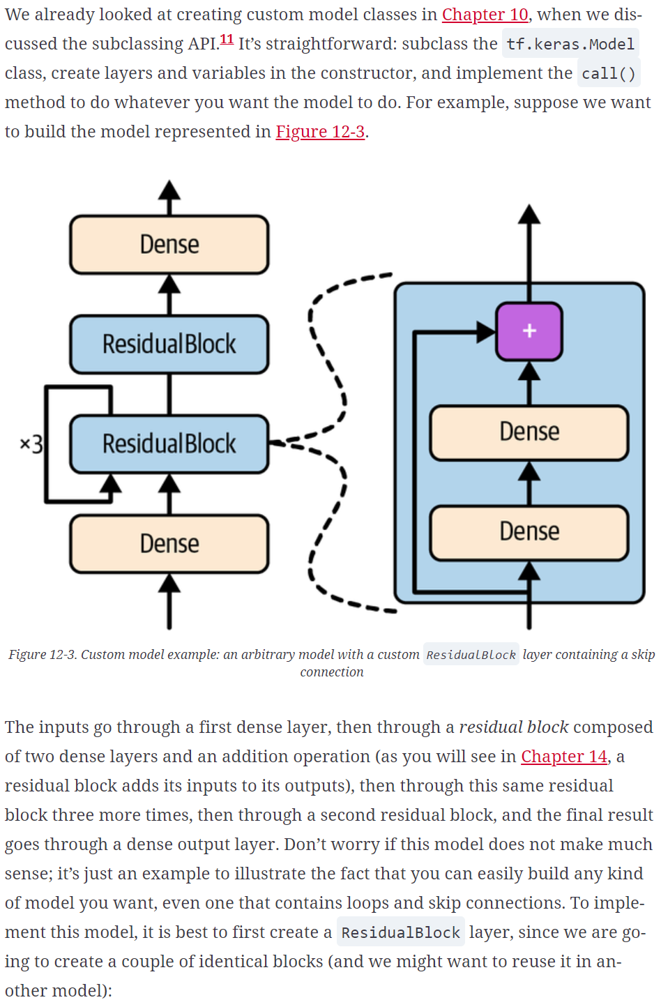

In [139]:
class ResidualBlock(tf.keras.layers.Layer):
    def __init__(self, n_layers, n_neurons, **kwargs):
        super().__init__(**kwargs)
        self.hidden = [tf.keras.layers.Dense(n_neurons, activation="relu",
                                             kernel_initializer="he_normal")
                       for _ in range(n_layers)]

    def call(self, inputs):
        Z = inputs
        for layer in self.hidden:
            Z = layer(Z)
        return inputs + Z

This layer is a bit special since it contains other layers. This is handled transparently by Keras: it automatically detects that the hidden attribute contains trackable objects (layers in this case), so their variables are automatically added to this layer’s list of variables. The rest of this class is self-explanatory. Next, let’s use the subclassing API to define the model itself:

In [140]:
class ResidualRegressor(tf.keras.Model):
    def __init__(self, output_dim, **kwargs):
        super().__init__(**kwargs)
        self.hidden1 = tf.keras.layers.Dense(30, activation="relu",
                                             kernel_initializer="he_normal")
        self.block1 = ResidualBlock(2, 30)
        self.block2 = ResidualBlock(2, 30)
        self.out = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        Z = self.hidden1(inputs)
        for _ in range(1 + 3):
            Z = self.block1(Z)
        Z = self.block2(Z)
        return self.out(Z)

We create the layers in the constructor and use them in the call() method. This model can then be used like any other model (compile it, fit it, evaluate it, and use it to make predictions). If you also want to be able to save the model using the save() method and load it using the tf.keras.models.load_model() function, you must implement the get_config() method (as we did earlier) in both the ResidualBlock class and the ResidualRegressor class. Alternatively, you can save and load the weights using the save_weights() and load_weights() methods.

The Model class is a subclass of the Layer class, so models can be defined and used exactly like layers. But a model has some extra functionalities, including of course its compile(), fit(), evaluate(), and predict() methods (and a few variants), plus the get_layer() method (which can return any of the model’s layers by name or by index) and the save() method (and support for tf.keras.models.load_model() and tf.keras.models.clone_model()).

In [141]:
# extra code – shows that the model can be used normally
tf.random.set_seed(42)
model = ResidualRegressor(1)
model.compile(loss="mse", optimizer="nadam")
history = model.fit(X_train_scaled, y_train, epochs=2)
score = model.evaluate(X_test_scaled, y_test)
model.save("my_custom_model")

Epoch 1/2
363/363 [==============================] - 11s 26ms/step - loss: 5.1097
Epoch 2/2
162/162 [==============================] - 1s 6ms/step - loss: 0.7434


INFO:tensorflow:Assets written to: my_custom_model\assets


INFO:tensorflow:Assets written to: my_custom_model\assets


In [142]:
# extra code – the model can be loaded and you can continue training or use it
#              to make predictions
model = tf.keras.models.load_model("my_custom_model")
history = model.fit(X_train_scaled, y_train, epochs=2)
model.predict(X_test_scaled[:3])

Epoch 1/2
363/363 [==============================] - 11s 27ms/step - loss: 1.3176
Epoch 2/2
1/1 [==============================] - 0s 85ms/step


array([[0.9809743],
       [1.6893421],
       [4.681402 ]], dtype=float32)

We could have defined the model using the sequential API instead:

In [143]:
tf.random.set_seed(42)
block1 = ResidualBlock(2, 30)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(30, activation="relu",
                          kernel_initializer="he_normal"),
    block1, block1, block1, block1,
    ResidualBlock(2, 30),
    tf.keras.layers.Dense(1)
])

## Losses and Metrics Based on Model Internals

The custom losses and metrics we defined earlier were all based on the labels and the predictions (and optionally sample weights). There will be times when you want to define losses based on other parts of your model, such as the weights or activations of its hidden layers. This may be useful for regularization purposes or to monitor some internal aspect of your model.

To define a custom loss based on model internals, compute it based on any part of the model you want, then pass the result to the add_loss() method. For example, let’s build a custom regression MLP model composed of a stack of five hidden layers plus an output layer. This custom model will also have an auxiliary output on top of the upper hidden layer. The loss associated with this auxiliary output will be called the reconstruction loss (see Chapter 17): it is the mean squared difference between the reconstruction and the inputs. By adding this reconstruction loss to the main loss, we will encourage the model to preserve as much information as possible through the hidden layers—even information that is not directly useful for the regression task itself. In practice, this loss sometimes improves generalization (it is a regularization loss). It is also possible to add a custom metric using the model’s add_metric() method. Here is the code for this custom model with a custom reconstruction loss and a corresponding metric:

**Warning**: due to an issue introduced in TF 2.2 ([#46858](https://github.com/tensorflow/tensorflow/issues/46858)), `super().build()` fails. We can work around this issue by setting `self.built = True` instead.

In [144]:
class ReconstructingRegressor(tf.keras.Model):
    def __init__(self, output_dim, **kwargs):
        super().__init__(**kwargs)
        self.hidden = [tf.keras.layers.Dense(30, activation="relu",
                                             kernel_initializer="he_normal")
                       for _ in range(5)]
        self.out = tf.keras.layers.Dense(output_dim)
        self.reconstruction_mean = tf.keras.metrics.Mean(
            name="reconstruction_error")

    def build(self, batch_input_shape):
        n_inputs = batch_input_shape[-1]
        self.reconstruct = tf.keras.layers.Dense(n_inputs)
        self.built = True  # WORKAROUND for super().build(batch_input_shape)

    def call(self, inputs, training=None):
        Z = inputs
        for layer in self.hidden:
            Z = layer(Z)
        reconstruction = self.reconstruct(Z)
        recon_loss = tf.reduce_mean(tf.square(reconstruction - inputs))
        self.add_loss(0.05 * recon_loss)
        if training:
            result = self.reconstruction_mean(recon_loss)
            self.add_metric(result)
        return self.out(Z)

The constructor creates the DNN with five dense hidden layers and one dense output layer. We also create a Mean streaming metric to keep track of the reconstruction error during training.

The build() method creates an extra dense layer that will be used to reconstruct the inputs of the model. It must be created here because its number of units must be equal to the number of inputs, and this number is unknown before the build() method is called.⁠12

The call() method processes the inputs through all five hidden layers, then passes the result through the reconstruction layer, which produces the reconstruction.

Then the call() method computes the reconstruction loss (the mean squared difference between the reconstruction and the inputs), and adds it to the model’s list of losses using the add_loss() method.⁠13 Notice that we scale down the reconstruction loss by multiplying it by 0.05 (this is a hyperparameter you can tune). This ensures that the reconstruction loss does not dominate the main loss.

Next, during training only, the call() method updates the reconstruction metric and adds it to the model so it can be displayed. This code example can actually be simplified by calling self.add_metric(recon_loss) instead: Keras will automatically track the mean for you.

Finally, the call() method passes the output of the hidden layers to the output layer and returns its output.

In [145]:
# extra code
tf.random.set_seed(42)
model = ReconstructingRegressor(1)
model.compile(loss="mse", optimizer="nadam")
history = model.fit(X_train_scaled, y_train, epochs=5)
y_pred = model.predict(X_test_scaled)

Epoch 1/5
363/363 [==============================] - 10s 24ms/step - loss: 1.0932 - reconstruction_error: 1.1119
Epoch 2/5
363/363 [==============================] - 9s 25ms/step - loss: 0.4474 - reconstruction_error: 0.5536
Epoch 3/5
363/363 [==============================] - 9s 24ms/step - loss: 0.3882 - reconstruction_error: 0.4275
Epoch 4/5
363/363 [==============================] - 9s 26ms/step - loss: 0.3738 - reconstruction_error: 0.3653
Epoch 5/5
162/162 [==============================] - 0s 2ms/step


## Computing Gradients Using Autodiff

To understand how to use autodiff (see Chapter 10 and Appendix B) to compute gradients automatically, let’s consider a simple toy function:

In [146]:
def f(w1, w2):
    return 3 * w1 ** 2 + 2 * w1 * w2

If you know calculus, you can analytically find that the partial derivative of this function with regard to w1 is 6 * w1 + 2 * w2. You can also find that its partial derivative with regard to w2 is 2 * w1. For example, at the point (w1, w2) = (5, 3), these partial derivatives are equal to 36 and 10, respectively, so the gradient vector at this point is (36, 10). But if this were a neural network, the function would be much more complex, typically with tens of thousands of parameters, and finding the partial derivatives analytically by hand would be a virtually impossible task. One solution could be to compute an approximation of each partial derivative by measuring how much the function’s output changes when you tweak the corresponding parameter by a tiny amount:

In [147]:
w1, w2 = 5, 3
eps = 1e-6
(f(w1 + eps, w2) - f(w1, w2)) / eps

36.000003007075065

In [148]:
(f(w1, w2 + eps) - f(w1, w2)) / eps

10.000000003174137

This works rather well and is easy to implement, but it is just an approximation, and importantly you need to call f() at least once per parameter (not twice, since we could compute f(w1, w2) just once). Having to call f() at least once per parameter makes this approach intractable for large neural networks. So instead, we should use reverse-mode autodiff. TensorFlow makes this pretty simple:

In [149]:
w1, w2 = tf.Variable(5.), tf.Variable(3.)
with tf.GradientTape() as tape:
    z = f(w1, w2)

gradients = tape.gradient(z, [w1, w2])

We first define two variables w1 and w2, then we create a tf.GradientTape context that will automatically record every operation that involves a variable, and finally we ask this tape to compute the gradients of the result z with regard to both variables [w1, w2]. Let’s take a look at the gradients that TensorFlow computed:

In [150]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>]

In order to save memory, only put the strict minimum inside the tf.GradientTape() block. Alternatively, pause recording by creating a with tape.stop_recording() block inside the tf.GradientTape() block.

The tape is automatically erased immediately after you call its gradient() method, so you will get an exception if you try to call gradient() twice:

In [151]:
with tf.GradientTape() as tape:
    z = f(w1, w2)

dz_dw1 = tape.gradient(z, w1)  # returns tensor 36.0
try:
    dz_dw2 = tape.gradient(z, w2)  # raises a RuntimeError!
except RuntimeError as ex:
    print(ex)

A non-persistent GradientTape can only be used to compute one set of gradients (or jacobians)


If you need to call gradient() more than once, you must make the tape persistent and delete it each time you are done with it to free resources:⁠

In [152]:
with tf.GradientTape(persistent=True) as tape:
    z = f(w1, w2)

dz_dw1 = tape.gradient(z, w1)  # returns tensor 36.0
dz_dw2 = tape.gradient(z, w2)  # returns tensor 10.0, works fine now!
del tape

In [153]:
dz_dw1, dz_dw2

(<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>)

By default, the tape will only track operations involving variables, so if you try to compute the gradient of z with regard to anything other than a variable, the result will be None:

In [154]:
c1, c2 = tf.constant(5.), tf.constant(3.)
with tf.GradientTape() as tape:
    z = f(c1, c2)

gradients = tape.gradient(z, [c1, c2])

In [155]:
gradients

[None, None]

However, you can force the tape to watch any tensors you like, to record every operation that involves them. You can then compute gradients with regard to these tensors, as if they were variables:

In [156]:
with tf.GradientTape() as tape:
    tape.watch(c1)
    tape.watch(c2)
    z = f(c1, c2)

gradients = tape.gradient(z, [c1, c2])

In [157]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>]

In [158]:
# extra code – if given a vector, tape.gradient() will compute the gradient of
#              the vector's sum.
with tf.GradientTape() as tape:
    z1 = f(w1, w2 + 2.)
    z2 = f(w1, w2 + 5.)
    z3 = f(w1, w2 + 7.)

tape.gradient([z1, z2, z3], [w1, w2])

[<tf.Tensor: shape=(), dtype=float32, numpy=136.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=30.0>]

In [159]:
# extra code – shows that we get the same result as the previous cell
with tf.GradientTape() as tape:
    z1 = f(w1, w2 + 2.)
    z2 = f(w1, w2 + 5.)
    z3 = f(w1, w2 + 7.)
    z = z1 + z2 + z3

tape.gradient(z, [w1, w2])

[<tf.Tensor: shape=(), dtype=float32, numpy=136.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=30.0>]

If you need to call gradient() more than once, you must make the tape persistent and delete it each time you are done with it to free resources:⁠

In [160]:
# extra code – shows how to compute the jacobians and the hessians
with tf.GradientTape(persistent=True) as hessian_tape:
    with tf.GradientTape() as jacobian_tape:
        z = f(w1, w2)
    jacobians = jacobian_tape.gradient(z, [w1, w2])
hessians = [hessian_tape.gradient(jacobian, [w1, w2])
            for jacobian in jacobians]
del hessian_tape

### Jacobian and Hessian matrices:
https://medium.com/@lobosi/calculus-for-machine-learning-jacobians-and-hessians-816ef9d55a39

https://en.wikipedia.org/wiki/Jacobian_matrix_and_determinant

https://en.wikipedia.org/wiki/Hessian_matrix

In [161]:
jacobians

[<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>]

In [162]:
hessians

[[<tf.Tensor: shape=(), dtype=float32, numpy=6.0>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.0>],
 [<tf.Tensor: shape=(), dtype=float32, numpy=2.0>, None]]

This can be useful in some cases, like if you want to implement a regularization loss that penalizes activations that vary a lot when the inputs vary little: the loss will be based on the gradient of the activations with regard to the inputs. Since the inputs are not variables, you’ll need to tell the tape to watch them.

Most of the time a gradient tape is used to compute the gradients of a single value (usually the loss) with regard to a set of values (usually the model parameters). This is where reverse-mode autodiff shines, as it just needs to do one forward pass and one reverse pass to get all the gradients at once. If you try to compute the gradients of a vector, for example a vector containing multiple losses, then TensorFlow will compute the gradients of the vector’s sum. So if you ever need to get the individual gradients (e.g., the gradients of each loss with regard to the model parameters), you must call the tape’s jacobian() method: it will perform reverse-mode autodiff once for each loss in the vector (all in parallel by default). It is even possible to compute second-order partial derivatives (the Hessians, i.e., the partial derivatives of the partial derivatives), but this is rarely needed in practice (see the “Computing Gradients Using Autodiff” section of this chapter’s notebook for an example).

In some cases you may want to stop gradients from backpropagating through some part of your neural network. To do this, you must use the tf.stop_gradient() function. The function returns its inputs during the forward pass (like tf.identity()), but it does not let gradients through during backpropagation (it acts like a constant):

In [163]:
def f(w1, w2):
    return 3 * w1 ** 2 + tf.stop_gradient(2 * w1 * w2)

with tf.GradientTape() as tape:
    z = f(w1, w2)  # same result as without stop_gradient()

gradients = tape.gradient(z, [w1, w2])

In [164]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=30.0>, None]

In [165]:
x = tf.Variable(1e-50)
with tf.GradientTape() as tape:
    z = tf.sqrt(x)

tape.gradient(z, [x])

[<tf.Tensor: shape=(), dtype=float32, numpy=inf>]

Finally, you may occasionally run into some numerical issues when computing gradients. For example, if you compute the gradients of the square root function at x = 10–50, the result will be infinite. In reality, the slope at that point is not infinite, but it’s more than 32-bit floats can handle:

In [166]:
tf.math.log(tf.exp(tf.constant(30., dtype=tf.float32)) + 1.)

<tf.Tensor: shape=(), dtype=float32, numpy=30.0>

In [167]:
x = tf.Variable([1.0e30])
with tf.GradientTape() as tape:
    z = my_softplus(x)

tape.gradient(z, [x])

[<tf.Tensor: shape=(1,), dtype=float32, numpy=array([nan], dtype=float32)>]

The exponential function is also a frequent source of headaches, as it grows extremely fast. For example, the way my_softplus() was defined earlier is not numerically stable. If you compute my_softplus(100.0), you will get infinity rather than the correct result (about 100). But it’s possible to rewrite the function to make it numerically stable: the softplus function is defined as log(1 + exp(z)), which is also equal to log(1 + exp(–|z|)) + max(z, 0) (see the notebook for the mathematical proof) and the advantage of this second form is that the exponential term cannot explode. So, here’s a better implementation of the my_softplus() function:

In [168]:
def my_softplus(z):
    return tf.math.log(1 + tf.exp(-tf.abs(z))) + tf.maximum(0., z)

Here is the proof that this equation is equal to log(1 + exp(_z_)):
* softplus(_z_) = log(1 + exp(_z_))
* softplus(_z_) = log(1 + exp(_z_)) - log(exp(_z_)) + log(exp(_z_)) ; **just adding and subtracting the same value**
* softplus(_z_) = log\[(1 + exp(_z_)) / exp(_z_)\] + log(exp(_z_)) ; **since log(_a_) - log(_b_) = log(_a_ / _b_)**
* softplus(_z_) = log\[(1 + exp(_z_)) / exp(_z_)\] + _z_ ; **since log(exp(_z_)) = _z_**
* softplus(_z_) = log\[1 / exp(_z_) + exp(_z_) / exp(_z_)\] + _z_ ; **since (1 + _a_) / _b_ = 1 / _b_ + _a_ / _b_**
* softplus(_z_) = log\[exp(–_z_) + 1\] + _z_ ; **since 1 / exp(_z_) = exp(–z), and exp(_z_) / exp(_z_) = 1**
* softplus(_z_) = softplus(–_z_) + _z_ ; **we recognize the definition at the top, but with –_z_**
* softplus(_z_) = softplus(–|_z_|) + max(0, _z_) ; **if you consider both cases, _z_ < 0 or _z_ ≥ 0, you will see that this works**

In some rare cases, a numerically stable function may still have numerically unstable gradients. In such cases, you will have to tell TensorFlow which equation to use for the gradients, rather than letting it use autodiff. For this, you must use the @tf.​cus⁠tom_gradient decorator when defining the function, and return both the function’s usual result and a function that computes the gradients. For example, let’s update the my_softplus() function to also return a numerically stable gradients function:

In [169]:
@tf.custom_gradient
def my_softplus(z):
    def my_softplus_gradients(grads):  # grads = backprop'ed from upper layers
        return grads * (1 - 1 / (1 + tf.exp(z)))  # stable grads of softplus

    result = tf.math.log(1 + tf.exp(-tf.abs(z))) + tf.maximum(0., z)
    return result, my_softplus_gradients

you can find that the derivative of log(1 + exp(z)) is exp(z) / (1 + exp(z)). But this form is not stable: for large values of z, it ends up computing infinity divided by infinity, which returns NaN. However, with a bit of algebraic manipulation, you can show that it’s also equal to 1 – 1 / (1 + exp(z)), which is stable. The my_softplus_gradients() function uses this equation to compute the gradients. Note that this function will receive as input the gradients that were backpropagated so far, down to the my_softplus() function, and according to the chain rule we must multiply them with this function’s gradients.

Now when we compute the gradients of the my_softplus() function, we get the proper result, even for large input values.

In [170]:
# extra code – shows that the function is now stable, as well as its gradients
x = tf.Variable([1000.])
with tf.GradientTape() as tape:
    z = my_softplus(x)

z, tape.gradient(z, [x])

(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1000.], dtype=float32)>,
 [<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>])

## Custom Training Loops

In some cases, the fit() method may not be flexible enough for what you need to do. For example, the Wide & Deep paper we discussed in Chapter 10 uses two different optimizers: one for the wide path and the other for the deep path. Since the fit() method only uses one optimizer (the one that we specify when compiling the model), implementing this paper requires writing your own custom loop.

You may also like to write custom training loops simply to feel more confident that they do precisely what you intend them to do (perhaps you are unsure about some details of the fit() method). It can sometimes feel safer to make everything explicit. However, remember that writing a custom training loop will make your code longer, more error-prone, and harder to maintain.

TIP
Unless you’re learning or you really need the extra flexibility, you should prefer using the fit() method rather than implementing your own training loop, especially if you work in a team.

In [171]:
tf.random.set_seed(42)  # extra code – to ensure reproducibility
l2_reg = tf.keras.regularizers.l2(0.05)
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(30, activation="relu", kernel_initializer="he_normal",
                          kernel_regularizer=l2_reg),
    tf.keras.layers.Dense(1, kernel_regularizer=l2_reg)
])

Next, let’s create a tiny function that will randomly sample a batch of instances from the training set (in Chapter 13 we will discuss the tf.data API, which offers a much better alternative):

In [172]:
def random_batch(X, y, batch_size=32):
    idx = np.random.randint(len(X), size=batch_size)
    return X[idx], y[idx]

Let’s also define a function that will display the training status, including the number of steps, the total number of steps, the mean loss since the start of the epoch (we will use the Mean metric to compute it), and other metrics:

In [173]:
def print_status_bar(step, total, loss, metrics=None):
    metrics = " - ".join([f"{m.name}: {m.result():.4f}"
                          for m in [loss] + (metrics or [])])
    end = "" if step < total else "\n"
    print(f"\r{step}/{total} - " + metrics, end=end)

In [174]:
np.random.seed(42)
tf.random.set_seed(42)

In [175]:
n_epochs = 5
batch_size = 32
n_steps = len(X_train) // batch_size
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01)
loss_fn = tf.keras.losses.mean_squared_error
mean_loss = tf.keras.metrics.Mean()
metrics = [tf.keras.metrics.MeanAbsoluteError()]

In [176]:
# build the customer loop
for epoch in range(1, n_epochs + 1):
    print(f"Epoch {epoch}/{n_epochs}")
    for step in range(1, n_steps + 1):
        X_batch, y_batch = random_batch(X_train_scaled, y_train)
        with tf.GradientTape() as tape:
            y_pred = model(X_batch, training=True)
            main_loss = tf.reduce_mean(loss_fn(y_batch, y_pred))
            loss = tf.add_n([main_loss] + model.losses)

        gradients = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))

        # extra code – if your model has variable constraints
        for variable in model.variables:
            if variable.constraint is not None:
                variable.assign(variable.constraint(variable))

        mean_loss(loss)
        for metric in metrics:
            metric(y_batch, y_pred)

        print_status_bar(step, n_steps, mean_loss, metrics)

    for metric in [mean_loss] + metrics:
        metric.reset_states()

Epoch 1/5


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1>

<tf.Tensor: shape=(), dtype=float32, numpy=7.3820944>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6321467>

1/362 - mean: 7.3821 - mean_absolute_error: 1.6321

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2>

<tf.Tensor: shape=(), dtype=float32, numpy=7.0470567>

<tf.Tensor: shape=(), dtype=float32, numpy=1.488742>

2/362 - mean: 7.0471 - mean_absolute_error: 1.4887

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3>

<tf.Tensor: shape=(), dtype=float32, numpy=6.9305553>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4894308>

3/362 - mean: 6.9306 - mean_absolute_error: 1.4894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4>

<tf.Tensor: shape=(), dtype=float32, numpy=7.353772>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5399272>

4/362 - mean: 7.3538 - mean_absolute_error: 1.5399

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5>

<tf.Tensor: shape=(), dtype=float32, numpy=7.2553177>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5293233>

5/362 - mean: 7.2553 - mean_absolute_error: 1.5293

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6>

<tf.Tensor: shape=(), dtype=float32, numpy=7.0208554>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4784433>

6/362 - mean: 7.0209 - mean_absolute_error: 1.4784

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7>

<tf.Tensor: shape=(), dtype=float32, numpy=6.7416077>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4173659>

7/362 - mean: 6.7416 - mean_absolute_error: 1.4174

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8>

<tf.Tensor: shape=(), dtype=float32, numpy=6.697474>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4065269>

8/362 - mean: 6.6975 - mean_absolute_error: 1.4065

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=9>

<tf.Tensor: shape=(), dtype=float32, numpy=6.550936>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3928897>

9/362 - mean: 6.5509 - mean_absolute_error: 1.3929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=10>

<tf.Tensor: shape=(), dtype=float32, numpy=6.4674582>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3690319>

10/362 - mean: 6.4675 - mean_absolute_error: 1.3690

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=11>

<tf.Tensor: shape=(), dtype=float32, numpy=6.370329>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3522356>

11/362 - mean: 6.3703 - mean_absolute_error: 1.3522

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=12>

<tf.Tensor: shape=(), dtype=float32, numpy=6.2853107>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3274289>

12/362 - mean: 6.2853 - mean_absolute_error: 1.3274

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=13>

<tf.Tensor: shape=(), dtype=float32, numpy=6.1441984>

<tf.Tensor: shape=(), dtype=float32, numpy=1.300787>

13/362 - mean: 6.1442 - mean_absolute_error: 1.3008

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=14>

<tf.Tensor: shape=(), dtype=float32, numpy=6.0576663>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2848471>

14/362 - mean: 6.0577 - mean_absolute_error: 1.2848

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=15>

<tf.Tensor: shape=(), dtype=float32, numpy=6.006816>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2740171>

15/362 - mean: 6.0068 - mean_absolute_error: 1.2740

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=16>

<tf.Tensor: shape=(), dtype=float32, numpy=5.9341087>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2547746>

16/362 - mean: 5.9341 - mean_absolute_error: 1.2548

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=17>

<tf.Tensor: shape=(), dtype=float32, numpy=5.8475113>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2347178>

17/362 - mean: 5.8475 - mean_absolute_error: 1.2347

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=18>

<tf.Tensor: shape=(), dtype=float32, numpy=5.7481585>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2082492>

18/362 - mean: 5.7482 - mean_absolute_error: 1.2082

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=19>

<tf.Tensor: shape=(), dtype=float32, numpy=5.6789017>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1883247>

19/362 - mean: 5.6789 - mean_absolute_error: 1.1883

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=20>

<tf.Tensor: shape=(), dtype=float32, numpy=5.582335>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1606362>

20/362 - mean: 5.5823 - mean_absolute_error: 1.1606

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=21>

<tf.Tensor: shape=(), dtype=float32, numpy=5.511169>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1392119>

21/362 - mean: 5.5112 - mean_absolute_error: 1.1392

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=22>

<tf.Tensor: shape=(), dtype=float32, numpy=5.4508257>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1272559>

22/362 - mean: 5.4508 - mean_absolute_error: 1.1273

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=23>

<tf.Tensor: shape=(), dtype=float32, numpy=5.400741>

<tf.Tensor: shape=(), dtype=float32, numpy=1.117474>

23/362 - mean: 5.4007 - mean_absolute_error: 1.1175

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=24>

<tf.Tensor: shape=(), dtype=float32, numpy=5.349926>

<tf.Tensor: shape=(), dtype=float32, numpy=1.103976>

24/362 - mean: 5.3499 - mean_absolute_error: 1.1040

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=25>

<tf.Tensor: shape=(), dtype=float32, numpy=5.285234>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0851196>

25/362 - mean: 5.2852 - mean_absolute_error: 1.0851

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=26>

<tf.Tensor: shape=(), dtype=float32, numpy=5.260555>

<tf.Tensor: shape=(), dtype=float32, numpy=1.080375>

26/362 - mean: 5.2606 - mean_absolute_error: 1.0804

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=27>

<tf.Tensor: shape=(), dtype=float32, numpy=5.229652>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0713841>

27/362 - mean: 5.2297 - mean_absolute_error: 1.0714

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=28>

<tf.Tensor: shape=(), dtype=float32, numpy=5.1766233>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0563154>

28/362 - mean: 5.1766 - mean_absolute_error: 1.0563

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=29>

<tf.Tensor: shape=(), dtype=float32, numpy=5.1360655>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0445073>

29/362 - mean: 5.1361 - mean_absolute_error: 1.0445

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=30>

<tf.Tensor: shape=(), dtype=float32, numpy=5.103156>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0380648>

30/362 - mean: 5.1032 - mean_absolute_error: 1.0381

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=31>

<tf.Tensor: shape=(), dtype=float32, numpy=5.077588>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0326636>

31/362 - mean: 5.0776 - mean_absolute_error: 1.0327

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=32>

<tf.Tensor: shape=(), dtype=float32, numpy=5.0475297>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0266304>

32/362 - mean: 5.0475 - mean_absolute_error: 1.0266

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=33>

<tf.Tensor: shape=(), dtype=float32, numpy=5.0213146>

<tf.Tensor: shape=(), dtype=float32, numpy=1.022518>

33/362 - mean: 5.0213 - mean_absolute_error: 1.0225

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=34>

<tf.Tensor: shape=(), dtype=float32, numpy=4.9870486>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0131992>

34/362 - mean: 4.9870 - mean_absolute_error: 1.0132

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=35>

<tf.Tensor: shape=(), dtype=float32, numpy=4.966955>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0100502>

35/362 - mean: 4.9670 - mean_absolute_error: 1.0101

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=36>

<tf.Tensor: shape=(), dtype=float32, numpy=4.944745>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0045072>

36/362 - mean: 4.9447 - mean_absolute_error: 1.0045

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=37>

<tf.Tensor: shape=(), dtype=float32, numpy=4.923775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.99822277>

37/362 - mean: 4.9238 - mean_absolute_error: 0.9982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=38>

<tf.Tensor: shape=(), dtype=float32, numpy=4.914677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9966577>

38/362 - mean: 4.9147 - mean_absolute_error: 0.9967

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=39>

<tf.Tensor: shape=(), dtype=float32, numpy=4.8924727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.98944944>

39/362 - mean: 4.8925 - mean_absolute_error: 0.9894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=40>

<tf.Tensor: shape=(), dtype=float32, numpy=4.8636045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9823454>

40/362 - mean: 4.8636 - mean_absolute_error: 0.9823

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=41>

<tf.Tensor: shape=(), dtype=float32, numpy=4.836828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9742933>

41/362 - mean: 4.8368 - mean_absolute_error: 0.9743

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=42>

<tf.Tensor: shape=(), dtype=float32, numpy=4.815327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9677884>

42/362 - mean: 4.8153 - mean_absolute_error: 0.9678

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=43>

<tf.Tensor: shape=(), dtype=float32, numpy=4.7896166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.96093374>

43/362 - mean: 4.7896 - mean_absolute_error: 0.9609

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=44>

<tf.Tensor: shape=(), dtype=float32, numpy=4.776353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95877874>

44/362 - mean: 4.7764 - mean_absolute_error: 0.9588

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=45>

<tf.Tensor: shape=(), dtype=float32, numpy=4.749403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9509045>

45/362 - mean: 4.7494 - mean_absolute_error: 0.9509

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=46>

<tf.Tensor: shape=(), dtype=float32, numpy=4.730774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9465533>

46/362 - mean: 4.7308 - mean_absolute_error: 0.9466

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=47>

<tf.Tensor: shape=(), dtype=float32, numpy=4.725367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94553065>

47/362 - mean: 4.7254 - mean_absolute_error: 0.9455

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=48>

<tf.Tensor: shape=(), dtype=float32, numpy=4.7035737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9394277>

48/362 - mean: 4.7036 - mean_absolute_error: 0.9394

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=49>

<tf.Tensor: shape=(), dtype=float32, numpy=4.68597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9342916>

49/362 - mean: 4.6860 - mean_absolute_error: 0.9343

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=50>

<tf.Tensor: shape=(), dtype=float32, numpy=4.667391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92822325>

50/362 - mean: 4.6674 - mean_absolute_error: 0.9282

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=51>

<tf.Tensor: shape=(), dtype=float32, numpy=4.6633506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9269172>

51/362 - mean: 4.6634 - mean_absolute_error: 0.9269

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=52>

<tf.Tensor: shape=(), dtype=float32, numpy=4.638004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9198973>

52/362 - mean: 4.6380 - mean_absolute_error: 0.9199

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=53>

<tf.Tensor: shape=(), dtype=float32, numpy=4.6184034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9145492>

53/362 - mean: 4.6184 - mean_absolute_error: 0.9145

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=54>

<tf.Tensor: shape=(), dtype=float32, numpy=4.6027656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90899044>

54/362 - mean: 4.6028 - mean_absolute_error: 0.9090

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=55>

<tf.Tensor: shape=(), dtype=float32, numpy=4.5825734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9036517>

55/362 - mean: 4.5826 - mean_absolute_error: 0.9037

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=56>

<tf.Tensor: shape=(), dtype=float32, numpy=4.5774474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9012018>

56/362 - mean: 4.5774 - mean_absolute_error: 0.9012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=57>

<tf.Tensor: shape=(), dtype=float32, numpy=4.569899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8997825>

57/362 - mean: 4.5699 - mean_absolute_error: 0.8998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=58>

<tf.Tensor: shape=(), dtype=float32, numpy=4.5568547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8957107>

58/362 - mean: 4.5569 - mean_absolute_error: 0.8957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=59>

<tf.Tensor: shape=(), dtype=float32, numpy=4.545803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.893051>

59/362 - mean: 4.5458 - mean_absolute_error: 0.8931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=60>

<tf.Tensor: shape=(), dtype=float32, numpy=4.525689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88673645>

60/362 - mean: 4.5257 - mean_absolute_error: 0.8867

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=61>

<tf.Tensor: shape=(), dtype=float32, numpy=4.519369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8834085>

61/362 - mean: 4.5194 - mean_absolute_error: 0.8834

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=62>

<tf.Tensor: shape=(), dtype=float32, numpy=4.504399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87916106>

62/362 - mean: 4.5044 - mean_absolute_error: 0.8792

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=63>

<tf.Tensor: shape=(), dtype=float32, numpy=4.4906144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8759545>

63/362 - mean: 4.4906 - mean_absolute_error: 0.8760

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=64>

<tf.Tensor: shape=(), dtype=float32, numpy=4.489426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8761579>

64/362 - mean: 4.4894 - mean_absolute_error: 0.8762

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=65>

<tf.Tensor: shape=(), dtype=float32, numpy=4.473553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8711134>

65/362 - mean: 4.4736 - mean_absolute_error: 0.8711

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=66>

<tf.Tensor: shape=(), dtype=float32, numpy=4.4651346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8688821>

66/362 - mean: 4.4651 - mean_absolute_error: 0.8689

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=67>

<tf.Tensor: shape=(), dtype=float32, numpy=4.452965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86546916>

67/362 - mean: 4.4530 - mean_absolute_error: 0.8655

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=68>

<tf.Tensor: shape=(), dtype=float32, numpy=4.4431925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633426>

68/362 - mean: 4.4432 - mean_absolute_error: 0.8633

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=69>

<tf.Tensor: shape=(), dtype=float32, numpy=4.437667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86259824>

69/362 - mean: 4.4377 - mean_absolute_error: 0.8626

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=70>

<tf.Tensor: shape=(), dtype=float32, numpy=4.4328485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86246026>

70/362 - mean: 4.4328 - mean_absolute_error: 0.8625

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=71>

<tf.Tensor: shape=(), dtype=float32, numpy=4.416544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8574554>

71/362 - mean: 4.4165 - mean_absolute_error: 0.8575

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=72>

<tf.Tensor: shape=(), dtype=float32, numpy=4.406906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8539866>

72/362 - mean: 4.4069 - mean_absolute_error: 0.8540

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=73>

<tf.Tensor: shape=(), dtype=float32, numpy=4.4013505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530564>

73/362 - mean: 4.4014 - mean_absolute_error: 0.8531

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=74>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3926377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85090816>

74/362 - mean: 4.3926 - mean_absolute_error: 0.8509

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=75>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3775816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84711164>

75/362 - mean: 4.3776 - mean_absolute_error: 0.8471

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=76>

<tf.Tensor: shape=(), dtype=float32, numpy=4.363378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8435352>

76/362 - mean: 4.3634 - mean_absolute_error: 0.8435

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=77>

<tf.Tensor: shape=(), dtype=float32, numpy=4.372595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8464715>

77/362 - mean: 4.3726 - mean_absolute_error: 0.8465

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=78>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3675876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84681714>

78/362 - mean: 4.3676 - mean_absolute_error: 0.8468

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=79>

<tf.Tensor: shape=(), dtype=float32, numpy=4.358544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.844159>

79/362 - mean: 4.3585 - mean_absolute_error: 0.8442

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=80>

<tf.Tensor: shape=(), dtype=float32, numpy=4.349223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8412169>

80/362 - mean: 4.3492 - mean_absolute_error: 0.8412

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=81>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3421297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8399277>

81/362 - mean: 4.3421 - mean_absolute_error: 0.8399

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=82>

<tf.Tensor: shape=(), dtype=float32, numpy=4.331022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8376839>

82/362 - mean: 4.3310 - mean_absolute_error: 0.8377

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=83>

<tf.Tensor: shape=(), dtype=float32, numpy=4.325937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8363527>

83/362 - mean: 4.3259 - mean_absolute_error: 0.8364

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=84>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3134236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8331703>

84/362 - mean: 4.3134 - mean_absolute_error: 0.8332

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=85>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3059673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83123016>

85/362 - mean: 4.3060 - mean_absolute_error: 0.8312

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=86>

<tf.Tensor: shape=(), dtype=float32, numpy=4.3080072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8302261>

86/362 - mean: 4.3080 - mean_absolute_error: 0.8302

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=87>

<tf.Tensor: shape=(), dtype=float32, numpy=4.299957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8279547>

87/362 - mean: 4.3000 - mean_absolute_error: 0.8280

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=88>

<tf.Tensor: shape=(), dtype=float32, numpy=4.294134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.82619566>

88/362 - mean: 4.2941 - mean_absolute_error: 0.8262

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=89>

<tf.Tensor: shape=(), dtype=float32, numpy=4.283127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8235398>

89/362 - mean: 4.2831 - mean_absolute_error: 0.8235

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=90>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2749143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.82083815>

90/362 - mean: 4.2749 - mean_absolute_error: 0.8208

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=91>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2636366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8180016>

91/362 - mean: 4.2636 - mean_absolute_error: 0.8180

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=92>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2559185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81653345>

92/362 - mean: 4.2559 - mean_absolute_error: 0.8165

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=93>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2433414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81323>

93/362 - mean: 4.2433 - mean_absolute_error: 0.8132

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=94>

<tf.Tensor: shape=(), dtype=float32, numpy=4.233778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111781>

94/362 - mean: 4.2338 - mean_absolute_error: 0.8112

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=95>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2282434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102616>

95/362 - mean: 4.2282 - mean_absolute_error: 0.8103

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=96>

<tf.Tensor: shape=(), dtype=float32, numpy=4.215822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066316>

96/362 - mean: 4.2158 - mean_absolute_error: 0.8066

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=97>

<tf.Tensor: shape=(), dtype=float32, numpy=4.2050257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041389>

97/362 - mean: 4.2050 - mean_absolute_error: 0.8041

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=98>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1963573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80215967>

98/362 - mean: 4.1964 - mean_absolute_error: 0.8022

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=99>

<tf.Tensor: shape=(), dtype=float32, numpy=4.192312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011132>

99/362 - mean: 4.1923 - mean_absolute_error: 0.8011

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=100>

<tf.Tensor: shape=(), dtype=float32, numpy=4.183597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799632>

100/362 - mean: 4.1836 - mean_absolute_error: 0.7996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=101>

<tf.Tensor: shape=(), dtype=float32, numpy=4.176048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79823464>

101/362 - mean: 4.1760 - mean_absolute_error: 0.7982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=102>

<tf.Tensor: shape=(), dtype=float32, numpy=4.163286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7943398>

102/362 - mean: 4.1633 - mean_absolute_error: 0.7943

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=103>

<tf.Tensor: shape=(), dtype=float32, numpy=4.154322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7923286>

103/362 - mean: 4.1543 - mean_absolute_error: 0.7923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=104>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1499004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7917184>

104/362 - mean: 4.1499 - mean_absolute_error: 0.7917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=105>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1422176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79002184>

105/362 - mean: 4.1422 - mean_absolute_error: 0.7900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=106>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1311364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7867124>

106/362 - mean: 4.1311 - mean_absolute_error: 0.7867

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=107>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1268787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861306>

107/362 - mean: 4.1269 - mean_absolute_error: 0.7861

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=108>

<tf.Tensor: shape=(), dtype=float32, numpy=4.11769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7839944>

108/362 - mean: 4.1177 - mean_absolute_error: 0.7840

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=109>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1082044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814144>

109/362 - mean: 4.1082 - mean_absolute_error: 0.7814

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=110>

<tf.Tensor: shape=(), dtype=float32, numpy=4.1009617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798081>

110/362 - mean: 4.1010 - mean_absolute_error: 0.7798

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=111>

<tf.Tensor: shape=(), dtype=float32, numpy=4.091088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775204>

111/362 - mean: 4.0911 - mean_absolute_error: 0.7775

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=112>

<tf.Tensor: shape=(), dtype=float32, numpy=4.090055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77780837>

112/362 - mean: 4.0901 - mean_absolute_error: 0.7778

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=113>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0810127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754725>

113/362 - mean: 4.0810 - mean_absolute_error: 0.7755

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=114>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0801244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7748775>

114/362 - mean: 4.0801 - mean_absolute_error: 0.7749

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=115>

<tf.Tensor: shape=(), dtype=float32, numpy=4.070219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7721868>

115/362 - mean: 4.0702 - mean_absolute_error: 0.7722

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=116>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0615525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77026546>

116/362 - mean: 4.0616 - mean_absolute_error: 0.7703

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=117>

<tf.Tensor: shape=(), dtype=float32, numpy=4.054263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7686263>

117/362 - mean: 4.0543 - mean_absolute_error: 0.7686

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=118>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0445695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7658531>

118/362 - mean: 4.0446 - mean_absolute_error: 0.7659

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=119>

<tf.Tensor: shape=(), dtype=float32, numpy=4.039612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7651533>

119/362 - mean: 4.0396 - mean_absolute_error: 0.7652

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=120>

<tf.Tensor: shape=(), dtype=float32, numpy=4.033268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7635592>

120/362 - mean: 4.0333 - mean_absolute_error: 0.7636

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=121>

<tf.Tensor: shape=(), dtype=float32, numpy=4.038925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76340693>

121/362 - mean: 4.0389 - mean_absolute_error: 0.7634

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=122>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0326877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76209253>

122/362 - mean: 4.0327 - mean_absolute_error: 0.7621

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=123>

<tf.Tensor: shape=(), dtype=float32, numpy=4.02759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7608772>

123/362 - mean: 4.0276 - mean_absolute_error: 0.7609

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=124>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0214105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75952315>

124/362 - mean: 4.0214 - mean_absolute_error: 0.7595

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=125>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0136766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75807476>

125/362 - mean: 4.0137 - mean_absolute_error: 0.7581

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=126>

<tf.Tensor: shape=(), dtype=float32, numpy=4.0041304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.755621>

126/362 - mean: 4.0041 - mean_absolute_error: 0.7556

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=127>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9990017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7544418>

127/362 - mean: 3.9990 - mean_absolute_error: 0.7544

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=128>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9957643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7531374>

128/362 - mean: 3.9958 - mean_absolute_error: 0.7531

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=129>

<tf.Tensor: shape=(), dtype=float32, numpy=3.990591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7525635>

129/362 - mean: 3.9906 - mean_absolute_error: 0.7526

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=130>

<tf.Tensor: shape=(), dtype=float32, numpy=3.985753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7521212>

130/362 - mean: 3.9858 - mean_absolute_error: 0.7521

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=131>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9798486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75119495>

131/362 - mean: 3.9798 - mean_absolute_error: 0.7512

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=132>

<tf.Tensor: shape=(), dtype=float32, numpy=3.977512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75110304>

132/362 - mean: 3.9775 - mean_absolute_error: 0.7511

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=133>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9745216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7506541>

133/362 - mean: 3.9745 - mean_absolute_error: 0.7507

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=134>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9678175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74958533>

134/362 - mean: 3.9678 - mean_absolute_error: 0.7496

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=135>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9655695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7494114>

135/362 - mean: 3.9656 - mean_absolute_error: 0.7494

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=136>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9660335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7498736>

136/362 - mean: 3.9660 - mean_absolute_error: 0.7499

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=137>

<tf.Tensor: shape=(), dtype=float32, numpy=3.960651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7489958>

137/362 - mean: 3.9607 - mean_absolute_error: 0.7490

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=138>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9522727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7470578>

138/362 - mean: 3.9523 - mean_absolute_error: 0.7471

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=139>

<tf.Tensor: shape=(), dtype=float32, numpy=3.947407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7462116>

139/362 - mean: 3.9474 - mean_absolute_error: 0.7462

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=140>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9398715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74454814>

140/362 - mean: 3.9399 - mean_absolute_error: 0.7445

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=141>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9333587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7434048>

141/362 - mean: 3.9334 - mean_absolute_error: 0.7434

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=142>

<tf.Tensor: shape=(), dtype=float32, numpy=3.925829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7414538>

142/362 - mean: 3.9258 - mean_absolute_error: 0.7415

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=143>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9186208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73939997>

143/362 - mean: 3.9186 - mean_absolute_error: 0.7394

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=144>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9112396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7379764>

144/362 - mean: 3.9112 - mean_absolute_error: 0.7380

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=145>

<tf.Tensor: shape=(), dtype=float32, numpy=3.908931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7373381>

145/362 - mean: 3.9089 - mean_absolute_error: 0.7373

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=146>

<tf.Tensor: shape=(), dtype=float32, numpy=3.9025536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73603606>

146/362 - mean: 3.9026 - mean_absolute_error: 0.7360

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=147>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8968658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73489237>

147/362 - mean: 3.8969 - mean_absolute_error: 0.7349

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=148>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8925934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7344396>

148/362 - mean: 3.8926 - mean_absolute_error: 0.7344

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=149>

<tf.Tensor: shape=(), dtype=float32, numpy=3.890138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73453283>

149/362 - mean: 3.8901 - mean_absolute_error: 0.7345

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=150>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8833337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7332207>

150/362 - mean: 3.8833 - mean_absolute_error: 0.7332

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=151>

<tf.Tensor: shape=(), dtype=float32, numpy=3.877009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73202914>

151/362 - mean: 3.8770 - mean_absolute_error: 0.7320

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=152>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8749242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73227763>

152/362 - mean: 3.8749 - mean_absolute_error: 0.7323

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=153>

<tf.Tensor: shape=(), dtype=float32, numpy=3.868801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73135734>

153/362 - mean: 3.8688 - mean_absolute_error: 0.7314

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=154>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8615892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7295291>

154/362 - mean: 3.8616 - mean_absolute_error: 0.7295

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=155>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8557491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7284341>

155/362 - mean: 3.8557 - mean_absolute_error: 0.7284

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=156>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8507392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72754085>

156/362 - mean: 3.8507 - mean_absolute_error: 0.7275

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=157>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8474934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7273077>

157/362 - mean: 3.8475 - mean_absolute_error: 0.7273

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=158>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8446057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72691256>

158/362 - mean: 3.8446 - mean_absolute_error: 0.7269

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=159>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8398876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72615874>

159/362 - mean: 3.8399 - mean_absolute_error: 0.7262

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=160>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8366878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.725869>

160/362 - mean: 3.8367 - mean_absolute_error: 0.7259

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=161>

<tf.Tensor: shape=(), dtype=float32, numpy=3.832283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7252788>

161/362 - mean: 3.8323 - mean_absolute_error: 0.7253

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=162>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8252542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7237696>

162/362 - mean: 3.8253 - mean_absolute_error: 0.7238

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=163>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8180456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72180384>

163/362 - mean: 3.8180 - mean_absolute_error: 0.7218

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=164>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8127468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7209148>

164/362 - mean: 3.8127 - mean_absolute_error: 0.7209

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=165>

<tf.Tensor: shape=(), dtype=float32, numpy=3.8069296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7197955>

165/362 - mean: 3.8069 - mean_absolute_error: 0.7198

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=166>

<tf.Tensor: shape=(), dtype=float32, numpy=3.800151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71815145>

166/362 - mean: 3.8002 - mean_absolute_error: 0.7182

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=167>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7958636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71736574>

167/362 - mean: 3.7959 - mean_absolute_error: 0.7174

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=168>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7901034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71587265>

168/362 - mean: 3.7901 - mean_absolute_error: 0.7159

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=169>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7831106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71409905>

169/362 - mean: 3.7831 - mean_absolute_error: 0.7141

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=170>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7766006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.712904>

170/362 - mean: 3.7766 - mean_absolute_error: 0.7129

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=171>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7708383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71164936>

171/362 - mean: 3.7708 - mean_absolute_error: 0.7116

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=172>

<tf.Tensor: shape=(), dtype=float32, numpy=3.768709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7118436>

172/362 - mean: 3.7687 - mean_absolute_error: 0.7118

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=173>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7625659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7104319>

173/362 - mean: 3.7626 - mean_absolute_error: 0.7104

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=174>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7568412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70919925>

174/362 - mean: 3.7568 - mean_absolute_error: 0.7092

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=175>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7528346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70908433>

175/362 - mean: 3.7528 - mean_absolute_error: 0.7091

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=176>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7475092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7085342>

176/362 - mean: 3.7475 - mean_absolute_error: 0.7085

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=177>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7456024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7086001>

177/362 - mean: 3.7456 - mean_absolute_error: 0.7086

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=178>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7408056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70811504>

178/362 - mean: 3.7408 - mean_absolute_error: 0.7081

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=179>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7384043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7087239>

179/362 - mean: 3.7384 - mean_absolute_error: 0.7087

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=180>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7362094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7082613>

180/362 - mean: 3.7362 - mean_absolute_error: 0.7083

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=181>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7314773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70732236>

181/362 - mean: 3.7315 - mean_absolute_error: 0.7073

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=182>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7252328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7058616>

182/362 - mean: 3.7252 - mean_absolute_error: 0.7059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=183>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7206829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70477545>

183/362 - mean: 3.7207 - mean_absolute_error: 0.7048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=184>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7146819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70316905>

184/362 - mean: 3.7147 - mean_absolute_error: 0.7032

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=185>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7082732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7017091>

185/362 - mean: 3.7083 - mean_absolute_error: 0.7017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=186>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7026863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7004536>

186/362 - mean: 3.7027 - mean_absolute_error: 0.7005

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=187>

<tf.Tensor: shape=(), dtype=float32, numpy=3.706556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7005692>

187/362 - mean: 3.7066 - mean_absolute_error: 0.7006

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=188>

<tf.Tensor: shape=(), dtype=float32, numpy=3.7018452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7001994>

188/362 - mean: 3.7018 - mean_absolute_error: 0.7002

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=189>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6972609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69917667>

189/362 - mean: 3.6973 - mean_absolute_error: 0.6992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=190>

<tf.Tensor: shape=(), dtype=float32, numpy=3.691041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69786274>

190/362 - mean: 3.6910 - mean_absolute_error: 0.6979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=191>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6869862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69736046>

191/362 - mean: 3.6870 - mean_absolute_error: 0.6974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=192>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6837394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69702834>

192/362 - mean: 3.6837 - mean_absolute_error: 0.6970

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=193>

<tf.Tensor: shape=(), dtype=float32, numpy=3.67923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6965451>

193/362 - mean: 3.6792 - mean_absolute_error: 0.6965

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=194>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6736171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6954916>

194/362 - mean: 3.6736 - mean_absolute_error: 0.6955

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=195>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6709666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6947882>

195/362 - mean: 3.6710 - mean_absolute_error: 0.6948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=196>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6680248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6947794>

196/362 - mean: 3.6680 - mean_absolute_error: 0.6948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=197>

<tf.Tensor: shape=(), dtype=float32, numpy=3.66255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6935794>

197/362 - mean: 3.6625 - mean_absolute_error: 0.6936

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=198>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6568496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.692307>

198/362 - mean: 3.6568 - mean_absolute_error: 0.6923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=199>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6539338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6918899>

199/362 - mean: 3.6539 - mean_absolute_error: 0.6919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=200>

<tf.Tensor: shape=(), dtype=float32, numpy=3.648749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6910564>

200/362 - mean: 3.6487 - mean_absolute_error: 0.6911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=201>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6453676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6905477>

201/362 - mean: 3.6454 - mean_absolute_error: 0.6905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=202>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6407018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6899173>

202/362 - mean: 3.6407 - mean_absolute_error: 0.6899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=203>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6370964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68957055>

203/362 - mean: 3.6371 - mean_absolute_error: 0.6896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=204>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6347358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6898596>

204/362 - mean: 3.6347 - mean_absolute_error: 0.6899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=205>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6299634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.688989>

205/362 - mean: 3.6300 - mean_absolute_error: 0.6890

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=206>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6282034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6887156>

206/362 - mean: 3.6282 - mean_absolute_error: 0.6887

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=207>

<tf.Tensor: shape=(), dtype=float32, numpy=3.623707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68802506>

207/362 - mean: 3.6237 - mean_absolute_error: 0.6880

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=208>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6187325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68724626>

208/362 - mean: 3.6187 - mean_absolute_error: 0.6872

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=209>

<tf.Tensor: shape=(), dtype=float32, numpy=3.614416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6867399>

209/362 - mean: 3.6144 - mean_absolute_error: 0.6867

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=210>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6107996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68638337>

210/362 - mean: 3.6108 - mean_absolute_error: 0.6864

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=211>

<tf.Tensor: shape=(), dtype=float32, numpy=3.6067383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6857815>

211/362 - mean: 3.6067 - mean_absolute_error: 0.6858

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=212>

<tf.Tensor: shape=(), dtype=float32, numpy=3.602173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6848929>

212/362 - mean: 3.6022 - mean_absolute_error: 0.6849

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=213>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5976493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6842624>

213/362 - mean: 3.5976 - mean_absolute_error: 0.6843

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=214>

<tf.Tensor: shape=(), dtype=float32, numpy=3.592459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831361>

214/362 - mean: 3.5925 - mean_absolute_error: 0.6831

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=215>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5877914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824095>

215/362 - mean: 3.5878 - mean_absolute_error: 0.6824

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=216>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5838788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68207043>

216/362 - mean: 3.5839 - mean_absolute_error: 0.6821

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=217>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5791378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68102586>

217/362 - mean: 3.5791 - mean_absolute_error: 0.6810

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=218>

<tf.Tensor: shape=(), dtype=float32, numpy=3.575614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680715>

218/362 - mean: 3.5756 - mean_absolute_error: 0.6807

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=219>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5698357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67925584>

219/362 - mean: 3.5698 - mean_absolute_error: 0.6793

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=220>

<tf.Tensor: shape=(), dtype=float32, numpy=3.565056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6784137>

220/362 - mean: 3.5651 - mean_absolute_error: 0.6784

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=221>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5605903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67754775>

221/362 - mean: 3.5606 - mean_absolute_error: 0.6775

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=222>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5579777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67744565>

222/362 - mean: 3.5580 - mean_absolute_error: 0.6774

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=223>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5545995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6768719>

223/362 - mean: 3.5546 - mean_absolute_error: 0.6769

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=224>

<tf.Tensor: shape=(), dtype=float32, numpy=3.55147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6765312>

224/362 - mean: 3.5515 - mean_absolute_error: 0.6765

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=225>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5475047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6760679>

225/362 - mean: 3.5475 - mean_absolute_error: 0.6761

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=226>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5430355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6751775>

226/362 - mean: 3.5430 - mean_absolute_error: 0.6752

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=227>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5396035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67510134>

227/362 - mean: 3.5396 - mean_absolute_error: 0.6751

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=228>

<tf.Tensor: shape=(), dtype=float32, numpy=3.535049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67432463>

228/362 - mean: 3.5350 - mean_absolute_error: 0.6743

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=229>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5310624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740458>

229/362 - mean: 3.5311 - mean_absolute_error: 0.6740

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=230>

<tf.Tensor: shape=(), dtype=float32, numpy=3.526472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732784>

230/362 - mean: 3.5265 - mean_absolute_error: 0.6733

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=231>

<tf.Tensor: shape=(), dtype=float32, numpy=3.523676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728003>

231/362 - mean: 3.5237 - mean_absolute_error: 0.6728

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=232>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5195436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722789>

232/362 - mean: 3.5195 - mean_absolute_error: 0.6723

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=233>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5149648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6713232>

233/362 - mean: 3.5150 - mean_absolute_error: 0.6713

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=234>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5100515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67031515>

234/362 - mean: 3.5101 - mean_absolute_error: 0.6703

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=235>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5057716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.669517>

235/362 - mean: 3.5058 - mean_absolute_error: 0.6695

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=236>

<tf.Tensor: shape=(), dtype=float32, numpy=3.5012023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66858965>

236/362 - mean: 3.5012 - mean_absolute_error: 0.6686

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=237>

<tf.Tensor: shape=(), dtype=float32, numpy=3.496355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66745454>

237/362 - mean: 3.4964 - mean_absolute_error: 0.6675

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=238>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4928396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66677386>

238/362 - mean: 3.4928 - mean_absolute_error: 0.6668

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=239>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4882267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66593575>

239/362 - mean: 3.4882 - mean_absolute_error: 0.6659

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=240>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4847753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6655329>

240/362 - mean: 3.4848 - mean_absolute_error: 0.6655

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=241>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4804614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.664943>

241/362 - mean: 3.4805 - mean_absolute_error: 0.6649

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=242>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4766748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66449374>

242/362 - mean: 3.4767 - mean_absolute_error: 0.6645

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=243>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4721868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66359615>

243/362 - mean: 3.4722 - mean_absolute_error: 0.6636

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=244>

<tf.Tensor: shape=(), dtype=float32, numpy=3.468517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6631563>

244/362 - mean: 3.4685 - mean_absolute_error: 0.6632

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=245>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4646738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66265863>

245/362 - mean: 3.4647 - mean_absolute_error: 0.6627

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=246>

<tf.Tensor: shape=(), dtype=float32, numpy=3.460808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6622559>

246/362 - mean: 3.4608 - mean_absolute_error: 0.6623

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=247>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4570801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66166687>

247/362 - mean: 3.4571 - mean_absolute_error: 0.6617

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=248>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4556825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66212445>

248/362 - mean: 3.4557 - mean_absolute_error: 0.6621

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=249>

<tf.Tensor: shape=(), dtype=float32, numpy=3.452888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6615291>

249/362 - mean: 3.4529 - mean_absolute_error: 0.6615

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=250>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4493775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.661208>

250/362 - mean: 3.4494 - mean_absolute_error: 0.6612

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=251>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4456596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609145>

251/362 - mean: 3.4457 - mean_absolute_error: 0.6609

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=252>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4425693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609878>

252/362 - mean: 3.4426 - mean_absolute_error: 0.6610

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=253>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4375172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6596578>

253/362 - mean: 3.4375 - mean_absolute_error: 0.6597

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=254>

<tf.Tensor: shape=(), dtype=float32, numpy=3.434453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65954906>

254/362 - mean: 3.4345 - mean_absolute_error: 0.6595

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=255>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4314349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65923446>

255/362 - mean: 3.4314 - mean_absolute_error: 0.6592

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=256>

<tf.Tensor: shape=(), dtype=float32, numpy=3.427613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6585697>

256/362 - mean: 3.4276 - mean_absolute_error: 0.6586

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=257>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4240522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.657986>

257/362 - mean: 3.4241 - mean_absolute_error: 0.6580

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=258>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4199467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65717375>

258/362 - mean: 3.4199 - mean_absolute_error: 0.6572

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=259>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4160533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65667105>

259/362 - mean: 3.4161 - mean_absolute_error: 0.6567

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=260>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4127254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6559679>

260/362 - mean: 3.4127 - mean_absolute_error: 0.6560

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=261>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4078696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65483016>

261/362 - mean: 3.4079 - mean_absolute_error: 0.6548

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=262>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4050865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6543755>

262/362 - mean: 3.4051 - mean_absolute_error: 0.6544

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=263>

<tf.Tensor: shape=(), dtype=float32, numpy=3.4007545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533911>

263/362 - mean: 3.4008 - mean_absolute_error: 0.6534

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=264>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3966153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.652622>

264/362 - mean: 3.3966 - mean_absolute_error: 0.6526

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=265>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3932543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6524151>

265/362 - mean: 3.3933 - mean_absolute_error: 0.6524

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=266>

<tf.Tensor: shape=(), dtype=float32, numpy=3.388713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65152264>

266/362 - mean: 3.3887 - mean_absolute_error: 0.6515

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=267>

<tf.Tensor: shape=(), dtype=float32, numpy=3.386271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512946>

267/362 - mean: 3.3863 - mean_absolute_error: 0.6513

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=268>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3837495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512252>

268/362 - mean: 3.3837 - mean_absolute_error: 0.6512

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=269>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3811066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6509271>

269/362 - mean: 3.3811 - mean_absolute_error: 0.6509

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=270>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3780594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65043855>

270/362 - mean: 3.3781 - mean_absolute_error: 0.6504

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=271>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3741577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65006965>

271/362 - mean: 3.3742 - mean_absolute_error: 0.6501

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=272>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3705194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6495477>

272/362 - mean: 3.3705 - mean_absolute_error: 0.6495

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=273>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3677044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490021>

273/362 - mean: 3.3677 - mean_absolute_error: 0.6490

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=274>

<tf.Tensor: shape=(), dtype=float32, numpy=3.363664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64838994>

274/362 - mean: 3.3637 - mean_absolute_error: 0.6484

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=275>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3606563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.648131>

275/362 - mean: 3.3607 - mean_absolute_error: 0.6481

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=276>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3599656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6485124>

276/362 - mean: 3.3600 - mean_absolute_error: 0.6485

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=277>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3561833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479703>

277/362 - mean: 3.3562 - mean_absolute_error: 0.6480

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=278>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3537943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6476244>

278/362 - mean: 3.3538 - mean_absolute_error: 0.6476

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=279>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3499894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64717096>

279/362 - mean: 3.3500 - mean_absolute_error: 0.6472

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=280>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3468015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64684194>

280/362 - mean: 3.3468 - mean_absolute_error: 0.6468

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=281>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3446014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64666903>

281/362 - mean: 3.3446 - mean_absolute_error: 0.6467

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=282>

<tf.Tensor: shape=(), dtype=float32, numpy=3.342189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.646349>

282/362 - mean: 3.3422 - mean_absolute_error: 0.6463

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=283>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3385096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6458297>

283/362 - mean: 3.3385 - mean_absolute_error: 0.6458

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=284>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3358905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6454863>

284/362 - mean: 3.3359 - mean_absolute_error: 0.6455

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=285>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3320029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64483446>

285/362 - mean: 3.3320 - mean_absolute_error: 0.6448

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=286>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3288543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64466524>

286/362 - mean: 3.3289 - mean_absolute_error: 0.6447

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=287>

<tf.Tensor: shape=(), dtype=float32, numpy=3.326049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64466107>

287/362 - mean: 3.3260 - mean_absolute_error: 0.6447

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=288>

<tf.Tensor: shape=(), dtype=float32, numpy=3.322586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6440814>

288/362 - mean: 3.3226 - mean_absolute_error: 0.6441

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=289>

<tf.Tensor: shape=(), dtype=float32, numpy=3.31907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64332557>

289/362 - mean: 3.3191 - mean_absolute_error: 0.6433

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=290>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3157148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6427538>

290/362 - mean: 3.3157 - mean_absolute_error: 0.6428

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=291>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3121836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6420905>

291/362 - mean: 3.3122 - mean_absolute_error: 0.6421

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=292>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3076732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6409448>

292/362 - mean: 3.3077 - mean_absolute_error: 0.6409

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=293>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3039844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404218>

293/362 - mean: 3.3040 - mean_absolute_error: 0.6404

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=294>

<tf.Tensor: shape=(), dtype=float32, numpy=3.3031747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64077866>

294/362 - mean: 3.3032 - mean_absolute_error: 0.6408

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=295>

<tf.Tensor: shape=(), dtype=float32, numpy=3.298827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63975394>

295/362 - mean: 3.2988 - mean_absolute_error: 0.6398

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=296>

<tf.Tensor: shape=(), dtype=float32, numpy=3.294515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63879526>

296/362 - mean: 3.2945 - mean_absolute_error: 0.6388

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=297>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2916875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6385561>

297/362 - mean: 3.2917 - mean_absolute_error: 0.6386

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=298>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2884014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.638157>

298/362 - mean: 3.2884 - mean_absolute_error: 0.6382

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=299>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2848504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63759255>

299/362 - mean: 3.2849 - mean_absolute_error: 0.6376

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=300>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2830927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63758546>

300/362 - mean: 3.2831 - mean_absolute_error: 0.6376

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=301>

<tf.Tensor: shape=(), dtype=float32, numpy=3.279326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6369894>

301/362 - mean: 3.2793 - mean_absolute_error: 0.6370

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=302>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2760913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63653785>

302/362 - mean: 3.2761 - mean_absolute_error: 0.6365

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=303>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2725475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63605607>

303/362 - mean: 3.2725 - mean_absolute_error: 0.6361

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=304>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2713857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6363549>

304/362 - mean: 3.2714 - mean_absolute_error: 0.6364

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=305>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2690067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63627505>

305/362 - mean: 3.2690 - mean_absolute_error: 0.6363

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=306>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2649908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63542557>

306/362 - mean: 3.2650 - mean_absolute_error: 0.6354

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=307>

<tf.Tensor: shape=(), dtype=float32, numpy=3.261378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6348965>

307/362 - mean: 3.2614 - mean_absolute_error: 0.6349

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=308>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2579472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63455164>

308/362 - mean: 3.2579 - mean_absolute_error: 0.6346

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=309>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2541242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6337859>

309/362 - mean: 3.2541 - mean_absolute_error: 0.6338

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=310>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2500932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63300425>

310/362 - mean: 3.2501 - mean_absolute_error: 0.6330

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=311>

<tf.Tensor: shape=(), dtype=float32, numpy=3.245979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6320117>

311/362 - mean: 3.2460 - mean_absolute_error: 0.6320

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=312>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2429373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6315525>

312/362 - mean: 3.2429 - mean_absolute_error: 0.6316

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=313>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2409387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6312784>

313/362 - mean: 3.2409 - mean_absolute_error: 0.6313

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=314>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2373633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63081086>

314/362 - mean: 3.2374 - mean_absolute_error: 0.6308

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=315>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2336235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6302461>

315/362 - mean: 3.2336 - mean_absolute_error: 0.6302

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=316>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2301185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6297661>

316/362 - mean: 3.2301 - mean_absolute_error: 0.6298

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=317>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2264032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6291855>

317/362 - mean: 3.2264 - mean_absolute_error: 0.6292

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=318>

<tf.Tensor: shape=(), dtype=float32, numpy=3.225141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62915075>

318/362 - mean: 3.2251 - mean_absolute_error: 0.6292

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=319>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2229884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6292043>

319/362 - mean: 3.2230 - mean_absolute_error: 0.6292

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=320>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2204468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6290177>

320/362 - mean: 3.2204 - mean_absolute_error: 0.6290

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=321>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2165372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.628235>

321/362 - mean: 3.2165 - mean_absolute_error: 0.6282

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=322>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2138417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6282227>

322/362 - mean: 3.2138 - mean_absolute_error: 0.6282

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=323>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2110293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62798923>

323/362 - mean: 3.2110 - mean_absolute_error: 0.6280

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=324>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2077343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6276484>

324/362 - mean: 3.2077 - mean_absolute_error: 0.6276

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=325>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2049353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62753093>

325/362 - mean: 3.2049 - mean_absolute_error: 0.6275

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=326>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2020068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6272878>

326/362 - mean: 3.2020 - mean_absolute_error: 0.6273

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=327>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1990619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.627051>

327/362 - mean: 3.1991 - mean_absolute_error: 0.6271

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=328>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1964107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62692356>

328/362 - mean: 3.1964 - mean_absolute_error: 0.6269

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=329>

<tf.Tensor: shape=(), dtype=float32, numpy=3.193609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6265532>

329/362 - mean: 3.1936 - mean_absolute_error: 0.6266

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=330>

<tf.Tensor: shape=(), dtype=float32, numpy=3.190319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6261328>

330/362 - mean: 3.1903 - mean_absolute_error: 0.6261

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=331>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1865654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6253576>

331/362 - mean: 3.1866 - mean_absolute_error: 0.6254

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=332>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1831467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6248101>

332/362 - mean: 3.1831 - mean_absolute_error: 0.6248

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=333>

<tf.Tensor: shape=(), dtype=float32, numpy=3.179944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6243176>

333/362 - mean: 3.1799 - mean_absolute_error: 0.6243

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=334>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1768935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62388146>

334/362 - mean: 3.1769 - mean_absolute_error: 0.6239

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=335>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1732244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6232843>

335/362 - mean: 3.1732 - mean_absolute_error: 0.6233

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=336>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1714694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62317526>

336/362 - mean: 3.1715 - mean_absolute_error: 0.6232

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=337>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1682618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62272537>

337/362 - mean: 3.1683 - mean_absolute_error: 0.6227

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=338>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1647534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6222466>

338/362 - mean: 3.1648 - mean_absolute_error: 0.6222

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=339>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1624496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62224853>

339/362 - mean: 3.1624 - mean_absolute_error: 0.6222

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=340>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1595721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6219058>

340/362 - mean: 3.1596 - mean_absolute_error: 0.6219

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=341>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1580281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6217983>

341/362 - mean: 3.1580 - mean_absolute_error: 0.6218

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=342>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1557243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62174666>

342/362 - mean: 3.1557 - mean_absolute_error: 0.6217

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=343>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1526065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213628>

343/362 - mean: 3.1526 - mean_absolute_error: 0.6214

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=344>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1493087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6209878>

344/362 - mean: 3.1493 - mean_absolute_error: 0.6210

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=345>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1460354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62059766>

345/362 - mean: 3.1460 - mean_absolute_error: 0.6206

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=346>

<tf.Tensor: shape=(), dtype=float32, numpy=3.142714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6200925>

346/362 - mean: 3.1427 - mean_absolute_error: 0.6201

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=347>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1401103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.620064>

347/362 - mean: 3.1401 - mean_absolute_error: 0.6201

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=348>

<tf.Tensor: shape=(), dtype=float32, numpy=3.136723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6195292>

348/362 - mean: 3.1367 - mean_absolute_error: 0.6195

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=349>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1347299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6193481>

349/362 - mean: 3.1347 - mean_absolute_error: 0.6193

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=350>

<tf.Tensor: shape=(), dtype=float32, numpy=3.131054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6186357>

350/362 - mean: 3.1311 - mean_absolute_error: 0.6186

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=351>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1275606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6179955>

351/362 - mean: 3.1276 - mean_absolute_error: 0.6180

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=352>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1248057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61783016>

352/362 - mean: 3.1248 - mean_absolute_error: 0.6178

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=353>

<tf.Tensor: shape=(), dtype=float32, numpy=3.122652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6179269>

353/362 - mean: 3.1227 - mean_absolute_error: 0.6179

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=354>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1212249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6180441>

354/362 - mean: 3.1212 - mean_absolute_error: 0.6180

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=355>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1185925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6178919>

355/362 - mean: 3.1186 - mean_absolute_error: 0.6179

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=356>

<tf.Tensor: shape=(), dtype=float32, numpy=3.115784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61754423>

356/362 - mean: 3.1158 - mean_absolute_error: 0.6175

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=357>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1123667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6169922>

357/362 - mean: 3.1124 - mean_absolute_error: 0.6170

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=358>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1104183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6171447>

358/362 - mean: 3.1104 - mean_absolute_error: 0.6171

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=359>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1086442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.617242>

359/362 - mean: 3.1086 - mean_absolute_error: 0.6172

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=360>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1057324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61685777>

360/362 - mean: 3.1057 - mean_absolute_error: 0.6169

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=361>

<tf.Tensor: shape=(), dtype=float32, numpy=3.102737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61649466>

361/362 - mean: 3.1027 - mean_absolute_error: 0.6165

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=362>

<tf.Tensor: shape=(), dtype=float32, numpy=3.1003997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61625284>

362/362 - mean: 3.1004 - mean_absolute_error: 0.6163
Epoch 2/5


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=363>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1049662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56868184>

1/362 - mean: 2.1050 - mean_absolute_error: 0.5687

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=364>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0793579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5129843>

2/362 - mean: 2.0794 - mean_absolute_error: 0.5130

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=365>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0213678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4869217>

3/362 - mean: 2.0214 - mean_absolute_error: 0.4869

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=366>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0253773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48400307>

4/362 - mean: 2.0254 - mean_absolute_error: 0.4840

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=367>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0041218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47861376>

5/362 - mean: 2.0041 - mean_absolute_error: 0.4786

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=368>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1178677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5248424>

6/362 - mean: 2.1179 - mean_absolute_error: 0.5248

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=369>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1732707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54300296>

7/362 - mean: 2.1733 - mean_absolute_error: 0.5430

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=370>

<tf.Tensor: shape=(), dtype=float32, numpy=2.162328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396068>

8/362 - mean: 2.1623 - mean_absolute_error: 0.5396

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=371>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1262608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52536833>

9/362 - mean: 2.1263 - mean_absolute_error: 0.5254

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=372>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1057231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.516672>

10/362 - mean: 2.1057 - mean_absolute_error: 0.5167

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=373>

<tf.Tensor: shape=(), dtype=float32, numpy=2.094306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51631516>

11/362 - mean: 2.0943 - mean_absolute_error: 0.5163

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=374>

<tf.Tensor: shape=(), dtype=float32, numpy=2.107701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5277311>

12/362 - mean: 2.1077 - mean_absolute_error: 0.5277

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=375>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1006835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52793145>

13/362 - mean: 2.1007 - mean_absolute_error: 0.5279

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=376>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0879853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52370614>

14/362 - mean: 2.0880 - mean_absolute_error: 0.5237

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=377>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1069403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52581245>

15/362 - mean: 2.1069 - mean_absolute_error: 0.5258

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=378>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0967464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52333844>

16/362 - mean: 2.0967 - mean_absolute_error: 0.5233

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=379>

<tf.Tensor: shape=(), dtype=float32, numpy=2.08531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51611394>

17/362 - mean: 2.0853 - mean_absolute_error: 0.5161

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=380>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1077921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52267885>

18/362 - mean: 2.1078 - mean_absolute_error: 0.5227

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=381>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1342115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53231764>

19/362 - mean: 2.1342 - mean_absolute_error: 0.5323

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=382>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1654382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419599>

20/362 - mean: 2.1654 - mean_absolute_error: 0.5420

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=383>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1535852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5382205>

21/362 - mean: 2.1536 - mean_absolute_error: 0.5382

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=384>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1475067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5393172>

22/362 - mean: 2.1475 - mean_absolute_error: 0.5393

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=385>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1396432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5377382>

23/362 - mean: 2.1396 - mean_absolute_error: 0.5377

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=386>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1373134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534982>

24/362 - mean: 2.1373 - mean_absolute_error: 0.5350

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=387>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1403065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342623>

25/362 - mean: 2.1403 - mean_absolute_error: 0.5343

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=388>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1375115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335758>

26/362 - mean: 2.1375 - mean_absolute_error: 0.5336

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=389>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1304102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324403>

27/362 - mean: 2.1304 - mean_absolute_error: 0.5324

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=390>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1233058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5285808>

28/362 - mean: 2.1233 - mean_absolute_error: 0.5286

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=391>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1402392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349683>

29/362 - mean: 2.1402 - mean_absolute_error: 0.5350

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=392>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1302953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315665>

30/362 - mean: 2.1303 - mean_absolute_error: 0.5316

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=393>

<tf.Tensor: shape=(), dtype=float32, numpy=2.119521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287705>

31/362 - mean: 2.1195 - mean_absolute_error: 0.5288

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=394>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1138809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52914673>

32/362 - mean: 2.1139 - mean_absolute_error: 0.5291

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=395>

<tf.Tensor: shape=(), dtype=float32, numpy=2.105343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52608734>

33/362 - mean: 2.1053 - mean_absolute_error: 0.5261

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=396>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0988293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5240549>

34/362 - mean: 2.0988 - mean_absolute_error: 0.5241

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=397>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0971959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52466655>

35/362 - mean: 2.0972 - mean_absolute_error: 0.5247

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=398>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1016207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526161>

36/362 - mean: 2.1016 - mean_absolute_error: 0.5262

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=399>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1096225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52946484>

37/362 - mean: 2.1096 - mean_absolute_error: 0.5295

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=400>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1012163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52667254>

38/362 - mean: 2.1012 - mean_absolute_error: 0.5267

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=401>

<tf.Tensor: shape=(), dtype=float32, numpy=2.103757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52879953>

39/362 - mean: 2.1038 - mean_absolute_error: 0.5288

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=402>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0951903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526041>

40/362 - mean: 2.0952 - mean_absolute_error: 0.5260

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=403>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0863483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5223626>

41/362 - mean: 2.0863 - mean_absolute_error: 0.5224

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=404>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0927973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52525246>

42/362 - mean: 2.0928 - mean_absolute_error: 0.5253

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=405>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0841575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5223683>

43/362 - mean: 2.0842 - mean_absolute_error: 0.5224

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=406>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0868654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5239907>

44/362 - mean: 2.0869 - mean_absolute_error: 0.5240

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=407>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0793798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52143514>

45/362 - mean: 2.0794 - mean_absolute_error: 0.5214

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=408>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0752206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5206376>

46/362 - mean: 2.0752 - mean_absolute_error: 0.5206

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=409>

<tf.Tensor: shape=(), dtype=float32, numpy=2.081544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.523333>

47/362 - mean: 2.0815 - mean_absolute_error: 0.5233

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=410>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0790017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52342224>

48/362 - mean: 2.0790 - mean_absolute_error: 0.5234

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=411>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0745268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52293867>

49/362 - mean: 2.0745 - mean_absolute_error: 0.5229

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=412>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0684583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5207854>

50/362 - mean: 2.0685 - mean_absolute_error: 0.5208

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=413>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0631986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5200875>

51/362 - mean: 2.0632 - mean_absolute_error: 0.5201

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=414>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0569258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5178477>

52/362 - mean: 2.0569 - mean_absolute_error: 0.5178

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=415>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0674505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52330375>

53/362 - mean: 2.0675 - mean_absolute_error: 0.5233

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=416>

<tf.Tensor: shape=(), dtype=float32, numpy=2.073428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5257586>

54/362 - mean: 2.0734 - mean_absolute_error: 0.5258

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=417>

<tf.Tensor: shape=(), dtype=float32, numpy=2.066981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5235604>

55/362 - mean: 2.0670 - mean_absolute_error: 0.5236

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=418>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0695963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5252446>

56/362 - mean: 2.0696 - mean_absolute_error: 0.5252

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=419>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0675232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5238368>

57/362 - mean: 2.0675 - mean_absolute_error: 0.5238

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=420>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0718076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274919>

58/362 - mean: 2.0718 - mean_absolute_error: 0.5275

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=421>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0681777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52695173>

59/362 - mean: 2.0682 - mean_absolute_error: 0.5270

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=422>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0694363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52859324>

60/362 - mean: 2.0694 - mean_absolute_error: 0.5286

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=423>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0655107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288569>

61/362 - mean: 2.0655 - mean_absolute_error: 0.5289

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=424>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0627322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52765465>

62/362 - mean: 2.0627 - mean_absolute_error: 0.5277

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=425>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0589738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52713454>

63/362 - mean: 2.0590 - mean_absolute_error: 0.5271

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=426>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0568871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52781516>

64/362 - mean: 2.0569 - mean_absolute_error: 0.5278

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=427>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0502703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5256676>

65/362 - mean: 2.0503 - mean_absolute_error: 0.5257

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=428>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0506823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52575845>

66/362 - mean: 2.0507 - mean_absolute_error: 0.5258

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=429>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0486977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52598226>

67/362 - mean: 2.0487 - mean_absolute_error: 0.5260

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=430>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0439332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52485895>

68/362 - mean: 2.0439 - mean_absolute_error: 0.5249

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=431>

<tf.Tensor: shape=(), dtype=float32, numpy=2.042418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.523807>

69/362 - mean: 2.0424 - mean_absolute_error: 0.5238

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=432>

<tf.Tensor: shape=(), dtype=float32, numpy=2.044831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5259537>

70/362 - mean: 2.0448 - mean_absolute_error: 0.5260

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=433>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0440807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52670574>

71/362 - mean: 2.0441 - mean_absolute_error: 0.5267

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=434>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0382235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5246158>

72/362 - mean: 2.0382 - mean_absolute_error: 0.5246

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=435>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0377154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52401155>

73/362 - mean: 2.0377 - mean_absolute_error: 0.5240

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=436>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0332787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5228079>

74/362 - mean: 2.0333 - mean_absolute_error: 0.5228

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=437>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0331419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5230007>

75/362 - mean: 2.0331 - mean_absolute_error: 0.5230

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=438>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0302641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5221878>

76/362 - mean: 2.0303 - mean_absolute_error: 0.5222

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=439>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0274339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52142054>

77/362 - mean: 2.0274 - mean_absolute_error: 0.5214

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=440>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0241485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5210736>

78/362 - mean: 2.0241 - mean_absolute_error: 0.5211

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=441>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0209906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51972085>

79/362 - mean: 2.0210 - mean_absolute_error: 0.5197

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=442>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0158558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51786184>

80/362 - mean: 2.0159 - mean_absolute_error: 0.5179

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=443>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0110433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5159412>

81/362 - mean: 2.0110 - mean_absolute_error: 0.5159

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=444>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0086071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51557964>

82/362 - mean: 2.0086 - mean_absolute_error: 0.5156

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=445>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0069544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51536983>

83/362 - mean: 2.0070 - mean_absolute_error: 0.5154

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=446>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0084894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5164132>

84/362 - mean: 2.0085 - mean_absolute_error: 0.5164

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=447>

<tf.Tensor: shape=(), dtype=float32, numpy=2.012239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51824075>

85/362 - mean: 2.0122 - mean_absolute_error: 0.5182

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=448>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0093508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5180044>

86/362 - mean: 2.0094 - mean_absolute_error: 0.5180

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=449>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0068514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5169113>

87/362 - mean: 2.0069 - mean_absolute_error: 0.5169

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=450>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0041692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51624674>

88/362 - mean: 2.0042 - mean_absolute_error: 0.5162

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=451>

<tf.Tensor: shape=(), dtype=float32, numpy=2.001562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5158011>

89/362 - mean: 2.0016 - mean_absolute_error: 0.5158

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=452>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0026164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5162351>

90/362 - mean: 2.0026 - mean_absolute_error: 0.5162

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=453>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0010548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5155797>

91/362 - mean: 2.0011 - mean_absolute_error: 0.5156

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=454>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9974246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51451844>

92/362 - mean: 1.9974 - mean_absolute_error: 0.5145

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=455>

<tf.Tensor: shape=(), dtype=float32, numpy=1.993548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51349705>

93/362 - mean: 1.9935 - mean_absolute_error: 0.5135

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=456>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9923967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.513494>

94/362 - mean: 1.9924 - mean_absolute_error: 0.5135

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=457>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9889116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5124429>

95/362 - mean: 1.9889 - mean_absolute_error: 0.5124

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=458>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9866099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5125895>

96/362 - mean: 1.9866 - mean_absolute_error: 0.5126

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=459>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9837365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5117332>

97/362 - mean: 1.9837 - mean_absolute_error: 0.5117

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=460>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9802189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5111624>

98/362 - mean: 1.9802 - mean_absolute_error: 0.5112

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=461>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9800899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5117226>

99/362 - mean: 1.9801 - mean_absolute_error: 0.5117

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=462>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9806497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5121026>

100/362 - mean: 1.9806 - mean_absolute_error: 0.5121

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=463>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9787865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51206553>

101/362 - mean: 1.9788 - mean_absolute_error: 0.5121

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=464>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9762205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5110204>

102/362 - mean: 1.9762 - mean_absolute_error: 0.5110

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=465>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9753247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5108996>

103/362 - mean: 1.9753 - mean_absolute_error: 0.5109

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=466>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9729518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51043886>

104/362 - mean: 1.9730 - mean_absolute_error: 0.5104

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=467>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9701477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5102157>

105/362 - mean: 1.9701 - mean_absolute_error: 0.5102

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=468>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9687521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50997585>

106/362 - mean: 1.9688 - mean_absolute_error: 0.5100

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=469>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9663142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.509046>

107/362 - mean: 1.9663 - mean_absolute_error: 0.5090

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=470>

<tf.Tensor: shape=(), dtype=float32, numpy=1.966107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5094961>

108/362 - mean: 1.9661 - mean_absolute_error: 0.5095

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=471>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9666685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50991434>

109/362 - mean: 1.9667 - mean_absolute_error: 0.5099

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=472>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9657617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5102086>

110/362 - mean: 1.9658 - mean_absolute_error: 0.5102

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=473>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9627508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5097108>

111/362 - mean: 1.9628 - mean_absolute_error: 0.5097

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=474>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9629972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51091945>

112/362 - mean: 1.9630 - mean_absolute_error: 0.5109

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=475>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9588804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5094913>

113/362 - mean: 1.9589 - mean_absolute_error: 0.5095

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=476>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9551818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5084159>

114/362 - mean: 1.9552 - mean_absolute_error: 0.5084

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=477>

<tf.Tensor: shape=(), dtype=float32, numpy=1.956464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5091601>

115/362 - mean: 1.9565 - mean_absolute_error: 0.5092

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=478>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9545147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50898963>

116/362 - mean: 1.9545 - mean_absolute_error: 0.5090

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=479>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9520802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50849795>

117/362 - mean: 1.9521 - mean_absolute_error: 0.5085

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=480>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9491943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5080428>

118/362 - mean: 1.9492 - mean_absolute_error: 0.5080

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=481>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9477922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50842>

119/362 - mean: 1.9478 - mean_absolute_error: 0.5084

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=482>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9437474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.507097>

120/362 - mean: 1.9437 - mean_absolute_error: 0.5071

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=483>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9420661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50740695>

121/362 - mean: 1.9421 - mean_absolute_error: 0.5074

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=484>

<tf.Tensor: shape=(), dtype=float32, numpy=1.939127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5069161>

122/362 - mean: 1.9391 - mean_absolute_error: 0.5069

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=485>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9386625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5070499>

123/362 - mean: 1.9387 - mean_absolute_error: 0.5070

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=486>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9386795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5078665>

124/362 - mean: 1.9387 - mean_absolute_error: 0.5079

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=487>

<tf.Tensor: shape=(), dtype=float32, numpy=1.937277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50824875>

125/362 - mean: 1.9373 - mean_absolute_error: 0.5082

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=488>

<tf.Tensor: shape=(), dtype=float32, numpy=1.938222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5091137>

126/362 - mean: 1.9382 - mean_absolute_error: 0.5091

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=489>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9367819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5091718>

127/362 - mean: 1.9368 - mean_absolute_error: 0.5092

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=490>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9342217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50881433>

128/362 - mean: 1.9342 - mean_absolute_error: 0.5088

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=491>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9325933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50877565>

129/362 - mean: 1.9326 - mean_absolute_error: 0.5088

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=492>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9293303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50815743>

130/362 - mean: 1.9293 - mean_absolute_error: 0.5082

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=493>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9273572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5080038>

131/362 - mean: 1.9274 - mean_absolute_error: 0.5080

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=494>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9260346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5081496>

132/362 - mean: 1.9260 - mean_absolute_error: 0.5081

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=495>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9285707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50923765>

133/362 - mean: 1.9286 - mean_absolute_error: 0.5092

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=496>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9275883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5096348>

134/362 - mean: 1.9276 - mean_absolute_error: 0.5096

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=497>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9276673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5104827>

135/362 - mean: 1.9277 - mean_absolute_error: 0.5105

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=498>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9258558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5100943>

136/362 - mean: 1.9259 - mean_absolute_error: 0.5101

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=499>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9227123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50926745>

137/362 - mean: 1.9227 - mean_absolute_error: 0.5093

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=500>

<tf.Tensor: shape=(), dtype=float32, numpy=1.922053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50931585>

138/362 - mean: 1.9221 - mean_absolute_error: 0.5093

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=501>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9191436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5084749>

139/362 - mean: 1.9191 - mean_absolute_error: 0.5085

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=502>

<tf.Tensor: shape=(), dtype=float32, numpy=1.916044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.507329>

140/362 - mean: 1.9160 - mean_absolute_error: 0.5073

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=503>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9135071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50717086>

141/362 - mean: 1.9135 - mean_absolute_error: 0.5072

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=504>

<tf.Tensor: shape=(), dtype=float32, numpy=1.915163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5080735>

142/362 - mean: 1.9152 - mean_absolute_error: 0.5081

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=505>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9123294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50751376>

143/362 - mean: 1.9123 - mean_absolute_error: 0.5075

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=506>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9116135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5077728>

144/362 - mean: 1.9116 - mean_absolute_error: 0.5078

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=507>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9086661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5066651>

145/362 - mean: 1.9087 - mean_absolute_error: 0.5067

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=508>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9077278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50669223>

146/362 - mean: 1.9077 - mean_absolute_error: 0.5067

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=509>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9059911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5067024>

147/362 - mean: 1.9060 - mean_absolute_error: 0.5067

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=510>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9035251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50618875>

148/362 - mean: 1.9035 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=511>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9031318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50628823>

149/362 - mean: 1.9031 - mean_absolute_error: 0.5063

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=512>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9006063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50611496>

150/362 - mean: 1.9006 - mean_absolute_error: 0.5061

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=513>

<tf.Tensor: shape=(), dtype=float32, numpy=1.899757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50651073>

151/362 - mean: 1.8998 - mean_absolute_error: 0.5065

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=514>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8978568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064299>

152/362 - mean: 1.8979 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=515>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8951434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5059744>

153/362 - mean: 1.8951 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=516>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8924925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5051757>

154/362 - mean: 1.8925 - mean_absolute_error: 0.5052

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=517>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8904474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5049067>

155/362 - mean: 1.8904 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=518>

<tf.Tensor: shape=(), dtype=float32, numpy=1.889086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048034>

156/362 - mean: 1.8891 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=519>

<tf.Tensor: shape=(), dtype=float32, numpy=1.889461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5051153>

157/362 - mean: 1.8895 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=520>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8871936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048957>

158/362 - mean: 1.8872 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=521>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8859944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5051062>

159/362 - mean: 1.8860 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=522>

<tf.Tensor: shape=(), dtype=float32, numpy=1.883626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5046756>

160/362 - mean: 1.8836 - mean_absolute_error: 0.5047

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=523>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8826191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50476897>

161/362 - mean: 1.8826 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=524>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8799092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5042313>

162/362 - mean: 1.8799 - mean_absolute_error: 0.5042

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=525>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8785236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50440025>

163/362 - mean: 1.8785 - mean_absolute_error: 0.5044

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=526>

<tf.Tensor: shape=(), dtype=float32, numpy=1.876485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50429505>

164/362 - mean: 1.8765 - mean_absolute_error: 0.5043

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=527>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8753755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5041017>

165/362 - mean: 1.8754 - mean_absolute_error: 0.5041

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=528>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8751872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5041661>

166/362 - mean: 1.8752 - mean_absolute_error: 0.5042

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=529>

<tf.Tensor: shape=(), dtype=float32, numpy=1.873328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50369006>

167/362 - mean: 1.8733 - mean_absolute_error: 0.5037

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=530>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8701932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026437>

168/362 - mean: 1.8702 - mean_absolute_error: 0.5026

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=531>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8686526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5022757>

169/362 - mean: 1.8687 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=532>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8663794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5019923>

170/362 - mean: 1.8664 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=533>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8643953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5019092>

171/362 - mean: 1.8644 - mean_absolute_error: 0.5019

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=534>

<tf.Tensor: shape=(), dtype=float32, numpy=1.862619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016224>

172/362 - mean: 1.8626 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=535>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8606701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008254>

173/362 - mean: 1.8607 - mean_absolute_error: 0.5008

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=536>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8584495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50026834>

174/362 - mean: 1.8584 - mean_absolute_error: 0.5003

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=537>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8590709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010398>

175/362 - mean: 1.8591 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=538>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8580623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014136>

176/362 - mean: 1.8581 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=539>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8574207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50176644>

177/362 - mean: 1.8574 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=540>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8554766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015256>

178/362 - mean: 1.8555 - mean_absolute_error: 0.5015

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=541>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8547287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017011>

179/362 - mean: 1.8547 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=542>

<tf.Tensor: shape=(), dtype=float32, numpy=1.852878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015736>

180/362 - mean: 1.8529 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=543>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8516244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018812>

181/362 - mean: 1.8516 - mean_absolute_error: 0.5019

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=544>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8497912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016027>

182/362 - mean: 1.8498 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=545>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8493218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50200003>

183/362 - mean: 1.8493 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=546>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8466256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50124127>

184/362 - mean: 1.8466 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=547>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8453567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014382>

185/362 - mean: 1.8454 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=548>

<tf.Tensor: shape=(), dtype=float32, numpy=1.843042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010455>

186/362 - mean: 1.8430 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=549>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8415363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500874>

187/362 - mean: 1.8415 - mean_absolute_error: 0.5009

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=550>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8407773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50101906>

188/362 - mean: 1.8408 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=551>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8387717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50068724>

189/362 - mean: 1.8388 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=552>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8370005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50058675>

190/362 - mean: 1.8370 - mean_absolute_error: 0.5006

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=553>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8371264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50108916>

191/362 - mean: 1.8371 - mean_absolute_error: 0.5011

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=554>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8353273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5009311>

192/362 - mean: 1.8353 - mean_absolute_error: 0.5009

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=555>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8339242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50089794>

193/362 - mean: 1.8339 - mean_absolute_error: 0.5009

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=556>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8321744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5003738>

194/362 - mean: 1.8322 - mean_absolute_error: 0.5004

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=557>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8339715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012086>

195/362 - mean: 1.8340 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=558>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8317276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50082177>

196/362 - mean: 1.8317 - mean_absolute_error: 0.5008

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=559>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8365345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50183237>

197/362 - mean: 1.8365 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=560>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8342851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50128275>

198/362 - mean: 1.8343 - mean_absolute_error: 0.5013

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=561>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8359423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50279987>

199/362 - mean: 1.8359 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=562>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8340476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026757>

200/362 - mean: 1.8340 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=563>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8320098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50231415>

201/362 - mean: 1.8320 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=564>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8311832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50226164>

202/362 - mean: 1.8312 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=565>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8298862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.501983>

203/362 - mean: 1.8299 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=566>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8284994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50168747>

204/362 - mean: 1.8285 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=567>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8290455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502224>

205/362 - mean: 1.8290 - mean_absolute_error: 0.5022

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=568>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8286248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50218385>

206/362 - mean: 1.8286 - mean_absolute_error: 0.5022

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=569>

<tf.Tensor: shape=(), dtype=float32, numpy=1.828503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50269663>

207/362 - mean: 1.8285 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=570>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8262999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5022264>

208/362 - mean: 1.8263 - mean_absolute_error: 0.5022

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=571>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8253263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025003>

209/362 - mean: 1.8253 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=572>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8239752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50268435>

210/362 - mean: 1.8240 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=573>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8223326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5027092>

211/362 - mean: 1.8223 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=574>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8216486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030147>

212/362 - mean: 1.8216 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=575>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8204507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5029516>

213/362 - mean: 1.8205 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=576>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8195018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50276047>

214/362 - mean: 1.8195 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=577>

<tf.Tensor: shape=(), dtype=float32, numpy=1.81818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502737>

215/362 - mean: 1.8182 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=578>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8171473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50276875>

216/362 - mean: 1.8171 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=579>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8169174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50297004>

217/362 - mean: 1.8169 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=580>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8152666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030497>

218/362 - mean: 1.8153 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=581>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8129469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025429>

219/362 - mean: 1.8129 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=582>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8118967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025373>

220/362 - mean: 1.8119 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=583>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8091991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015854>

221/362 - mean: 1.8092 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=584>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8083739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50161266>

222/362 - mean: 1.8084 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=585>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8066117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015632>

223/362 - mean: 1.8066 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=586>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8046529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012721>

224/362 - mean: 1.8047 - mean_absolute_error: 0.5013

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=587>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8041306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50202733>

225/362 - mean: 1.8041 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=588>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8025143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50181484>

226/362 - mean: 1.8025 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=589>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8012729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014899>

227/362 - mean: 1.8013 - mean_absolute_error: 0.5015

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=590>

<tf.Tensor: shape=(), dtype=float32, numpy=1.799105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010631>

228/362 - mean: 1.7991 - mean_absolute_error: 0.5011

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=591>

<tf.Tensor: shape=(), dtype=float32, numpy=1.79705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500395>

229/362 - mean: 1.7970 - mean_absolute_error: 0.5004

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=592>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7984276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.501175>

230/362 - mean: 1.7984 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=593>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7986953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50162005>

231/362 - mean: 1.7987 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=594>

<tf.Tensor: shape=(), dtype=float32, numpy=1.799679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023119>

232/362 - mean: 1.7997 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=595>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7980201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5022959>

233/362 - mean: 1.7980 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=596>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7973596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024123>

234/362 - mean: 1.7974 - mean_absolute_error: 0.5024

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=597>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7952763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018294>

235/362 - mean: 1.7953 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=598>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7939016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015726>

236/362 - mean: 1.7939 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=599>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7939539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017989>

237/362 - mean: 1.7940 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=600>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7922606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50182027>

238/362 - mean: 1.7923 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=601>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7911105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50170493>

239/362 - mean: 1.7911 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=602>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7896409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50164264>

240/362 - mean: 1.7896 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=603>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7882017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017078>

241/362 - mean: 1.7882 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=604>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7876822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50207555>

242/362 - mean: 1.7877 - mean_absolute_error: 0.5021

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=605>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7869165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502297>

243/362 - mean: 1.7869 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=606>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7860203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025376>

244/362 - mean: 1.7860 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=607>

<tf.Tensor: shape=(), dtype=float32, numpy=1.783564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018096>

245/362 - mean: 1.7836 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=608>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7827039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50171417>

246/362 - mean: 1.7827 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=609>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7813635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017317>

247/362 - mean: 1.7814 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=610>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7798668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016065>

248/362 - mean: 1.7799 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=611>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7788225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015846>

249/362 - mean: 1.7788 - mean_absolute_error: 0.5016

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=612>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7800236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026864>

250/362 - mean: 1.7800 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=613>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7787524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50280744>

251/362 - mean: 1.7788 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=614>

<tf.Tensor: shape=(), dtype=float32, numpy=1.778292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50295526>

252/362 - mean: 1.7783 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=615>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7769492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028326>

253/362 - mean: 1.7769 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=616>

<tf.Tensor: shape=(), dtype=float32, numpy=1.776695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50308573>

254/362 - mean: 1.7767 - mean_absolute_error: 0.5031

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=617>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7748235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028142>

255/362 - mean: 1.7748 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=618>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7736706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50278485>

256/362 - mean: 1.7737 - mean_absolute_error: 0.5028

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=619>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7719223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50251853>

257/362 - mean: 1.7719 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=620>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7705883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025227>

258/362 - mean: 1.7706 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=621>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7703254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50302535>

259/362 - mean: 1.7703 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=622>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7702668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5033622>

260/362 - mean: 1.7703 - mean_absolute_error: 0.5034

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=623>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7688689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50327194>

261/362 - mean: 1.7689 - mean_absolute_error: 0.5033

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=624>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7688822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50384027>

262/362 - mean: 1.7689 - mean_absolute_error: 0.5038

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=625>

<tf.Tensor: shape=(), dtype=float32, numpy=1.767329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50363874>

263/362 - mean: 1.7673 - mean_absolute_error: 0.5036

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=626>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7652979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5031699>

264/362 - mean: 1.7653 - mean_absolute_error: 0.5032

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=627>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7643552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5031514>

265/362 - mean: 1.7644 - mean_absolute_error: 0.5032

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=628>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7640921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5038224>

266/362 - mean: 1.7641 - mean_absolute_error: 0.5038

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=629>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7652372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5045688>

267/362 - mean: 1.7652 - mean_absolute_error: 0.5046

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=630>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7634908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5042947>

268/362 - mean: 1.7635 - mean_absolute_error: 0.5043

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=631>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7621781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5042795>

269/362 - mean: 1.7622 - mean_absolute_error: 0.5043

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=632>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7615653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5045926>

270/362 - mean: 1.7616 - mean_absolute_error: 0.5046

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=633>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7613113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50489324>

271/362 - mean: 1.7613 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=634>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7606899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5049864>

272/362 - mean: 1.7607 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=635>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7595007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048996>

273/362 - mean: 1.7595 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=636>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7587165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5049011>

274/362 - mean: 1.7587 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=637>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7577612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50473624>

275/362 - mean: 1.7578 - mean_absolute_error: 0.5047

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=638>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7567918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050513>

276/362 - mean: 1.7568 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=639>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7549503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048447>

277/362 - mean: 1.7550 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=640>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7529941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5044628>

278/362 - mean: 1.7530 - mean_absolute_error: 0.5045

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=641>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7519554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50470984>

279/362 - mean: 1.7520 - mean_absolute_error: 0.5047

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=642>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7506019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5046841>

280/362 - mean: 1.7506 - mean_absolute_error: 0.5047

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=643>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7509902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50530505>

281/362 - mean: 1.7510 - mean_absolute_error: 0.5053

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=644>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7492399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5049301>

282/362 - mean: 1.7492 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=645>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7472763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5045232>

283/362 - mean: 1.7473 - mean_absolute_error: 0.5045

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=646>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7468549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048576>

284/362 - mean: 1.7469 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=647>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7467804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050508>

285/362 - mean: 1.7468 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=648>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7454438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50498396>

286/362 - mean: 1.7454 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=649>

<tf.Tensor: shape=(), dtype=float32, numpy=1.743906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50483215>

287/362 - mean: 1.7439 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=650>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7428585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.504864>

288/362 - mean: 1.7429 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=651>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7417216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50495005>

289/362 - mean: 1.7417 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=652>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7402087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5046971>

290/362 - mean: 1.7402 - mean_absolute_error: 0.5047

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=653>

<tf.Tensor: shape=(), dtype=float32, numpy=1.738994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50458425>

291/362 - mean: 1.7390 - mean_absolute_error: 0.5046

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=654>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7382845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5046194>

292/362 - mean: 1.7383 - mean_absolute_error: 0.5046

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=655>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7388756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050978>

293/362 - mean: 1.7389 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=656>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7386205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50519586>

294/362 - mean: 1.7386 - mean_absolute_error: 0.5052

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=657>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7376645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50530523>

295/362 - mean: 1.7377 - mean_absolute_error: 0.5053

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=658>

<tf.Tensor: shape=(), dtype=float32, numpy=1.736398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5053734>

296/362 - mean: 1.7364 - mean_absolute_error: 0.5054

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=659>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7345265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050217>

297/362 - mean: 1.7345 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=660>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7333229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050483>

298/362 - mean: 1.7333 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=661>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7325531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048823>

299/362 - mean: 1.7326 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=662>

<tf.Tensor: shape=(), dtype=float32, numpy=1.730298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50421447>

300/362 - mean: 1.7303 - mean_absolute_error: 0.5042

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=663>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7298653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50423396>

301/362 - mean: 1.7299 - mean_absolute_error: 0.5042

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=664>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7287958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5043003>

302/362 - mean: 1.7288 - mean_absolute_error: 0.5043

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=665>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7288337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050697>

303/362 - mean: 1.7288 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=666>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7272553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50478727>

304/362 - mean: 1.7273 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=667>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7260156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.504873>

305/362 - mean: 1.7260 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=668>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7257528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050495>

306/362 - mean: 1.7258 - mean_absolute_error: 0.5050

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=669>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7247859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050636>

307/362 - mean: 1.7248 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=670>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7249253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50554216>

308/362 - mean: 1.7249 - mean_absolute_error: 0.5055

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=671>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7237067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5056469>

309/362 - mean: 1.7237 - mean_absolute_error: 0.5056

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=672>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7223115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50553393>

310/362 - mean: 1.7223 - mean_absolute_error: 0.5055

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=673>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7215835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058422>

311/362 - mean: 1.7216 - mean_absolute_error: 0.5058

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=674>

<tf.Tensor: shape=(), dtype=float32, numpy=1.720286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50564474>

312/362 - mean: 1.7203 - mean_absolute_error: 0.5056

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=675>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7197509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058366>

313/362 - mean: 1.7198 - mean_absolute_error: 0.5058

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=676>

<tf.Tensor: shape=(), dtype=float32, numpy=1.719029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50595206>

314/362 - mean: 1.7190 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=677>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7182348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50607914>

315/362 - mean: 1.7182 - mean_absolute_error: 0.5061

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=678>

<tf.Tensor: shape=(), dtype=float32, numpy=1.716756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50590324>

316/362 - mean: 1.7168 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=679>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7162268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50616544>

317/362 - mean: 1.7162 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=680>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7143956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5057047>

318/362 - mean: 1.7144 - mean_absolute_error: 0.5057

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=681>

<tf.Tensor: shape=(), dtype=float32, numpy=1.713724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058712>

319/362 - mean: 1.7137 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=682>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7129616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5062331>

320/362 - mean: 1.7130 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=683>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7113874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50598305>

321/362 - mean: 1.7114 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=684>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7100191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058701>

322/362 - mean: 1.7100 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=685>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7092195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50594693>

323/362 - mean: 1.7092 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=686>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7075374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50566506>

324/362 - mean: 1.7075 - mean_absolute_error: 0.5057

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=687>

<tf.Tensor: shape=(), dtype=float32, numpy=1.706382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50576997>

325/362 - mean: 1.7064 - mean_absolute_error: 0.5058

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=688>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7055745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5061047>

326/362 - mean: 1.7056 - mean_absolute_error: 0.5061

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=689>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7049096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50634944>

327/362 - mean: 1.7049 - mean_absolute_error: 0.5063

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=690>

<tf.Tensor: shape=(), dtype=float32, numpy=1.704083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50636226>

328/362 - mean: 1.7041 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=691>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7044585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5069742>

329/362 - mean: 1.7045 - mean_absolute_error: 0.5070

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=692>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7030271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50697356>

330/362 - mean: 1.7030 - mean_absolute_error: 0.5070

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=693>

<tf.Tensor: shape=(), dtype=float32, numpy=1.701874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5069446>

331/362 - mean: 1.7019 - mean_absolute_error: 0.5069

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=694>

<tf.Tensor: shape=(), dtype=float32, numpy=1.700023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50656354>

332/362 - mean: 1.7000 - mean_absolute_error: 0.5066

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=695>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6983861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50635546>

333/362 - mean: 1.6984 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=696>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6975465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.506514>

334/362 - mean: 1.6975 - mean_absolute_error: 0.5065

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=697>

<tf.Tensor: shape=(), dtype=float32, numpy=1.696249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50641114>

335/362 - mean: 1.6962 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=698>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6948128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5063119>

336/362 - mean: 1.6948 - mean_absolute_error: 0.5063

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=699>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6935849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50615615>

337/362 - mean: 1.6936 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=700>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6922408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50595236>

338/362 - mean: 1.6922 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=701>

<tf.Tensor: shape=(), dtype=float32, numpy=1.691039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058743>

339/362 - mean: 1.6910 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=702>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6902103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.505952>

340/362 - mean: 1.6902 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=703>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6896715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5062149>

341/362 - mean: 1.6897 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=704>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6884536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5061608>

342/362 - mean: 1.6885 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=705>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6870377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50611424>

343/362 - mean: 1.6870 - mean_absolute_error: 0.5061

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=706>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6854422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50577474>

344/362 - mean: 1.6854 - mean_absolute_error: 0.5058

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=707>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6847756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058762>

345/362 - mean: 1.6848 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=708>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6854569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064615>

346/362 - mean: 1.6855 - mean_absolute_error: 0.5065

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=709>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6848277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5066786>

347/362 - mean: 1.6848 - mean_absolute_error: 0.5067

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=710>

<tf.Tensor: shape=(), dtype=float32, numpy=1.683364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064122>

348/362 - mean: 1.6834 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=711>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6818087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50615144>

349/362 - mean: 1.6818 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=712>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6805584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.506021>

350/362 - mean: 1.6806 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=713>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6793399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50601125>

351/362 - mean: 1.6793 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=714>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6780716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50604194>

352/362 - mean: 1.6781 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=715>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6775869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50620687>

353/362 - mean: 1.6776 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=716>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6762285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50614357>

354/362 - mean: 1.6762 - mean_absolute_error: 0.5061

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=717>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6751119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5061929>

355/362 - mean: 1.6751 - mean_absolute_error: 0.5062

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=718>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6734905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50587845>

356/362 - mean: 1.6735 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=719>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6730666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50629824>

357/362 - mean: 1.6731 - mean_absolute_error: 0.5063

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=720>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6716205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50604665>

358/362 - mean: 1.6716 - mean_absolute_error: 0.5060

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=721>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6715081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064341>

359/362 - mean: 1.6715 - mean_absolute_error: 0.5064

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=722>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6711056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50672346>

360/362 - mean: 1.6711 - mean_absolute_error: 0.5067

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=723>

<tf.Tensor: shape=(), dtype=float32, numpy=1.669377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5063129>

361/362 - mean: 1.6694 - mean_absolute_error: 0.5063

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=724>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6684331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50631815>

362/362 - mean: 1.6684 - mean_absolute_error: 0.5063
Epoch 3/5


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=725>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2746707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5034189>

1/362 - mean: 1.2747 - mean_absolute_error: 0.5034

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=726>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2866912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50138426>

2/362 - mean: 1.2867 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=727>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2167441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.468972>

3/362 - mean: 1.2167 - mean_absolute_error: 0.4690

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=728>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1948897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4586587>

4/362 - mean: 1.1949 - mean_absolute_error: 0.4587

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=729>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1941737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45441222>

5/362 - mean: 1.1942 - mean_absolute_error: 0.4544

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=730>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1937441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4509848>

6/362 - mean: 1.1937 - mean_absolute_error: 0.4510

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=731>

<tf.Tensor: shape=(), dtype=float32, numpy=1.187926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45162636>

7/362 - mean: 1.1879 - mean_absolute_error: 0.4516

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=732>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2286202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4714168>

8/362 - mean: 1.2286 - mean_absolute_error: 0.4714

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=733>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2270521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4720431>

9/362 - mean: 1.2271 - mean_absolute_error: 0.4720

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=734>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2143956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46773797>

10/362 - mean: 1.2144 - mean_absolute_error: 0.4677

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=735>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2273374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47630224>

11/362 - mean: 1.2273 - mean_absolute_error: 0.4763

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=736>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2298611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46956095>

12/362 - mean: 1.2299 - mean_absolute_error: 0.4696

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=737>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2333152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4716639>

13/362 - mean: 1.2333 - mean_absolute_error: 0.4717

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=738>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2260243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4679348>

14/362 - mean: 1.2260 - mean_absolute_error: 0.4679

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=739>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2307006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46703196>

15/362 - mean: 1.2307 - mean_absolute_error: 0.4670

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=740>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2355397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4713442>

16/362 - mean: 1.2355 - mean_absolute_error: 0.4713

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=741>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2327526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4710975>

17/362 - mean: 1.2328 - mean_absolute_error: 0.4711

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=742>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2367392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4725619>

18/362 - mean: 1.2367 - mean_absolute_error: 0.4726

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=743>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2392814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47041094>

19/362 - mean: 1.2393 - mean_absolute_error: 0.4704

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=744>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2284888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4657983>

20/362 - mean: 1.2285 - mean_absolute_error: 0.4658

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=745>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2401545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47010916>

21/362 - mean: 1.2402 - mean_absolute_error: 0.4701

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=746>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2435559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47069862>

22/362 - mean: 1.2436 - mean_absolute_error: 0.4707

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=747>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2431623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47112066>

23/362 - mean: 1.2432 - mean_absolute_error: 0.4711

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=748>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2453734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4743506>

24/362 - mean: 1.2454 - mean_absolute_error: 0.4744

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=749>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2486987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47656563>

25/362 - mean: 1.2487 - mean_absolute_error: 0.4766

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=750>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2490637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4776053>

26/362 - mean: 1.2491 - mean_absolute_error: 0.4776

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=751>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2534498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4787306>

27/362 - mean: 1.2534 - mean_absolute_error: 0.4787

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=752>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2499994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47596225>

28/362 - mean: 1.2500 - mean_absolute_error: 0.4760

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=753>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2435676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4730428>

29/362 - mean: 1.2436 - mean_absolute_error: 0.4730

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=754>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2544056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47627857>

30/362 - mean: 1.2544 - mean_absolute_error: 0.4763

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=755>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2442786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47093982>

31/362 - mean: 1.2443 - mean_absolute_error: 0.4709

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=756>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2381232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46868616>

32/362 - mean: 1.2381 - mean_absolute_error: 0.4687

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=757>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2324011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46524823>

33/362 - mean: 1.2324 - mean_absolute_error: 0.4652

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=758>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2560805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.474138>

34/362 - mean: 1.2561 - mean_absolute_error: 0.4741

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=759>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2596073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47432742>

35/362 - mean: 1.2596 - mean_absolute_error: 0.4743

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=760>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2616181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47640482>

36/362 - mean: 1.2616 - mean_absolute_error: 0.4764

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=761>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2541271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47221613>

37/362 - mean: 1.2541 - mean_absolute_error: 0.4722

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=762>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2587645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47450423>

38/362 - mean: 1.2588 - mean_absolute_error: 0.4745

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=763>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2547976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4719121>

39/362 - mean: 1.2548 - mean_absolute_error: 0.4719

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=764>

<tf.Tensor: shape=(), dtype=float32, numpy=1.248224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46969587>

40/362 - mean: 1.2482 - mean_absolute_error: 0.4697

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=765>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2535735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4728411>

41/362 - mean: 1.2536 - mean_absolute_error: 0.4728

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=766>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2514063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4713075>

42/362 - mean: 1.2514 - mean_absolute_error: 0.4713

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=767>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2532156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47320947>

43/362 - mean: 1.2532 - mean_absolute_error: 0.4732

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=768>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2489998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47182387>

44/362 - mean: 1.2490 - mean_absolute_error: 0.4718

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=769>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2471614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47065866>

45/362 - mean: 1.2472 - mean_absolute_error: 0.4707

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=770>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2516478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4729075>

46/362 - mean: 1.2516 - mean_absolute_error: 0.4729

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=771>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2532669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4744939>

47/362 - mean: 1.2533 - mean_absolute_error: 0.4745

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=772>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2535343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47477606>

48/362 - mean: 1.2535 - mean_absolute_error: 0.4748

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=773>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2567073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47706684>

49/362 - mean: 1.2567 - mean_absolute_error: 0.4771

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=774>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2528149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47628894>

50/362 - mean: 1.2528 - mean_absolute_error: 0.4763

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=775>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2501701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47525182>

51/362 - mean: 1.2502 - mean_absolute_error: 0.4753

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=776>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2491105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4753283>

52/362 - mean: 1.2491 - mean_absolute_error: 0.4753

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=777>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2512298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4757902>

53/362 - mean: 1.2512 - mean_absolute_error: 0.4758

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=778>

<tf.Tensor: shape=(), dtype=float32, numpy=1.258204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4804062>

54/362 - mean: 1.2582 - mean_absolute_error: 0.4804

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=779>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2586712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4807759>

55/362 - mean: 1.2587 - mean_absolute_error: 0.4808

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=780>

<tf.Tensor: shape=(), dtype=float32, numpy=1.254681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4788639>

56/362 - mean: 1.2547 - mean_absolute_error: 0.4789

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=781>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2527567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47848475>

57/362 - mean: 1.2528 - mean_absolute_error: 0.4785

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=782>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2510622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47755986>

58/362 - mean: 1.2511 - mean_absolute_error: 0.4776

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=783>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2601019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48224175>

59/362 - mean: 1.2601 - mean_absolute_error: 0.4822

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=784>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2600857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48275697>

60/362 - mean: 1.2601 - mean_absolute_error: 0.4828

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=785>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2647874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48546088>

61/362 - mean: 1.2648 - mean_absolute_error: 0.4855

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=786>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2704637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48719308>

62/362 - mean: 1.2705 - mean_absolute_error: 0.4872

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=787>

<tf.Tensor: shape=(), dtype=float32, numpy=1.265419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48494828>

63/362 - mean: 1.2654 - mean_absolute_error: 0.4849

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=788>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2652396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4859066>

64/362 - mean: 1.2652 - mean_absolute_error: 0.4859

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=789>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2696207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4884404>

65/362 - mean: 1.2696 - mean_absolute_error: 0.4884

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=790>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2729678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49078622>

66/362 - mean: 1.2730 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=791>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2797517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49325344>

67/362 - mean: 1.2798 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=792>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2798154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4942513>

68/362 - mean: 1.2798 - mean_absolute_error: 0.4943

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=793>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2821511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49608916>

69/362 - mean: 1.2822 - mean_absolute_error: 0.4961

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=794>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2822293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49628606>

70/362 - mean: 1.2822 - mean_absolute_error: 0.4963

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=795>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2803456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49601758>

71/362 - mean: 1.2803 - mean_absolute_error: 0.4960

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=796>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2783904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4956101>

72/362 - mean: 1.2784 - mean_absolute_error: 0.4956

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=797>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2840263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49750105>

73/362 - mean: 1.2840 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=798>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2827888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49802718>

74/362 - mean: 1.2828 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=799>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2834183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49761423>

75/362 - mean: 1.2834 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=800>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2818925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984219>

76/362 - mean: 1.2819 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=801>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2825341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49864265>

77/362 - mean: 1.2825 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=802>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2813096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992237>

78/362 - mean: 1.2813 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=803>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2792026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987665>

79/362 - mean: 1.2792 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=804>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2779658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49892244>

80/362 - mean: 1.2780 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=805>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2744085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801594>

81/362 - mean: 1.2744 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=806>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2719394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49736637>

82/362 - mean: 1.2719 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=807>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2738682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49942073>

83/362 - mean: 1.2739 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=808>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2740107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000319>

84/362 - mean: 1.2740 - mean_absolute_error: 0.5000

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=809>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2712661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49904314>

85/362 - mean: 1.2713 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=810>

<tf.Tensor: shape=(), dtype=float32, numpy=1.267258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49758622>

86/362 - mean: 1.2673 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=811>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2647401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49681336>

87/362 - mean: 1.2647 - mean_absolute_error: 0.4968

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=812>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2618445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495738>

88/362 - mean: 1.2618 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=813>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2644368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49750277>

89/362 - mean: 1.2644 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=814>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2645689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984912>

90/362 - mean: 1.2646 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=815>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2610451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4972667>

91/362 - mean: 1.2610 - mean_absolute_error: 0.4973

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=816>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2590379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4969104>

92/362 - mean: 1.2590 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=817>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2574317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49583545>

93/362 - mean: 1.2574 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=818>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2542461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49476457>

94/362 - mean: 1.2542 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=819>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2540686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49512044>

95/362 - mean: 1.2541 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=820>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2545317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49627307>

96/362 - mean: 1.2545 - mean_absolute_error: 0.4963

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=821>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2522547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495816>

97/362 - mean: 1.2523 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=822>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2509855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49583128>

98/362 - mean: 1.2510 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=823>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2523048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966642>

99/362 - mean: 1.2523 - mean_absolute_error: 0.4967

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=824>

<tf.Tensor: shape=(), dtype=float32, numpy=1.25336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49794236>

100/362 - mean: 1.2534 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=825>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2519569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49789584>

101/362 - mean: 1.2520 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=826>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2488011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49648347>

102/362 - mean: 1.2488 - mean_absolute_error: 0.4965

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=827>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2484202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49693576>

103/362 - mean: 1.2484 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=828>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2481567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49729854>

104/362 - mean: 1.2482 - mean_absolute_error: 0.4973

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=829>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2481425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49767452>

105/362 - mean: 1.2481 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=830>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2466676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974801>

106/362 - mean: 1.2467 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=831>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2457097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975606>

107/362 - mean: 1.2457 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=832>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2449685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49741367>

108/362 - mean: 1.2450 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=833>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2434539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49686667>

109/362 - mean: 1.2435 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=834>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2462958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49769315>

110/362 - mean: 1.2463 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=835>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2464212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49861056>

111/362 - mean: 1.2464 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=836>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2445745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49827814>

112/362 - mean: 1.2446 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=837>

<tf.Tensor: shape=(), dtype=float32, numpy=1.243465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49752685>

113/362 - mean: 1.2435 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=838>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2421838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739876>

114/362 - mean: 1.2422 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=839>

<tf.Tensor: shape=(), dtype=float32, numpy=1.241558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49767694>

115/362 - mean: 1.2416 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=840>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2389919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49694416>

116/362 - mean: 1.2390 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=841>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2382478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970314>

117/362 - mean: 1.2382 - mean_absolute_error: 0.4970

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=842>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2358378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4960826>

118/362 - mean: 1.2358 - mean_absolute_error: 0.4961

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=843>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2344639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957897>

119/362 - mean: 1.2345 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=844>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2323531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49508458>

120/362 - mean: 1.2324 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=845>

<tf.Tensor: shape=(), dtype=float32, numpy=1.229112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934585>

121/362 - mean: 1.2291 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=846>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2277943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932787>

122/362 - mean: 1.2278 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=847>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2253568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49223086>

123/362 - mean: 1.2254 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=848>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2231029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49145725>

124/362 - mean: 1.2231 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=849>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2277256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49335098>

125/362 - mean: 1.2277 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=850>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2260062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927757>

126/362 - mean: 1.2260 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=851>

<tf.Tensor: shape=(), dtype=float32, numpy=1.22415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49238253>

127/362 - mean: 1.2241 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=852>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2234843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49167994>

128/362 - mean: 1.2235 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=853>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2227111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.491622>

129/362 - mean: 1.2227 - mean_absolute_error: 0.4916

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=854>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2202802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49089336>

130/362 - mean: 1.2203 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=855>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2178679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4900847>

131/362 - mean: 1.2179 - mean_absolute_error: 0.4901

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=856>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2184124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49076086>

132/362 - mean: 1.2184 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=857>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2171888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4908328>

133/362 - mean: 1.2172 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=858>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2159046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.490964>

134/362 - mean: 1.2159 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=859>

<tf.Tensor: shape=(), dtype=float32, numpy=1.218988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921567>

135/362 - mean: 1.2190 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=860>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2172345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49186757>

136/362 - mean: 1.2172 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=861>

<tf.Tensor: shape=(), dtype=float32, numpy=1.218855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49236587>

137/362 - mean: 1.2189 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=862>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2191044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49272433>

138/362 - mean: 1.2191 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=863>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2174777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49212515>

139/362 - mean: 1.2175 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=864>

<tf.Tensor: shape=(), dtype=float32, numpy=1.21521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4915013>

140/362 - mean: 1.2152 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=865>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2161472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49225>

141/362 - mean: 1.2161 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=866>

<tf.Tensor: shape=(), dtype=float32, numpy=1.216937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49302822>

142/362 - mean: 1.2169 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=867>

<tf.Tensor: shape=(), dtype=float32, numpy=1.215279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928339>

143/362 - mean: 1.2153 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=868>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2167284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49354732>

144/362 - mean: 1.2167 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=869>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2154871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49337637>

145/362 - mean: 1.2155 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=870>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2143928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49329215>

146/362 - mean: 1.2144 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=871>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2131987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4930938>

147/362 - mean: 1.2132 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=872>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2108415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921245>

148/362 - mean: 1.2108 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=873>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2102119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49244285>

149/362 - mean: 1.2102 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=874>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2078108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49136811>

150/362 - mean: 1.2078 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=875>

<tf.Tensor: shape=(), dtype=float32, numpy=1.207251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4915286>

151/362 - mean: 1.2073 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=876>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2057935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49144548>

152/362 - mean: 1.2058 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=877>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2046007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914131>

153/362 - mean: 1.2046 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=878>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2034514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49090037>

154/362 - mean: 1.2035 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=879>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2081206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.491055>

155/362 - mean: 1.2081 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=880>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2080805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914518>

156/362 - mean: 1.2081 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=881>

<tf.Tensor: shape=(), dtype=float32, numpy=1.206048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49080512>

157/362 - mean: 1.2060 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=882>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2055198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49092686>

158/362 - mean: 1.2055 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=883>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2039884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49063092>

159/362 - mean: 1.2040 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=884>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2030557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49093014>

160/362 - mean: 1.2031 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=885>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2050583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49189556>

161/362 - mean: 1.2051 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=886>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2047697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49191552>

162/362 - mean: 1.2048 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=887>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2027446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4913843>

163/362 - mean: 1.2027 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=888>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2036465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4915103>

164/362 - mean: 1.2036 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=889>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2018882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49098408>

165/362 - mean: 1.2019 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=890>

<tf.Tensor: shape=(), dtype=float32, numpy=1.200942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49090672>

166/362 - mean: 1.2009 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=891>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2006688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4905379>

167/362 - mean: 1.2007 - mean_absolute_error: 0.4905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=892>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1995487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49074695>

168/362 - mean: 1.1995 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=893>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1987741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4906696>

169/362 - mean: 1.1988 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=894>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1982759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49111953>

170/362 - mean: 1.1983 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=895>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1975359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49079466>

171/362 - mean: 1.1975 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=896>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1976713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49115202>

172/362 - mean: 1.1977 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=897>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1973898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49153897>

173/362 - mean: 1.1974 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=898>

<tf.Tensor: shape=(), dtype=float32, numpy=1.195751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49084866>

174/362 - mean: 1.1958 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=899>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1958282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49119467>

175/362 - mean: 1.1958 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=900>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1941714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49044865>

176/362 - mean: 1.1942 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=901>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1921865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4897132>

177/362 - mean: 1.1922 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=902>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1927705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48989418>

178/362 - mean: 1.1928 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=903>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1917068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48989117>

179/362 - mean: 1.1917 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=904>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1908175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4897231>

180/362 - mean: 1.1908 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=905>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1904747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48960498>

181/362 - mean: 1.1905 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=906>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1901706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48988208>

182/362 - mean: 1.1902 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=907>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1890502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48959258>

183/362 - mean: 1.1891 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=908>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1867621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48866972>

184/362 - mean: 1.1868 - mean_absolute_error: 0.4887

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=909>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1855131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4883304>

185/362 - mean: 1.1855 - mean_absolute_error: 0.4883

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=910>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1843219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48831922>

186/362 - mean: 1.1843 - mean_absolute_error: 0.4883

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=911>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1828847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48803413>

187/362 - mean: 1.1829 - mean_absolute_error: 0.4880

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=912>

<tf.Tensor: shape=(), dtype=float32, numpy=1.181842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48795348>

188/362 - mean: 1.1818 - mean_absolute_error: 0.4880

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=913>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1811349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48801538>

189/362 - mean: 1.1811 - mean_absolute_error: 0.4880

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=914>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1821097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48874488>

190/362 - mean: 1.1821 - mean_absolute_error: 0.4887

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=915>

<tf.Tensor: shape=(), dtype=float32, numpy=1.183146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48987108>

191/362 - mean: 1.1831 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=916>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1828192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48999608>

192/362 - mean: 1.1828 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=917>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1820931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48973462>

193/362 - mean: 1.1821 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=918>

<tf.Tensor: shape=(), dtype=float32, numpy=1.180037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48899254>

194/362 - mean: 1.1800 - mean_absolute_error: 0.4890

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=919>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1795828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4892468>

195/362 - mean: 1.1796 - mean_absolute_error: 0.4892

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=920>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1791364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4894994>

196/362 - mean: 1.1791 - mean_absolute_error: 0.4895

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=921>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1790649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4899251>

197/362 - mean: 1.1791 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=922>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1782247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48977572>

198/362 - mean: 1.1782 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=923>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1770948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48956767>

199/362 - mean: 1.1771 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=924>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1772352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48976016>

200/362 - mean: 1.1772 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=925>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1789366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4906695>

201/362 - mean: 1.1789 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=926>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1792423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914039>

202/362 - mean: 1.1792 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=927>

<tf.Tensor: shape=(), dtype=float32, numpy=1.178257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49160153>

203/362 - mean: 1.1783 - mean_absolute_error: 0.4916

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=928>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1769135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4913784>

204/362 - mean: 1.1769 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=929>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1771699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49168152>

205/362 - mean: 1.1772 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=930>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1777481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49231172>

206/362 - mean: 1.1777 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=931>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1782166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49284673>

207/362 - mean: 1.1782 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=932>

<tf.Tensor: shape=(), dtype=float32, numpy=1.177201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929315>

208/362 - mean: 1.1772 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=933>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1774688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931225>

209/362 - mean: 1.1775 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=934>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1760472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49269333>

210/362 - mean: 1.1760 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=935>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1749754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49270463>

211/362 - mean: 1.1750 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=936>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1742443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928532>

212/362 - mean: 1.1742 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=937>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1740004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49295324>

213/362 - mean: 1.1740 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=938>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1732333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49267602>

214/362 - mean: 1.1732 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=939>

<tf.Tensor: shape=(), dtype=float32, numpy=1.17155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49219924>

215/362 - mean: 1.1716 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=940>

<tf.Tensor: shape=(), dtype=float32, numpy=1.17124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49249431>

216/362 - mean: 1.1712 - mean_absolute_error: 0.4925

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=941>

<tf.Tensor: shape=(), dtype=float32, numpy=1.170281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49240062>

217/362 - mean: 1.1703 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=942>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1694849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4926213>

218/362 - mean: 1.1695 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=943>

<tf.Tensor: shape=(), dtype=float32, numpy=1.16846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49266693>

219/362 - mean: 1.1685 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=944>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1674839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49262676>

220/362 - mean: 1.1675 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=945>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1662725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4922766>

221/362 - mean: 1.1663 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=946>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1658256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49208912>

222/362 - mean: 1.1658 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=947>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1647189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49191132>

223/362 - mean: 1.1647 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=948>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1634579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4915075>

224/362 - mean: 1.1635 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=949>

<tf.Tensor: shape=(), dtype=float32, numpy=1.161971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49101236>

225/362 - mean: 1.1620 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=950>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1619489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4912002>

226/362 - mean: 1.1619 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=951>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1610442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49086732>

227/362 - mean: 1.1610 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=952>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1600116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49077067>

228/362 - mean: 1.1600 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=953>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1585082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49027327>

229/362 - mean: 1.1585 - mean_absolute_error: 0.4903

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=954>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1577327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49034846>

230/362 - mean: 1.1577 - mean_absolute_error: 0.4903

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=955>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1570815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49040213>

231/362 - mean: 1.1571 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=956>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1565067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49034>

232/362 - mean: 1.1565 - mean_absolute_error: 0.4903

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=957>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1560475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49058113>

233/362 - mean: 1.1560 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=958>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1565084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4911323>

234/362 - mean: 1.1565 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=959>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1572516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49147955>

235/362 - mean: 1.1573 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=960>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1564028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49133027>

236/362 - mean: 1.1564 - mean_absolute_error: 0.4913

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=961>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1550617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49093044>

237/362 - mean: 1.1551 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=962>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1544193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4910473>

238/362 - mean: 1.1544 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=963>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1553524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49169827>

239/362 - mean: 1.1554 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=964>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1552994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49163532>

240/362 - mean: 1.1553 - mean_absolute_error: 0.4916

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=965>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1542355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49141246>

241/362 - mean: 1.1542 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=966>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1532652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49117938>

242/362 - mean: 1.1533 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=967>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1546906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917708>

243/362 - mean: 1.1547 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=968>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1533363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4913807>

244/362 - mean: 1.1533 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=969>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1530101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49111372>

245/362 - mean: 1.1530 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=970>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1517452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49067315>

246/362 - mean: 1.1517 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=971>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1513356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49068007>

247/362 - mean: 1.1513 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=972>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1504747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49081162>

248/362 - mean: 1.1505 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=973>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1516703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914372>

249/362 - mean: 1.1517 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=974>

<tf.Tensor: shape=(), dtype=float32, numpy=1.150889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49133384>

250/362 - mean: 1.1509 - mean_absolute_error: 0.4913

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=975>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1497618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49097154>

251/362 - mean: 1.1498 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=976>

<tf.Tensor: shape=(), dtype=float32, numpy=1.149164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4908628>

252/362 - mean: 1.1492 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=977>

<tf.Tensor: shape=(), dtype=float32, numpy=1.148365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49087054>

253/362 - mean: 1.1484 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=978>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1468698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4903871>

254/362 - mean: 1.1469 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=979>

<tf.Tensor: shape=(), dtype=float32, numpy=1.14565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4900338>

255/362 - mean: 1.1457 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=980>

<tf.Tensor: shape=(), dtype=float32, numpy=1.144357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48967886>

256/362 - mean: 1.1444 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=981>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1437534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48962423>

257/362 - mean: 1.1438 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=982>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1442726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48996127>

258/362 - mean: 1.1443 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=983>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1437671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4899846>

259/362 - mean: 1.1438 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=984>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1430602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48980024>

260/362 - mean: 1.1431 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=985>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1427416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4900382>

261/362 - mean: 1.1427 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=986>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1411463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48945844>

262/362 - mean: 1.1411 - mean_absolute_error: 0.4895

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=987>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1406893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48958933>

263/362 - mean: 1.1407 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=988>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1402942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48969188>

264/362 - mean: 1.1403 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=989>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1400765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48981163>

265/362 - mean: 1.1401 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=990>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1390887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48974565>

266/362 - mean: 1.1391 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=991>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1387686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48991844>

267/362 - mean: 1.1388 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=992>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1382115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48980868>

268/362 - mean: 1.1382 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=993>

<tf.Tensor: shape=(), dtype=float32, numpy=1.137536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48980978>

269/362 - mean: 1.1375 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=994>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1368506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48978114>

270/362 - mean: 1.1369 - mean_absolute_error: 0.4898

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=995>

<tf.Tensor: shape=(), dtype=float32, numpy=1.135357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48923603>

271/362 - mean: 1.1354 - mean_absolute_error: 0.4892

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=996>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1346877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48918647>

272/362 - mean: 1.1347 - mean_absolute_error: 0.4892

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=997>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1342916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48928532>

273/362 - mean: 1.1343 - mean_absolute_error: 0.4893

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=998>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1330534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48891303>

274/362 - mean: 1.1331 - mean_absolute_error: 0.4889

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=999>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1333055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48915166>

275/362 - mean: 1.1333 - mean_absolute_error: 0.4892

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1000>

<tf.Tensor: shape=(), dtype=float32, numpy=1.13378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48966503>

276/362 - mean: 1.1338 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1001>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1330359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4896605>

277/362 - mean: 1.1330 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1002>

<tf.Tensor: shape=(), dtype=float32, numpy=1.132524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48963457>

278/362 - mean: 1.1325 - mean_absolute_error: 0.4896

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1003>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1316605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48952362>

279/362 - mean: 1.1317 - mean_absolute_error: 0.4895

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1004>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1305475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48931563>

280/362 - mean: 1.1305 - mean_absolute_error: 0.4893

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1005>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1301581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48937732>

281/362 - mean: 1.1302 - mean_absolute_error: 0.4894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1006>

<tf.Tensor: shape=(), dtype=float32, numpy=1.129833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48936006>

282/362 - mean: 1.1298 - mean_absolute_error: 0.4894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1007>

<tf.Tensor: shape=(), dtype=float32, numpy=1.129004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48942307>

283/362 - mean: 1.1290 - mean_absolute_error: 0.4894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1008>

<tf.Tensor: shape=(), dtype=float32, numpy=1.127803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48910624>

284/362 - mean: 1.1278 - mean_absolute_error: 0.4891

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1009>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1272746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48925525>

285/362 - mean: 1.1273 - mean_absolute_error: 0.4893

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1010>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1273297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48973536>

286/362 - mean: 1.1273 - mean_absolute_error: 0.4897

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1011>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1272535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4900369>

287/362 - mean: 1.1273 - mean_absolute_error: 0.4900

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1012>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1273762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49032116>

288/362 - mean: 1.1274 - mean_absolute_error: 0.4903

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1013>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1272237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49048448>

289/362 - mean: 1.1272 - mean_absolute_error: 0.4905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1014>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1270182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49079433>

290/362 - mean: 1.1270 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1015>

<tf.Tensor: shape=(), dtype=float32, numpy=1.126959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49089402>

291/362 - mean: 1.1270 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1016>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1263471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49088106>

292/362 - mean: 1.1263 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1017>

<tf.Tensor: shape=(), dtype=float32, numpy=1.125223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49058023>

293/362 - mean: 1.1252 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1018>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1243571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49042386>

294/362 - mean: 1.1244 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1019>

<tf.Tensor: shape=(), dtype=float32, numpy=1.12363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49040326>

295/362 - mean: 1.1236 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1020>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1239285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49093622>

296/362 - mean: 1.1239 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1021>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1239834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4909595>

297/362 - mean: 1.1240 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1022>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1241267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49123582>

298/362 - mean: 1.1241 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1023>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1231416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49105814>

299/362 - mean: 1.1231 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1024>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1229285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49141318>

300/362 - mean: 1.1229 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1025>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1219699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49111184>

301/362 - mean: 1.1220 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1026>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1210165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49073768>

302/362 - mean: 1.1210 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1027>

<tf.Tensor: shape=(), dtype=float32, numpy=1.120957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4910357>

303/362 - mean: 1.1210 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1028>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1196337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4906242>

304/362 - mean: 1.1196 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1029>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1187941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49047527>

305/362 - mean: 1.1188 - mean_absolute_error: 0.4905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1030>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1183896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49062368>

306/362 - mean: 1.1184 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1031>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1183513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49090508>

307/362 - mean: 1.1184 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1032>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1176174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49079177>

308/362 - mean: 1.1176 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1033>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1164498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4904119>

309/362 - mean: 1.1164 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1034>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1159276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49040133>

310/362 - mean: 1.1159 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1035>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1156602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49045125>

311/362 - mean: 1.1157 - mean_absolute_error: 0.4905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1036>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1147423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49041605>

312/362 - mean: 1.1147 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1037>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1150547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49093145>

313/362 - mean: 1.1151 - mean_absolute_error: 0.4909

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1038>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1140324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49072883>

314/362 - mean: 1.1140 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1039>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1140357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49103403>

315/362 - mean: 1.1140 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1040>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1128329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49067292>

316/362 - mean: 1.1128 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1041>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1117468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49043828>

317/362 - mean: 1.1117 - mean_absolute_error: 0.4904

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1042>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1113725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49050155>

318/362 - mean: 1.1114 - mean_absolute_error: 0.4905

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1043>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1118768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49100885>

319/362 - mean: 1.1119 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1044>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1112863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49108386>

320/362 - mean: 1.1113 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1045>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1109213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4909745>

321/362 - mean: 1.1109 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1046>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1098406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49068674>

322/362 - mean: 1.1098 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1047>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1089575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49064267>

323/362 - mean: 1.1090 - mean_absolute_error: 0.4906

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1048>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1087505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49074644>

324/362 - mean: 1.1088 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1049>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1082097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49080655>

325/362 - mean: 1.1082 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1050>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1080948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49100444>

326/362 - mean: 1.1081 - mean_absolute_error: 0.4910

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1051>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1071701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4907436>

327/362 - mean: 1.1072 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1052>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1071203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49108565>

328/362 - mean: 1.1071 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1053>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1067858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4911333>

329/362 - mean: 1.1068 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1054>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1066502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49119884>

330/362 - mean: 1.1067 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1055>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1059585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49117732>

331/362 - mean: 1.1060 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1056>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1052803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.491165>

332/362 - mean: 1.1053 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1057>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1052073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49135625>

333/362 - mean: 1.1052 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1058>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1053448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49180678>

334/362 - mean: 1.1053 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1059>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1056478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921775>

335/362 - mean: 1.1056 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1060>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1054276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49234617>

336/362 - mean: 1.1054 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1061>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1049463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49227837>

337/362 - mean: 1.1049 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1062>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1043786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49213192>

338/362 - mean: 1.1044 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1063>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1033357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49188012>

339/362 - mean: 1.1033 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1064>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1027818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49185312>

340/362 - mean: 1.1028 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1065>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1024973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49204716>

341/362 - mean: 1.1025 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1066>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1012795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49165928>

342/362 - mean: 1.1013 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1067>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1007646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917199>

343/362 - mean: 1.1008 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1068>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1005174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49182463>

344/362 - mean: 1.1005 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1069>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1000288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49180633>

345/362 - mean: 1.1000 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1070>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0995291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4918133>

346/362 - mean: 1.0995 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1071>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0990049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49170503>

347/362 - mean: 1.0990 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1072>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0982001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49165317>

348/362 - mean: 1.0982 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1073>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0977229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49170932>

349/362 - mean: 1.0977 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1074>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0965459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49137068>

350/362 - mean: 1.0965 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1075>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0962445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4913834>

351/362 - mean: 1.0962 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1076>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0955524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49121138>

352/362 - mean: 1.0956 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1077>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0943952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49072468>

353/362 - mean: 1.0944 - mean_absolute_error: 0.4907

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1078>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0950404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49114412>

354/362 - mean: 1.0950 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1079>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0948097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49131328>

355/362 - mean: 1.0948 - mean_absolute_error: 0.4913

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1080>

<tf.Tensor: shape=(), dtype=float32, numpy=1.094142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4911445>

356/362 - mean: 1.0941 - mean_absolute_error: 0.4911

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1081>

<tf.Tensor: shape=(), dtype=float32, numpy=1.094465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914737>

357/362 - mean: 1.0945 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1082>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0937891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49152246>

358/362 - mean: 1.0938 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1083>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0931885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49146956>

359/362 - mean: 1.0932 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1084>

<tf.Tensor: shape=(), dtype=float32, numpy=1.092624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4913067>

360/362 - mean: 1.0926 - mean_absolute_error: 0.4913

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1085>

<tf.Tensor: shape=(), dtype=float32, numpy=1.092568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49121943>

361/362 - mean: 1.0926 - mean_absolute_error: 0.4912

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1086>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0919688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49111715>

362/362 - mean: 1.0920 - mean_absolute_error: 0.4911
Epoch 4/5


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1087>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0497615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49569076>

1/362 - mean: 1.0498 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89229417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43990415>

2/362 - mean: 0.8923 - mean_absolute_error: 0.4399

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8719976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4482607>

3/362 - mean: 0.8720 - mean_absolute_error: 0.4483

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8345833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4262333>

4/362 - mean: 0.8346 - mean_absolute_error: 0.4262

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8273195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.433927>

5/362 - mean: 0.8273 - mean_absolute_error: 0.4339

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8449376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44944072>

6/362 - mean: 0.8449 - mean_absolute_error: 0.4494

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87214416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47213557>

7/362 - mean: 0.8721 - mean_absolute_error: 0.4721

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8885523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4688353>

8/362 - mean: 0.8886 - mean_absolute_error: 0.4688

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92878026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4850814>

9/362 - mean: 0.9288 - mean_absolute_error: 0.4851

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9199425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47892922>

10/362 - mean: 0.9199 - mean_absolute_error: 0.4789

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9450069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48362306>

11/362 - mean: 0.9450 - mean_absolute_error: 0.4836

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94456154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4875321>

12/362 - mean: 0.9446 - mean_absolute_error: 0.4875

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93569016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4848264>

13/362 - mean: 0.9357 - mean_absolute_error: 0.4848

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91910654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47675368>

14/362 - mean: 0.9191 - mean_absolute_error: 0.4768

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4751144>

15/362 - mean: 0.9160 - mean_absolute_error: 0.4751

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90307635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46894905>

16/362 - mean: 0.9031 - mean_absolute_error: 0.4689

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8973918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46840554>

17/362 - mean: 0.8974 - mean_absolute_error: 0.4684

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89284474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46663985>

18/362 - mean: 0.8928 - mean_absolute_error: 0.4666

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8875386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46456915>

19/362 - mean: 0.8875 - mean_absolute_error: 0.4646

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89928675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4695414>

20/362 - mean: 0.8993 - mean_absolute_error: 0.4695

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9006311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4710134>

21/362 - mean: 0.9006 - mean_absolute_error: 0.4710

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.892943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4679004>

22/362 - mean: 0.8929 - mean_absolute_error: 0.4679

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90037423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47203702>

23/362 - mean: 0.9004 - mean_absolute_error: 0.4720

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8957347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4714992>

24/362 - mean: 0.8957 - mean_absolute_error: 0.4715

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8952403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4711921>

25/362 - mean: 0.8952 - mean_absolute_error: 0.4712

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8987735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4743656>

26/362 - mean: 0.8988 - mean_absolute_error: 0.4744

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90985936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48007053>

27/362 - mean: 0.9099 - mean_absolute_error: 0.4801

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9111989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48222739>

28/362 - mean: 0.9112 - mean_absolute_error: 0.4822

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90961033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.481954>

29/362 - mean: 0.9096 - mean_absolute_error: 0.4820

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9064032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48174867>

30/362 - mean: 0.9064 - mean_absolute_error: 0.4817

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90373904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48215228>

31/362 - mean: 0.9037 - mean_absolute_error: 0.4822

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89551437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.477093>

32/362 - mean: 0.8955 - mean_absolute_error: 0.4771

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.894269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47547883>

33/362 - mean: 0.8943 - mean_absolute_error: 0.4755

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9034046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47878674>

34/362 - mean: 0.9034 - mean_absolute_error: 0.4788

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89766836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4760412>

35/362 - mean: 0.8977 - mean_absolute_error: 0.4760

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89412045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47453102>

36/362 - mean: 0.8941 - mean_absolute_error: 0.4745

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92636436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48035556>

37/362 - mean: 0.9264 - mean_absolute_error: 0.4804

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9264447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48181283>

38/362 - mean: 0.9264 - mean_absolute_error: 0.4818

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9225955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48064217>

39/362 - mean: 0.9226 - mean_absolute_error: 0.4806

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9270724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48309153>

40/362 - mean: 0.9271 - mean_absolute_error: 0.4831

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92375743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4824622>

41/362 - mean: 0.9238 - mean_absolute_error: 0.4825

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92144585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4817544>

42/362 - mean: 0.9214 - mean_absolute_error: 0.4818

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9211613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48256645>

43/362 - mean: 0.9212 - mean_absolute_error: 0.4826

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9147206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47940207>

44/362 - mean: 0.9147 - mean_absolute_error: 0.4794

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91727906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48197144>

45/362 - mean: 0.9173 - mean_absolute_error: 0.4820

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9226467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48287094>

46/362 - mean: 0.9226 - mean_absolute_error: 0.4829

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91992193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48292634>

47/362 - mean: 0.9199 - mean_absolute_error: 0.4829

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9323612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48879206>

48/362 - mean: 0.9324 - mean_absolute_error: 0.4888

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93139887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4881967>

49/362 - mean: 0.9314 - mean_absolute_error: 0.4882

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92985696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48631847>

50/362 - mean: 0.9299 - mean_absolute_error: 0.4863

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93520033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48914382>

51/362 - mean: 0.9352 - mean_absolute_error: 0.4891

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9364884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48985106>

52/362 - mean: 0.9365 - mean_absolute_error: 0.4899

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93115157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48776266>

53/362 - mean: 0.9312 - mean_absolute_error: 0.4878

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9362134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48941115>

54/362 - mean: 0.9362 - mean_absolute_error: 0.4894

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94626874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49295038>

55/362 - mean: 0.9463 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94268006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49196202>

56/362 - mean: 0.9427 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94913584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4940423>

57/362 - mean: 0.9491 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9491143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49448016>

58/362 - mean: 0.9491 - mean_absolute_error: 0.4945

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94925106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49550796>

59/362 - mean: 0.9493 - mean_absolute_error: 0.4955

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95058286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49595276>

60/362 - mean: 0.9506 - mean_absolute_error: 0.4960

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94970584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49614227>

61/362 - mean: 0.9497 - mean_absolute_error: 0.4961

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9487749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49601823>

62/362 - mean: 0.9488 - mean_absolute_error: 0.4960

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94924396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966271>

63/362 - mean: 0.9492 - mean_absolute_error: 0.4966

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94857544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4972098>

64/362 - mean: 0.9486 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9483018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49777833>

65/362 - mean: 0.9483 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94943917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49785563>

66/362 - mean: 0.9494 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49781343>

67/362 - mean: 0.9494 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9523605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49743456>

68/362 - mean: 0.9524 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9528603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49766043>

69/362 - mean: 0.9529 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95023423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49716017>

70/362 - mean: 0.9502 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9502882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49787956>

71/362 - mean: 0.9503 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9571245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50015664>

72/362 - mean: 0.9571 - mean_absolute_error: 0.5002

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95230436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49766>

73/362 - mean: 0.9523 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9533053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49787995>

74/362 - mean: 0.9533 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95219195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49835917>

75/362 - mean: 0.9522 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9506826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49842528>

76/362 - mean: 0.9507 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94766414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974793>

77/362 - mean: 0.9477 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94737107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49798292>

78/362 - mean: 0.9474 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94820386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49937737>

79/362 - mean: 0.9482 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94586486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49912333>

80/362 - mean: 0.9459 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9488681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000643>

81/362 - mean: 0.9489 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94796175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50034845>

82/362 - mean: 0.9480 - mean_absolute_error: 0.5003

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9478161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50102794>

83/362 - mean: 0.9478 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9437541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898192>

84/362 - mean: 0.9438 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95101273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50248593>

85/362 - mean: 0.9510 - mean_absolute_error: 0.5025

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9504129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50255734>

86/362 - mean: 0.9504 - mean_absolute_error: 0.5026

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9486735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5019165>

87/362 - mean: 0.9487 - mean_absolute_error: 0.5019

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9466429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50148517>

88/362 - mean: 0.9466 - mean_absolute_error: 0.5015

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9443794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50074774>

89/362 - mean: 0.9444 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94425446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012141>

90/362 - mean: 0.9443 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9459117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.501812>

91/362 - mean: 0.9459 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9445983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50140584>

92/362 - mean: 0.9446 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9441204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018018>

93/362 - mean: 0.9441 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9434763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50207424>

94/362 - mean: 0.9435 - mean_absolute_error: 0.5021

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94763875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036252>

95/362 - mean: 0.9476 - mean_absolute_error: 0.5036

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94700307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5035346>

96/362 - mean: 0.9470 - mean_absolute_error: 0.5035

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9487814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50488776>

97/362 - mean: 0.9488 - mean_absolute_error: 0.5049

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94809383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5048411>

98/362 - mean: 0.9481 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.948558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50448006>

99/362 - mean: 0.9486 - mean_absolute_error: 0.5045

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9446335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50221515>

100/362 - mean: 0.9446 - mean_absolute_error: 0.5022

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94181114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014081>

101/362 - mean: 0.9418 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9405547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014335>

102/362 - mean: 0.9406 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93964803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010484>

103/362 - mean: 0.9396 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9375675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001414>

104/362 - mean: 0.9376 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93500453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49908647>

105/362 - mean: 0.9350 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93444055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49955103>

106/362 - mean: 0.9344 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9321627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49877858>

107/362 - mean: 0.9322 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9331493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49944264>

108/362 - mean: 0.9331 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9320568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923447>

109/362 - mean: 0.9321 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93180007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996108>

110/362 - mean: 0.9318 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9306714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996388>

111/362 - mean: 0.9307 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9302005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49985808>

112/362 - mean: 0.9302 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9288375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49936673>

113/362 - mean: 0.9288 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92657745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984667>

114/362 - mean: 0.9266 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92758983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49999204>

115/362 - mean: 0.9276 - mean_absolute_error: 0.5000

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9294411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.501002>

116/362 - mean: 0.9294 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92738855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50024885>

117/362 - mean: 0.9274 - mean_absolute_error: 0.5002

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.925401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996997>

118/362 - mean: 0.9254 - mean_absolute_error: 0.4997

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.924267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49947426>

119/362 - mean: 0.9243 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9235467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49930486>

120/362 - mean: 0.9235 - mean_absolute_error: 0.4993

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9228917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866638>

121/362 - mean: 0.9229 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91996324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49706712>

122/362 - mean: 0.9200 - mean_absolute_error: 0.4971

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9174383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49583614>

123/362 - mean: 0.9174 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9156613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49511293>

124/362 - mean: 0.9157 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91582173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49571>

125/362 - mean: 0.9158 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9151729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49594682>

126/362 - mean: 0.9152 - mean_absolute_error: 0.4959

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9134777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4951867>

127/362 - mean: 0.9135 - mean_absolute_error: 0.4952

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9118256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4945539>

128/362 - mean: 0.9118 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9119651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49459323>

129/362 - mean: 0.9120 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91056377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49423835>

130/362 - mean: 0.9106 - mean_absolute_error: 0.4942

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91163963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4948042>

131/362 - mean: 0.9116 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90974903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49411264>

132/362 - mean: 0.9097 - mean_absolute_error: 0.4941

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9078679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4936123>

133/362 - mean: 0.9079 - mean_absolute_error: 0.4936

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.908037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49381688>

134/362 - mean: 0.9080 - mean_absolute_error: 0.4938

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90717125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49366117>

135/362 - mean: 0.9072 - mean_absolute_error: 0.4937

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90468216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49224898>

136/362 - mean: 0.9047 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9027567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49128082>

137/362 - mean: 0.9028 - mean_absolute_error: 0.4913

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90353185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914261>

138/362 - mean: 0.9035 - mean_absolute_error: 0.4914

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.903813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.491575>

139/362 - mean: 0.9038 - mean_absolute_error: 0.4916

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9035809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49182114>

140/362 - mean: 0.9036 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90504724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49267325>

141/362 - mean: 0.9050 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9049416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49278495>

142/362 - mean: 0.9049 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9040533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928119>

143/362 - mean: 0.9041 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90282416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49260098>

144/362 - mean: 0.9028 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9038285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932956>

145/362 - mean: 0.9038 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90291834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49314278>

146/362 - mean: 0.9029 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9020561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49275193>

147/362 - mean: 0.9021 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9045557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934929>

148/362 - mean: 0.9046 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9036071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49336386>

149/362 - mean: 0.9036 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9036142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49388525>

150/362 - mean: 0.9036 - mean_absolute_error: 0.4939

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90374786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49435475>

151/362 - mean: 0.9037 - mean_absolute_error: 0.4944

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90213543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49390155>

152/362 - mean: 0.9021 - mean_absolute_error: 0.4939

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9007933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49301338>

153/362 - mean: 0.9008 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8990314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4922043>

154/362 - mean: 0.8990 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8982731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49214435>

155/362 - mean: 0.8983 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8982539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.492223>

156/362 - mean: 0.8983 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8968982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49188495>

157/362 - mean: 0.8969 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89659697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4920384>

158/362 - mean: 0.8966 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8953988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49165422>

159/362 - mean: 0.8954 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8952166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49153548>

160/362 - mean: 0.8952 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89686805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49257457>

161/362 - mean: 0.8969 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89846784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49341777>

162/362 - mean: 0.8985 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89779466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49276495>

163/362 - mean: 0.8978 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8995351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49382842>

164/362 - mean: 0.8995 - mean_absolute_error: 0.4938

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90045094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4947066>

165/362 - mean: 0.9005 - mean_absolute_error: 0.4947

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90031844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4951062>

166/362 - mean: 0.9003 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9001614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49505648>

167/362 - mean: 0.9002 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9072465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49659038>

168/362 - mean: 0.9072 - mean_absolute_error: 0.4966

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9074332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49688888>

169/362 - mean: 0.9074 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49698097>

170/362 - mean: 0.9064 - mean_absolute_error: 0.4970

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90701294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49794447>

171/362 - mean: 0.9070 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90638715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49789703>

172/362 - mean: 0.9064 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9058533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975754>

173/362 - mean: 0.9059 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9043787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49723694>

174/362 - mean: 0.9044 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9049518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737546>

175/362 - mean: 0.9050 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9039944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49726152>

176/362 - mean: 0.9040 - mean_absolute_error: 0.4973

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.903859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49761093>

177/362 - mean: 0.9039 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9021125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970112>

178/362 - mean: 0.9021 - mean_absolute_error: 0.4970

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9024817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49744987>

179/362 - mean: 0.9025 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90120804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49682325>

180/362 - mean: 0.9012 - mean_absolute_error: 0.4968

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89973754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4962858>

181/362 - mean: 0.8997 - mean_absolute_error: 0.4963

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8992806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49640346>

182/362 - mean: 0.8993 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8995548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49622837>

183/362 - mean: 0.8996 - mean_absolute_error: 0.4962

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8988227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49599814>

184/362 - mean: 0.8988 - mean_absolute_error: 0.4960

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8972293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49512646>

185/362 - mean: 0.8972 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.896511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49483928>

186/362 - mean: 0.8965 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89643735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495271>

187/362 - mean: 0.8964 - mean_absolute_error: 0.4953

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89671767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49505818>

188/362 - mean: 0.8967 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8954613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49444866>

189/362 - mean: 0.8955 - mean_absolute_error: 0.4944

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8968903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49512792>

190/362 - mean: 0.8969 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8966114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49528033>

191/362 - mean: 0.8966 - mean_absolute_error: 0.4953

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8965531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4955115>

192/362 - mean: 0.8966 - mean_absolute_error: 0.4955

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8953673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49532402>

193/362 - mean: 0.8954 - mean_absolute_error: 0.4953

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89384353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4946026>

194/362 - mean: 0.8938 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8930476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49460906>

195/362 - mean: 0.8930 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.892043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49433264>

196/362 - mean: 0.8920 - mean_absolute_error: 0.4943

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89123684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4939809>

197/362 - mean: 0.8912 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89020085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49369258>

198/362 - mean: 0.8902 - mean_absolute_error: 0.4937

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8912656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49403593>

199/362 - mean: 0.8913 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8932223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49523425>

200/362 - mean: 0.8932 - mean_absolute_error: 0.4952

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89255565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4950242>

201/362 - mean: 0.8926 - mean_absolute_error: 0.4950

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8912775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49453816>

202/362 - mean: 0.8913 - mean_absolute_error: 0.4945

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8900003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49400213>

203/362 - mean: 0.8900 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88996553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.494224>

204/362 - mean: 0.8900 - mean_absolute_error: 0.4942

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8890195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49400318>

205/362 - mean: 0.8890 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8884074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4938348>

206/362 - mean: 0.8884 - mean_absolute_error: 0.4938

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8877781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4936839>

207/362 - mean: 0.8878 - mean_absolute_error: 0.4937

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88693875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934522>

208/362 - mean: 0.8869 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8861175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49307823>

209/362 - mean: 0.8861 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8871292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49355385>

210/362 - mean: 0.8871 - mean_absolute_error: 0.4936

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8862119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49330387>

211/362 - mean: 0.8862 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.885188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49317795>

212/362 - mean: 0.8852 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8846023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929602>

213/362 - mean: 0.8846 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8847987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931981>

214/362 - mean: 0.8848 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8852827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932148>

215/362 - mean: 0.8853 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8842106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929421>

216/362 - mean: 0.8842 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8827732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49232745>

217/362 - mean: 0.8828 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88359153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927934>

218/362 - mean: 0.8836 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8843388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49338984>

219/362 - mean: 0.8843 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88430613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49336284>

220/362 - mean: 0.8843 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88350594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928322>

221/362 - mean: 0.8835 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88299525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49286252>

222/362 - mean: 0.8830 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8825822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49287722>

223/362 - mean: 0.8826 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88274735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929104>

224/362 - mean: 0.8827 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8832322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49305385>

225/362 - mean: 0.8832 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8833794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49303564>

226/362 - mean: 0.8834 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88384426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932223>

227/362 - mean: 0.8838 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8827917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927737>

228/362 - mean: 0.8828 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8820657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927337>

229/362 - mean: 0.8821 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88179296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49268058>

230/362 - mean: 0.8818 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8810067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49241087>

231/362 - mean: 0.8810 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49243256>

232/362 - mean: 0.8803 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8794398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921353>

233/362 - mean: 0.8794 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8798381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49235418>

234/362 - mean: 0.8798 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8794057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921819>

235/362 - mean: 0.8794 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87889814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4920652>

236/362 - mean: 0.8789 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8780244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49197057>

237/362 - mean: 0.8780 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87685263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49148694>

238/362 - mean: 0.8769 - mean_absolute_error: 0.4915

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87807775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49225083>

239/362 - mean: 0.8781 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8775275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49222675>

240/362 - mean: 0.8775 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8767935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49200737>

241/362 - mean: 0.8768 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87601674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917873>

242/362 - mean: 0.8760 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8761949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49202237>

243/362 - mean: 0.8762 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8754229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917178>

244/362 - mean: 0.8754 - mean_absolute_error: 0.4917

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8765881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49226043>

245/362 - mean: 0.8766 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8757903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49225575>

246/362 - mean: 0.8758 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87471926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49196085>

247/362 - mean: 0.8747 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49281204>

248/362 - mean: 0.8758 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49299872>

249/362 - mean: 0.8757 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8750128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49285686>

250/362 - mean: 0.8750 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87446636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49283612>

251/362 - mean: 0.8745 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87423664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49277273>

252/362 - mean: 0.8742 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8733072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49243715>

253/362 - mean: 0.8733 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8728689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921606>

254/362 - mean: 0.8729 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.873082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49248424>

255/362 - mean: 0.8731 - mean_absolute_error: 0.4925

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8728007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49244243>

256/362 - mean: 0.8728 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87208056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4922492>

257/362 - mean: 0.8721 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.872354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49243826>

258/362 - mean: 0.8724 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87320364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49290678>

259/362 - mean: 0.8732 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87320465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49299>

260/362 - mean: 0.8732 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87235653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.492842>

261/362 - mean: 0.8724 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87221044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49294618>

262/362 - mean: 0.8722 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8714791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49257872>

263/362 - mean: 0.8715 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8710435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4925721>

264/362 - mean: 0.8710 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87021637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49230576>

265/362 - mean: 0.8702 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8704399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49244764>

266/362 - mean: 0.8704 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87021774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49269846>

267/362 - mean: 0.8702 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87032443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49313948>

268/362 - mean: 0.8703 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87075716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49341127>

269/362 - mean: 0.8708 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8703593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49314162>

270/362 - mean: 0.8704 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8698413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49312618>

271/362 - mean: 0.8698 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86965257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49320439>

272/362 - mean: 0.8697 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8687047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49302253>

273/362 - mean: 0.8687 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86767936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49263468>

274/362 - mean: 0.8677 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49240646>

275/362 - mean: 0.8667 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86691535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4925545>

276/362 - mean: 0.8669 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932749>

277/362 - mean: 0.8681 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932738>

278/362 - mean: 0.8675 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49328607>

279/362 - mean: 0.8669 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49377605>

280/362 - mean: 0.8673 - mean_absolute_error: 0.4938

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86603224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49322152>

281/362 - mean: 0.8660 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4935172>

282/362 - mean: 0.8662 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86489815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928854>

283/362 - mean: 0.8649 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49271387>

284/362 - mean: 0.8641 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86365134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4926251>

285/362 - mean: 0.8637 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86278784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49241084>

286/362 - mean: 0.8628 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49258152>

287/362 - mean: 0.8633 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86289066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49244744>

288/362 - mean: 0.8629 - mean_absolute_error: 0.4924

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86185485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49211407>

289/362 - mean: 0.8619 - mean_absolute_error: 0.4921

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86208844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49253035>

290/362 - mean: 0.8621 - mean_absolute_error: 0.4925

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49265885>

291/362 - mean: 0.8626 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86270005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929863>

292/362 - mean: 0.8627 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49321193>

293/362 - mean: 0.8628 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4933781>

294/362 - mean: 0.8625 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49334437>

295/362 - mean: 0.8619 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931502>

296/362 - mean: 0.8612 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49359995>

297/362 - mean: 0.8622 - mean_absolute_error: 0.4936

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49341077>

298/362 - mean: 0.8614 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8609003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49336946>

299/362 - mean: 0.8609 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86068434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49339044>

300/362 - mean: 0.8607 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8608278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49353138>

301/362 - mean: 0.8608 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8602871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934564>

302/362 - mean: 0.8603 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85947865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49317846>

303/362 - mean: 0.8595 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85858744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929408>

304/362 - mean: 0.8586 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49278656>

305/362 - mean: 0.8581 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8576746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49282798>

306/362 - mean: 0.8577 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85769325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929153>

307/362 - mean: 0.8577 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85754424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49292502>

308/362 - mean: 0.8575 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.858106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49330914>

309/362 - mean: 0.8581 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85780835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49343607>

310/362 - mean: 0.8578 - mean_absolute_error: 0.4934

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8575089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49359274>

311/362 - mean: 0.8575 - mean_absolute_error: 0.4936

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85659105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49312773>

312/362 - mean: 0.8566 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85583496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49297667>

313/362 - mean: 0.8558 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8558359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49315268>

314/362 - mean: 0.8558 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85633373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4935068>

315/362 - mean: 0.8563 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8567441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49373534>

316/362 - mean: 0.8567 - mean_absolute_error: 0.4937

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8556572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49323112>

317/362 - mean: 0.8557 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.855427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931282>

318/362 - mean: 0.8554 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8549387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4930761>

319/362 - mean: 0.8549 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8548786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49319524>

320/362 - mean: 0.8549 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85470116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932906>

321/362 - mean: 0.8547 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85393584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4930513>

322/362 - mean: 0.8539 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.855064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49347642>

323/362 - mean: 0.8551 - mean_absolute_error: 0.4935

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8543985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49333483>

324/362 - mean: 0.8544 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8546197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49366644>

325/362 - mean: 0.8546 - mean_absolute_error: 0.4937

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85355496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49330047>

326/362 - mean: 0.8536 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85326666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932342>

327/362 - mean: 0.8533 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49298993>

328/362 - mean: 0.8527 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927671>

329/362 - mean: 0.8521 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85233516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49287212>

330/362 - mean: 0.8523 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8525222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49306214>

331/362 - mean: 0.8525 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85205466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49294204>

332/362 - mean: 0.8521 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85187095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49290407>

333/362 - mean: 0.8519 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49298516>

334/362 - mean: 0.8517 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49285856>

335/362 - mean: 0.8511 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85102665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49300018>

336/362 - mean: 0.8510 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49307504>

337/362 - mean: 0.8506 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4929877>

338/362 - mean: 0.8504 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84996223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49297208>

339/362 - mean: 0.8500 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49302888>

340/362 - mean: 0.8499 - mean_absolute_error: 0.4930

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49309784>

341/362 - mean: 0.8496 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49331585>

342/362 - mean: 0.8503 - mean_absolute_error: 0.4933

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84973615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931833>

343/362 - mean: 0.8497 - mean_absolute_error: 0.4932

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84886646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49285144>

344/362 - mean: 0.8489 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84774375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49232554>

345/362 - mean: 0.8477 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.847443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49219143>

346/362 - mean: 0.8474 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84657055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4918223>

347/362 - mean: 0.8466 - mean_absolute_error: 0.4918

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84666353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921576>

348/362 - mean: 0.8467 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8463682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49221903>

349/362 - mean: 0.8464 - mean_absolute_error: 0.4922

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84583455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49204904>

350/362 - mean: 0.8458 - mean_absolute_error: 0.4920

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84514487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49188176>

351/362 - mean: 0.8451 - mean_absolute_error: 0.4919

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8457672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49228942>

352/362 - mean: 0.8458 - mean_absolute_error: 0.4923

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84690785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928653>

353/362 - mean: 0.8469 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84634733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49277255>

354/362 - mean: 0.8463 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8463817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49305248>

355/362 - mean: 0.8464 - mean_absolute_error: 0.4931

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8458788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49291688>

356/362 - mean: 0.8459 - mean_absolute_error: 0.4929

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84544444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49283037>

357/362 - mean: 0.8454 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8451431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928368>

358/362 - mean: 0.8451 - mean_absolute_error: 0.4928

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84485066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49273622>

359/362 - mean: 0.8449 - mean_absolute_error: 0.4927

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8442587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49263078>

360/362 - mean: 0.8443 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84385806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4925739>

361/362 - mean: 0.8439 - mean_absolute_error: 0.4926

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.842916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921475>

362/362 - mean: 0.8429 - mean_absolute_error: 0.4921
Epoch 5/5


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.372608>

1/362 - mean: 0.5333 - mean_absolute_error: 0.3726

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7156546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45288643>

2/362 - mean: 0.7157 - mean_absolute_error: 0.4529

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.780304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4939525>

3/362 - mean: 0.7803 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76280886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4908087>

4/362 - mean: 0.7628 - mean_absolute_error: 0.4908

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71732414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46965018>

5/362 - mean: 0.7173 - mean_absolute_error: 0.4697

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80381256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49870434>

6/362 - mean: 0.8038 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83552325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5185185>

7/362 - mean: 0.8355 - mean_absolute_error: 0.5185

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8420203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52154076>

8/362 - mean: 0.8420 - mean_absolute_error: 0.5215

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81700134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50430936>

9/362 - mean: 0.8170 - mean_absolute_error: 0.5043

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8025511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49956542>

10/362 - mean: 0.8026 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7917513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49835536>

11/362 - mean: 0.7918 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78264505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49565288>

12/362 - mean: 0.7826 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80067414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5095202>

13/362 - mean: 0.8007 - mean_absolute_error: 0.5095

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5013143>

14/362 - mean: 0.7849 - mean_absolute_error: 0.5013

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50107783>

15/362 - mean: 0.7809 - mean_absolute_error: 0.5011

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7846704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5045275>

16/362 - mean: 0.7847 - mean_absolute_error: 0.5045

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7827933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5069771>

17/362 - mean: 0.7828 - mean_absolute_error: 0.5070

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50561816>

18/362 - mean: 0.7780 - mean_absolute_error: 0.5056

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50707567>

19/362 - mean: 0.7798 - mean_absolute_error: 0.5071

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78361195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.507663>

20/362 - mean: 0.7836 - mean_absolute_error: 0.5077

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78951615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5118334>

21/362 - mean: 0.7895 - mean_absolute_error: 0.5118

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7847818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5094023>

22/362 - mean: 0.7848 - mean_absolute_error: 0.5094

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50903666>

23/362 - mean: 0.7851 - mean_absolute_error: 0.5090

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058649>

24/362 - mean: 0.7787 - mean_absolute_error: 0.5059

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7925988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5107973>

25/362 - mean: 0.7926 - mean_absolute_error: 0.5108

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78388625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50662166>

26/362 - mean: 0.7839 - mean_absolute_error: 0.5066

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50826865>

27/362 - mean: 0.7836 - mean_absolute_error: 0.5083

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77680975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5047821>

28/362 - mean: 0.7768 - mean_absolute_error: 0.5048

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76864797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50133157>

29/362 - mean: 0.7686 - mean_absolute_error: 0.5013

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7714958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50384706>

30/362 - mean: 0.7715 - mean_absolute_error: 0.5038

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7675381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007212>

31/362 - mean: 0.7675 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76152915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49734002>

32/362 - mean: 0.7615 - mean_absolute_error: 0.4973

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76071316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49821705>

33/362 - mean: 0.7607 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76975095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001511>

34/362 - mean: 0.7698 - mean_absolute_error: 0.5002

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78243065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5067995>

35/362 - mean: 0.7824 - mean_absolute_error: 0.5068

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51698565>

36/362 - mean: 0.8096 - mean_absolute_error: 0.5170

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80604845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51593465>

37/362 - mean: 0.8060 - mean_absolute_error: 0.5159

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8036539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51596874>

38/362 - mean: 0.8037 - mean_absolute_error: 0.5160

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8031216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51619446>

39/362 - mean: 0.8031 - mean_absolute_error: 0.5162

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51194644>

40/362 - mean: 0.7958 - mean_absolute_error: 0.5119

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79099137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50941384>

41/362 - mean: 0.7910 - mean_absolute_error: 0.5094

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7892455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5089402>

42/362 - mean: 0.7892 - mean_absolute_error: 0.5089

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7860975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50736135>

43/362 - mean: 0.7861 - mean_absolute_error: 0.5074

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78384185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5071438>

44/362 - mean: 0.7838 - mean_absolute_error: 0.5071

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78472453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50713634>

45/362 - mean: 0.7847 - mean_absolute_error: 0.5071

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030354>

46/362 - mean: 0.7782 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77832586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5035234>

47/362 - mean: 0.7783 - mean_absolute_error: 0.5035

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77721006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50350267>

48/362 - mean: 0.7772 - mean_absolute_error: 0.5035

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036495>

49/362 - mean: 0.7796 - mean_absolute_error: 0.5036

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77909255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050814>

50/362 - mean: 0.7791 - mean_absolute_error: 0.5051

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77912146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5033123>

51/362 - mean: 0.7791 - mean_absolute_error: 0.5033

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77905357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50344217>

52/362 - mean: 0.7791 - mean_absolute_error: 0.5034

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7746217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020012>

53/362 - mean: 0.7746 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7732858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020553>

54/362 - mean: 0.7733 - mean_absolute_error: 0.5021

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76829565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49962184>

55/362 - mean: 0.7683 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7700364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50154674>

56/362 - mean: 0.7700 - mean_absolute_error: 0.5015

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7682275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5013631>

57/362 - mean: 0.7682 - mean_absolute_error: 0.5014

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76826364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018035>

58/362 - mean: 0.7683 - mean_absolute_error: 0.5018

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76660794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006623>

59/362 - mean: 0.7666 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7634583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499035>

60/362 - mean: 0.7635 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76087356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49804267>

61/362 - mean: 0.7609 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7584782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49740157>

62/362 - mean: 0.7585 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7562027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49642906>

63/362 - mean: 0.7562 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.757714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966415>

64/362 - mean: 0.7577 - mean_absolute_error: 0.4966

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75447404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4950014>

65/362 - mean: 0.7545 - mean_absolute_error: 0.4950

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7522644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4939651>

66/362 - mean: 0.7523 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75233376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49398392>

67/362 - mean: 0.7523 - mean_absolute_error: 0.4940

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75325346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49506536>

68/362 - mean: 0.7533 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75251555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4951402>

69/362 - mean: 0.7525 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7517588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4947661>

70/362 - mean: 0.7518 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75199777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49543756>

71/362 - mean: 0.7520 - mean_absolute_error: 0.4954

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7554747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49707773>

72/362 - mean: 0.7555 - mean_absolute_error: 0.4971

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76983917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49972352>

73/362 - mean: 0.7698 - mean_absolute_error: 0.4997

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7689889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996521>

74/362 - mean: 0.7690 - mean_absolute_error: 0.4997

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7689598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002612>

75/362 - mean: 0.7690 - mean_absolute_error: 0.5003

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7670287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4995073>

76/362 - mean: 0.7670 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7702156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5011799>

77/362 - mean: 0.7702 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7709584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50197303>

78/362 - mean: 0.7710 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76768905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007509>

79/362 - mean: 0.7677 - mean_absolute_error: 0.5008

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76768816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012409>

80/362 - mean: 0.7677 - mean_absolute_error: 0.5012

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7646613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49959484>

81/362 - mean: 0.7647 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.765362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500371>

82/362 - mean: 0.7654 - mean_absolute_error: 0.5004

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7660236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006911>

83/362 - mean: 0.7660 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7699267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026652>

84/362 - mean: 0.7699 - mean_absolute_error: 0.5027

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77046114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5029687>

85/362 - mean: 0.7705 - mean_absolute_error: 0.5030

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76846135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017241>

86/362 - mean: 0.7685 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76785463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018948>

87/362 - mean: 0.7679 - mean_absolute_error: 0.5019

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7683461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012789>

88/362 - mean: 0.7683 - mean_absolute_error: 0.5013

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76862764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50170416>

89/362 - mean: 0.7686 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7679237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50189215>

90/362 - mean: 0.7679 - mean_absolute_error: 0.5019

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76842064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023323>

91/362 - mean: 0.7684 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76811856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50229436>

92/362 - mean: 0.7681 - mean_absolute_error: 0.5023

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76777613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50197333>

93/362 - mean: 0.7678 - mean_absolute_error: 0.5020

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7688218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50165796>

94/362 - mean: 0.7688 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.768164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50172824>

95/362 - mean: 0.7682 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7677713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016837>

96/362 - mean: 0.7678 - mean_absolute_error: 0.5017

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7656642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006887>

97/362 - mean: 0.7657 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76572496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006921>

98/362 - mean: 0.7657 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7634712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50012976>

99/362 - mean: 0.7635 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76187164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49963987>

100/362 - mean: 0.7619 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7612858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996499>

101/362 - mean: 0.7613 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75954926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991926>

102/362 - mean: 0.7595 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7594047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49899724>

103/362 - mean: 0.7594 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7620004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000869>

104/362 - mean: 0.7620 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76078874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49990818>

105/362 - mean: 0.7608 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7589162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49886665>

106/362 - mean: 0.7589 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7609267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49960545>

107/362 - mean: 0.7609 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76025623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49927005>

108/362 - mean: 0.7603 - mean_absolute_error: 0.4993

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7609048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000065>

109/362 - mean: 0.7609 - mean_absolute_error: 0.5000

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76003057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989778>

110/362 - mean: 0.7600 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76191145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008388>

111/362 - mean: 0.7619 - mean_absolute_error: 0.5008

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75920093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49969095>

112/362 - mean: 0.7592 - mean_absolute_error: 0.4997

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76126415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007357>

113/362 - mean: 0.7613 - mean_absolute_error: 0.5007

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7595206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50009173>

114/362 - mean: 0.7595 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75783587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49914986>

115/362 - mean: 0.7578 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75670123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987917>

116/362 - mean: 0.7567 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75628406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49854487>

117/362 - mean: 0.7563 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75643367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878633>

118/362 - mean: 0.7564 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75699705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49910873>

119/362 - mean: 0.7570 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75810856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49912867>

120/362 - mean: 0.7581 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7595867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49950466>

121/362 - mean: 0.7596 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7596986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000808>

122/362 - mean: 0.7597 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75778097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49914983>

123/362 - mean: 0.7578 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.755784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816373>

124/362 - mean: 0.7558 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7535032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49678898>

125/362 - mean: 0.7535 - mean_absolute_error: 0.4968

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75475997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976269>

126/362 - mean: 0.7548 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75442916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49751166>

127/362 - mean: 0.7544 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7551642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982189>

128/362 - mean: 0.7552 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7550314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49820828>

129/362 - mean: 0.7550 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.755206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981363>

130/362 - mean: 0.7552 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75401396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49800012>

131/362 - mean: 0.7540 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7548406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49883518>

132/362 - mean: 0.7548 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.753098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49795327>

133/362 - mean: 0.7531 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75245893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49768284>

134/362 - mean: 0.7525 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.752472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4977299>

135/362 - mean: 0.7525 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75204843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49765038>

136/362 - mean: 0.7520 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75159466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49744293>

137/362 - mean: 0.7516 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.750329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49710187>

138/362 - mean: 0.7503 - mean_absolute_error: 0.4971

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75126034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49747807>

139/362 - mean: 0.7513 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74975765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674454>

140/362 - mean: 0.7498 - mean_absolute_error: 0.4967

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7508658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49764696>

141/362 - mean: 0.7509 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75207293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790478>

142/362 - mean: 0.7521 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7501906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714234>

143/362 - mean: 0.7502 - mean_absolute_error: 0.4971

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74952483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49672857>

144/362 - mean: 0.7495 - mean_absolute_error: 0.4967

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74857277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963644>

145/362 - mean: 0.7486 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.750699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976072>

146/362 - mean: 0.7507 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7503032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49772358>

147/362 - mean: 0.7503 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75184715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987161>

148/362 - mean: 0.7518 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7517321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991134>

149/362 - mean: 0.7517 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74988776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49836257>

150/362 - mean: 0.7499 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74878347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49780148>

151/362 - mean: 0.7488 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7523303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49920684>

152/362 - mean: 0.7523 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75274545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996105>

153/362 - mean: 0.7527 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75245136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49953115>

154/362 - mean: 0.7525 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75081784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.498545>

155/362 - mean: 0.7508 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7509946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49875054>

156/362 - mean: 0.7510 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75026786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985559>

157/362 - mean: 0.7503 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7494309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49833554>

158/362 - mean: 0.7494 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74810815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976353>

159/362 - mean: 0.7481 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7475222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971571>

160/362 - mean: 0.7475 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7464057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49676335>

161/362 - mean: 0.7464 - mean_absolute_error: 0.4968

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7452336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965412>

162/362 - mean: 0.7452 - mean_absolute_error: 0.4965

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74485457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49637446>

163/362 - mean: 0.7449 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74497294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966234>

164/362 - mean: 0.7450 - mean_absolute_error: 0.4966

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74548846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49690387>

165/362 - mean: 0.7455 - mean_absolute_error: 0.4969

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7441036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49640715>

166/362 - mean: 0.7441 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7429426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49611348>

167/362 - mean: 0.7429 - mean_absolute_error: 0.4961

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.742815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49617204>

168/362 - mean: 0.7428 - mean_absolute_error: 0.4962

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7411044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49521223>

169/362 - mean: 0.7411 - mean_absolute_error: 0.4952

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74061686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49479708>

170/362 - mean: 0.7406 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73949945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49458572>

171/362 - mean: 0.7395 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74093324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49477834>

172/362 - mean: 0.7409 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7402822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49458826>

173/362 - mean: 0.7403 - mean_absolute_error: 0.4946

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7400234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49481443>

174/362 - mean: 0.7400 - mean_absolute_error: 0.4948

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7409896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953809>

175/362 - mean: 0.7410 - mean_absolute_error: 0.4954

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74254376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49602067>

176/362 - mean: 0.7425 - mean_absolute_error: 0.4960

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7417373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49578628>

177/362 - mean: 0.7417 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7431609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49574614>

178/362 - mean: 0.7432 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74351287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963876>

179/362 - mean: 0.7435 - mean_absolute_error: 0.4964

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74231476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4958032>

180/362 - mean: 0.7423 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7419852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49577087>

181/362 - mean: 0.7420 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7425018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49591413>

182/362 - mean: 0.7425 - mean_absolute_error: 0.4959

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74157065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49537668>

183/362 - mean: 0.7416 - mean_absolute_error: 0.4954

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74095744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49532166>

184/362 - mean: 0.7410 - mean_absolute_error: 0.4953

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74058944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953817>

185/362 - mean: 0.7406 - mean_absolute_error: 0.4954

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7406074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49532604>

186/362 - mean: 0.7406 - mean_absolute_error: 0.4953

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.741189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49535185>

187/362 - mean: 0.7412 - mean_absolute_error: 0.4954

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7428779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49577105>

188/362 - mean: 0.7429 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7412789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49506545>

189/362 - mean: 0.7413 - mean_absolute_error: 0.4951

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74034667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49493682>

190/362 - mean: 0.7403 - mean_absolute_error: 0.4949

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7411741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495607>

191/362 - mean: 0.7412 - mean_absolute_error: 0.4956

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7403469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4955022>

192/362 - mean: 0.7403 - mean_absolute_error: 0.4955

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7405366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49580407>

193/362 - mean: 0.7405 - mean_absolute_error: 0.4958

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74047756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4959302>

194/362 - mean: 0.7405 - mean_absolute_error: 0.4959

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7393842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49555248>

195/362 - mean: 0.7394 - mean_absolute_error: 0.4956

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7378245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49485946>

196/362 - mean: 0.7378 - mean_absolute_error: 0.4949

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7392963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49564955>

197/362 - mean: 0.7393 - mean_absolute_error: 0.4956

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74067205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49569312>

198/362 - mean: 0.7407 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74078935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49586257>

199/362 - mean: 0.7408 - mean_absolute_error: 0.4959

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74007165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49573553>

200/362 - mean: 0.7401 - mean_absolute_error: 0.4957

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7413357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49624342>

201/362 - mean: 0.7413 - mean_absolute_error: 0.4962

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7425029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49679577>

202/362 - mean: 0.7425 - mean_absolute_error: 0.4968

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7429514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970474>

203/362 - mean: 0.7430 - mean_absolute_error: 0.4970

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7424649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971858>

204/362 - mean: 0.7425 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74262196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974045>

205/362 - mean: 0.7426 - mean_absolute_error: 0.4974

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74373484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790105>

206/362 - mean: 0.7437 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7425217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49727854>

207/362 - mean: 0.7425 - mean_absolute_error: 0.4973

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7421714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49720627>

208/362 - mean: 0.7422 - mean_absolute_error: 0.4972

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74204475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49753696>

209/362 - mean: 0.7420 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7417602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49749452>

210/362 - mean: 0.7418 - mean_absolute_error: 0.4975

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74341935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49812332>

211/362 - mean: 0.7434 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74344456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982461>

212/362 - mean: 0.7434 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74319786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49843484>

213/362 - mean: 0.7432 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7440913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49889138>

214/362 - mean: 0.7441 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7448469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49935952>

215/362 - mean: 0.7448 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7446426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49944243>

216/362 - mean: 0.7446 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7452724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989495>

217/362 - mean: 0.7453 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.745156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49964097>

218/362 - mean: 0.7452 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74618185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001947>

219/362 - mean: 0.7462 - mean_absolute_error: 0.5002

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.746452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500436>

220/362 - mean: 0.7465 - mean_absolute_error: 0.5004

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7472335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50090736>

221/362 - mean: 0.7472 - mean_absolute_error: 0.5009

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7471158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010481>

222/362 - mean: 0.7471 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7462806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50095505>

223/362 - mean: 0.7463 - mean_absolute_error: 0.5010

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74492913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50030416>

224/362 - mean: 0.7449 - mean_absolute_error: 0.5003

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7439429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49978817>

225/362 - mean: 0.7439 - mean_absolute_error: 0.4998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7435034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49952775>

226/362 - mean: 0.7435 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7427822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49947438>

227/362 - mean: 0.7428 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7417088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989836>

228/362 - mean: 0.7417 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74203134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991662>

229/362 - mean: 0.7420 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7418481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49903688>

230/362 - mean: 0.7418 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74086076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49859184>

231/362 - mean: 0.7409 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74107116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.498983>

232/362 - mean: 0.7411 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7409427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878043>

233/362 - mean: 0.7409 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.739805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983164>

234/362 - mean: 0.7398 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73966247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49830922>

235/362 - mean: 0.7397 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7392909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983387>

236/362 - mean: 0.7393 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7391881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49840274>

237/362 - mean: 0.7392 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7390696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49840158>

238/362 - mean: 0.7391 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73971957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49835056>

239/362 - mean: 0.7397 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73904884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49814907>

240/362 - mean: 0.7390 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73909265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49842378>

241/362 - mean: 0.7391 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7386248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982511>

242/362 - mean: 0.7386 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73754853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49772653>

243/362 - mean: 0.7375 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73761475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978464>

244/362 - mean: 0.7376 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7371404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49767137>

245/362 - mean: 0.7371 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7374439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49770433>

246/362 - mean: 0.7374 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73732144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790666>

247/362 - mean: 0.7373 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7369644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790043>

248/362 - mean: 0.7370 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7362187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976371>

249/362 - mean: 0.7362 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7360572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49769267>

250/362 - mean: 0.7361 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7364079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49795064>

251/362 - mean: 0.7364 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.736308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979256>

252/362 - mean: 0.7363 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7371431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49828365>

253/362 - mean: 0.7371 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7367341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49824935>

254/362 - mean: 0.7367 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7369103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49862027>

255/362 - mean: 0.7369 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73749495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49915537>

256/362 - mean: 0.7375 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73829144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996144>

257/362 - mean: 0.7383 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7379458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992561>

258/362 - mean: 0.7379 - mean_absolute_error: 0.4993

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73732287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49903014>

259/362 - mean: 0.7373 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.736503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866757>

260/362 - mean: 0.7365 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7379563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990294>

261/362 - mean: 0.7380 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73765177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49918836>

262/362 - mean: 0.7377 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7370083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990047>

263/362 - mean: 0.7370 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73705477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992199>

264/362 - mean: 0.7371 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73636216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49901354>

265/362 - mean: 0.7364 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.735525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49883997>

266/362 - mean: 0.7355 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7349792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866244>

267/362 - mean: 0.7350 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7342358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49827987>

268/362 - mean: 0.7342 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7348554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49829423>

269/362 - mean: 0.7349 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7343062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981304>

270/362 - mean: 0.7343 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73381865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49807733>

271/362 - mean: 0.7338 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7332308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49805903>

272/362 - mean: 0.7332 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73305535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49819034>

273/362 - mean: 0.7331 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7326454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816915>

274/362 - mean: 0.7326 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7332229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49834284>

275/362 - mean: 0.7332 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7333779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49836168>

276/362 - mean: 0.7334 - mean_absolute_error: 0.4984

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73355955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49854952>

277/362 - mean: 0.7336 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7334943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985418>

278/362 - mean: 0.7335 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7340288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49877086>

279/362 - mean: 0.7340 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73352337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866676>

280/362 - mean: 0.7335 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7345047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49902442>

281/362 - mean: 0.7345 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7336295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49863812>

282/362 - mean: 0.7336 - mean_absolute_error: 0.4986

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7337098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49833333>

283/362 - mean: 0.7337 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7331877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49812222>

284/362 - mean: 0.7332 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73294246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982394>

285/362 - mean: 0.7329 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7338907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49848288>

286/362 - mean: 0.7339 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73413306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989243>

287/362 - mean: 0.7341 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7335935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987252>

288/362 - mean: 0.7336 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7326956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983045>

289/362 - mean: 0.7327 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73206395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49815762>

290/362 - mean: 0.7321 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4977481>

291/362 - mean: 0.7313 - mean_absolute_error: 0.4977

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7315444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49784815>

292/362 - mean: 0.7315 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73276174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983096>

293/362 - mean: 0.7328 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7319549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49804094>

294/362 - mean: 0.7320 - mean_absolute_error: 0.4980

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979049>

295/362 - mean: 0.7314 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7309396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49780592>

296/362 - mean: 0.7309 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979061>

297/362 - mean: 0.7313 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73137915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49792963>

298/362 - mean: 0.7314 - mean_absolute_error: 0.4979

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7311166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978257>

299/362 - mean: 0.7311 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7311184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49779668>

300/362 - mean: 0.7311 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7324567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49823278>

301/362 - mean: 0.7325 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73312265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49848962>

302/362 - mean: 0.7331 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7330287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985273>

303/362 - mean: 0.7330 - mean_absolute_error: 0.4985

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7320771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816146>

304/362 - mean: 0.7321 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73168683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49813807>

305/362 - mean: 0.7317 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7316796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49811393>

306/362 - mean: 0.7317 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73154384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49817267>

307/362 - mean: 0.7315 - mean_absolute_error: 0.4982

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73072124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49784514>

308/362 - mean: 0.7307 - mean_absolute_error: 0.4978

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7311414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49813074>

309/362 - mean: 0.7311 - mean_absolute_error: 0.4981

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73017997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976403>

310/362 - mean: 0.7302 - mean_absolute_error: 0.4976

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7314735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49830982>

311/362 - mean: 0.7315 - mean_absolute_error: 0.4983

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73325497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898437>

312/362 - mean: 0.7333 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73248935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49872303>

313/362 - mean: 0.7325 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73250717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49899575>

314/362 - mean: 0.7325 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7326992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49916595>

315/362 - mean: 0.7327 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73348504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993691>

316/362 - mean: 0.7335 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7334316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49944606>

317/362 - mean: 0.7334 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7329304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49951142>

318/362 - mean: 0.7329 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73219043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49922323>

319/362 - mean: 0.7322 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73121524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49871174>

320/362 - mean: 0.7312 - mean_absolute_error: 0.4987

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7308562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.498809>

321/362 - mean: 0.7309 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49942434>

322/362 - mean: 0.7313 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73079705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923432>

323/362 - mean: 0.7308 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73159677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49984205>

324/362 - mean: 0.7316 - mean_absolute_error: 0.4998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7318015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000847>

325/362 - mean: 0.7318 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7312149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989802>

326/362 - mean: 0.7312 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7306667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976826>

327/362 - mean: 0.7307 - mean_absolute_error: 0.4998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72988755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49947223>

328/362 - mean: 0.7299 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72934896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49946478>

329/362 - mean: 0.7293 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7290643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49944836>

330/362 - mean: 0.7291 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72938734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976462>

331/362 - mean: 0.7294 - mean_absolute_error: 0.4998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72889537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49959537>

332/362 - mean: 0.7289 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72830915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49916384>

333/362 - mean: 0.7283 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7283802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993479>

334/362 - mean: 0.7284 - mean_absolute_error: 0.4993

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72764325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990125>

335/362 - mean: 0.7276 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7277825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992099>

336/362 - mean: 0.7278 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72838575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49946064>

337/362 - mean: 0.7284 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7283349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976674>

338/362 - mean: 0.7283 - mean_absolute_error: 0.4998

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72763145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49942085>

339/362 - mean: 0.7276 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72723544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49921513>

340/362 - mean: 0.7272 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7270724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49936607>

341/362 - mean: 0.7271 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72614104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49893835>

342/362 - mean: 0.7261 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7261248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49914515>

343/362 - mean: 0.7261 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72593987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923286>

344/362 - mean: 0.7259 - mean_absolute_error: 0.4992

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7253458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898636>

345/362 - mean: 0.7253 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7249036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49890912>

346/362 - mean: 0.7249 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72540265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49895725>

347/362 - mean: 0.7254 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7250034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49887553>

348/362 - mean: 0.7250 - mean_absolute_error: 0.4989

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72460055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987881>

349/362 - mean: 0.7246 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7252789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990729>

350/362 - mean: 0.7253 - mean_absolute_error: 0.4991

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72477037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987969>

351/362 - mean: 0.7248 - mean_absolute_error: 0.4988

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7252985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49904487>

352/362 - mean: 0.7253 - mean_absolute_error: 0.4990

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72598195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49950445>

353/362 - mean: 0.7260 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7288982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000974>

354/362 - mean: 0.7289 - mean_absolute_error: 0.5001

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72869116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49993604>

355/362 - mean: 0.7287 - mean_absolute_error: 0.4999

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.727936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996195>

356/362 - mean: 0.7279 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72797257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996323>

357/362 - mean: 0.7280 - mean_absolute_error: 0.4996

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7287608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49968103>

358/362 - mean: 0.7288 - mean_absolute_error: 0.4997

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7283994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49947503>

359/362 - mean: 0.7284 - mean_absolute_error: 0.4995

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72770107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49936298>

360/362 - mean: 0.7277 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7279057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49943885>

361/362 - mean: 0.7279 - mean_absolute_error: 0.4994

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7281972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992914>

362/362 - mean: 0.7282 - mean_absolute_error: 0.4993


We create two nested loops: one for the epochs, the other for the batches within an epoch.

Then we sample a random batch from the training set.

Inside the tf.GradientTape() block, we make a prediction for one batch, using the model as a function, and we compute the loss: it is equal to the main loss plus the other losses (in this model, there is one regularization loss per layer). Since the mean_squared_error() function returns one loss per instance, we compute the mean over the batch using tf.reduce_mean() (if you wanted to apply different weights to each instance, this is where you would do it). The regularization losses are already reduced to a single scalar each, so we just need to sum them (using tf.add_n(), which sums multiple tensors of the same shape and data type).

Next, we ask the tape to compute the gradients of the loss with regard to each trainable variable—not all variables!—and we apply them to the optimizer to perform a gradient descent step.

Then we update the mean loss and the metrics (over the current epoch), and we display the status bar.

At the end of each epoch, we reset the states of the mean loss and the metrics.

If you want to apply gradient clipping (see Chapter 11), set the optimizer’s clipnorm or clipvalue hyperparameter. If you want to apply any other transformation to the gradients, simply do so before calling the apply_gradients() method. And if you want to add weight constraints to your model (e.g., by setting kernel_constraint or bias_constraint when creating a layer), you should update the training loop to apply these constraints just after apply_gradients(), like so:

for variable in model.variables:
    if variable.constraint is not None:
        variable.assign(variable.constraint(variable))
        
Don’t forget to set training=True when calling the model in the training loop, especially if your model behaves differently during training and testing (e.g., if it uses BatchNormalization or Dropout). If it’s a custom model, make sure to propagate the training argument to the layers that your model calls.

In [177]:
# extra code – shows how to use the tqdm package to display nice progress bars

from tqdm.notebook import trange
from collections import OrderedDict
with trange(1, n_epochs + 1, desc="All epochs") as epochs:
    for epoch in epochs:
        with trange(1, n_steps + 1, desc=f"Epoch {epoch}/{n_epochs}") as steps:
            for step in steps:
                X_batch, y_batch = random_batch(X_train_scaled, y_train)
                with tf.GradientTape() as tape:
                    y_pred = model(X_batch)
                    main_loss = tf.reduce_mean(loss_fn(y_batch, y_pred))
                    loss = tf.add_n([main_loss] + model.losses)

                gradients = tape.gradient(loss, model.trainable_variables)
                optimizer.apply_gradients(zip(gradients, model.trainable_variables))

                for variable in model.variables:
                    if variable.constraint is not None:
                        variable.assign(variable.constraint(variable))

                status = OrderedDict()
                mean_loss(loss)
                status["loss"] = mean_loss.result().numpy()
                for metric in metrics:
                    metric(y_batch, y_pred)
                    status[metric.name] = metric.result().numpy()

                steps.set_postfix(status)

        for metric in [mean_loss] + metrics:
            metric.reset_states()

All epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5:   0%|          | 0/362 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47549722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4207731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5270087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4218358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59508955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45220825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44607395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59612864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4492463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47536254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62311786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46208245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6122978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46301016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6026649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45638728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63575405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46218798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6214515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45790696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61596715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45478585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62188494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45385125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62205684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45227635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6259108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4540875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61516684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44912916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60698366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4457663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6181273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4524327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6370586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4581144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.637469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45909038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63373864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4562277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6280776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45561957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6271362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45600772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.620893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4549198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63449407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46269763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6322296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46163917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6299549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46275192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64505655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46819952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64547914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46869525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.642726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46737826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64340544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46900946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6422091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46889204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6464303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47128946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47429788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6624332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47823632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67327887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48271173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68342745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48699754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48602647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67827153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48463672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68643177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49041808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69156605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49194562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70278174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49742046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6967892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49466172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6927629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4933105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69383836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49425292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6933502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49555236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6955092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49799895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6932809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49745676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69711334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69889796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4995694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7017675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50067276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70231354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7015201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70250326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50268304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7013422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50304055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7010949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5033428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69886935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.697637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50339943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6963932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6958751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50324494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69613534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5035545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6944225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50222516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6953851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69188964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50148106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68724763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49928093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6860743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.498462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6847824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49810904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68741715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49867624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68559617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49848285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49710485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68730026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49933052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6864875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68767035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6849388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49910268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6877805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50107914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6864181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50106746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6878257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6870476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49975806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6878351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50041425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6871466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49977502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6862669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49939954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6852418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49886626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49857748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49725536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68197495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6809318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67851764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49615663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67892474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49608222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49545988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68162555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49699143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68094915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49688193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67882425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6784181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49616066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6787938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49558547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67494994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49480724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67654246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49569944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67612624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.494937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6798605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4962927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68017864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4964002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68118584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68137056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49732783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6803399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49684408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6792938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49629813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.496275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6797155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6774873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4956535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6757643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4949766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49407458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67376196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49431276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4942344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67432237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49452713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49427673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.673548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4947841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6729926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49450204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49466696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49531913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6782781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49763784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.677656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67767864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49791688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49883735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6820945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49972203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6802188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6790422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67999977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49840263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67876375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49773446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6784572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49761063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6779321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67815554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49753818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67818666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49755076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6791828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67867756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49777272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6780479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49722955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67830175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49772438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67793953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49768052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67708164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67581934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67486465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4962458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6756851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49633524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67772216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49725538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6795704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49853125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67846817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49822813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67932594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49831405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6781666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67736894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49751225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67715776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49777097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67523164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49662757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67419446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49619162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67331713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4959132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6731078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49555084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49544075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6710794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49441394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67274064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49452898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49428916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4940237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6718306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4942234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49431193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.673085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49471927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49452597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49461165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6707099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49361303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67067105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49411944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67133176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49478725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66995734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49419087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49426427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6686866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49374285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67198396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49488407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49461663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67188704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49480864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49428967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6711848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49456954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67119986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4946971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67316645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4956144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49550146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6730212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49551436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67486554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49672517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67564505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49703783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6758086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49747574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67545503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49749708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49686757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49700776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6735699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49688905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49668205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49663612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49730682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6760539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4980543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67597955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6759431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49797517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67486876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49747258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6749093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49768555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6748797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49740362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67386574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67268634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6721271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49671543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67350674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67387587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49771252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6733745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49769476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67252684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49738294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6731574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49758324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49792513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67486656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49848828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67423356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49799943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67368203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49789864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67410994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49823013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6736173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49806014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.673114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67270464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49788725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6713315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49706423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49715057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67204785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49724925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6710964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49719402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.671033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49706239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49668318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49666524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6703563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49657896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6696253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49652067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67133385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49721816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6698829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49691105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67189145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49744412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6713319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49733484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6709025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49712485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67051274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49689138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67075056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6701997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49723342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67078507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6704417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49720985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.669701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49687707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66974074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49697864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6692494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49689803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6686205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6701013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49730143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66972923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49731636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6694259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4972232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66945493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49723274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6711346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49754396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49795988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6713296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49812815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67062724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49780214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66997355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4977095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67112374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49813247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.670204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49776483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6695881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49760115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66975284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49743554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6699273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49766755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6702744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6702122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6710881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49824205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67073435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49803504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49777466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67002356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4976997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6702519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49782008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67119986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49832693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6711196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49811396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49860978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6712408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6724902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49883974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67140704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49828425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67153156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49854884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67159635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49847275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6745164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67460096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49852428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49832836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49844494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67349267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49804288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4980826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67254925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49788576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67360675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67425007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49871635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6737731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6744845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49908692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67500263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49942532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67451125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6750635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49938917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67498106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49931344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6757581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49991506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67562217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67641073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49984103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50013024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49994454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67570126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49977082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6754655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49975267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67522687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49962458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67448264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49935377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67408186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49921727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49948582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49951804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4994763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6754242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49987754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67561156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67548496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6749645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49984485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6747123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67482406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6756039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50032264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67463577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6747066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67378426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4995655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67540485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6755999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50021785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5003759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6759505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50035214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6755434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50011647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67481387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67505515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6750329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49991176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6746502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6748043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6753851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50031877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67586696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50045806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67549884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67547077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50062877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50109863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6770204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67778903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50179803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.677493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6775791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6774929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6771916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6765338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50160795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6771402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50205433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67796004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6780236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67770445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67792886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50266606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6779711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50264204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6771302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50226873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6775123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6775004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50250477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67737484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6774473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5025281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.678565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50305545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6783631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50293887>

Epoch 2/5:   0%|          | 0/362 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57182336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48241207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58830196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5566597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48776916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5646526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48242402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5374281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4637917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47254837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5572683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47820118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57929224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48500553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6109299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49389145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59809124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48888046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48223183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.583506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48280677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6154616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49202916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64234227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5081096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50304127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6313386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50089264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63546807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50233847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6416738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50497574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63826525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5058517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6403967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5082842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6592796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5137185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6628824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5158962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67959875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5222372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66995686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51760906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66001815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5119819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6540251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5097473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65082693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5098999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6454545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5072449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5060331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6526911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5090911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6461336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50730616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6509748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5065696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64896834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5051987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65954006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50744104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6589584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5081372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65560645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50616956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50429976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6469334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50286853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6509308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5039033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65075433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5027747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6460374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50138104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64941573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50318646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6451498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64173925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49985385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6366542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49937236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63605785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49634603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63293844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49507722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63989633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49745154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63592964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49557003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6328252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.494124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62878376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4925667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6270778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49132448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63022816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49307516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49295816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6464793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49572656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64521295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49435124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64202714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49206233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63979065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4915651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49239627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6446772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49291077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64384454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49311182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64717674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49319106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64253354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49008054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6372328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48675314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48840803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63688505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4864636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63760257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4869625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63773954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48724496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6402168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4891252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6402652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4899142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6396708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4902014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6389359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49008253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6411637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49150077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64130676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49193215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6421278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49236074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6422087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49242607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6432143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4938647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6428506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49313694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4916426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6402982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49191007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49295062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6401856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6393331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49312022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6366708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49190304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63671446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49172732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63343406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48975757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6311487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4889089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6294688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48816323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62601507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48608908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63001513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48709148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6278145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4863218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6280927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4863783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6281496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48706353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6280894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4871568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62575775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48612577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6253089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48624268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6247659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48607725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62754995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4875657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6304056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.488735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6299266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48869655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62900037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.488375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62937313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4888406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6293692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48923734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6279779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48872343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62848616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4891686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62822765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4892167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6269366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48877653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4888916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62608296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48913932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62535983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.488794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62713104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48917753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6277118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4890719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6302975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4901308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6290377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48982826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6318425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49068657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.631748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49009407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63532466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49100477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63599825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49089485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6373791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49178565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63981974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6379482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49252817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63732654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49226332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6378563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49257722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63731396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63883215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49341115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6374408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49285617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6396744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49379945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6418402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49464202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.493945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6419684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49464223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64238465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49479398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6423465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49515405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6422598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49510628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.641158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49495354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6393924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49395752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6382389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49374145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63658994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49292296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.635788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49281812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63567305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49321416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63499177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49289954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6400712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49457008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63928336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4944134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4945704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6390364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49462637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6392792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49497566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6405667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49530137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64100367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49572557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6408628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49614072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49615124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6409419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49600902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6412835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.496182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6406741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49603906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64215094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64136976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49626535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6421236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49698868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6417907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49666405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6406041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63937575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49586526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49635386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63897425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49630794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63938105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49609196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6387167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4959404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49634728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63846135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6383129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49585086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63784003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49549598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6373039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4955392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6370427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49561772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6405139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6406488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49666348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6396311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49607068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63875306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49559003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6384574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6370858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49478453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6378874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49490595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63825077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49466643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6385349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49510792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6392204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49561682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6397256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63997835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49575555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64022845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49597612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63958347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4955916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63983625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4956791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64195585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49642238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64131874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49633035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64208287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49634978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6414479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64003354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49560064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63990635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49538824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63881904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49480212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6393821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49526992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64043474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49593335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6395425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49572048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6385145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49520347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6391901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49592003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6386413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63740194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49516997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63706785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49504438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6375041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49530733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6364219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4947934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6358653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49458903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6366038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49489477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64002866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49587747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6420018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49686062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6419327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49677956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.640678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49607533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64051485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4959526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49599916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6401107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49562493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64063543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49619612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64148647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49647728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6411174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49653518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6399041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49580005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6397384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49592596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49596822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63902617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49575344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64180833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64200926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49669653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6424614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64265126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49721292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6420655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4969915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6428167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49743134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6421567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6417751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49740323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6408828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49696586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64083153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64126873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64175296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49762678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6409471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49734566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64019156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49692577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6394019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.638916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6394524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49693072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6400153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6402771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49723458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6403438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49697483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.640521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6405248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49725115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64177763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49760744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64072007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49711064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64043874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49707016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63997674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49697688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63969004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6387849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49632156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6406107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49689168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64085364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49724478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6394823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49649587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6387442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49624813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63942295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49657753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6390876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49638438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63836914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49607316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63884187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63967115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49700928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63986623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49729705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63972527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49731377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6399887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49752337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6395035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49735284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.640168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63973343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49730608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6389823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49699125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63894314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49700737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63895816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49693525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6382241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49650803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63841313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49643353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63813025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49650028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6374274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49598134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6372077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49576393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63773906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63708305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49541688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63711315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4955145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63814706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49607474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6387449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49628288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63940233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49684834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64048755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49759498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6397134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63917303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49706626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6407899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6412564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49818516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64142793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4984076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64108914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49822772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64124197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64176756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6423977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49892986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6418764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49876097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64134496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49867663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6405471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49829158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.639869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49803218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6396118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6390411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63977873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4977247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6397795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49768198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6413048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49791965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64086276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49787992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6406656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49773493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49780834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6407342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49806657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6399219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49773872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6393252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63884735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49724463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6391657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49741033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6389943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49739978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63889104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6382683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49709302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6380658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6382911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49726015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63766164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49699497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6373932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6375883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6375851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49688137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6370555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49668488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6363738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49641594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6364303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63597214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49635226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63551074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4960341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63567823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49614874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63510674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4958209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63602316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49600247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63655144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6368481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49646798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63682073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6367874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63638455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6371736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49700493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63749945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4972768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63647115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49669495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63622165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49659494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63621396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49664733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6371937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49721026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.637079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49734762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6365925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49704963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6360936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49690107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63601714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49687463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63562775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49676746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6350067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4964485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63433796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49619487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6341081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4960489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6347747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6351731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49662632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63455284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49641627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63533014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6354093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6355377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49687636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6352296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63629997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6362268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49721164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6362085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49728042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6359767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4972163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6360639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49740753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6361968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63623786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49760705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6359291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49747512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6357946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49744967>

Epoch 3/5:   0%|          | 0/362 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44581804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3807017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7337339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52735364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6854388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53148764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7077988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53107655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65958744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5112356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65373766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5130169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67222506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5119032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6369272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49764973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61632264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4890489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6367145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50610286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62075526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50250065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6128481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5948925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.489721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5983284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49222496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61451375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49950072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5986557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4891193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5924381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48312917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5969308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48278183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48099518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6007822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48687023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48677745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5997352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4853072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.612341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48869005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61596096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6160785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49242064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6098257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49109203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6028649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48905522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6064912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48830673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6018747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48527053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61460674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48967552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61277646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49086863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6077679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48732808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60730726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48855394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61525637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49047247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62154937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4928421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6256774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49340963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63421816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4954206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63585424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49696425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6508339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5038153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65072227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5054058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64773506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5050637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6422753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5033124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6381851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50173664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64439714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5055688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63756543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6442766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5037793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.645162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64638096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5043016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65303427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50587124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65254664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6518185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50614774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6562529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5082723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6536824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5082992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65660745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51048577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65514964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66299015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51313204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6637968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51337934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6612015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5129493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6585948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51194876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65862966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51242375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6570475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51200414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5115547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65854347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66292065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5148424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6632952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51477915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66784817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51706946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6673266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5170429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66586137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5167127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6621609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51524603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65998745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51486754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6566062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51321954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65346926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5118744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65134436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51094586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5104828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65412295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5106363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6584681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5125618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66366607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5137059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66254634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51354176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6587935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51145446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65835905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51110184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65672046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5104461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6553513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50991476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6588208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51088125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6561067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5094904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6594522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.510131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6572665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50928056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6557237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50900644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65443677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.508781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.653507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50839114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6519244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5076742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65169954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50797874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64999443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50781876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64982325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5074472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6494824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5073788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64660186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50612813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.644031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50477684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.506103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64784473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5056349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6470989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50538427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6473545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50572234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6502908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50754094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6498387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50775963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6501609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5080061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65011275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5075067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6497462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50744456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6537906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5097724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.652386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5088913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6514767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50868213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6551646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5100139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65513194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51039404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65260035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5093369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5087186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.650449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5084647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65024644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50824153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6499053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5084793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6477361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5071033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64650875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50647724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64482236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5055736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6462126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5064756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6438691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50528884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6420793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50460505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64126223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5044981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6393995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.503417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63799715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50278586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6364107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50228804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63669306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63541514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6330091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63250554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63639313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63632166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50156146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6340122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5003606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6330437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49991888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6336558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6337108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49989727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6349398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.634689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50053024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6344704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50090116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63309723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63157356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49945247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6311762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49875197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63108504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49904734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6308802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6309845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49943665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6309592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63051486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49901727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63141143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4995897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63114107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6320037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49980134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6311817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49949723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6326495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50024396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6356098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5011666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63435096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6335855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6329358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5003996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6329189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50079983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6321827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5004632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.630893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50000316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6292993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49888337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62831473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49850908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62813556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49844962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6286062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49851748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6274685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49796736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62670225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49793535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6270339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49839643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6282749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.629088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49893036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62966263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63078994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63077104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49980706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.629637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49914837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62908137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62959576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49900648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62968516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49925748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.631747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6320609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50052375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6313638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50027573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6306502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6305203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6307262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62994397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62913096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49954346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6299487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62925327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62954104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50002885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6300762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6305591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.630515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6302365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50001884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6308869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50051403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6301895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50022465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62993157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50014555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63050336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63107747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6302061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50078183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62987614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6294451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50045156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6291926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50031394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62789893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6267132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49915656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6267043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49925458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62730706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49931118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6271441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6267712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49917185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6256059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6251925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49845955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62453306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49817312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6249838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49821374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6248909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49816552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.625031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49808395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6245853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49807113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6241113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49784535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6230258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6221206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49693125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62125105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49658358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62080735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49638206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62021774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49588418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6223464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62274116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49653026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49693164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6235765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62321013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6241505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49742246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62325597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49708983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49624285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6223767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49657252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62395877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49731922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6257682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49811932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62695175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49857244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62670565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49862167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62597567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49842414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6264605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49879092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6261362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49874464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62525517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6241936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49793842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62364084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49778637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6229735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49752197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62349916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49769557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.624974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49831063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6245672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49809772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6253558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.498691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62461615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62406063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49828577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6244954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62349904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49780217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6236458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62364095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49784067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6245507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62668777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4988322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49912253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6273961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49875507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49881932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6254243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49820712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6254335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49805656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62525666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49800357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6286793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49846554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62827104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49820876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62892723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.628174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49823242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6286979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49845695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62928176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6287945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6290122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49920133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6294814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4994155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6293424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4995335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6289419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49948555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62906307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49930036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6304332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49984995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6307434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6306816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50029796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63099545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5003096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63157755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50045586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6322025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63207227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6312093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50058174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6311483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5005683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63033634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50016564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62995636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50008124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6296896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49991313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6289119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6290099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62863106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49951535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62892866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49956128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6298968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49996534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62957907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49991795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62948686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62895405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49955675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6292562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49938977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6284095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62864065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49916428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6284061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6284273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49939927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6287211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49941456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6282767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49932116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6282909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49944296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62872046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49954534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6298003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49985403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6295859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49971732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62863046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49923807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6298882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49953684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62932676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49927795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62848544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49886733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6281592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62790513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49884108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6276608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49872482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62739754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49878597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6270203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49858338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62717897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49868852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62790054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49921447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6279632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4994087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6278187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49947464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62778175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49943456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.627398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49924478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62793165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49929067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62774116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49922737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62809247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49943373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6286534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49993768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62809694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49974513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6277763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49976972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6278418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49981642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6271834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49956715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62630326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49906573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49962905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49907753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6270853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49922222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62815565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49965477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62808055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49965483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62765634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49946916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62731534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49928954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6272578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6273602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62785417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49953204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49934176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6281995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62799114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49962243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62750196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49953097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62909496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6295674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62880814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62896496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49987474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6295913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50008786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62979656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62918097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49987057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62951654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62937576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6295554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62924504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62883866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49979782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62871134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49995577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62854034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49980825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62889826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49986476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6286507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49968892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.628166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49934497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62752986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6271433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49895257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6273805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6277354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992814>

Epoch 4/5:   0%|          | 0/362 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6359642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50280905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6028947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49065733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53010625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45574746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56042314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47572678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55305237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.473082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5193387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45751384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46996537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5189302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46259695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51948905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45726097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5113698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45459777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51133907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4535682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5174542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4585786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5060359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45172814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52983844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46762568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47360036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5323045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46909326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.555726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47564876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57355803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48312345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5726267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4849483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56879324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48428312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56939423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48357043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4863946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58084005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48351744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57278425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47783682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5685003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4765168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57632124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47982746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5682627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47565117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5659264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47885075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48513654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5904292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48890853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59165704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49039426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58739656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48905262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48919448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59304005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49212918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48987928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4900821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5905649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49175778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58892506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49209642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5932394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49371177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59329844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49238497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.593042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4920309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5909005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49164265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5935492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49397808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49335298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5897196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49287143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48951158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58480734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4890958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5846731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49039054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.584701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49051338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49074906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5932871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49229518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59142965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49156648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59050035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49026614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59510565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49180555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59857875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49325943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49346563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.610586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49949372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6086408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49863538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6098406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61099297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5013924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60806435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6063852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49961743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60492295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49896443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.603001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4983709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6018361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49783146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.600562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5981467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49620378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6010767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5989481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60166913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5995736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49609137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59852844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49562252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49395642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5936597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49303892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59250027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49285215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59055805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49215385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5887432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49109903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5927717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49280515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.593573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4936082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59353083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49350357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59319323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49288794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5935903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49325207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5956987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49490613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5972576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.494891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59766525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49585292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59820473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49622533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59885794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49624884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5985976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49612623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59536976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49384922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5964301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49363327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49424472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5956987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49393842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5931336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49250266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59369385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49296758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59163046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49157166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59138995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49125513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59329385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49123615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59405804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49190336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59362245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4918675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59568906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49243972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5952356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4922663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59315777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49118245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.593137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49152339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59395057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5912833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4905045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5918593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49028295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49015886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49019775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58952373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4894618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48899165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5891744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48974118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5910428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49095014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5910111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49049115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5902682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49002144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58984625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4901208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5924014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59564817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4927759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5946665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49245945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5965518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5965105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4935199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5977638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4940805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5986007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5980736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49433997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5983173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4941501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59652436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4934541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59635353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49357265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5959988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5995336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49475423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5975077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4939254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59766525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49384227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59792525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49418083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59702027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49375555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5964759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49367827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49330696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49280986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59563404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49343768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59500575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49349034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5951607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49392548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59639555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49424744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49387467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49338362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5946629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4930846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59548324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49332482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49359956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59616405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49329042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59595186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49338594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5950149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49280995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5961153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49351704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5968116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4938072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4939027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5987186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49405095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59787226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49385342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59684736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49354607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59836453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4941686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59891784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49477965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49416044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.494083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59724253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4937638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5961437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4930379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59612286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4931325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59689134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49348474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5968158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49352446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.596697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49357435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.596562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49365532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59620184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49334762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59834445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49439162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5991663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49466974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59868735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4945986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59961224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6000065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60083336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4956707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60042584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6020098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49585283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6034555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.603486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49668255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60250205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6029717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49687195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6035865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49706858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6054377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60467297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49758255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6056909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49778387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60475206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49716058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.604314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49702752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6059268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49761495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6061263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6048534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60396504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49676237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6032304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4964003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6040816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4969931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6030679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49626762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6025588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49608377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60245645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49589804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49564922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6019073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49580956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6022342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49582896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60296345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49632594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6030849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49632347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6039115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49680102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6031063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60313034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49628204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6032656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60364926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49678004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6023659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49605593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49564838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60117286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49515453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60050786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4950036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59953713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49444327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6006676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49461892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5996628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49408266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6003415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49436414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6006723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4943454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60192263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49477577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4944971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6020904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49490392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6022212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49528608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6013976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4949206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6016531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49520937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60108864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49513885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60115874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49534422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6009261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49523187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59989625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49475813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60161006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4951689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.495185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.601182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49496028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6001619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49437788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6019422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49482897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6013265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4944522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6029027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49505726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6024982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49507928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6021308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49499133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6021818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49491468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6037893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4954329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60453576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49590963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60451716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49578142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6045048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4957588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.604155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49568194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60335594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49536067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6031486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49532115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6030905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49522164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6026136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49509346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6030238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4954202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60248524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49524033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6043585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49578032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6080826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6072426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49625587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60725236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49631813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6072136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49650237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.606596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60656786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49625537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6062399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49619296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60692984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49633214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6071588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.496484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6081812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49702305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60742986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4965354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.606619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49615622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49671736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6090439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6088236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49696866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6086208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49707428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60842556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49712455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6080731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49701685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.609354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49737433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6108745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49785453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61080533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61086947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4980186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61105305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49833077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6110316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49818578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61028916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61024773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6106039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49822304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6101025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4979298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60938203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49759215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60910165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60926694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6088246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6087126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49719954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6088243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49676567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6092494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49701318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6085994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60914224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49702674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6092315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49708492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60949564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60997015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60983795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61108345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6106229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49792895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6110894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6111963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49828982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61126536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49843073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6108309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61035764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61000156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49769592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6104545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49788135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60996425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49774033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60978895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49772236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6090189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6085156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4970036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.608662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49710837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6088248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49711472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60877705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49718285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60931545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49731615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6086585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49698573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6085097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49687576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.608339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49683207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6084606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49691308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6080799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49679926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6088742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49716148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6090638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49725562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61008775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4974333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61006993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49755174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61045057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6107364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.497943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6113893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4982577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61132425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6111294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49792472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6106831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49760142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6113928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49790522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6120043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49800095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61142117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49782282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61155176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49781385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61153793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49788696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61111885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49774352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61104274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4975797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6108725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49751514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6114891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49767664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6109143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49733686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6104025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4971545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49695423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60956895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60959446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49692497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60909116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60913473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49691746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60952383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49714056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6089454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4968912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6083404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60842615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49661115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49647892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6086403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49649328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60862046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49666643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.609612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49690512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60909134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4966799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6103334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60968244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4969972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60896635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49663204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60835224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49639443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6082936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49637768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6085109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49642038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49617925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4961475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6073454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49583852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6068394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49559292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6064888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4953774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60739994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4958061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6072218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49571526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60735875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49586788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60773903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4959469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60724986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49579185>

Epoch 5/5:   0%|          | 0/362 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7942357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6596274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5275945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66819483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52950436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58649683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48451316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5671334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48004612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56955415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4770052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55069244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4685065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5550069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4675992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56769043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47464383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5503822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46664232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5609071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47668418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5656913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4805461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55912435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47690347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5489349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47208217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56046134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4747982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55169266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47011822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.549982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47070184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5559505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47187907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5613609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47533995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5686289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4776616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56466424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4763802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5692786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47776902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5607938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4748944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5633908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47756255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5620878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4779622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5575165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47443345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47195625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55598515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47214386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5524881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47080845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46833125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55842483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47237447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56549776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47443068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55989385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47269955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5548797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47015288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55544734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47048554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.554625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47137138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5536099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47258082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55671394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47338924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47299698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55561244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47293273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5572928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47426614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5623638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.475977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5676989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4789792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5681357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47857007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5808084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4825768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58369756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.484686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58810085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4869771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58706504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4869723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5843542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48654386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.590028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48842037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59236383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48934278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59129417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48926684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48921332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49084684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59454405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49121135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59431124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49045807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5990139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49222037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5988983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4926568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6008957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49428096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60132897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49435693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60021466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49375352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5976569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4926936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59453595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4912542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5944414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49127227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49222872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59641933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4926177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49162832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5962241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49256057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5946584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49130332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48998147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49139935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5975508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49241078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59536725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5978648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49266157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5992414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49337235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59533846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4911017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5951412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4912681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5974017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4917096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59649086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49124604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59634227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49181134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59611696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49186042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59529334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49086073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5982129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49179518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59526396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49010763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5961109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49065274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59939945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4921585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59574795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49005714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59767956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4914405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49206445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6041459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4941511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60193866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49286923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6020435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49260625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6025643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49297225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60313934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49291378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60329705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49405992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6042944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49457565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60386044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4945951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6061968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49617344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60797447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49678457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6081819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49674153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.607658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4963191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61186004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4981974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61431783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4992543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61389714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49959022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61288893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49927026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6139444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6150314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61308885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49908778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6120794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49904868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6111247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49852026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61183393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49751142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6108202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4978735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61085737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49801135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6157619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4993225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61453986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49873582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61446947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4988566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6153551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49942344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61353797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4985392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6125692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49774638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6148448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49898246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6137743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49890876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61334574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6154999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49971673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61695063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49992448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6186062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50080484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6211533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50188565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6212785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62153447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5021406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62158656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50212324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6198064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50112987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61871016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6198595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6190889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6188769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61704785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5004101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61636007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49994582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61703974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5002558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61925125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61845416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50056505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61893016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61893886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50061023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50183654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62118435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6199795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50105304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62197477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50264484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62551755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5037465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6239713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5031183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6232389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5029823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5027339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6237838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50297767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62254834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62150854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5021331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62086767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50188684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62228566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62089825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50197643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6210523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50237006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6215378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50246537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50175107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62211394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5021617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50189364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62014925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5013783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62033844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62056136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50186104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6229251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50258315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62314475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50271946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6227443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5026347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5021701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6221434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62178266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50189316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62132066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50211424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62197423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62201744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50247264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62205935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5027788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62121534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50265723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6227451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50340843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62383777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50414735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6226793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6226156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5038401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62093776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62264925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.503357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6220119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50320774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6211387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5027682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62386096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5037119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6231211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50333965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6232767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62282044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50341785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62319577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50351125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50378263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62342066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5037619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62723863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50472564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50487846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6271359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5042815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62672305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50405663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62749046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5041586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6269887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5037745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6281937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50430524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50412846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6273111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5039223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6272499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50419974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6269573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50391936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5038134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6269911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50351644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6259502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5028776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62574637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6256479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5030797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6251671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50285107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6239908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5023549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6227548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62263846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62261695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50173235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62348336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62222373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6214709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6221597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5015404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6214442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50126064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6222496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50181127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6207106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5011923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6207058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5012182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6202852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5009103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6209969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6216763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50119936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6208331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5007724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6207668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50095594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62041056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50055385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62165296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5009855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6227295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5010807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62213284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50055563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6206539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6198518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49965024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61944383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49956974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6196816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6190091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49932814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62008786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62135863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50039697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6210311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50020766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62086606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50022733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62032115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50040895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62116563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49984008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6205814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6213824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6204686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49934465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6199386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49906895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6204547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49921682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61986625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4988591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6208178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49931744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6198795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49886099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6197187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49857906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6205894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62008446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49884173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6196037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4987192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62009484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4988483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6200144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49866468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62012345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49876806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6203674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49890155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62101185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62085336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49907717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6208654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49908492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6208582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4988852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62145793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49901804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6239886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62342817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49977598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62314594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6223226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49935487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62409306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50001603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62316877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49952725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6238275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49985072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6232808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49954244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6229199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49931422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62207097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49900547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6217451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49877167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49877036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62180775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4989575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62140685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49889532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62097394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49872103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6210054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4986585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62235135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4990877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62136585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49857435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6206793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49828345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62243366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49912742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49943292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49936652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62294245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49925533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6230696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49941602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.624396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62460196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62434787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50010514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6237132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6240156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4999371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62412024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4997835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6243713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49983123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6245042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49992406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6239561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4996657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6243829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49996594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6242305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5000151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62428856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50001204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62382525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4998439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62341243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49960065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62462264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62432235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49997404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6244167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50005066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62394786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49987248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6234197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49980485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62292624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6221518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62195504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49905175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49914902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62206584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49934116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62192214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.499468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49986148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62194353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49977225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6227669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50021017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62254477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.500192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62205875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50003684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.621353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49972478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62233067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5001262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62236255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50052613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62226284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5006058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62175304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50039613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62263703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50081784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6236612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50132465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62353563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50146157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62367916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5014587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62407696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5016832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62475616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6256791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50237185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62550664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6255963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50251794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62528545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50226486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6250157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50226575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62474847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62448263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50202763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.624389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50217324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62420475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50213504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62377244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5020264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6240214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50213325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6237745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50211924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6231868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5018846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62290853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50173324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6222648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50145423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6247563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50239605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6251466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50270367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6263903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5031672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62657046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5031961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.626912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.503327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62635976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.503087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62575096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50280607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62684464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50322944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62855047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50394875>

## TensorFlow Functions

Back in TensorFlow 1, graphs were unavoidable (as were the complexities that came with them) because they were a central part of TensorFlow’s API. Since TensorFlow 2 (released in 2019), graphs are still there, but not as central, and they’re much (much!) simpler to use. To show just how simple, let’s start with a trivial function that computes the cube of its input:

In [178]:
def cube(x):
    return x ** 3

In [179]:
cube(2)

8

In [180]:
cube(tf.constant(2.0))

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

Now, let’s use tf.function() to convert this Python function to a TensorFlow function:

This TF function can then be used exactly like the original Python function, and it will return the same result (but always as tensors):

In [181]:
tf_cube = tf.function(cube)
tf_cube

In [182]:
tf_cube(2)

<tf.Tensor: shape=(), dtype=int32, numpy=8>

In [183]:
tf_cube(tf.constant(2.0))

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

Alternatively, we could have used tf.function as a decorator; this is actually more common:

In [184]:
@tf.function
def tf_cube(x):
    return x ** 3

**Note:** the rest of the code in this section is in appendix D.

### TF Functions and Concrete Functions

In [185]:
concrete_function = tf_cube.get_concrete_function(tf.constant(2.0))
concrete_function

<ConcreteFunction tf_cube(x) at 0x1AD223F1B50>

In [186]:
concrete_function(tf.constant(2.0))

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

In [187]:
concrete_function is tf_cube.get_concrete_function(tf.constant(2.0))

True

TensorFlow optimizes the computation graph, pruning unused nodes, simplifying expressions (e.g., 1 + 2 would get replaced with 3), and more. Once the optimized graph is ready, the TF function efficiently executes the operations in the graph, in the appropriate order (and in parallel when it can). As a result, a TF function will usually run much faster than the original Python function, especially if it performs complex computations.⁠16 Most of the time you will not really need to know more than that: when you want to boost a Python function, just transform it into a TF function. That’s all!

Moreover, if you set jit_compile=True when calling tf.function(), then TensorFlow will use accelerated linear algebra (XLA) to compile dedicated kernels for your graph, often fusing multiple operations. For example, if your TF function calls tf.reduce_sum(a * b + c), then without XLA the function would first need to compute a * b and store the result in a temporary variable, then add c to that variable, and lastly call tf.reduce_sum() on the result. With XLA, the whole computation gets compiled into a single kernel, which will compute tf.reduce_sum(a * b + c) in one shot, without using any large temporary variable. Not only will this be much faster, it will also use dramatically less RAM.

When you write a custom loss function, a custom metric, a custom layer, or any other custom function and you use it in a Keras model (as we’ve done throughout this chapter), Keras automatically converts your function into a TF function—no need to use tf.function(). So most of the time, the magic is 100% transparent. And if you want Keras to use XLA, you just need to set jit_compile=True when calling the compile() method.

### Exploring Function Definitions and Graphs

In [188]:
concrete_function.graph

In [189]:
ops = concrete_function.graph.get_operations()
ops

[<tf.Operation 'x' type=Placeholder>,
 <tf.Operation 'pow/y' type=Const>,
 <tf.Operation 'pow' type=Pow>,
 <tf.Operation 'Identity' type=Identity>]

In [190]:
pow_op = ops[2]
list(pow_op.inputs)

[<tf.Tensor 'x:0' shape=() dtype=float32>,
 <tf.Tensor 'pow/y:0' shape=() dtype=float32>]

In [191]:
pow_op.outputs

[<tf.Tensor 'pow:0' shape=() dtype=float32>]

In [192]:
concrete_function.graph.get_operation_by_name('x')

<tf.Operation 'x' type=Placeholder>

In [193]:
concrete_function.graph.get_tensor_by_name('Identity:0')

<tf.Tensor 'Identity:0' shape=() dtype=float32>

In [194]:
concrete_function.function_def.signature

name: "__inference_tf_cube_532840"
input_arg {
  name: "x"
  type: DT_FLOAT
}
output_arg {
  name: "identity"
  type: DT_FLOAT
}

### How TF Functions Trace Python Functions to Extract Their Computation Graphs

In [195]:
@tf.function
def tf_cube(x):
    print(f"x = {x}")
    return x ** 3

In [196]:
result = tf_cube(tf.constant(2.0))

x = Tensor("x:0", shape=(), dtype=float32)


In [197]:
result

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

In [198]:
result = tf_cube(2)

x = 2


In [199]:
result = tf_cube(3)

x = 3


In [200]:
result = tf_cube(tf.constant([[1., 2.]]))  # New shape: trace!

x = Tensor("x:0", shape=(1, 2), dtype=float32)


In [201]:
result = tf_cube(tf.constant([[3., 4.], [5., 6.]]))  # New shape: trace!

x = Tensor("x:0", shape=(2, 2), dtype=float32)


In [202]:
result = tf_cube(tf.constant([[7., 8.], [9., 10.]]))  # Same shape: no trace

It is also possible to specify a particular input signature:

In [203]:
@tf.function(input_signature=[tf.TensorSpec([None, 28, 28], tf.float32)])
def shrink(images):
    print("Tracing", images)  # extra code to show when tracing happens
    return images[:, ::2, ::2] # drop half the rows and columns

In [204]:
tf.random.set_seed(42)

In [205]:
img_batch_1 = tf.random.uniform(shape=[100, 28, 28])
img_batch_2 = tf.random.uniform(shape=[50, 28, 28])
preprocessed_images = shrink(img_batch_1)  # Works fine, traces the function
preprocessed_images = shrink(img_batch_2)  # Works fine, same concrete function

Tracing Tensor("images:0", shape=(None, 28, 28), dtype=float32)


In [206]:
img_batch_3 = tf.random.uniform(shape=[2, 2, 2])
try:
    preprocessed_images = shrink(img_batch_3)  # ValueError! Incompatible inputs
except ValueError as ex:
    print(ex)

Python inputs incompatible with input_signature:
  inputs: (
    tf.Tensor(
[[[0.7413678  0.62854624]
  [0.01738465 0.3431449 ]]

 [[0.51063764 0.3777541 ]
  [0.07321596 0.02137029]]], shape=(2, 2, 2), dtype=float32))
  input_signature: (
    TensorSpec(shape=(None, 28, 28), dtype=tf.float32, name=None)).


### Using Autograph To Capture Control Flow
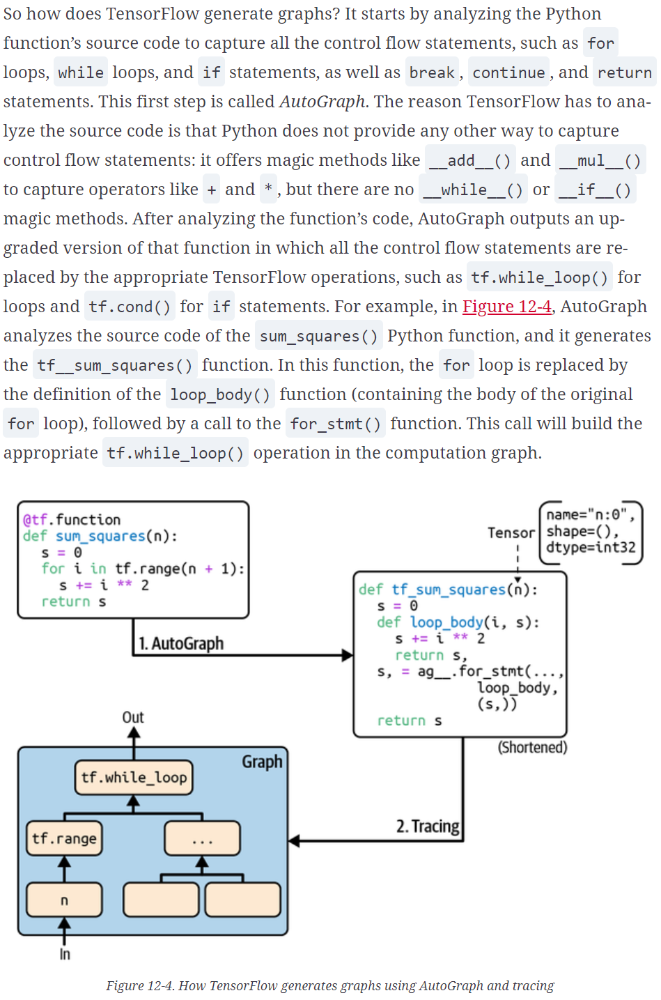
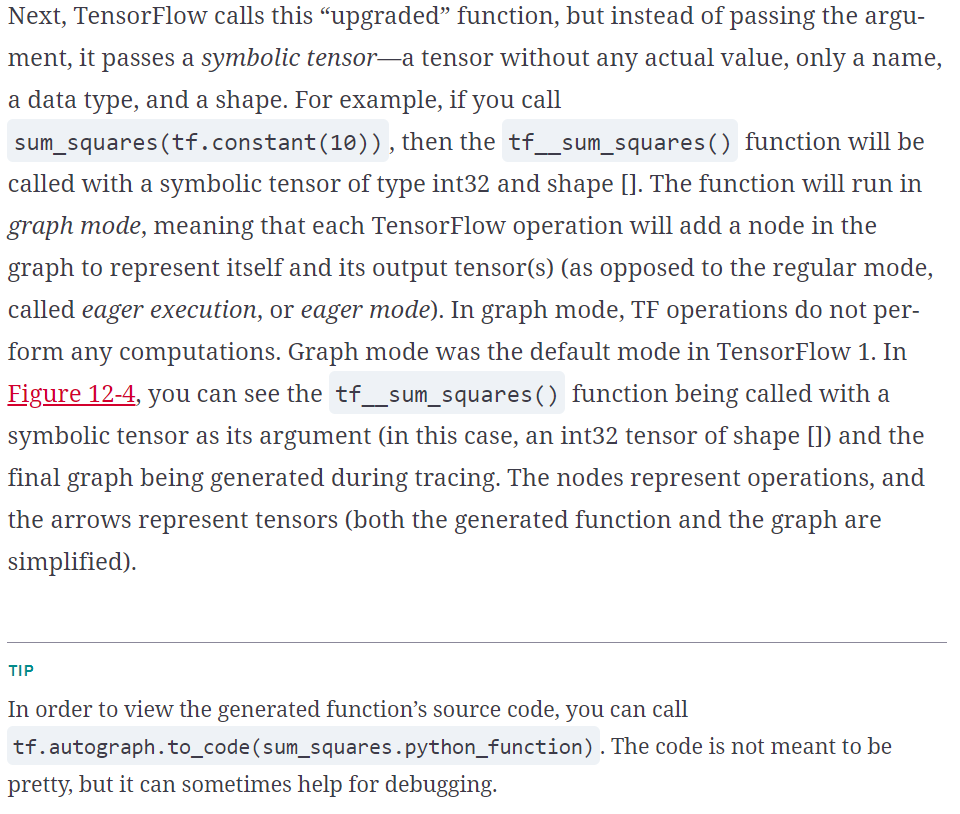

A "static" `for` loop using `range()`:

In [207]:
@tf.function
def add_10(x):
    for i in range(10):
        x += 1
    return x

In [208]:
add_10(tf.constant(5))

<tf.Tensor: shape=(), dtype=int32, numpy=15>

In [209]:
add_10.get_concrete_function(tf.constant(5)).graph.get_operations()

[<tf.Operation 'x' type=Placeholder>,
 <tf.Operation 'add/y' type=Const>,
 <tf.Operation 'add' type=AddV2>,
 <tf.Operation 'add_1/y' type=Const>,
 <tf.Operation 'add_1' type=AddV2>,
 <tf.Operation 'add_2/y' type=Const>,
 <tf.Operation 'add_2' type=AddV2>,
 <tf.Operation 'add_3/y' type=Const>,
 <tf.Operation 'add_3' type=AddV2>,
 <tf.Operation 'add_4/y' type=Const>,
 <tf.Operation 'add_4' type=AddV2>,
 <tf.Operation 'add_5/y' type=Const>,
 <tf.Operation 'add_5' type=AddV2>,
 <tf.Operation 'add_6/y' type=Const>,
 <tf.Operation 'add_6' type=AddV2>,
 <tf.Operation 'add_7/y' type=Const>,
 <tf.Operation 'add_7' type=AddV2>,
 <tf.Operation 'add_8/y' type=Const>,
 <tf.Operation 'add_8' type=AddV2>,
 <tf.Operation 'add_9/y' type=Const>,
 <tf.Operation 'add_9' type=AddV2>,
 <tf.Operation 'Identity' type=Identity>]

A "dynamic" loop using `tf.while_loop()`:

In [210]:
# extra code – shows how to use tf.while_loop (usually @tf.function is simpler)
@tf.function
def add_10(x):
    condition = lambda i, x: tf.less(i, 10)
    body = lambda i, x: (tf.add(i, 1), tf.add(x, 1))
    final_i, final_x = tf.while_loop(condition, body, [tf.constant(0), x])
    return final_x

In [211]:
add_10(tf.constant(5))

<tf.Tensor: shape=(), dtype=int32, numpy=15>

In [212]:
add_10.get_concrete_function(tf.constant(5)).graph.get_operations()

[<tf.Operation 'x' type=Placeholder>,
 <tf.Operation 'Const' type=Const>,
 <tf.Operation 'while/maximum_iterations' type=Const>,
 <tf.Operation 'while/loop_counter' type=Const>,
 <tf.Operation 'while' type=StatelessWhile>,
 <tf.Operation 'Identity' type=Identity>]

A "dynamic" `for` loop using `tf.range()` (captured by autograph):

In [213]:
@tf.function
def add_10(x):
    for i in tf.range(10):
        x = x + 1
    return x

In [214]:
add_10.get_concrete_function(tf.constant(0)).graph.get_operations()

[<tf.Operation 'x' type=Placeholder>,
 <tf.Operation 'range/start' type=Const>,
 <tf.Operation 'range/limit' type=Const>,
 <tf.Operation 'range/delta' type=Const>,
 <tf.Operation 'range' type=Range>,
 <tf.Operation 'sub' type=Sub>,
 <tf.Operation 'floordiv' type=FloorDiv>,
 <tf.Operation 'mod' type=FloorMod>,
 <tf.Operation 'zeros_like' type=Const>,
 <tf.Operation 'NotEqual' type=NotEqual>,
 <tf.Operation 'Cast' type=Cast>,
 <tf.Operation 'add' type=AddV2>,
 <tf.Operation 'zeros_like_1' type=Const>,
 <tf.Operation 'Maximum' type=Maximum>,
 <tf.Operation 'while/maximum_iterations' type=Const>,
 <tf.Operation 'while/loop_counter' type=Const>,
 <tf.Operation 'while' type=StatelessWhile>,
 <tf.Operation 'Identity' type=Identity>]

### Handling Variables and Other Resources in TF Functions

In [215]:
counter = tf.Variable(0)

@tf.function
def increment(counter, c=1):
    return counter.assign_add(c)

increment(counter)  # counter is now equal to 1
increment(counter)  # counter is now equal to 2

<tf.Tensor: shape=(), dtype=int32, numpy=1>

<tf.Tensor: shape=(), dtype=int32, numpy=2>

In [216]:
function_def = increment.get_concrete_function(counter).function_def
function_def.signature.input_arg[0]

name: "counter"
type: DT_RESOURCE

In [217]:
counter = tf.Variable(0)

@tf.function
def increment(c=1):
    return counter.assign_add(c)

In [218]:
increment()
increment()

<tf.Tensor: shape=(), dtype=int32, numpy=1>

<tf.Tensor: shape=(), dtype=int32, numpy=2>

In [219]:
function_def = increment.get_concrete_function().function_def
function_def.signature.input_arg[0]

name: "assignaddvariableop_resource"
type: DT_RESOURCE

In [220]:
class Counter:
    def __init__(self):
        self.counter = tf.Variable(0)

    @tf.function
    def increment(self, c=1):
        return self.counter.assign_add(c)

In [221]:
c = Counter()
c.increment()
c.increment()

<tf.Tensor: shape=(), dtype=int32, numpy=1>

<tf.Tensor: shape=(), dtype=int32, numpy=2>

In [222]:
@tf.function
def add_10(x):
    for i in tf.range(10):
        x += 1
    return x

print(tf.autograph.to_code(add_10.python_function))

def tf__add(x):
    with ag__.FunctionScope('add_10', 'fscope', ag__.ConversionOptions(recursive=True, user_requested=True, optional_features=(), internal_convert_user_code=True)) as fscope:
        do_return = False
        retval_ = ag__.UndefinedReturnValue()

        def get_state():
            return (x,)

        def set_state(vars_):
            nonlocal x
            (x,) = vars_

        def loop_body(itr):
            nonlocal x
            i = itr
            x = ag__.ld(x)
            x += 1
        i = ag__.Undefined('i')
        ag__.for_stmt(ag__.converted_call(ag__.ld(tf).range, (10,), None, fscope), None, loop_body, get_state, set_state, ('x',), {'iterate_names': 'i'})
        try:
            do_return = True
            retval_ = ag__.ld(x)
        except:
            do_return = False
            raise
        return fscope.ret(retval_, do_return)



In [223]:
# extra code – shows how to display the autograph code with syntax highlighting
def display_tf_code(func):
    from IPython.display import display, Markdown
    if hasattr(func, "python_function"):
        func = func.python_function
    code = tf.autograph.to_code(func)
    display(Markdown(f'```python\n{code}\n```'))

In [224]:
display_tf_code(add_10)

```python
def tf__add(x):
    with ag__.FunctionScope('add_10', 'fscope', ag__.ConversionOptions(recursive=True, user_requested=True, optional_features=(), internal_convert_user_code=True)) as fscope:
        do_return = False
        retval_ = ag__.UndefinedReturnValue()

        def get_state():
            return (x,)

        def set_state(vars_):
            nonlocal x
            (x,) = vars_

        def loop_body(itr):
            nonlocal x
            i = itr
            x = ag__.ld(x)
            x += 1
        i = ag__.Undefined('i')
        ag__.for_stmt(ag__.converted_call(ag__.ld(tf).range, (10,), None, fscope), None, loop_body, get_state, set_state, ('x',), {'iterate_names': 'i'})
        try:
            do_return = True
            retval_ = ag__.ld(x)
        except:
            do_return = False
            raise
        return fscope.ret(retval_, do_return)

```

## Using TF Functions with tf.keras (or Not)

Most of the time, converting a Python function that performs TensorFlow operations into a TF function is trivial: decorate it with @tf.function or let Keras take care of it for you. However, there are a few rules to respect:

If you call any external library, including NumPy or even the standard library, this call will run only during tracing; it will not be part of the graph. Indeed, a TensorFlow graph can only include TensorFlow constructs (tensors, operations, variables, datasets, and so on). So, make sure you use tf.reduce_sum() instead of np.sum(), tf.sort() instead of the built-in sorted() function, and so on (unless you really want the code to run only during tracing). This has a few additional implications:

If you define a TF function f(x) that just returns np.random.rand(), a random number will only be generated when the function is traced, so f(tf.constant(2.)) and f(tf.constant(3.)) will return the same random number, but f(tf.constant([2., 3.])) will return a different one. If you replace np.random.rand() with tf.random.uniform([]), then a new random number will be generated upon every call, since the operation will be part of the graph.

If your non-TensorFlow code has side effects (such as logging something or updating a Python counter), then you should not expect those side effects to occur every time you call the TF function, as they will only occur when the function is traced.

You can wrap arbitrary Python code in a tf.py_function() operation, but doing so will hinder performance, as TensorFlow will not be able to do any graph optimization on this code. It will also reduce portability, as the graph will only run on platforms where Python is available (and where the right libraries are installed).

You can call other Python functions or TF functions, but they should follow the same rules, as TensorFlow will capture their operations in the computation graph. Note that these other functions do not need to be decorated with @tf.function.

If the function creates a TensorFlow variable (or any other stateful TensorFlow object, such as a dataset or a queue), it must do so upon the very first call, and only then, or else you will get an exception. It is usually preferable to create variables outside of the TF function (e.g., in the build() method of a custom layer). If you want to assign a new value to the variable, make sure you call its assign() method instead of using the = operator.

The source code of your Python function should be available to TensorFlow. If the source code is unavailable (for example, if you define your function in the Python shell, which does not give access to the source code, or if you deploy only the compiled *.pyc Python files to production), then the graph generation process will fail or have limited functionality.

TensorFlow will only capture for loops that iterate over a tensor or a tf.data.Dataset (see Chapter 13). Therefore, make sure you use for i in tf.range(x) rather than for i in range(x), or else the loop will not be captured in the graph. Instead, it will run during tracing. (This may be what you want if the for loop is meant to build the graph; for example, to create each layer in a neural network.)

As always, for performance reasons, you should prefer a vectorized implementation whenever you can, rather than using loops.

By default, tf.keras will automatically convert your custom code into TF Functions, no need to use
`tf.function()`:

In [225]:
# Custom loss function
def my_mse(y_true, y_pred):
    print("Tracing loss my_mse()")
    return tf.reduce_mean(tf.square(y_pred - y_true))

In [226]:
# Custom metric function
def my_mae(y_true, y_pred):
    print("Tracing metric my_mae()")
    return tf.reduce_mean(tf.abs(y_pred - y_true))

In [227]:
# Custom layer
class MyDense(tf.keras.layers.Layer):
    def __init__(self, units, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        self.kernel = self.add_weight(name='kernel', 
                                      shape=(input_shape[1], self.units),
                                      initializer='uniform',
                                      trainable=True)
        self.biases = self.add_weight(name='bias', 
                                      shape=(self.units,),
                                      initializer='zeros',
                                      trainable=True)
        super().build(input_shape)

    def call(self, X):
        print("Tracing MyDense.call()")
        return self.activation(X @ self.kernel + self.biases)

In [228]:
tf.random.set_seed(42)

In [229]:
# Custom model
class MyModel(tf.keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.hidden1 = MyDense(30, activation="relu")
        self.hidden2 = MyDense(30, activation="relu")
        self.output_ = MyDense(1)

    def call(self, input):
        print("Tracing MyModel.call()")
        hidden1 = self.hidden1(input)
        hidden2 = self.hidden2(hidden1)
        concat = tf.keras.layers.concatenate([input, hidden2])
        output = self.output_(concat)
        return output

model = MyModel()

In [230]:
model.compile(loss=my_mse, optimizer="nadam", metrics=[my_mae])

In [231]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))
model.evaluate(X_test_scaled, y_test)

Epoch 1/2
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
363/363 [==============================] - ETA: 0s - loss: 1.3222 - my_mae: 0.7858Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
363/363 [==============================] - 7s 17ms/step - loss: 1.3222 - my_mae: 0.7858 - val_loss: 0.4369 - val_my_mae: 0.4761
Epoch 2/2
363/363 [==============================] - 6s 17ms/step - loss: 0.4440 - my_mae: 0.4796 - val_loss: 0.9128 - val_my_mae: 0.4740


162/162 [==============================] - 1s 4ms/step - loss: 0.4215 - my_mae: 0.4694


[0.4214569330215454, 0.4693898856639862]

You can turn this off by creating the model with `dynamic=True` (or calling `super().__init__(dynamic=True, **kwargs)` in the model's constructor):

In [232]:
tf.random.set_seed(42)

In [233]:
model = MyModel(dynamic=True)

In [234]:
model.compile(loss=my_mse, optimizer="nadam", metrics=[my_mae])

Now the custom code will be called at each iteration. Let's fit, validate and evaluate with tiny datasets to avoid getting too much output:

In [235]:
model.fit(X_train_scaled[:64], y_train[:64], epochs=1,
          validation_data=(X_valid_scaled[:64], y_valid[:64]), verbose=0)
model.evaluate(X_test_scaled[:64], y_test[:64], verbose=0)

Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()


Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()


[5.593693733215332, 2.0637807846069336]

Alternatively, you can compile a model with `run_eagerly=True`:

In [236]:
tf.random.set_seed(42)

In [237]:
model = MyModel()

In [238]:
model.compile(loss=my_mse, optimizer="nadam", metrics=[my_mae], run_eagerly=True)

In [239]:
model.fit(X_train_scaled[:64], y_train[:64], epochs=1,
          validation_data=(X_valid_scaled[:64], y_valid[:64]), verbose=0)
model.evaluate(X_test_scaled[:64], y_test[:64], verbose=0)

Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()


Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()
Tracing MyModel.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing MyDense.call()
Tracing loss my_mse()
Tracing metric my_mae()


[5.628113746643066, 2.0705206394195557]

## Extra Material – Custom Optimizers

Defining custom optimizers is not very common, but in case you are one of the happy few who gets to write one, here is an example:

In [240]:
class MyMomentumOptimizer(tf.keras.optimizers.Optimizer):
    def __init__(self, learning_rate=0.001, momentum=0.9, name="MyMomentumOptimizer", **kwargs):
        """Call super().__init__() and use _set_hyper() to store hyperparameters"""
        super().__init__(name, **kwargs)
        self._set_hyper("learning_rate", kwargs.get("lr", learning_rate)) # handle lr=learning_rate
        self._set_hyper("decay", self._initial_decay) # 
        self._set_hyper("momentum", momentum)
    
    def _create_slots(self, var_list):
        """For each model variable, create the optimizer variable associated with it.
        TensorFlow calls these optimizer variables "slots".
        For momentum optimization, we need one momentum slot per model variable.
        """
        for var in var_list:
            self.add_slot(var, "momentum")

    @tf.function
    def _resource_apply_dense(self, grad, var):
        """Update the slots and perform one optimization step for one model variable
        """
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype) # handle learning rate decay
        momentum_var = self.get_slot(var, "momentum")
        momentum_hyper = self._get_hyper("momentum", var_dtype)
        momentum_var.assign(momentum_var * momentum_hyper - (1. - momentum_hyper)* grad)
        var.assign_add(momentum_var * lr_t)

    def _resource_apply_sparse(self, grad, var):
        raise NotImplementedError

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "learning_rate": self._serialize_hyperparameter("learning_rate"),
            "decay": self._serialize_hyperparameter("decay"),
            "momentum": self._serialize_hyperparameter("momentum"),
        }

In [241]:
tf.random.set_seed(42)

In [242]:
model = tf.keras.Sequential([tf.keras.layers.Dense(1, input_shape=[8])])
model.compile(loss="mse", optimizer=MyMomentumOptimizer())
model.fit(X_train_scaled, y_train, epochs=5)

Epoch 1/5
363/363 [==============================] - 2s 6ms/step - loss: 3.7799
Epoch 2/5
363/363 [==============================] - 2s 5ms/step - loss: 1.3641
Epoch 3/5
363/363 [==============================] - 2s 5ms/step - loss: 0.7837
Epoch 4/5
363/363 [==============================] - 2s 6ms/step - loss: 0.6336
Epoch 5/5
363/363 [==============================] - 2s 6ms/step - loss: 0.5903


# Exercises

## 1. to 11.

1. TensorFlow is an open-source library for numerical computation, particularly well suited and fine-tuned for large-scale Machine Learning. Its core is similar to NumPy, but it also features GPU support, support for distributed computing, computation graph analysis and optimization capabilities (with a portable graph format that allows you to train a TensorFlow model in one environment and run it in another), an optimization API based on reverse-mode autodiff, and several powerful APIs such as tf.keras, tf.data, tf.image, tf.signal, and more. Other popular Deep Learning libraries include PyTorch, MXNet, Microsoft Cognitive Toolkit, Theano, Caffe2, and Chainer.
2. Although TensorFlow offers most of the functionalities provided by NumPy, it is not a drop-in replacement, for a few reasons. First, the names of the functions are not always the same (for example, `tf.reduce_sum()` versus `np.sum()`). Second, some functions do not behave in exactly the same way (for example, `tf.transpose()` creates a transposed copy of a tensor, while NumPy's `T` attribute creates a transposed view, without actually copying any data). Lastly, NumPy arrays are mutable, while TensorFlow tensors are not (but you can use a `tf.Variable` if you need a mutable object).
3. Both `tf.range(10)` and `tf.constant(np.arange(10))` return a one-dimensional tensor containing the integers 0 to 9. However, the former uses 32-bit integers while the latter uses 64-bit integers. Indeed, TensorFlow defaults to 32 bits, while NumPy defaults to 64 bits.
4. Beyond regular tensors, TensorFlow offers several other data structures, including sparse tensors, tensor arrays, ragged tensors, queues, string tensors, and sets. The last two are actually represented as regular tensors, but TensorFlow provides special functions to manipulate them (in `tf.strings` and `tf.sets`).
5. When you want to define a custom loss function, in general you can just implement it as a regular Python function. However, if your custom loss function must support some hyperparameters (or any other state), then you should subclass the `keras.losses.Loss` class and implement the `__init__()` and `call()` methods. If you want the loss function's hyperparameters to be saved along with the model, then you must also implement the `get_config()` method.
6. Much like custom loss functions, most metrics can be defined as regular Python functions. But if you want your custom metric to support some hyperparameters (or any other state), then you should subclass the `keras.metrics.Metric` class. Moreover, if computing the metric over a whole epoch is not equivalent to computing the mean metric over all batches in that epoch (e.g., as for the precision and recall metrics), then you should subclass the `keras.metrics.Metric` class and implement the `__init__()`, `update_state()`, and `result()` methods to keep track of a running metric during each epoch. You should also implement the `reset_states()` method unless all it needs to do is reset all variables to 0.0. If you want the state to be saved along with the model, then you should implement the `get_config()` method as well.
7. You should distinguish the internal components of your model (i.e., layers or reusable blocks of layers) from the model itself (i.e., the object you will train). The former should subclass the `keras.layers.Layer` class, while the latter should subclass the `keras.models.Model` class.
8. Writing your own custom training loop is fairly advanced, so you should only do it if you really need to. Keras provides several tools to customize training without having to write a custom training loop: callbacks, custom regularizers, custom constraints, custom losses, and so on. You should use these instead of writing a custom training loop whenever possible: writing a custom training loop is more error-prone, and it will be harder to reuse the custom code you write. However, in some cases writing a custom training loop is necessary⁠—for example, if you want to use different optimizers for different parts of your neural network, like in the [Wide & Deep paper](https://homl.info/widedeep). A custom training loop can also be useful when debugging, or when trying to understand exactly how training works.
9. Custom Keras components should be convertible to TF Functions, which means they should stick to TF operations as much as possible and respect all the rules listed in Chapter 12 (in the _TF Function Rules_ section). If you absolutely need to include arbitrary Python code in a custom component, you can either wrap it in a `tf.py_function()` operation (but this will reduce performance and limit your model's portability) or set `dynamic=True` when creating the custom layer or model (or set `run_eagerly=True` when calling the model's `compile()` method).
10. Please refer to Chapter 12 for the list of rules to respect when creating a TF Function (in the _TF Function Rules_ section).
11. Creating a dynamic Keras model can be useful for debugging, as it will not compile any custom component to a TF Function, and you can use any Python debugger to debug your code. It can also be useful if you want to include arbitrary Python code in your model (or in your training code), including calls to external libraries. To make a model dynamic, you must set `dynamic=True` when creating it. Alternatively, you can set `run_eagerly=True` when calling the model's `compile()` method. Making a model dynamic prevents Keras from using any of TensorFlow's graph features, so it will slow down training and inference, and you will not have the possibility to export the computation graph, which will limit your model's portability.

## 12. Implement a custom layer that performs _Layer Normalization_
_We will use this type of layer in Chapter 15 when using Recurrent Neural Networks._

### a.
_Exercise: The `build()` method should define two trainable weights *α* and *β*, both of shape `input_shape[-1:]` and data type `tf.float32`. *α* should be initialized with 1s, and *β* with 0s._

Solution: see below.

### b.
_Exercise: The `call()` method should compute the mean_ μ _and standard deviation_ σ _of each instance's features. For this, you can use `tf.nn.moments(inputs, axes=-1, keepdims=True)`, which returns the mean μ and the variance σ<sup>2</sup> of all instances (compute the square root of the variance to get the standard deviation). Then the function should compute and return *α*⊗(*X* - μ)/(σ + ε) + *β*, where ⊗ represents itemwise multiplication (`*`) and ε is a smoothing term (small constant to avoid division by zero, e.g., 0.001)._

In [243]:
class LayerNormalization(tf.keras.layers.Layer):
    def __init__(self, eps=0.001, **kwargs):
        super().__init__(**kwargs)
        self.eps = eps

    def build(self, batch_input_shape):
        self.alpha = self.add_weight(
            name="alpha", shape=batch_input_shape[-1:],
            initializer="ones")
        self.beta = self.add_weight(
            name="beta", shape=batch_input_shape[-1:],
            initializer="zeros")
        super().build(batch_input_shape) # must be at the end

    def call(self, X):
        mean, variance = tf.nn.moments(X, axes=-1, keepdims=True)
        return self.alpha * (X - mean) / (tf.sqrt(variance + self.eps)) + self.beta

    def compute_output_shape(self, batch_input_shape):
        return batch_input_shape

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "eps": self.eps}

Note that making _ε_ a hyperparameter (`eps`) was not compulsory. Also note that it's preferable to compute `tf.sqrt(variance + self.eps)` rather than `tf.sqrt(variance) + self.eps`. Indeed, the derivative of sqrt(z) is undefined when z=0, so training will bomb whenever the variance vector has at least one component equal to 0. Adding _ε_ within the square root guarantees that this will never happen.

### c.
_Exercise: Ensure that your custom layer produces the same (or very nearly the same) output as the `tf.keras.layers.LayerNormalization` layer._

Let's create one instance of each class, apply them to some data (e.g., the training set), and ensure that the difference is negligeable.

In [244]:
X = X_train.astype(np.float32)

custom_layer_norm = LayerNormalization()
keras_layer_norm = tf.keras.layers.LayerNormalization()

tf.reduce_mean(tf.keras.losses.mean_absolute_error(
    keras_layer_norm(X), custom_layer_norm(X)))

<tf.Tensor: shape=(), dtype=float32, numpy=3.894674e-08>

Yep, that's close enough. To be extra sure, let's make alpha and beta completely random and compare again:

In [245]:
random_alpha = np.random.rand(X.shape[-1])
random_beta = np.random.rand(X.shape[-1])

custom_layer_norm.set_weights([random_alpha, random_beta])
keras_layer_norm.set_weights([random_alpha, random_beta])

tf.reduce_mean(tf.keras.losses.mean_absolute_error(
    keras_layer_norm(X), custom_layer_norm(X)))

<tf.Tensor: shape=(), dtype=float32, numpy=1.7680229e-08>

Still a negligeable difference! Our custom layer works fine.

## 13. Train a model using a custom training loop to tackle the Fashion MNIST dataset
_The Fashion MNIST dataset was introduced in Chapter 10._

### a.
_Exercise: Display the epoch, iteration, mean training loss, and mean accuracy over each epoch (updated at each iteration), as well as the validation loss and accuracy at the end of each epoch._

In [246]:
(X_train_full, y_train_full), (X_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255.
X_valid, X_train = X_train_full[:5000], X_train_full[5000:]
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]
X_test = X_test.astype(np.float32) / 255.

In [247]:
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [248]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[28, 28]),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax"),
])

In [249]:
n_epochs = 5
batch_size = 32
n_steps = len(X_train) // batch_size
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.01)
loss_fn = tf.keras.losses.sparse_categorical_crossentropy
mean_loss = tf.keras.metrics.Mean()
metrics = [tf.keras.metrics.SparseCategoricalAccuracy()]

In [250]:
with trange(1, n_epochs + 1, desc="All epochs") as epochs:
    for epoch in epochs:
        with trange(1, n_steps + 1, desc=f"Epoch {epoch}/{n_epochs}") as steps:
            for step in steps:
                X_batch, y_batch = random_batch(X_train, y_train)
                with tf.GradientTape() as tape:
                    y_pred = model(X_batch)
                    main_loss = tf.reduce_mean(loss_fn(y_batch, y_pred))
                    loss = tf.add_n([main_loss] + model.losses)
                gradients = tape.gradient(loss, model.trainable_variables)
                optimizer.apply_gradients(zip(gradients, model.trainable_variables))
                for variable in model.variables:
                    if variable.constraint is not None:
                        variable.assign(variable.constraint(variable))                    
                status = OrderedDict()
                mean_loss(loss)
                status["loss"] = mean_loss.result().numpy()
                for metric in metrics:
                    metric(y_batch, y_pred)
                    status[metric.name] = metric.result().numpy()
                steps.set_postfix(status)
            y_pred = model(X_valid)
            status["val_loss"] = np.mean(loss_fn(y_valid, y_pred))
            status["val_accuracy"] = np.mean(tf.keras.metrics.sparse_categorical_accuracy(
                tf.constant(y_valid, dtype=np.float32), y_pred))
            steps.set_postfix(status)
        for metric in [mean_loss] + metrics:
            metric.reset_states()


All epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1>

<tf.Tensor: shape=(), dtype=float32, numpy=2.5168583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2>

<tf.Tensor: shape=(), dtype=float32, numpy=3.043621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3>

<tf.Tensor: shape=(), dtype=float32, numpy=3.0123088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.14583333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2516868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.171875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5>

<tf.Tensor: shape=(), dtype=float32, numpy=3.2409027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6>

<tf.Tensor: shape=(), dtype=float32, numpy=3.0398233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.26041666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7>

<tf.Tensor: shape=(), dtype=float32, numpy=2.7995338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.29910713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8>

<tf.Tensor: shape=(), dtype=float32, numpy=2.6650143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=9>

<tf.Tensor: shape=(), dtype=float32, numpy=2.4971404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3402778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=10>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3542862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=11>

<tf.Tensor: shape=(), dtype=float32, numpy=2.250219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=12>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1452377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40364584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=13>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0390315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4278846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=14>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9908383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43973213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=15>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9781647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=16>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9207007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46289062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=17>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8622197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4779412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=18>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8029366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4861111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=19>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7644662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4901316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=20>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7400547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=21>

<tf.Tensor: shape=(), dtype=float32, numpy=1.703212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50744045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=22>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6705352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5113636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=23>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6254888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52717394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=24>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6017116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52994794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=25>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5788672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=26>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5532627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=27>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5284296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5405093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=28>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5000459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=29>

<tf.Tensor: shape=(), dtype=float32, numpy=1.479726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54956895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=30>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4570974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5520833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=31>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4404123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5554435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=32>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4260566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5576172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=33>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4190186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.563447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=34>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3959149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5680147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=35>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3760356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5723214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=36>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3594226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=37>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3460839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=38>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3302567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=39>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3161309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5897436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=40>

<tf.Tensor: shape=(), dtype=float32, numpy=1.301903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=41>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2966846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5907012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=42>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2817644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59300596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=43>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2712554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59302324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=44>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2579297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5958807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=45>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2477334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5986111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=46>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2357529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5998641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=47>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2289208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60106385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=48>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2188724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6048177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=49>

<tf.Tensor: shape=(), dtype=float32, numpy=1.20674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60714287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=50>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1955323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=51>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1816335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6139706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=52>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1745834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6183894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=53>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1711686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6191038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=54>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1637522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6209491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=55>

<tf.Tensor: shape=(), dtype=float32, numpy=1.157554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6210227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=56>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1459459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.625558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=57>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1388859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.627193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=58>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1351634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62769395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=59>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1301559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6276483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=60>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1255739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62916666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=61>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1190053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63063526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=62>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1145529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6315524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=63>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1014193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63640875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=64>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0933237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6386719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=65>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0877655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6408654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=66>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0860177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64204544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=67>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0833087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64179105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=68>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0781894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6438419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=69>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0718489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64492756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=70>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0627117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64776784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=71>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0577797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64832747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=72>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0531489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64800346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=73>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0452104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65068495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=74>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0408466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6528716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=75>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0359324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=76>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0325751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6525493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=77>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0330694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65178573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=78>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0268579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6530449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=79>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0229555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65427214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=80>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0185658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6550781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=81>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0116881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6585648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=82>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0100236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65891767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=83>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0056885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66039157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=84>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0016401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66183037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=85>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9995859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6617647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=86>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9970004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66206396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=87>

<tf.Tensor: shape=(), dtype=float32, numpy=0.99073976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66307473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=88>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9868621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6640625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=89>

<tf.Tensor: shape=(), dtype=float32, numpy=0.98513794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6632725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=90>

<tf.Tensor: shape=(), dtype=float32, numpy=0.98286575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6638889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=91>

<tf.Tensor: shape=(), dtype=float32, numpy=0.97709095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66586536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=92>

<tf.Tensor: shape=(), dtype=float32, numpy=0.97466624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66711956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=93>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9737196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6680108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=94>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9784791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6672208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=95>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9767895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=96>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9713041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66764325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=97>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9702636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6672036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=98>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9680504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66804844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=99>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9632984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66950756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95991206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6709375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.95763844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9549589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67156863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.949729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6732403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9455738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.94146603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67589283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93728715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6771816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9385857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67727804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9376226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93495667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6768922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9322861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6775568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.93246895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6776464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92900413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9292486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6783739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9255696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6792763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.92512345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67961955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9209074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9175338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9127512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6845869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9081577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68618697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9089602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68619794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90641904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68724173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90162164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6885246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8993556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6892785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89749306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6895161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8940796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6904762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89343476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6902067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8934469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6906738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8895185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6916182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88727856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6920673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69298667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88386226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69341856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8837285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69384396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.88231474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69402987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8800946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6946759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87795836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6950827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8735194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.696396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8707125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69746375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87080455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6964928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6979911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86480147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6988032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86147064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70004404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8582872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.701486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8573682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70182294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8550863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7021552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8545242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7026969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85280144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7032313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84963506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7037584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84682196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7049077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84295464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8410512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70653975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8408407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7068257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8376146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7081291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83421206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70921266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8305862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71028227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8278267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71113783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8255971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7121815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.823742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71261865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8243175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7118711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.82379466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7121094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8224692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7127329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8195304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71373457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8173245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7143405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8173017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71417683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81500566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7149621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81531674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7151732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81520265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7150075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8161702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71484375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81388855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71597636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7159926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.716557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81118995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71693313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81071395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7171243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7176724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80866235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71732146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7175071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7180438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80538845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80474734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7189246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8037401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7192708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80133384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7203039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79836166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72115386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79697365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.721653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72231656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7951899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72280407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7950261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72278225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7951789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7224265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79280925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72323805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7938134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72271824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7928983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7231908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7931356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72333115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7926173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72281903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7912894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7237694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78957516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7243879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7883616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78710943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72560585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.726047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7253788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7255025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7839881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72546875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78324413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7255908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78242433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72571164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78209597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7258313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7267157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77855706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72713417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78120047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72603154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78052485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7259964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72626203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77948266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7262261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77892536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7267857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72748816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7280366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72784626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7273657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72747093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77688575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7274306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7268145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72649086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7273117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77766037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7278409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7770647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7277998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7767884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7278998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72813904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77620786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7285156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72888887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77734435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7289823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77703387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7292126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7290296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77590364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7293941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7293478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7748708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72943723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77349985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7297953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77173537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73041844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77280635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72996795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7719097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73031914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7705548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73066735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77009726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7308808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7683704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.767841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7671424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7313802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76593566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7317168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7644623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.732438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7633386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73276746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7625704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73322237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7614835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73392856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76047206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.734248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75991535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73431176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75829583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.734627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7571817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73493975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75650185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7553703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7355578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7550809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7357391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75457245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73567194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.753949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7358514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7530061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73590684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.751657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73620605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.751473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7362597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7510803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7364341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7496908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7369691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7499057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73701924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.750046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7369492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7491169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7371183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7479878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7377614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7469176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7379261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7463054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73773587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74678123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7374295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7471321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73700845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74659157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7371735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7456624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7375697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74661756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74571824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73777676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7450334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73793656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74435693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7380952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74386334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73848087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.743659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74314886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73867756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7422767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7388312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7421803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7388714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7411192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7393593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7405079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7395089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.740394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73932385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73872876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7399158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73748696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74050355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7368428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.740537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73630404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7405702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73603123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7404939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7356815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74074477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7350024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7409939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7345078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7410251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7335266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.741056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73322266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7410868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73285824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74090326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7323551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74104095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73217714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.741284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7325497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74088985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73186547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7411318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7303353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74147725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.73041224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74161077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7292717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7418478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72943306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7415625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72981304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7414867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72958094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.741308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72902775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74133664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72825265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7416735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7271803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7420082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72661805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7422386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72573006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7425692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72511506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7426948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7247105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74302185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72374004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7434476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72331136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74346864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.72392684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7432893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7230999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74371004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7220996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7440287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7208002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7445437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7192673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7449565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71799845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7454653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71815675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7453813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71673363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7457876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.716292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7458008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71521896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7461059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71532255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.746118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71511346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7463235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71427906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7467207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7138901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74682695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71287787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7474118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71188897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74780196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.71143097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74790394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7108537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7481953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7101434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7482954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.709768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74858385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70892644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7488705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70849174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7489677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7078414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7490644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7073156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7490672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7069604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7490699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7058176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7494436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70523417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7495377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70523494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7494469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70525205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74963236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7058355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7491752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7051303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7493604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7046485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7496356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7040136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.74990916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7030107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7500906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7029097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7500903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70230985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75036025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7018871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7503592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70172507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75026864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70063627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7505357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7000254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7506232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7002448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75071025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7000973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75088525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.70010525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7504414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7000892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7503521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6988333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7508778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6975118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75131303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6977331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75130934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6974994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7514798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6971877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7513889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6962921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7515582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69580084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7518128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69601434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7516357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69538784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75171703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6948522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.751798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6946891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75187844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69424254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.751703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6939898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75161344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69304466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7520325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69215137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7523649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69144195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75252694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6917019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75252014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69121325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75276476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6905707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7527574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69040704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75266665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68966466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7528258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6884135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7533156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6878138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7535549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68865675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75362796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6884699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7537007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68780845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.754019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6871868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75417215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68647593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7545692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6858229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7548828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68499523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7551948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75510037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68489313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75516796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68466485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7551546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68411034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7552217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6848702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7549679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68456775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.755195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7552615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6833486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7553276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7553141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68361646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75522155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68347347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7551294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75543135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68199265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75573176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68196607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75548244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68161184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7554687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75561094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.755597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6809113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7555831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75564665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67968655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7560957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6795179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7562346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67897105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75644964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6785496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.756587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67805296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7568765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67755723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75716466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6770008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75729924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67595065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7577366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67508274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75794494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6752907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7577748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6745921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7579066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6738303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7581881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67280084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7584682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75867224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67110837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7589499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6701998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7593006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6698948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75950116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6689151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75984895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6687118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7599734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6691053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75980246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66921926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75985295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6691928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7599032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66881275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75995314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6689657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7600759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6689796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76005244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66888684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7600291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66864026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7601508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6680859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.760489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6678981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7604648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66844565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76051265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66774815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76070404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.668486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7603928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66794884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7605835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66782206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7607734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6671551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7609624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6676203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76065344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66734606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7607001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66789675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7605345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66717607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.760934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7611205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66665643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76130617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6663615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76142097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.665815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76167506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66581047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7617885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66508174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76211023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6642008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6644791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.762403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66501415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.762099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66436195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76221025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6633878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76259637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6629855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7626374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6628381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7626782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6625325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7627872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66240275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76289576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6620766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7630719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66185606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76317936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66214955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7632185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6614562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76339287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6612523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7632964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6616857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76326776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6612738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76330644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.763412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6601907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7637179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6596244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7640224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65885293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7643257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.658201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7645612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6575951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.764862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7649629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6571387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7648652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65693885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7649657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7650658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6564277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7652311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6556893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7653957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.654818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7657558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6551412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7655271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6543445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7658203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65371627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76591736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.766014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65282696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76611024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65240765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76633525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76649487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6516897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7665252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6516192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76668376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65122217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7667136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65102726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76687115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.650671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76690054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65056825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7669934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6499807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7672129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64963335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76736814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64884436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7676493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64855045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7676768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64785475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76801914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64760584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76817155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7683233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6476505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76847446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6473263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7685625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7688997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7689243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6462771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7689488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64607745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7690352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64579004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7691213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64526457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76933056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6449933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76935405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6442424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7696235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64432335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7694008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6436004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76960784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64308065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7698141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64274627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77001953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64253247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7700414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64199674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7702456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6418329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77038836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64119714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7705911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64113176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7707326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64090854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77087355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.640036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77125484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6403452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77115387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6403916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7712332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6396057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.771432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6390116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77157027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6394448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7715291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63905966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77166665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63896465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7716849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6386093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77170306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6383673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7717803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6378301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7720345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6373538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7722288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6365906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77248114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6361236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77255636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6363125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77245545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63624257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77253044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6359531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6353795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63506407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6350813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77300185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63532174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6351039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6354511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77293205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63584304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6355755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77313536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6352106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6348005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77316517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63447136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7732944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6344205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77348036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6341193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77360857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6339896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63364446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77363634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.633681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7737069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6334498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63322407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77373415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.632884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6328912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77387387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6330552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77394336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6327672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77406865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6323074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77413756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6318188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.774318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63180566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77438617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6316002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.774287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63120234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7744662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63122183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77442276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6306582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77460104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6303134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7747788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6298759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7749006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6296537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77502203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62939715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77519804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62902814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62867796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62832904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77555823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62807316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62751323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77579623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6276444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6276781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62689495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77631295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6266954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77642983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62626463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6268203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77666235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62775993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6274702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77667814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62705773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77684706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62667894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77696186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62642324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6261079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6260087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77730376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6257965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62541896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77742344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62516266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62483084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77770126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77776015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6243647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77776605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62378615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6237463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62328535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6228676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77831376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6226634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77837104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6223629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7784281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62197113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6216539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6212651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77870214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62106043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7788102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.621111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77881426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6207794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7787666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62035286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6216804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77862006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62233716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62236845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77842313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62235993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77853036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62226963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6218567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6214637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77890116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62109077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77900696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62060094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77926505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6205123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77916664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6202961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77932227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6199233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6193231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61884147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6182651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78019154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6178831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6181748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61783415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7804474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6176285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78039867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61744314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61691016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.780651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6164279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6163472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78070265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61587733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78085256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6160975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7807044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6159533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6154819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78105223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61497027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78120065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6145026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6143874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78139764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61405236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7815448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61387146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7815934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61362547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78164184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6132114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78173906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6128489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61252475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78193253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6123329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78193146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.611926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.611439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6109198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.610996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78226584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61060935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6106186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6104274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7826442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60935557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6090893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78283167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6086637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6083602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6081604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78301525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6078269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60805756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60730314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6077118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60820556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78304654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6075063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6071626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6068362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60737824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6069487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60673845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6065834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60655314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78334886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60625553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.605852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78366816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6059631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6060845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6055749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6054243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6061986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60591096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78355455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6056491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78364325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60574657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7837776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6051079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7840033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60446364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7842284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60451734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7841325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6046479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7840826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60445285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78416973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6044353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6043239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78425217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60451674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78411156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60431117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78415275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6040521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7842391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6035694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60350776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78441113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6033457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78440654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6033127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60300076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60279274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78452766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60307395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7843436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60280806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60236186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6021143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78459823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6015855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7848163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6017472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78476673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6018975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78471726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6019282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7847567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60148907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7848404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60086346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78505665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60065174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78509545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.600254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78531075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6000348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5997193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5995513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78551334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59902227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59860003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5985749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59864944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78575176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59825397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78583276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5982983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78586996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59813285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78590703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5981875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78590053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59839433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7858507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7859743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59767777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5973868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5969816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7864296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59687173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7865517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59651846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7867596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5962088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78683805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59599555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78683037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7866941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5969528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78664386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5969373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7866792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5969689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7867572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5966869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7868349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78678477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5963077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78690475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59646523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78693956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59616035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7869742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59622556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78696644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5960971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.787001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59613675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7870777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59608066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78706986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59566253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78723043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59551626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7872224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5951753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7872984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5948477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7874161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5945643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7874916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5945552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78744143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59445906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7875167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59429306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78750837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59406036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7875417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7873252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5946262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78731716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59429634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7874751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59399456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78759116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5938263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78778976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59337157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7879464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.593258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7879789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5929385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78821737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59246427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78841406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.592335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78852797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59181577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7887237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59174615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7886729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5917733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78870416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7888989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59147656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7888072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5911157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7889605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59069437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7891134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59079903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7891846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5907975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7892149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59104747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78908277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7891537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5906316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78922445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7893758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5900145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7894864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58992296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78951615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58968544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7896263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58961976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78965575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58920044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7898056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58889216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7899551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5888664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78986377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58880687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78981274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58882487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7896819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78975093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58833164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7899394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58852243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78996813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58824974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7899968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7900651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58822405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78993493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58800596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78992397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7899921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7901391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58700407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7903251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79023486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58699167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79026294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7902909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79035807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7903074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7903744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7904803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58615834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7904297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58593714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7903792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79036784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5857987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7904343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7905395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58542246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79056674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5852005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7906327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7905824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7906869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58517164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7906366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58479124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7907793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58455265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7908061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5843129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7908328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5840066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79093635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58389086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7909628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58356714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79106593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5831797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7912454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58293104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79130965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.582644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7914502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58254886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7914759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5826133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7914253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5824523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7915271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5824642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7915526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5823686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79146415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.582665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79130006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5823782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7915152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5821798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79154056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5819663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7915659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58172745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79156625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58156174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58123213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7918044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58098507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7917542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7918915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58034724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7919162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5800224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7919782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5798815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79204005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5796201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79210174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5796075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7920888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5797807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79211307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57961595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7921373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57973075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7921244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5797846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7921115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57985455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7920616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57970315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79215974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57952726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7922208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57941616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7922447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57929635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7922686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7924028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5790543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7923897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57875675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7924501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57864296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7924736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79257035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79259366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57882243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7923977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5787327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79242116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.578522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79248106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57823783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7926136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5781913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7926004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57797325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79269624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57770306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7928644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57761174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7928509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57729006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7930185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5770529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7930411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57661736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79324424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79330254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.576046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79346883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57587284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79352677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57570505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79354864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5757168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79353446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57543755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7935563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7936497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57480735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7938144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5745391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79390734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5745996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57475644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7939498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7939353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57517636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79395646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5748062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7940486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5745457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79414064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5746709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7940196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.574438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7941114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5741392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.794203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5740423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7942237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.573833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79424435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5742127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7941239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5739086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.794215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5738349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79423565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5736289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7942913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5733411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79438204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57316023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7944725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5733338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7944927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5736988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79430294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57363105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79432327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5734848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7944483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5736027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7944336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57343936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79445374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5731477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79457825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5731385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79459816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57304335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7945833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5729349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79453385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5727855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7946577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57259876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79471207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5723648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79473174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57214415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7947859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5719272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79490894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5719686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7949283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5721313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79487884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57204133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7948639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57201225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79488325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57161224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7950398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5714402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79505897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5714456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7950438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57120085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7950629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57077426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79518443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57103777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7951351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57074755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7951881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57050896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79527503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57024866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7953618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.570069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79544836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5700659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7955008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5704378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5700394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7954361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5699621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7953869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57002485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79533786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5704503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7952551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57022274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7952737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57004255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7953597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.569765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7954117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56983393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7954301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5694979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79554915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56930304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5692291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79565245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56900364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79570395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56882256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5689108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5687011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5687483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56878406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5689448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5690247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5687563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5686127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5685781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79571635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56844544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79583335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56818277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79595006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56785876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5676407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79608387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5672027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79629874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56691104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56663257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5667877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5666859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5665286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5665068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79656416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56607753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79671156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56577337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5655917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.565301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56525695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79700524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5654296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79692376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56552994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79700494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5654699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56551576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79693985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56537455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56535476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5650568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79702044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79710096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5649192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56475616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5645513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5644536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5644066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5642719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5641172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5643151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56413543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5639976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5640485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56396526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79751277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5639543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5636807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56360644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56373006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56362945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56348664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79773074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5633778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79771405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5632326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56332785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79761755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56322277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56345594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79761606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5632783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56316394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56286615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5626823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79795855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5626362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79794174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5627552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79795635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5624925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56268126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56246936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5623515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5623941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56261325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56249946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5624021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79791665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5622781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79793113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5620019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5618579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5615886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5613672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79814357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5612087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79821956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5617007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.561603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79818606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5612505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79835427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5610821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5611327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5609241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5606892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79856336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5605064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5606685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79849875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5607532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79842067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.560717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.560332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56038934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56008416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5600018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79879385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5597244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79886806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55952555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79900295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5596292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79898566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5594385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79905945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5593424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55929345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5591008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79918927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5591113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79920214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5590312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55885565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79925793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55880415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79930085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5584935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.558277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5579286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5578536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5578264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79940677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5577945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5574723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55710363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79968333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55724466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79957616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5576017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55767787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79951143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55759287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5574572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55729693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55744463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79964983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5573663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55728114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5570633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5570402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5569659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79979914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55684054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5565863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79991156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5563373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79995286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5563073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55642873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55618966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55602723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5559234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55561054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80019915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5553499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.555154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5551491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55493444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55476886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80037314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55472416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80038446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5545401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55440223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5541536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80065054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55407655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55387384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80067253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5539789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5536724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55314827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80088955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55329335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80081373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.552893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80096865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5526955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5525071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80110496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.552395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5524647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80118334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55247897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5526174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55272335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5527123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5527094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55243796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5522749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80114156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5522171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80123746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55231637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5521543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80125797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5520764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5520751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5520349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80117506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5518791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80124205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55176365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80125225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55191153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80131906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5518558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55161256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5514141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80140585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5512786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5511564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55096376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55110854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80141765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5510508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55114603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55118895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5510482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55088586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.550838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55082464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80146897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.550806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.550759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8015263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55054295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80142474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.550362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5501304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55009246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80145425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5499272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5496501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80158466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5498171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80156666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5497094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8015763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54948276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8016689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5492769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5493533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80177075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54927033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5490785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8018172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54892796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8018816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5487541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54867804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80198264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5486843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80196446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5484748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54821277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54812723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80204684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54813683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.802056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54825497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80203784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54791546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54756045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80233765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54737175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.547305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54748034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8023641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54713273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80253464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54670674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8026515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54660654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54637575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.802758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80287427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8028556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8028101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8028184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54617035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54602146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80305797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54547346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8031464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80318123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54518116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8032962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54491836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.803411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8034722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8035333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8035143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54478157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80360186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80371594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54409444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8038637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8038976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54395074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8039315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54377913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8039652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54374087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80394596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54360175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80400616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54360944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8040133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.803862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80397487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8040348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54322934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80406827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54302996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54273146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80420166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80423486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80432045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54210794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54202753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54206055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80443966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54175484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5417603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80445313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5417581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80451185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54140025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.804655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5413887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.541152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80474585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5409197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5406076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8049399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5404148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8050238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54025716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80508167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54004544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8051911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5397873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80530035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80528647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53988767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8052409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53977466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80527264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5399664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80525285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53991044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8052845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53974336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53971463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80533373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53975374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80531406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5397499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80529433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53966004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8052747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80530614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53951746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5394581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80529827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80532956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53919005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80541736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5391194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53879184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80560625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53870183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80561185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53891885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8055921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80567354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53858054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53856593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80568457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5384928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80574054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5386546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80574596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5388157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53882074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80568135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53862894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80573714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53859776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80571747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5384407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53851676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.538407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80573374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5383619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8056891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53833264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80566955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53819484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53813285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5379372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8058107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53795415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53796244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53784776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80582666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53792924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5376231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8059616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53738666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80604136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53756094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80602163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5376952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53763986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53736514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80616087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5376514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80614114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53748524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80614614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8061759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5370028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53630245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53611183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53604996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80669117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80667126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80665135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53597754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53566223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80662537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53544366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80670756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53533834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80669224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53526133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53531474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80649227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53515637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53496337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80667984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53482395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80666023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53485715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80666476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80674154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53449154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53466207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80682695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53450376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80695564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53419685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53388613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80708814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53373545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53313804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80735123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8073314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5326486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80733925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53283095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80744976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5326231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80747724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53250563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5323466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80757946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5323645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53240484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5322282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5322697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53208315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80773944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53182733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80791134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5316669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53149277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80803573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53132606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80808604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80820984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80833334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53056294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80835986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5306068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53043294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80838937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53026396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53008354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52991444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53013587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80850077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80852693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52990055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80853283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5297184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5295297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.529487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5292297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5292537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5290558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52899474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5289101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80899704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52898705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80899966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.529246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80882084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5290102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5289216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5285812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80904305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80899984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5284174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80907094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5281198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52793974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80923814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52776164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5272945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80929315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52738774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5271235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5271054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52701813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80950654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52697825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52683264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80953354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52670205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52663743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80947435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52641714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52650994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80950344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52648187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52649367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52595043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80976504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5257798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5255309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5254624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80988276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5254276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52530235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52526855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52524716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5252641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5252469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.525298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5252315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80998665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5252889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80992174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5250576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52488285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52478904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52465594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52451926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81015235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52440494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52448994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81008935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52450967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81004685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52443755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81011486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52434236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5241329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81018436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52400905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5239949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5238952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81021124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52391875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5238313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81025845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5236891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5236846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81028354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5237539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52358854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52348405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52350605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5232282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5236637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5237827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5236576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81042683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5234747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5234757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5234577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5235327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52342856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52323335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81058764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52317303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5230572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5229941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81070006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5228992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81072295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5228952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52288306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81079036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52280885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5228379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52273726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81081545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5227252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5228072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81079626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52293646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5227955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5226616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52271795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81086546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52251834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81095254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5224927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52232546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52235883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81097716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5223368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81097823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52213746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81106496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5220016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5218786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81113106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5220676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5221857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81113297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5219642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52177054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81130546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5216935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5217921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52168775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52159506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81130874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.521469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52142394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81141657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5213361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52126044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5212445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81148237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5212092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5211735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52098536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52083415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81161195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52080727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81159145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52094287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81152874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5210146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5210749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81146675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5209845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81146747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52104694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52085835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52072567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81155366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5205257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52039367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52032703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5203294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5205376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5204831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52062315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5205548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52058125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5205122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5204621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52037686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52037376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5204721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81158334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5205964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81158394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52061963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52044296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5203539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5202685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81164867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5201938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81164926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5202431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52031803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52027386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5203681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5202641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81154865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5202328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52010506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52006197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52010715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5199518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5200664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5201025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5199042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5199917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.519947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.519896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51989585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5197377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5196859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5196902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5195811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5196521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5194243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51938075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51925004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5191122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81184727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5190833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5189935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5189188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81188923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5188146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.518831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5186856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51865077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81199235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51872677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5186461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51872736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81193256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5188679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5190212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81187254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51890427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5187767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5188034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5188923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81189436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51875716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51859236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51852036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81197613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.518356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5182021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51806414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81211793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51802707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.518194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5181062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81211865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51803523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5179055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5178787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81221956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5177472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51765525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5175276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5174047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5173963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81240016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51725376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81246006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51721984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.517287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5173212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5173219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81242037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5171967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51708823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51703674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81253976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51702064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81251985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5170272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51692355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81253964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51691705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51683575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51676226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81261873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5166791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51659966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81263834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5165211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5165226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81265795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5164691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81267756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5163101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5165032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51635593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5163431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5161877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5163225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81277514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51616746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.516228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81275517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5161575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81271577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5161312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81273526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51619834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81271553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51616675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5160919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5160564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81277376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51581514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5156849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5155067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81294894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51576096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51567954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81292886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51544416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5154698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5154304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51536936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51533246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81298584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5155807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5155866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81298524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5156097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81302375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51561844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51555383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5154787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51543874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51557714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5155083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5156242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81311804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5154586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51531625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51526254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5150698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81332844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51501554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5150146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81336594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5150376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5151105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81336486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51509637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51499844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5148671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81343997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5148601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51474524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51472694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51457983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5147729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51465005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51463217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5144114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81370264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51428473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5142784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51413566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5139936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51383644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81385124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5138782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5137873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51379156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51371497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5136831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81392306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51362103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81392217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5135315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81395924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5135589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51348805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5132671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81407005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5132076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51330876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51326424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81402946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5131769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51306146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81410307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51292443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51276237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81423193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51273626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81426746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81428516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51268345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81424445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5127081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81426215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51272994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51265645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51249063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81433386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5124536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81429535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5125871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51250196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51238006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51234686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5123839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81432724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5123883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5122111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81436235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51220566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5121806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81437874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5122086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.512226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81435794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51222855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5121533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5120639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5121486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51197875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81440794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51205415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51214844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5121616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81438607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51214933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5120478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5120832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8143643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5119858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81441855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51190203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5118475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51187694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5117452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8145244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5115761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8145784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51139194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51133966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51135296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51141065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81464696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5114671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5114039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5112969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81473476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5114005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81466025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5115147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81465894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5114731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8146394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5113534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8147113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51127434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8147282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51128095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81470865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51119226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81472564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5110714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8147608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5110594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81474125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5108813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81477636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51098454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81472045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5109748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81475556>

Epoch 2/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34101996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3233059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4313195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5586378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53539866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5156043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8541667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4870062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47034028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4348453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41534957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.871875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40391758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87215906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4257762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42677224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42084175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42074913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86041665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41377065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40517554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3972518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3992177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4047389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40862307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39734575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39780036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38926938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3823611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38151857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.869213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3860924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8685345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37714517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8697917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37864634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8689516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38760567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40663388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86174244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4149782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41392368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86339283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41983363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4164425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40985432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41489893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4137783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40902618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40391508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4065899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40779647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4088002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41080114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8600544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41352117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85771275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41104594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85872394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41406643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85714287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41388106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.858125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4142289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8584559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41339713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41335225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8579009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41032645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8587963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40911356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8585227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41052157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8577009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4121725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85745615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4097497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85775864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40811378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8580508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41217032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85572916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4112288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85553277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41095474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85534275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4108323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85515875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41076264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8540039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40667665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8557692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40300953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85700756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40339783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85587686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40161633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8561581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40285584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8555254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4027904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85580355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41154635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85387325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41107452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8532986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41024557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.854024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40871477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8543074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40913746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41045114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8540296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40948007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8547078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40690035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8557692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4075245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8556171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40753752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8550781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8553241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40785947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.855564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40775466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8557982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40937927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8556548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40738127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8566176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40558335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8568314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4031048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40378225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8572443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4057845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8563905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4065734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8559028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40533605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85611266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40501025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85631794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40633303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85584676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40593907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85638297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40643665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40539312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8567708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40482014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85695875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4022176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85841835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39989257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85921717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39863956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8596875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39976645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8598391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39860344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8602941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40302274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85861653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40372244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85847354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40414363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85833335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40290722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8584906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40144745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85922897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40126628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8596644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39974895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86009175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40159333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8596591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40195417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8600788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40189934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4038294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85868365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40287057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8591009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40250817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8586956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40358934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8585668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4046467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40761092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.857786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40663493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85793066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40575284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85807294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40509266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85795456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40439633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8578381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40461695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8574695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4058676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8573589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40427256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40340978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40372932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8582677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40410092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85791016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40315866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85804266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.403703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4034936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85782444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40258804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.858428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40323088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8583177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4057589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8579757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40587732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8578704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40583915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8575368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40574327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8576642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40722007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8566576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40753016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85656476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4074319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8564732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4097971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85593975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4092244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85585386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40765604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8566434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40771145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8565538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40899715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85603446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40817654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85637844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40778884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8567177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40638828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8574747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40794125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8569631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40925643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40908855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8561672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40885538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85608554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4088813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8564134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40862867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8569399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4075301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8572581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40846932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85657054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.409418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8560908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41039118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85601264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41159797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8553459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4122405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85488284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41223636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85461956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4112804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85513115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41026765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85525304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40979645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8553735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40907815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85530305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40944943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85523343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40864626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85572606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40814146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8558408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40810844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8559542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40675443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8564338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40616742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8569079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40664357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8570131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40645075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85711706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4054262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8573994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4046955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8576786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40501165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8574219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4041553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8576977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40460128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8570927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4053603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.856669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40592477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4069497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8563536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85611266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40883535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8558743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41040698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85529894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85591215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41050187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85534275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4127686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85494655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4130018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85422206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41288462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85433203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41307318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85394734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41304037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8537304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41391882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8538411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41395485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.853465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41341305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.853576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41419846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85336536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41527808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8533163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41564596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8531091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4158567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85306185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41566694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85285807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41703224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85234374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41678563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85261196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4176834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8525681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41739294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85252464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4172127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41693965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8532012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85345876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4156378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85371375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4156485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8536659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41529703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8534689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41465712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85342264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41473162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8533768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41629282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.853184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41606075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8532864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41472846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85397196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41361108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85465115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4127967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8550347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41289172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8548387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41189858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8552179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41232404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85516554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4118584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85525566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41076022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85548645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41078097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8555743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40984142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85608184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41085672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8558873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4123708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8551389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41236258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85495025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41329798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8546255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41264448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85485196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41346356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.854667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41338897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85461956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4129855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85457253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41345057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85439116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41406947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8543455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4133974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8545673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41255063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85478723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41169116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8550053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4117096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.854826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41120192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85504204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4120436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8549948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41207314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8550781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41358146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85490143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41326377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85472625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41273248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85455245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41312698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85463625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41336352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85433674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41343108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8542937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41354182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.854251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41370383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85433465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41306448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85454315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41362655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.854375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41357738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85458165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.413408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8547867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41459268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8541255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4139911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8542077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41437778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8539216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4145525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85375977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41474056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85372084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41673592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4169913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41740793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8527644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41837823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85225093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4189834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41936404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41838124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85212266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41778004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8522087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4185851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85179573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41864413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85164964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4180173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41890922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85205257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4186561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85202205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41834188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8522207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41785443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8523038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41825104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8521591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41903484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41903988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41995707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8522932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85237455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41892034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85256696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4186717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8525356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41834402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85261524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4184187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8524735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41913426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8524428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41900218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8524123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4186522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41945633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85213417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85199654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4191995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41936088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41913903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85180414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41886795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4185529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8521758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41757873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41729158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85275424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4164114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41695195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8531145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85329276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41594082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85336536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8534375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41584933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85361296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41553825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85378724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41637933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8535479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41607913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.853824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41657192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8535861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85365605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41674215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8532166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41598928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85349023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4164117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85345876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41784102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41734254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4169403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8530649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4168524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8528355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41747576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8526075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41774955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85238093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41742802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8525514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41862908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8523265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41943806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41998497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85195315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85212225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85180515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41943827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42059222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85144234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42064372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4208464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85120416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42088544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4208626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85134876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42122048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85085225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4214933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4219517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42247224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42208838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85020584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42179725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85027987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42153984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42203456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42341244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84929734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42413124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84882003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42447048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84879035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4231415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4235907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42310742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84892803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4242272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4240128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8483562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42460084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42405793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84841955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4265838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8476003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4268945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42716867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8474893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42794907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84738994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4276031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84746814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42757964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84745765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42788956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8473592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42832637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8469979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42898995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8469888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4286706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84706706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4286283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84723186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4288065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8471354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4285078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8472126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42927533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84694403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4296334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.846677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42940405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84666896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4293464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.846661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42955548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84656763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4292633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84673023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42959127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8464674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4309936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84620595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4306174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8462838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4300881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84652966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43028247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8463542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43024704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8462634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4306784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8464238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.430367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8466667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42946175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84707445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42955178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8470656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42921263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8472222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42896083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84737796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42960623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8473684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42898038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.847605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42920765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8475131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42891958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84766644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4286089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84765625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42930192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84748375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42954302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84731215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43014783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8472222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42966262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8473744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42928568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8475257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42917442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84759617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42911282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84766626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42926624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84765625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.429236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8475668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42870638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8476364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42878193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8474684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42858803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8475379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4290952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8474496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4288549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84759736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42894608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84735274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42895058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84734374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42847982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84764653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42828628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8476368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42792195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84762716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42745623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8477723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4274147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84783953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42707503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84782946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42679894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8478962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.426907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.847886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42736426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8478759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42708427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8480945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4270641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8480839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42682612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8480734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.427397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84806293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42741388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8479016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42789155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84774095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4280089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84765625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4277099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8477218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4271713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8478618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42695957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8479266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4282858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84761906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42813164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8476841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42769074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84789693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42757985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84803486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4274051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84795105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42702094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84808826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42659384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84822476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4264553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84828746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42589483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42634284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4264102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84861916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4263106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4270057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84852433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.427429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84829676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4275507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42775095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84827584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42786026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84826547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42828998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84818363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42819878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84824485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42773798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84844816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4281611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42854387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84828514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42843217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42824548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42786536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42752352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42728373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84851456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42753273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42773032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4274817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84855235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42807963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84847224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42767286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42784137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42742068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4278888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8483618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42799768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84835166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4278065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84841007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42740458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4269784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4269385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42703128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42668998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84863067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4264361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42596352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42574567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42546496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84899193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42487344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84924895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42426383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84937096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4243101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84942573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42463437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84941363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4243325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42400822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42452753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84944385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42422807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4241831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84948575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42377192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84967107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4236765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42354965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42308125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84983003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4232913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84968686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42362288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84947914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42323002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42325845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42308748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84957296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42304042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42268315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84967786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42269665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42247286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42232028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42216948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42222667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42277762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42267093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42266217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42267308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4224108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84968436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42215827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.421917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42177585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84996235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42119932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42145616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4214736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42119277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42068255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85045975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4210976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85026044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42075598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42067003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85041994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42094404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85016024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42109036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42102778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4211097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84993875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4207645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85011005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42050588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85009766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42027634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41982487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85037696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4192416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41972268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85051984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41978514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8505068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42030138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42037064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85042065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42022946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8505278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42018473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42019305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42032108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42042413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42007175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85070103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42000058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85068786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42028904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85066164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41994777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42003384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85074013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41958445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42001247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41973957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4201815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85055864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41970906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41947478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8508233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41972744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41962242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85073936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4193216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41899943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8508863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41888273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8508732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4188267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85096157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4187973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41895393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41865695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85097903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41836318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41849947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41863626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4184477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41863328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85108304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41879028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41911116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4189303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8508752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4189221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85086244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41979897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41991186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85055804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4201553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41984951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85047823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4197775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85046625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4200309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41995373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85033184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41965175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85043067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41940913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41938084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85051715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41899824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85061514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41892964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41942468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85053635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85056716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41881603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41843644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41828868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85091144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41811937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41779444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85110295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4180455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85103625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41794643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85102373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41772002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85117257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41806817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41940928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85077184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4193022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41913542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41946885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85062927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4193467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85067075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41942406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41970417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42002705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42003733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42013288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42009583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42000145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41987786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41970435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41956082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41924644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8505321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41993386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42011386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42014322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41976878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85027987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41973168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41941875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41955602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85044277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41918734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85038036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41930425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41924658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41912124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4191667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85028595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41941926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41924277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84995925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41929728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41927862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42041707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42016336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42038712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42095158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42100048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42104912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42175454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4215521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42164564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84914136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42176175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4217728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4216118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84911567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42133337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42168304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42148116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42150092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42134956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84907335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4210816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42089355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42094147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42102352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84908897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42120606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.421074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84892577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42078528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84901524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42051393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84910434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42068154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84914464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42067793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42058048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84917635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42068595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42109418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84911126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42146683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84910303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42173567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4214906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.421474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84907836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42128062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42105085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42053157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42040893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84933203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42052305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4203443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84931505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42058507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42055345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84920335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42119718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42107674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42118067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42119464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4212433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84878576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42091593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42114207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42128912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84862256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42145607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42124152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4212455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84850746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42115632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42129612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42108083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42099652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42096174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4212713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42096943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42083925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4203955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42084292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84875184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42043138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84887445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42055702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84877557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42056572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42035758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42044157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84892803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4202688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42037565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42044532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42046565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42060757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42024824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84897333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42021134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42006746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41987678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4200914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41996396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84889126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41996983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84901035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4193531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41941285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84903234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41932943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84920216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41935924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41921625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41894415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84934765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41914114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84925175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4197412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42016396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84927243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42016584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42025092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42083442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42050976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42063215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84897286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42065862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84900177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4205271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84908116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42041034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84911704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42015636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42016405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84914535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42032975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42038608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.420035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42028388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84915864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42043313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42023203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84918666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42024374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41956303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41979185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41962796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41961223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84911317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41987008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84906375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42061865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84892327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42088297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4211612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84878355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42136344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84848356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42127097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42104384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84863806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42096156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42087334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84858334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42116705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42136228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42128718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84835654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42131537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84830904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42149815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8481788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42136204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84817296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42145735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8481258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42173564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8481613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42142573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42174116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84810853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42154425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84818494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4213425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84822017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4215538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8480914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42156065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8480448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42219523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84787583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42232665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8478704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42199728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8479873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42157772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84814453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42140052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8482201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42121217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84821427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4209934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84828955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42064857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42058572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42031297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84859496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42077506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4208135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.420576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4208384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8484836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42042732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8485577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42014915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84859157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41991484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41961223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84873885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41972455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8486926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4197388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41937655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84883904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41964525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41940385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84894514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41913968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84901774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41926506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84901106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4192986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84900445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41941977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84887296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41957274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41958725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84893215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4195491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84896487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41941857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41936916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4190861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84914064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41932818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84901685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41950923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41982436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4199705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84868014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4200325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41980913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42048162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84866184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4207689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84865576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42056355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84876543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42057472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84875923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84879154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4205797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8487469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42059854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42071056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8488497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42057583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84906673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42038548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42066157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.848971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42071152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4204931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84914184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42039657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84917325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42075863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4211238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84908444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42093256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84919137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4209497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84922254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42079768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42057875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84943527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42036068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42045656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4203636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4202375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4199723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41980758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41962764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84975386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41980705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84967226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.420136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42011452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84950954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4202255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84946555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41992122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41969284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41990906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41971013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.419755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41951737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41963252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41958007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41966385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41967094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41992432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84946513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42020646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84931207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4206875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42061055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42055815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4205048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84910405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4207423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4209547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84905523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42105222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42101237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84900665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42077234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42052758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84917533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42040625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42026845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42030922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84930074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4201586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84933037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4198853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41978863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4196366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41943565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84959143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41969907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84947735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41940147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41929737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84960717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4190154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41915345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4189979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41898882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41907203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4190021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41925934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84963155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4190583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41904235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41889468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41875643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84964025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4185688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41842726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4182798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41837114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41822278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84981763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41802773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41787976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4180642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84990215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41788852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41781408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84992325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4176221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.417439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41756853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41789395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84989583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41809085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84985435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.417986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84984756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41840157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41889372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41887853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41885412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84944123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.418659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41858202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84953195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4182634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.418083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4182251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4180893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84974647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41816807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41805166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4180049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41799283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41794962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84971374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4179469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4177814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41775784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41775247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41800275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84947807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41791552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84943795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4178691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84949946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4178259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84949327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41778725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84955454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41756237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41730142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84977776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41723987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84973764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4173694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41727775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84965765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4171429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4171384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84961146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41759142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84947133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41742414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41725048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41711944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.417067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41702974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41690412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84956783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41680014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84956163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4166356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41652542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4166579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41671038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4168862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4169589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41681165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84964436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41677487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41667846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41650438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41654348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41650692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4165534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4164074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84976465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41637743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41637704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84975207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4161715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41639206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41649634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41658375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41640896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41637883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84957904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41630304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84967005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41659367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84956694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41651896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41644618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41637728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84951675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4165528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41672906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41668788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84933263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41689903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41672555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84935325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41674224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41660312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84940565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41656047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84949565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41643098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41624618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84961134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4161431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41634208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41630766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4164214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84958166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41636467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84957576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41677395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84941167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.417014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84940594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41690668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41699985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41683608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84938884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41689193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84928876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41701654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84922034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4168522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41662747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41633406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4162762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41639426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41625294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4159008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84961325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41608223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41644377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4165092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84940356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4162119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41645378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84948534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41649443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84951067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4165941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41655102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84953016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41636473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41640434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4162481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41642615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41645718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41643777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41663808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41638005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41642696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41640222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41611433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84973145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41590428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41605484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41619426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41628963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41641846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41636163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84981793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41644773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41642374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84974563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84980035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41608202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4161304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41612276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41605574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84980714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41600826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84982556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84957933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41658553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41648698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41640106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41620585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41616806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84963554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.416412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41659492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84935594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41650605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41642514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84940475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41616264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41604033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84954256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41602045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84950733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41589904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41574398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84952605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41621473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84957427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41618705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41600582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4158788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84976417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4158455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41572905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41584247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41565645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84991777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41554147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.415442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41593596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84981257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41573218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41542286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8499766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41532457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41578254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41569412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84978426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4158231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41573626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84974396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41563419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84976745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4155794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84976184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41542122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41544074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4152923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84980303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41528547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84971064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41506392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4150803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84984404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41528782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84975183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41536993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41533452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84971195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41533533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41526186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4153386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41525397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41530767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84948397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4153084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84950733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41531655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8494007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41551194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84924793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41548932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84929484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41549984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4155197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84925634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4155616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84921306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41531488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41546586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41585585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41605935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84908056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4158494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84918845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41578746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84918356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41612768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4162752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84900516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4161651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8490285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41609806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4159674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8491592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41603723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41590244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41600809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41595253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4159365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84935826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4159833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84932536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41625297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84923685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41634044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4163896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41643092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84919447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41645208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84924513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41641745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41636482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8493185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4162522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84936893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4160217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41589925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41577983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84963006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41551733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4155356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41567138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41569492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41568708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4155951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41548395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4154501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41533408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84972066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.415261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41543803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84971017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41544348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4153431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41531333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84972185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41516945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41529107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41514662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41488126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84983695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41477835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84983164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4150142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84971786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41500312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41487026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41517255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41516745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41512653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4153646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41525814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41522145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41502625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41483662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4146374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84982264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41468516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41474214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84983903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41462526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84988743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41469172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41466948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41448376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4144959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84986645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41441813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41424084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41444415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4145648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41452956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84976065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41487995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41492423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84964424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41492143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84963924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41489598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41474578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41475585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41451728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41454127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41459474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84974134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41470796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41480264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4147896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41461146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41454273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84968984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41455662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41462207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41448078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41475296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41463542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41456747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84968126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4143844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4143944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41437805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41494337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84966147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41521248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41518572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41532558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41543293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84951204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41541132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41539946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8495284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41544214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84949774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41559216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84949297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41547233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84956574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41536218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41529456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4152777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41513905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84962386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41504562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41497517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84969133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41488037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41514856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84960455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41500393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84970236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41522178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4152114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84961575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41522008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.849611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41518715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41535592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84967804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41543162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8496732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41525668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8497449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41506577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84984195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41508085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84981155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41505384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8498575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41483977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84995425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41469806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41450173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41429463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85014206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41413072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41416836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85018235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4142531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41433844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4144641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85004044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41448683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41437018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85003024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41447455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41458276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85007054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41448838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4144689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41441423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41430008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41414258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85007024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41418958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8500902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41414985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.414017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8501301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41394815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41381294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85021985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41374183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85021466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41361538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85023445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41353962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85022926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.413438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41349155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8502438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4134216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85031325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41342255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41328144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85035247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41347638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41351217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41339755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85041106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41341195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85040575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41352722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85032636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41343677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8503705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41321605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85043937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41310054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85045874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41315553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8504535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4130086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8505467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4128774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8505905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41273624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85063434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41266537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41248935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4124155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4122799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85068625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4123543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41226953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41226506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41217884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41214377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41202787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41202724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85069716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41186094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41183928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41188258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41189232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41186762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4117399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85076183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41163474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85078067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4116318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41174367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41164628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85069174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41152972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41143814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85072935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41137484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8507722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41115594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8508632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41100675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85090595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41108748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41125855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85079867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4112462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85086536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41110232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.850908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41113004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85090244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41145355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85089695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41132328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41145393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8509818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41135022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4113025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41131824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4111918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41122428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85109735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4111439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4109686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4110583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41100267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85119385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41094765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85118824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41085324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41096824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85120064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41103458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41091093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41084677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4108232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4107955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4109754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41105726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85116124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4109965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85115564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41096935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41084778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41073355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4107649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85113335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41074118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41105118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85112226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41099334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41088977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85113466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41073188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41078156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85124063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41078314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41069725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41053018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41033256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41047746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85135263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41054508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85130036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.410439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41037998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85133564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4103698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4106059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4106019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41078857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4108658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4107838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41073576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41069916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85117507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41089386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41107953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41109702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4111811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85108393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41112858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41111356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41118976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4112631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85103935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4111988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4112532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41108415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85109216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4110152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85113263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41091225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4107743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85119045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41083282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85116214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41090694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41076005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41064346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4104843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4105219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85118073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41067317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41058442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41051766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4104197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41051182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41047016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4103934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41033816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41029844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41030824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85108167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41034633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85109895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41032946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85107106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4103033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85108835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41025263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85112816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4102045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85112286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4101666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85116255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41008475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4100707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40999502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85121405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40990576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40992075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41004077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85113066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40997714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40983978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40982628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85120434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40991518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4099528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40995905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40993422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40978605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8510885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40985134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4098521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40964362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4096959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85113436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4098194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40960866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85119045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.409498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40943882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4095039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85128546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40931812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85134655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4092105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4093295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40929466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85139674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4093606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40918964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40925148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85140264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40910128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85144126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40927675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40925634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40926585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4092481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40925664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40921873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85134304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.409142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85133773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40908065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4090518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40903535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40893987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4091247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4091396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40896437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85140973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40889284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40888804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85137725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40902504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85128486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40896857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4088963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.408837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85142124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4088441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40881035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85141057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40899083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85140526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40890694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85139996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40880862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85141635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85147595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40863484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40873322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85136825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40864512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40862116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85140085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40885973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85146576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40881124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85141754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40867263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85148746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40850487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85157853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40839425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85157317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85163194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85166925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40810877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40809605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.408092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85165304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40804335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85166895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85172737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40798467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85170066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40820295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40845433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85160494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40854084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40853482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40851066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40859246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40858272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40851402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85166806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40855384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85162055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40855846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85159415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40881556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85148346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40877464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40898788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40910748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85142064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40904963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40902987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4090291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85146815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40890902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40879074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40874672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85155725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40870553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85159385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40856206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40874743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85164607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85159904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40859583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85167193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40844837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40847704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85165614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40835658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40830213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40824163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40823108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85173357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85176444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40802112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40823233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85173315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40839672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85172784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40826494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85179454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40824652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85180986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40820014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85180455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40806404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85188156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40807346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40796167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40796527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40781578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40783975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.852019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40790612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40776205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85202324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40766376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.407664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85201246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40762797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8520275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40760714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4078837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85187376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.407961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40797627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85180205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40809518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40813127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85176593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40821698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40821323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40829703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40827465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40817058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85164857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40831515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85158277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85151196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40838912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40848193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85152215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85155743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40832582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85156757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85154235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40819523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40803304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85166293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85169286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40800345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85162765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4078289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40773305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40779537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85169256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40773323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85174745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40760037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40765864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85177714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40753797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85181195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40743774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85178685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40743035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40748167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4076645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4075457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40813828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40811083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85161716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85157245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40812406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40816727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40803874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40808037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85154766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40795517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40788004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40809414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85149336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40808496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40821484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85140467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40826285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40854317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85120827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.408594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40850678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8511942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40845203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85124844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40849712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85124373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40834606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85129786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40819636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85135186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40814707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85128367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85123986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40834188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40826094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85126954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40803233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40803042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40801746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85142136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8512904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40852267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85132456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40854967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85128105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40848073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85129577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40863028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8513105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40848905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85138327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40851617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85137856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85139316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40850198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85142714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40847802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85144174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40840712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40855402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40841535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40852836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40860233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40841496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40835965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40818772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40826085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40829575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85161525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40835464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85156727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85154337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40853742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40847817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85157204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40850323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85152906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40853605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85149574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40845072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85151005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40849885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40856773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85148156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40848622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85151494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40837428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85152924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.408439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40865576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85148174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85151505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85149133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40858454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40857893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40873727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85147727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40862504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85151047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40841532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40834612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40828934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40841836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40872753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85152954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40865776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85154366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4087305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85150135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4086421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40849802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85160005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40837696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85167044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40844148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85170317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40840226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85169363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40840584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40831983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40830687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40837988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85165596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40825713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85172594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4082353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40819103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85174894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40829113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85177666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40807956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85182774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40820977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85174376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40828466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40842542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40837327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4084624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85163206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40825507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85172004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40823036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40815195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40804213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85175663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40797123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8518026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40810072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40810275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85177463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40807074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85175145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4079357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85178363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40816188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85171896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40809345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4081688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4080061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85175526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40800074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40813386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40828672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85164493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4085122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40862587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8514893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40854353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40848467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40838733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85160357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4083366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40817094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85168564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40831095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.851681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40828058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8516946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40822247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40817675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85172176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.408263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8517171>

Epoch 3/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.30251348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42434955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.828125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4789455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41022044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3877652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41629848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8333333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3935473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38356987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84765625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39320353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8472222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3990577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37989947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85227275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39490947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8541667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37835822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85714287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37539336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85833335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85546875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3815188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8492647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.401984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8506944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39950702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8519737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3959182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8546875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3904849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8541667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39560482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85085225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39168432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8532609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40122798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8489583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39321578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38285345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8557692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3836546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8553241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38419965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85602677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85668105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38273594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85833335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38725612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8578629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38246405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86035156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37677187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38865602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3867348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8606419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38662004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86019737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3833689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3822142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8605183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37898827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37396187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37551335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8607337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3900803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85837764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38874885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38676617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8590561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38211986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38201827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86151963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3880046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85997593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39044836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8596698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38659617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3861852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8602273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38503036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3842871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86239034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3850754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38023454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37947693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86354166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38123986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86219263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3835037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38430452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38553178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.387235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8596154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3840285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86079544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38140455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86147386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37950623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37847567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86277175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37728563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37316516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37241313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37389028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37070158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36894414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37067515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37349516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86578524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37515584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86550635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37511992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3740934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86535496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37170056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3708622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86634034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37050042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37104392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36993706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86551964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37199047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3738365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86538464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37309518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37241605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86659944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3727433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86702126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37169638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37165308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37367848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38125014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37987944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3789489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86633664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3783367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37741336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37619478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3788026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38273346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3839109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3824742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38226113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86477274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3842557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38502997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38378298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86338496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38195467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86403507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38372067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3823081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86449355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38204533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38316733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86440676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38320887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38099816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37978023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38018534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86509144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3790849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37823665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37875733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86507934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38257244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86417323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38341525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38476425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38553932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38675952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38756818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86207706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38847256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3874616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38734883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38660562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38771462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86186594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3873866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86218524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38624486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3858198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38502765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3841049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38368237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86414933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38254204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38352323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3847038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38746652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3878203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38845715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.387844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3889366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38896888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3889357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3894454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86189514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38878265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3884007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38917187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38855755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38890046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38906983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38852426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38740346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86177146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38781306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38752356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38701037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38991323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86171407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38960293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3894742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86224115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3879825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86286765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38934055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86202484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38833588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38755268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3884306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3884833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3878012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38988853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8615819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39098212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86095506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3901834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38907772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86163193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38902077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38969442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86074865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38919184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8606557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3880857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38707945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38575596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3857066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38570008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38516477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38554698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38522705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86344403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3839401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38302246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38235834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86410254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38226345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38195482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38188305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38034883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38157627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38183317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38150254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37964368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86412376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37976822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38013425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86397946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3789899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3781197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86468303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37729365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86502975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37826663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37852445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37812102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37812763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3769129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37743548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3763295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37717283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86568236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37744325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86558217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37755784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37909076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3785957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37910837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86420965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37859252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86439735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37786746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37860414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37812492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86417216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38118345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3825586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38253942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3824176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86368537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38211736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38241267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38176775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38289878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38311413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3841025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3845589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86307055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38445657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38484898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38602468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86372954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38630518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86390305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.388939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3894106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38900393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86302924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39016497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3898383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38998175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38960102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86297125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3902535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3905186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86232775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39074692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3907774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8614502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39072782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86150295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39080325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86119187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39100626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3900889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86153847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38970515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39019826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.389878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8615732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3900869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86126894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.389746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86132073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38901564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3896405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38937446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86147386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38949782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86152416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38914898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38900122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3888463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3889544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3884734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38776746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3871113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86277175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38644546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38629583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38592607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86279124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38633662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38607773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38635597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3863414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3863527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86201584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38634312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38670304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38612404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86236936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38698107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38613972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86245674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3873342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38704824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.387382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3870957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86198807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38671118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38628703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38646176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86201435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38590068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38589805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3853264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3854718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38465127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86254156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38450995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38522795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86231434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38573995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38516742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86239755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3847925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38423547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38405567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38484392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38523957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38497823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38493887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38549715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38543504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38586056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86159307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38643408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38624614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8614812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38557655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38509357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3851753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38479888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86193883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38427886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3840038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3843554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86177146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38484994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86181194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38565332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3849408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38500342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38520828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38544348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3847623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86199474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38408008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38457984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86179316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38449973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38368586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86218655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3845848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86194855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38516584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86171186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38562593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3860455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86133385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38572177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38587812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86132246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38544324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86145234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38493755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38478294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86188936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3853918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86174786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38550776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38538316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3846038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86194956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3846116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38449818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38473502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38520715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86174506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38536355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86186975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38495845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.384691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38474405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38496035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38509122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3846959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86234504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38506934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38469753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86241436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38440263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86253417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38434657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86256814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38420218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38484544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.384634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3855893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38503465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38514733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86218166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38467813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3844476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38377684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38330063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38332027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86301255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38293386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38251412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86315787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38243228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86302495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38283587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38299596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38267228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86311847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38282067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38219243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38281783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38222784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3826243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38289756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86325127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38268468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.382366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86334074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38215387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38247547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38230562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38217288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38204715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86356515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38118216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38119617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38060734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38043237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3808178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38127607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86343443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38129354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86338633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38157758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.382323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38231888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3821505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38173223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86345106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38188767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38178766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86368406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38220945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38161507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86373806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38160953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3817367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38155136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38137755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38066745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86404413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38041842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86402225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86426693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38024154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86429197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86438954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3796925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37929997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38040552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38034332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86455935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38071316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86429596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38096032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38062337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38095403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86417997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38175756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3822386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86378384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3822522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38200364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3824376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38264692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38255963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38219023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86379457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38182563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38158253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38133195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38142306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38139674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86385393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38185605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38163418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38119596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3818473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38205165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38186383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38180712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3815303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38122255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86346567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38141626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38189113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86291397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86323136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38129032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38111585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38058165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38052523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38035762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38008553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37955812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37983555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86339474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37966782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86354816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37960082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37936243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37943044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38019803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86321723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38000786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37990347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38031617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86290324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38042137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86292756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38132724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86272544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38200384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38213915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38236344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38242126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86195326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3825831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38235384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86194307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3819357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38192847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86193293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38161895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86197406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38168535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38145936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38151944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38151193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86167634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38124946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38103774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86178815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38130254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86175334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38120097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38141426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38150334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86164993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38141295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86173517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38146716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38142684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38125694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38115117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86195445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38096988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3809499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86229914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38057122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86246467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38024443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38033026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86251175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86241806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38054806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38087916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38061053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86251163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86265075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38016608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86261576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38040408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37999642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38048914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86276424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38018128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38038656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38037264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86289775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38051435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38017145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86298513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38027656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38031122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38052335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38041076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86305803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38018492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86313504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37987807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86330897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37996587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86295116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38013282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86313707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38035074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38010672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38063642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38062862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86295575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38083944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38063416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38064125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86301816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38056314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86329466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38005033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38049608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38038856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38050842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86323464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38067937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3807382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86311543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38054878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86318856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38088244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3808112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86293215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38184392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38174167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86281514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38213658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38174134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86296064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38172042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38182446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86284435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38189077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86291665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38165033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86298877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38156864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86300874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3814174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86313224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38199857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86320364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38196433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38193586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86324257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38241836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86295307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38228983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86302423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38225964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38231465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3819914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86292964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38219428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.382165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38185373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38190094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38178837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38158524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86321807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38145843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38131788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86330646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38094282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38090527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38154027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86313796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.381602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86300755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38179883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86292726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38164628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86299604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38166496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38187873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86288565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38154155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86300355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38163894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38137093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3815955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38077006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38089737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38098392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86312306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38059595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86342055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38042122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38062787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38064468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38073522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86319125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38081512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38073424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38106263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38121095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86288166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38163188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86284196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38113657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38081962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86303896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38104653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3809146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86325186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38051262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38047263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38009417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38027442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38002992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38022888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38002965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38101783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38125357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.381005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86317194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38086575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86318934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38074443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86317813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38037467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3807235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86318433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3808608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86315596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38086623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86317325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38062403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37986198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86348444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37993073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37982085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37960538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86339927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3792903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37988526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86329806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37975064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37953934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86346567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38010612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37986043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38030258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86308676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38021457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86320925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86318165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86327577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37985492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38026807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37992436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37990233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37974182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37964538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37999684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38067704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86329216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38032916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86319447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38027602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86312413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37998012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37984577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37958384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37932825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37946057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86317915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3794789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3793305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86312586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37947538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37958887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37948444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3794287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37922007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3789123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37891296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37895438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86286366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37900284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37926406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37925753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86287063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37935144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86277723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37899548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3792007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37910157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37909332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37924036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37921736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37894928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37871093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86244196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3784873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37849593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86253303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3782881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37799674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86264825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86262333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37831065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37819222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37815246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37799886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37786603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86278594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37767524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37761956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37799433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86275226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37842897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3784271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37849513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37822992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3783377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86254853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37817782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37815386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86262095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37812108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37822634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3782215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3781848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37797725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3781282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37825084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3780248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86278737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37754825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37754276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37758434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37748218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37733003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86289555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37712735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3769804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37697726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3773178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3778653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3778117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37827185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3782749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37886783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3787447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37880862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37918207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86238354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37909108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86243796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3794574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37956685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86231434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37942505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37926728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86238426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37917435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37969196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86214596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86196953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38014385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38018745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38037744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86194086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86188036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38035214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38049734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38036856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86192834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38070917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38057435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3807254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38043353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86174244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38064155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38027304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86190367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38045824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86183226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37994447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86199164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37983763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37986627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37974378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86211264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37954566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37935716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37906036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37919155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37928617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37913558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86224115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37948248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86210847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37967363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37946472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3793063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37933713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37969616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3795732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86203104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38017365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86204624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38045105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38068667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38056678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86194575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38054883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38051602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38016254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37978995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38008067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38004982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86212385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38044155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86197317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.381113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38131806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86164314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38126963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3809606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3810212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38135052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38136512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86171967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38141567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86166334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38151047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38148713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38152242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38162538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86158174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3817166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3818675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3819974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86159194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38208187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86153626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38201118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8615869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38195634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8615667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38213736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86144066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.382591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3825546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38250577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38243797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86125565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38278705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38263977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38279417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3829115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86107224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3830351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3830119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86111885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38284397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86113435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38281816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38308296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38313007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3829581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86112654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3826906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86115724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38273036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38259766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38246953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3827346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86101156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3828623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86099255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38283196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38289818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86098903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38294673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8608672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38275802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8609169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38261363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8609666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38240543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3823931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8610314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38228554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86108077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38265857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86099374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3824253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86104304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38219726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86112624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38210827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38224393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38219643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38197976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86113364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3821106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86118245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3819984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86119735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3819781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38179463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38164902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86127555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38177678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86118954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38168627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86123794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38167527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86121917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3817522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86116695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38175684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38173878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38218006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86104435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38203427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86112595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38196373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86120737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3818234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86125535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38179284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86126995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38201046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86128455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38209325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8612659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86131364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38190222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38179722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3816664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86145616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3817394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86143744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38183185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86128694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38164625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8613672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38153106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8614474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38147864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86146164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38141647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86150867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38151446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8615042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38135454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86155105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38109183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38096964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38110822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38116905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38094443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38108507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86173254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38112643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8616489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86169523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38086239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38103238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38105857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38099638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86168563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38107032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86173165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3812699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3811609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86179125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3812232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38102853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86185056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3813345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86183196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38143605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86174923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38126042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38140142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86171234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38139305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38121423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86177146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38119859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86175305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.381075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8617666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38083184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86184376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38080263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86182535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38062868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38040265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86199236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38021317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38038313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38069585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86185867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38048244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86187184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86185366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38053855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38039345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38022283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38007265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37991267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38031667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38011548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38014415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86210316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38010797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38021123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38014203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86210513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86217946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37981454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38015234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38008687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38030076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38026863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38015795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86208373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86212695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37990227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86224365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37991562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86223805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38002986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38006955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38021523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38001758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37989447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38003576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86237925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37973225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37964633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86246383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37947533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86250603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3795659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86242783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37960383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37965477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86228406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37983114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37992343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86224854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86223084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37995416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37992114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86227953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37990442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86230373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38009605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38045454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3800927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38009253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86223465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38043392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38042268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38022354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38053796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38064057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86230654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38034555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38032597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86242986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38031322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38052982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86227286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38045824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86228466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38037297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38037825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38040414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38026586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86238986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38012394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38004887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86245376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38005775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86244804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37980357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86245966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37974197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3796767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37984848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37983736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37998387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37976253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37977847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38026434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38012582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38051063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38079154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38069874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38083646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86201704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38105375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38094613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3806522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38063502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38024735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38036853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38055757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38028133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86220187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38025793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38023767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86216867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38035303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86205155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3802888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86203516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86196285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3805547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38079053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86185825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38054356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38048297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86197686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3804464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86190504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38034466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86191666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38018528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86195606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38039628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38032258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86178523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38008112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86182463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38020626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38004002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86188716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3798443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38013068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38012922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38007826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86188984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3799266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38009828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37995645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37993723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37973368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3797507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86197007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37960744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37957323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37965974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37963328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37959844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86202675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37963504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3795392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.861995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37941626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37953994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37951085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3795865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37956697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37948883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86204666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86203086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37939602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3792978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37916636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37925386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37926796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37907127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3789724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37900147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3790903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37898782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3790121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37918702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37910032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86214805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37912953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.379134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37895203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37890372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86211205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37886354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86214954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37903932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37922782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37916654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37914217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86200786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37896752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37910932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3791247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86206716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37893173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86215717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37882233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3787968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37872267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37862688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3786301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86227435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3785226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37836704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37823388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3781996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86236924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3781397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37801445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86244255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3778951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86247915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37765297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37749946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37725902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3773975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86262476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37743807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37769565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37770125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37768596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3779593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3779019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86253107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37777305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3776065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37768072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86274254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37754086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86280423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37762555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86278856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37774378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86274713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86280864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3776079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86279297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37756985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37775636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86271036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37805438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86266917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3779064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86270493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37787127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86263824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37782374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37787578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86265844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37772897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3776536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37769186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37765405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37755775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86286134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37740904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37747008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37764385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37762138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86288935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37769103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86284864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37758422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37745282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37770945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37728536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3772468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86308324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37718034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37725288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37732393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3773653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37758806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86303085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37744892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37756807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86303455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37751597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37751466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86308813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37800482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3779539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86303246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37785247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37776607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37780327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86292166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37800327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37818027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.862916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37809482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37810245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37793148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3778293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86300355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37784988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3778042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86294854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37780768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86288416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37759027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86302614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37752357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86303556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37763572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37745196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86305434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37757346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86296946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37757504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86295444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37756965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86296386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3775959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3776641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37762904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37747476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86300135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37747636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37745798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86299574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37731975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37730414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37728128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86302364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37726474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37724018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86309063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37733003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3774062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86292505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3773452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86293435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37746814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3772847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86295295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37716666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3770177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86306775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37691504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3769234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86315817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.377064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37723342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37723282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3771843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86305076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37706664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37694418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86314076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37695232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37689385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37680668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86326337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3768316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86324847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3768178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37671944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37660977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37655997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37650314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86345935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3764991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37650773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37633738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37630698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37653401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37646976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37638366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37660357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86334026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3766796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37658802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86335784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.376538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37646502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86342245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37653995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86343116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37640497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37643984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37628976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37627995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37624294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37616146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3760888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37593493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37599254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37602237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37602374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37588805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3757738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3758011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86362153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37586465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37580335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37592897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37577128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86353934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37573645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86357105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3756691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37549216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3754935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86357325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3755249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3754049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86361325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3755843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37572864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37567022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37579507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3758747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3759045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37589303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37608242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37590793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37587422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37592685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37576547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37592322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37595043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3759659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37584165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3757159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37567028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37560874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37557992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37577593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3756297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37563217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37542886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37534142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37523958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37514704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37520432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86350703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37539878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86342174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37551504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37538362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86346084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37507588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86361194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37506872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86362004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37510216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3751036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37502277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37486434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37525874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86361814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37507907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37516505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3751269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86356163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37512368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86365247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37491578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37474167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37486428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37506643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37511617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86362034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37514728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37526056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37518346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37501112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37495953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86372626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37480733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37471142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86385185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37506616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86379385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37497732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3749268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86378765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37485087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37466255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86389226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37462318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37452444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86378485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37461537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37446284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37453282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37467894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37457183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37475786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86382693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37471694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37495553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3749179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86374396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37483585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37494874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86373794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86372423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37481445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37477246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86374146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37478644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86368495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37484187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37482813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37486425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37494105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3751645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86356086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37515604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37497196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37498754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37514704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3754007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86358625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37518552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86368644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37505135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86373645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37516344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37535658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37541348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37540552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37547502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3754756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37569258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86349463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37575892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37576628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3760417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37604773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86337847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37620568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37615737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86326814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37607497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37612593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37618777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37603155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86321586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37595344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86324465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37585104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3758536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37579775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3757638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86327606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37595767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3757978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86333334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37565276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86338276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3755114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37547243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37546515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86348355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37532315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86353266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37543282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37538394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3754552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86352926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37544778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86353683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37534267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37540215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37527642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37525308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86356705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3751218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86361575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37505907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86362326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37509868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37503147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37504232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86357856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37503475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86358607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37501925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37490323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37481362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37482548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86368465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37481865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37478054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37470743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86362714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37449676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37450314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37449417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37437233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37431344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86387676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37411904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37434098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37428162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37438554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37438318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86391973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37431204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37431064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86395407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37424222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37429047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86390805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37424308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86391515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37418753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37414542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37417927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86404353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86411047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37412867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37437865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86398584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37443522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37444463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37441352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86395425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37446636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37449098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37460053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37447155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86393684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37460834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86395085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37441707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86394507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37442333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86395204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37460938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37463295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37454626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37445682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37445214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37430882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37451127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37451863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37449613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86378205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37477085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37461782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37468073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37460738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86383235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37475878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86374223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37485102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37484527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37476698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37466067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37478253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86374533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37469158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37474313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86376077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37464938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37453774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86383927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37477782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86377615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86382145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37468258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37466696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37460116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86384887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37462482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86385024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86384475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37468114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86378205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37473038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37478906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37476948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86374545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37470534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37471786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37480387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37471396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86372954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37477314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37459365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86371213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37452847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37449455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37443352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86387837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86387295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37406492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37402064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37411216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37398115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37390697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37385684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37377328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37375137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37370974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37361637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37371567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37368274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37381977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37380612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.373906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3739399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3738955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3739196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37386343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37386066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86397606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86405694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37371716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37383124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37373662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37355515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86417556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3736112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37356585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86415136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37348533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37369215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37377882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86404127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37367555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37374833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37380576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86403024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37372187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37371927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37375185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86405605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37368324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37357506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37350148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37350807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3735022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86410654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37361112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.373638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37350494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37349653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37349784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86406523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37349322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86407167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3734664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86407804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3733825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86410266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.373439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37328017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86415184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37329304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3733317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3733897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37329373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86421347>

Epoch 4/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34395856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31111348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.890625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35657462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8854167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40784085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3834535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38233534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34787846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87053573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.32782617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.32619932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8784722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.358252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3429374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8693182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34133816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8697917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.333066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87259614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35224608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87276787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34976086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37380737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86580884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37185323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36999124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3825485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36798432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86755955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36507824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86789775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36883208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36271116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36727783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3715319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37364712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86314654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36588335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36740425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86189514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37142646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86035156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36675036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36721638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3626455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36635432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3735385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8606419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37561992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86101973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38058034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8581731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38109097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8578125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38269183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8589939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38186255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85863096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37714678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86119187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.378248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86079544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37699983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3727343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86345106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37114018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37061557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37008956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36885375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37199304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86335784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3737664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37121692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36889356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36566436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36241114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36628914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36450043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86599576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36322507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86614585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36125287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3623104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86507934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36419052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86572266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36363122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36120188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86695075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37139544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86503625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37474418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86487675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37218857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.375796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37538177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37508145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3803052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38425648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86177886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3826579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86234176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3820757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38070035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3809012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.380232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38144857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86272323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3790536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37869817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3792972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86314654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37964344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37882626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86271065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37643188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86354166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3770888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37572804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37428448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37328854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37510264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3746189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37332723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86415815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37465063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37427944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3776169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86262375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3768897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37555185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86316746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38046315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86177886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37977308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86190474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37907222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37980548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86127335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37994617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8611111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37795115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86152524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37786758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8619318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37505567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3728115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37433046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86393803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3749811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37406152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37279633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86449355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37187737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37396812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86414194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37469476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3734015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37365383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37159827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37163523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86382115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37034407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86441535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37074155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3718307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3713526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37022257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86490387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37367043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37346265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86576706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37233746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37097406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37114337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37239507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3723998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86701643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37343597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37276962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37282473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3719832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86702126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37144426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86707747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3721405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86713284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37246427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37338597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37536633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37397444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37618002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86604166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37647197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37453565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86636513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37358218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3736929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3725699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37217408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86638623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37288067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3725325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3760647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37633404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86490685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37505993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86477625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86503065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37439996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86509144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37485456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37411326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37545568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37621185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3757481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86427516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37674662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3759563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86312133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37533724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37427965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86332613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37518132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86285716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.375524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86274856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37516782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37516296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86288625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37329313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3731734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86343235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37240404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86383927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37248075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86390024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37252375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3727977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.372006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37151724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37197426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37059155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37086824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86414474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37078843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86420155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37095952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37209806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86447537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86372423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37528318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86346155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37631607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.375395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37455264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86447865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37446177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37453097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37504226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37520286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86468595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37583408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37551284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86478657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37489137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86513954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37539175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3753595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37533462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37484902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37430573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37375325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3759592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37630704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37662637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86380816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37598073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3760655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3760807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86453557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37635553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86415523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37613186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37581983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3748603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86352324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37485105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37479275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37448093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86367357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37428844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37422115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37413523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37366122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37420753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37360474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37469655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37534443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37499753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37469992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37506115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86324894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37462792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86329734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3740175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37343097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37470797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37411508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37517005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37485746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37379906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3731521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86470735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37289003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3722989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37239707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86495095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37252477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86486816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37254563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86478597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37351006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86470443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37304783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37250084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86514425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37321824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86494255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37338856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86486167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37367487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37350363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86493844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37344757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37372434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86466163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37325796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3735974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37313268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37308627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86493057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37299713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86485237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37223092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37131733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86538464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37136066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37101796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86556816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37099788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37161085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37244377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86488307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37227553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37177226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37072453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86583483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86608714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36932746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86600876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36985475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86560315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36921465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36988539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86558217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36928573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36856133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36910748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86560386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36869234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36966377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36893153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36832383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36784235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36674815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36669084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36622941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36597666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36633605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36576462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36545864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86698717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36574402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36577943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36666876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86649525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36697826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36676937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36640984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36627382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36658528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86728394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36646983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36657247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86706805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36670503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86737573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36629185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36696425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36695573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86683977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36683205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86677146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36706027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3672702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36701325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86695904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36723712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36691734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36658102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86678106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36619148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36559632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36557972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86714286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86725426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36565673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36559138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36666858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36747724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36749345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36716312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86640626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86651665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36689427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36683583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36742216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86594945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36723888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36711648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36714396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3672757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36776233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36723796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86634743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36741397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86620307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36817378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36782014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36730736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36917472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86611843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36855382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36846927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36793944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36751878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36728546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36844102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86660206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36786237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36795765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86682695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36761895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36769697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36732545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36684015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36728764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86734533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36680612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36658788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86746234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36634192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36690837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86714864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36629257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86740077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36622286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36598885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86751544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86753386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36526942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86770576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36542413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36592546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36599687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36558366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86754864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36520955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36519405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86767817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36537042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36647344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36680022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36671662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36704847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36725846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36668524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36700732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36646652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86645114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36598474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36575675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36554456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86679506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36578172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36619022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36627874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86637443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36625955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36634615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36600867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36665198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86612135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36662003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36676553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36662936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86618054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36684448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36698562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86636513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86640286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36601526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36586526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36574182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36557359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36635152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36619416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36593986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86682487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86685926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36569607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36541677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36523253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86700886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36478484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86717135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36480477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36483645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86696243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36450973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36503974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36478677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36513597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36475837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86701316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36533216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36579496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86632293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36554143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86635774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36555132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36546734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36548966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86634713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36511296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36574405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36546016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36530933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36506107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36454776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36419806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36400107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86699027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86712694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36392406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36449295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36489236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36509153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36472467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36548012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3653001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36513594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36524984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36582294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36589164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36598727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36568227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36558706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36569697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86642957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36577484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36597425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36577475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86660194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36534533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36507285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36513382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36463398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36438456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36463836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86667037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36442873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86674106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36495718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86672956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36469117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36589605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86649734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36611715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36597985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36627218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36634907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36669204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36699685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86580247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36720353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86567324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36735952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86558217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36760816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86549145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36744538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86561435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36757997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36744383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86559314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36780295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86539686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36781836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36764142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36781472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86539274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36763707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86535627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86531985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86538863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36799362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86529994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36812603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36841106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36849213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36878443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36870188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86475664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36848336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36909375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86463517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36898926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86465234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36920437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86461776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86473805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36891448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36866772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86468595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36867312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36869618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86471975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86454934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36879122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36894688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86453253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36847657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86476904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86483616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36790958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86480105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36812112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86476725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36847892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36857316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36848822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36886773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36876994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36849362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86464936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3684298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86473143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36869264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86469835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36847252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36879557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36868092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36861062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36818796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86497456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36818492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86500585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36802918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36830795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86492246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36855087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36828843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86532164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36799562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36781347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36770868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86557233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36760348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86563456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36725175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36733282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86571074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36714613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36772335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36751506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36758983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36752242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86549735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36736098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36729267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36729777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86563444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36738363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36769977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36826095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36884865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36876643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36915085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86500186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86506313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36863488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86496854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36896476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36878034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36834317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86521137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36845478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36810875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86549705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36812523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86552477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36810443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86541605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36767608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86552066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36803576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36832845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86527675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86524564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36814097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86525977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36798066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36826545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86512214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3684252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36827967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36799872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36760443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86532634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36755478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86544275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36774427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86536753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36823034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36806533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86526203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36820602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86523163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86528957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36815292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86518484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36807552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36840114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86503685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36864635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36791667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86522347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36772302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36813882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86526424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36761776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36760142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86539125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36781693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36759624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3675569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3673606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86544424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36720106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86545736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86547047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36708555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86558217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36685887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36688465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36687317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86562926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36627668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86572665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36649632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86558276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36642325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86560816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36626083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86567104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36585972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36624932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36592916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36540547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36545905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86590606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36550397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36534682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86599505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36596933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36595455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36615506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36620706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36686185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86574227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36693388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86573774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36693308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36691567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86578524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36672667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36683652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86555326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36683184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86540604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36674485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36744216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86520463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3673576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86525667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36729658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36727247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86524177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36743435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3674496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36718404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86527866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36676392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86539364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36637333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86548066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86555505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36646956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36626828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86564046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36652112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86576355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36670443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86563265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36647186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86568254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86565566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86578184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36612132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36604634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36592636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36591807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86590284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36599112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36605746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36588663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36571696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36554483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86612004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36559743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86614144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36519006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36517844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86635077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36533976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86639875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36515492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36499375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36481443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36489725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36486953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36485273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36474314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86660224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36482462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36457828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36473402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36536804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36517194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36535868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36505267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36458495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36453295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86678594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36451524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36425602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36420178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36432707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36402562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36392015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36414298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86668086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36422837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36435762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36376753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86670417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86639136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36446512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36443835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86631554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36491475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36512002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36499053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86604166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36493906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36486992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36497867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86614066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86611587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36516213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36512235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36489326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86633664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86622804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36504087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36489442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36494762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36501583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86612487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36510384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36502194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36510655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36475596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86612445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86620146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86617726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36530164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36501092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86617213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36507338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3653208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86620986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36514387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86628604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36502835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36474678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36437646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36459497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36373878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86667764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36454043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36445773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36459425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36460674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36460897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36457822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36438093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36465228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36463752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36441398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86671376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36477774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36479044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86674106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36487925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86671764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36513814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36493865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86669624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36451435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36442754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36432925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86677134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36438343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86670214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36445782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36425585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36425504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86683697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36384174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86687624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36371663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36392075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86685586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36379787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36379114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36367032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86698794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36344844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36371675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86682785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36451235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36471453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36464596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86659354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36453962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36461523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86660993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36450708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86667883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36447558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36435315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86672086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86667067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36424378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36470965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36461756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36482257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86677945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36449286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36423403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36432552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36422163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86692977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36424375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36389425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36373937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86699015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36403847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36400968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36375636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86708564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36348382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36339292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36336902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36348885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36350897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36359325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86720914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36347467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36357778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86725944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36354956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36353424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86724496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36340246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36355117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36325774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36353767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36356977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36350882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36365962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86740094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36380246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36372292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36391923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36371896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86730766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36360604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86731464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36365893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86727905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36375698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86726487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36361894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86728567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36343768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36344218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36350596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36366352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36412114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36428982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86745787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36420116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36398444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86756086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86751217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36453363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36442557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86740756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36441088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86746824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36474216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36469677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36457813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86745876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36437523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36428368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36422125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86738265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36443847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86735517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36416155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36413428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86740154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36394215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36393377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36398128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36428773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36458722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86730033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36463404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86725384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36471233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36477202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36465836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36475208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86717427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36468074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36481383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36467737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86714137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36453032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36430785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36438718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36428156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36392602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86756575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36395484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36377513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86753845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36371854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86760277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86763483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36391288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86759526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36367345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86770487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36363146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86761975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36359897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86762583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36339906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36350015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86768943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36351284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86775285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36332497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86780226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36318353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36338195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36326596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36330435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86782575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36334896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36333254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36339158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36345407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86770666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36341384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86771256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36357582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36356896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36337498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86763376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36325237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86762047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86753803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36372146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36362284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86758095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36361197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36368418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36401778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36391106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86751693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36415166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86745435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36389148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86755955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36419386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86745346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36461118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36461037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36447215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36435938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86755604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36420766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86766005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86764127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86762255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86767733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36398154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36416897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86763984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36431217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86755955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36420685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36412683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86752826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36467203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86741245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36477625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36464968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86747193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36485747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36481422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36467695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86747104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36451638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36447394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86758476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36468667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36445445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86754125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36437067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86760056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86755836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86756974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86757547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36432236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86765826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36435097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36420277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36405304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36394352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36415473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86781394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36413625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36415613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36414325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36403033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86789346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36404994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36408392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36393416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36400136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36394683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36401504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36379895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86799085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86798847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86797047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36368847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86810696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36364582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36360633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86811715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36362126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86809915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36367157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36361176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86813235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36366734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86812454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36372042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36387736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36391854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86798936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36395144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36408818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36415127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86789566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36399153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36391786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36380282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36388806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36366922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86812866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36373323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86811095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36353484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86818385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86827934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36332047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86826646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86818594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36347932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86823595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36344868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86826336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86829555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36341125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36350554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86828756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86812276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36401942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36405215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86800337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36419934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36422935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86797875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36405736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86802834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86810005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36396122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86814946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36387485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36425054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36425877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36422846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86818343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86816615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3642942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36434287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36431742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86813647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36418933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86821705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36401913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86816543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86814827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86819696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36387855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86825037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36387512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36387703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36385506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36388278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36383986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36401555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36397564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86830205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36396196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86831135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36375806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86829895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36370715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86832523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36365747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36353165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86840856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8684131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86839604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36338365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86836207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36317497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36321023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86833274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86833733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86829895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86836797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36320588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86832964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36337137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36322117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86829287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36332563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86826396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86834157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36324304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86837184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86835515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36334026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86834294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86834747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86827636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86828095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36356542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86827344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3636532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36372867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36376432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8681864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36364064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36368895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8682676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36390147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86825114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86827666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86830205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36373198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36360434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86844087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36339328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8684496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36326092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86849564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36319017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36317122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8684835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36322448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86846703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36340052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86838824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86839265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36394793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86838067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36388257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86840576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86841017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36413768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36410663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36413038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86840254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36429277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8683449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36435646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86832863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86822987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36458534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86817247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36457136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86817694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36461043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86809903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36474556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86792296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36482546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36485526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86794156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36477184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36482903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.868001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3649528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36483562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86803055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36477527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86799884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36458412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86806464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36446115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86805785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36446896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36440286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86806685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36452645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36467877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86801946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36465797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86798346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36500072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36506116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86787105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36492312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36500746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36504444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36506134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86790967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36503494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86787385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36523393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36509758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86784273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36528328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86782724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36540535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86784106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3653331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36595675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36588743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36593726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36591095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36586452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36581063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36589956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36582747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86786056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36568326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86795384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36548248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36561546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36567175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36561024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36544698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86798507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36545894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36562786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86793905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36567125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86792827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36561444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36576876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86802053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36590135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36616504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86789596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36612082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36609077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36608768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36602902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36611676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86791825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36602607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36608046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36606905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86795115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86795557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86799264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36608505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86801654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36624575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86798626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36636266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86793226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36653286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86782277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36656746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36682314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86773795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36692548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86770386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86775136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86777955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36685562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86776924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36668286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36668295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36656237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86788726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36671203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36669555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86780906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36658707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86776936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36664757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36665252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36680114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36648986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86790806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36639133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86791235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86789775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36633182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86790204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36628294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36624628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36633638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36623156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86787117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36617243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86787546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86788404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86788833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36635414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36642477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86783034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36640817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36647284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86781436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86781865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86782295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36642304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36635333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86787736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36620927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36620402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86794597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36611477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86796874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36614943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86794835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36612752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36633795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86793816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36649686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86786824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36647734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36661768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86778706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36645007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36654666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36655316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36666885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86771077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36715135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36712712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36713952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36726063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36716643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36725727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36718115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8676761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36707628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86771685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36705065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36694846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8677618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8678067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86779267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86785144>

Epoch 5/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28907347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.90625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.24017587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.921875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2586232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9166667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28559417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9140625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3156077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.91875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3492099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.9010417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34478596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8973214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34346455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.89453125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34136945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8923611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35348433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36357749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35464516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3478117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86538464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35333762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86383927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35088894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3465479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34360936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86580884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3596314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35460418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.85855263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3417997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35039762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86160713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3503676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86221594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3501181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34398594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3512971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35088617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3413145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8703704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.336037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87276787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34225515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8717672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34834185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34706432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8679435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34351385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.341969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8712121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3408338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8731618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3380362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8741071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33769178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33595747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33410707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3369966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87259614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33948532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8726562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33850864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8727134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33706427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8735119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33893463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8728198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34616983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.87357956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34776887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8736111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34307557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34314653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35173902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8717448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86989796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36161256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3722694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36857575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36919025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36458442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36574423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86403507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36540928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36517322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86599576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36196646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36162493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3600963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36174247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35932747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3619568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86490387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35893705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3576722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8680037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36310968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86764705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36289987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86865944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36243284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3605167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8697183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3577245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8706597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36093894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8690069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36317283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36235714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86791664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36088586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8684211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36146742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86728895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36439016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86578524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36437556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86679685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3603789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86728394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86585367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36767495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86495537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36734766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86518896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36736983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36711824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86541194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36873177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86551964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36895317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86527777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36903146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36746565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86535907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3672506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86513156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86521465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36516514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86602724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36512834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36529988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36460635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36319035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36236033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.362155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3630414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86477274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36128652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36096573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35891387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35969663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35870072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35974866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3600179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3589883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35902715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35938206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35985824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35942987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86552256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3601697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35906106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86441535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35858646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3575499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35681254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3590999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86450195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35881066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3582728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35904434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86426526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35956353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3585797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35779792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35927176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35981926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.361814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86222625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.360427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3605175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36156666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36056873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86281025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3599071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36031204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3601089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86314654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36345944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36343196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36183906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36196786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36265227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3629319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86361754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36390787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86254084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36516923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8618101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36405665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36455634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8630573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3630649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86180127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36862028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8620756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36927685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36837974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86261433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36822253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36815137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36847815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36943403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36863756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86261094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86239034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86246365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86392856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3684645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36828306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36797863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36751142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36707896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86383927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36853558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86345106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36956075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86307126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36862835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36996284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86319816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36837852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86398023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36789635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86403793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36847806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86360675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86301816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36995906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37168396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37074536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37013686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8629442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36957827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37056667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86259425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3705378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37099516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86240673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37080628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86262375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37018597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8626847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37086898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86189026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37037554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8622573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3702993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8621679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36978945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8623798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36878556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36836678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86255926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8627653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36741325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36728817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36732647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36766908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86319125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86358446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36590365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36577046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36539808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36673108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36600816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36650705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86241704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36604482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8624725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36634073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86266446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36554143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8628548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8631793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3638511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86346567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36390647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36452606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3640548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86366034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36356735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86370796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36288095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36287114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36288264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86402375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36342633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36336204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86398566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36427626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86364794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36380768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.362975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3652361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36569047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36562586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86355805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36497754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86384803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36399272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36395487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36416355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3644719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36452955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86386496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36514848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36475918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36598417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86356133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86336935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36602962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36582407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36596766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86349905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36523026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86369926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3653965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36676487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86389655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36656472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36795884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36775276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36751714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36686876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86354536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36657134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36760783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86340547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86366636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86403507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36657286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86389375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3665662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86375433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36593223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36641312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36669245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86386985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36631766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86433697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36620626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86426765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36597154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86440855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36525813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86475754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36557022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36622205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36643887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86454886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36640593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36664212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86488676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86488384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36725578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86441696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36773965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36836073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86388886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36808747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36824593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36826095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36779195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36772507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86399925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36634132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86451924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86455137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36589846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86448777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36550137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36533156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36521658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36505324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36682183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86470807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36784786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3673494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86439735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3675518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36751518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86409026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3673444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36741754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86412644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36906436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36989897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8632246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86347264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36917126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86359555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36849368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36844832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86401784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3701462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36950958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36881512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36994916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36944038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36964104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86385185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36931437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86405814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36935127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86391413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36948332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36927953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86388886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36878383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36820328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86449724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36930323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37019336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36952472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36903974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36901823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36909202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86427367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36868587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36906072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36944783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36913815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86505306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36868203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86507934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36857665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86504936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36922213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86553526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36916497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86574674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36876288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36739653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36726233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86620843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36682963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86623085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36674857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36666057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36657837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86642003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36594257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86640626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86634976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36612383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36588588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36614314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86633664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36570325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36668423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86595196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36711866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86604977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36688396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86599576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36648563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36618093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86597556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36645526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86640996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36591363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36583385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36664876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36655033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36639068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36727458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86642444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36726356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36665198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86668116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36685717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36627448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36616504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36621228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36587337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86679864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36559933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36576182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86659193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36552256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86654085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36599794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3663322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36623144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36633477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86623895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3659857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36573476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36541313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86631566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36442703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36550954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86610055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36568436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86605203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36569327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36537045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36500415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86631197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36511794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86587983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36613977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86556476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86567163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3660387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86564493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36582384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86579716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86594874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36496937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86616564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3648097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86618423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36495805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36490184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36542335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3655793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36557135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36539277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36493385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36522707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36543143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36532468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36524704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.365255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36530825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36541817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3650978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36506683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36515078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86624247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36622941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36623278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36604223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36569625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36578673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86651695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36702704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36713967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36709523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36715063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36776203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86624515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36843708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86603683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36921376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36987618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37031326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86578757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37028614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37092662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3713441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86560106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37132582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37102714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86569655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37090027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86585075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37030184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37025598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36996096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36956614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36953345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36929843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86630636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36918852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36952168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86604637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36980405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86582947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86590487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36944926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36978826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36928362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36963257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36941883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36984733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86598116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36962107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86599773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36951473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86595696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36976078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36939994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36946115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36943755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36942783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36971214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36958826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36939025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36937913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36957598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36957708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36963952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36958492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86550844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36989942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86535907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36975533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36953196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86541003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36990547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86542696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3701305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37037495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86543924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86561954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37045974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36995253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36992934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86590123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36992243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37027204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86594826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37024513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37044585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37050802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86583406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3703358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36999637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86607903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37045756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3709538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37135562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86585885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86598045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37125525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3712032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37080416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86602616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37047163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37039775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37111554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37146422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37124756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37100607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86569816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3711012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86560935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37104914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86544853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37111047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37122318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86537665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37104186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86539257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37097707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37107193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37118286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37155873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3711514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86538464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37099975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37100536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37065843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37029228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86566556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37020102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37003314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86564523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36948353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86580586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36949083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36939615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36932948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86607856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36913913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86609274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36955568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86600757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36935803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36917427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36921555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36899966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36884156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36849535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36846918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36875165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36916223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36852288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36865696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86651236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36897057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86642915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86649036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36901322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86622137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37007973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86609185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36999285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36973253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36965218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86609846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36979407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86611193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36952198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36901453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36955544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36979827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36979488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36979932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86631685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36978602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86628336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37006438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37059397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37028027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3701316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3703432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3703179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86590075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37102947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37126493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86557466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3716943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3718469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37189618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86534256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37186694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86531115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3717872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37157905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37168124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37180206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86527675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37162983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37221268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86512446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37194666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86509365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3717319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86519784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37248805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86494255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3723825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37280983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86474746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3725712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37311444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86473215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37290788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37294284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37324473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86459816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37356728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37360913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37346798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37360102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37345383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3734193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3736033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.373513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86449546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37344378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37342185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37318903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86453956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37326378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3734424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3733474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37372333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86438024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37423953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37480137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37478808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37497905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3747689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37492424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86386395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37490487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37459347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86402375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3744782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37461787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37444124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86416954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37430185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86426985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37404588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86436987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37411943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8642991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37431592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86422855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37417188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86420065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86413044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.374318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37421894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37402827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86417454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37438157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37415665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37429467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37419903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37429222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3743602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37421277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86381537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37465957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3745295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37512827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.863375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3752634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86334884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37510145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3750091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37495765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3749342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37475252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8633846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37456304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37444177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37450087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37452155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8634609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37442392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86351705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3742629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8635731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37413675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8636289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3738265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8637255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.373504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37354788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8638771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37337402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86397296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37329638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8639467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3734006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86396104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37313274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37307364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3730961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8640039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37321338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86397773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37305194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86407256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37297708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8641269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37261444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86426157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.372326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86435574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37200704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86448973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37210375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86438304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37195423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3717974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37141624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3713484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86447704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37151587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86445063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86438453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37204176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8643583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37177974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86445117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37179595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37183172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86445165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37197155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37183976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86443883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3718217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37188524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8644261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37156883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37163195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86457026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37154207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3714103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86463547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37130573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37104705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86481744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37077057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86490804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37070385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86498445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37077683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37045497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37027624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86521506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37096137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37110764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86496913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37111285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86498153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37114525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37118843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37117052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3713328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37138045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37131906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37131384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86502904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86500305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3716381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37148216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37143877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37142655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3716035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86491203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37138516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37180048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3719884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37206435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86469656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37174374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86485976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3715312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86494726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37139055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37149483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86497146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37142405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37129796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37098405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37095928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86510605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37087837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86511785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3712633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37091398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37084273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3705622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86531323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37049046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86532474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37059838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86526215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86527365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3705436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86516064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3702395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37007278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36998984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86530554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36999705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37015024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37021565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86521614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37011522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37009737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3702999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37016812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86533433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86549073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37002474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86546546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86547655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36990666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86553466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36957386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36995208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86536247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37006986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86533767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36993742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36993718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36984918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8652031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36982083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37000027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86522543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3702426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86509407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37010258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37008724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37010399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37062025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3713174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37111282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86487824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3710164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37089843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86497176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37086087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37068462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37090284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86492276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86496913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37052935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86505044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37066147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37095046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37103346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37092444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37087196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37056726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86510414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37072134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37090155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37102354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37087494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37079814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37069076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86498487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37095284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37095505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37086076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86498356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37063897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3705141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86510813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37081394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37074447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86496997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86494684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86499184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37058485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37061527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37058434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86483186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37070793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37098843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3709338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37076774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37059087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86487484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37091777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86478496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37086022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37089983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8646727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3707519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37070787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86476177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37074822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8647393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37052038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.864817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37038177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8648946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3702921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86490536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3701684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86498266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37003484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86505985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36988798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37012497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86508095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36995438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86506885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36967352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37012884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37014255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36997473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86505383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86509705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36977023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36961553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8651178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36972132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37014616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86494255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37000662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86501825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37017196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8649961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37012464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37013227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8650494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86515725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36980513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86516744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36988974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86521006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36972108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36934876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86542183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36968976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8653995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36984533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86544156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36969057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36967912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86555755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36941513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86570513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36946768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36953717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36934838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86577505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36916965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86581635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36899343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86585754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36889464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36872292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3684642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36816385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36816046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36796036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36856037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86624247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36840138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36825672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36854896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86617464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36862695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86612964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36860043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36890137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86610264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36894247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86608034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36902416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86605805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36946115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36945248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36948183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36929837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36934745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86595637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36935732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86596537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36935967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86588156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36945498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86585593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36934236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86586493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36923862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36958337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36980867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36971095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86576563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36976883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36988562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86582315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36964223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36947337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86593235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36946663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86594117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36954677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36938104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86595875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36921158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86600655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36918804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36913177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86610156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36915237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86608005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36916253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36916307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36907434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36899444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86609286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36879995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86619127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36872402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86622965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36868086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36875993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86633104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36896047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86638546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36897638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36897925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36872134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36874518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36883923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36893547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86621004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36891505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86615956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36886713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86619717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36875772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36884028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36883578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36904633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36896756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36903617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86627096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36888793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86625814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36901557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8661376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36897954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36949778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86596835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36940905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36940923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86598504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36977556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3701399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37011424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86571103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86574817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86575663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37013924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37019458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86563927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37025023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37054574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3704628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86552256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3705891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86544585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37067327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37055236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37066042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37055764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37054256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37085348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.865365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37080032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86537373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37069306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37056324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86550385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3706343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37067473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37066048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86550134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8654818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.370889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8655549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37072262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8656194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37060478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86568373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37062767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86572003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37055752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37049654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8657366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37026876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37015283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37000248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8659283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8658808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36991423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86591667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36981648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86598027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8660714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36945623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36945176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86608726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36961436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86601216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36942658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36939368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86613846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86620146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86626434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36894226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86629957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36880013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86636984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36883408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86645484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36898625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36954188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86641514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36931348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36932486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36948514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86645997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36921322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36920574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36922237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36940628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36919066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36908075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36891672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86671686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36899152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3690705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36918515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36911044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36900586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36869153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36869118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36857197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36865318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36853942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36859027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36861786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36873958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86700827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36890468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36904314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86692953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36912096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36928487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36927155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36922053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86691177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36927104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36931002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36943254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3693669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36938098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36955684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36949524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3694473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86683536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36952433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86676395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36940107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36941501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86682975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36930624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36922336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86689526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3691708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36957937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36965352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36972243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36974385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36961043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86683327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36967748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86679524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36985344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36981863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36983615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36987427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86659145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3700304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37016642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37012607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86645865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36999565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86654925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36978915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36976433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36975956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3699083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8662968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36987683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36986795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86631095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36976123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86636883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36973712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36979458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36965597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86641514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36962715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36961162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36970243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86634886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36977074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86635584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36982074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36966053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36955068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3698341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36978832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36972246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3697043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36964023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3696518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3695801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36960778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36972398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36954522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36954463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36947495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36946577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36942795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36935765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36931142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36920846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36933017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36925277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36918357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36926216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36928168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86649746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36918536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36922646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36928862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36924842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3692625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36932346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.369231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36910084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3689849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3688288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86654615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36878285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36887145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36890507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3687434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.368625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36852512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3684196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36853254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36835504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36834416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86672795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36857286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36890224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36876905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36865863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36860156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36876994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36859995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3686824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86660594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36865413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36871377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36872327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36874986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86653596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36866868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86654246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36866754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36856824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36845925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36862782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3685321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36843672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3682979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36833724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36843762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36843842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36846304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3683981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36833706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36841726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36844236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36831418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36822402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36820668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36831352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36824235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36825338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36820996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36807474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36808968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36826107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86670727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36827278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86671346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36815885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86676645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36798593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36809364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36807317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86678493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3681589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36818698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36816132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36819127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36812797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86672246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36802456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86673474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36807978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36784005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36767298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36755818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86691016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36773184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36771676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36770117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36795288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86677873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36775422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36775905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36766508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36756667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86679804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36761558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86672455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36766452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36765093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36758813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36761487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36767608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36763632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3676408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36782297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36804932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86656386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86654735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36804342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86648554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36802277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36788648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36772776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36779407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36788607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36793944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36822486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36830217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86633193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36818257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86636066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3680652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86641186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36802232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36798328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3678444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36776146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36766648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36769474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86643255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36766142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86646104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36744434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36743438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36735174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.367263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36703593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86666965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36697474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86669785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36699548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36682338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36687824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86683816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36677173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36660004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36654326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36688757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86681336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36687845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36689943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86690223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36682636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86694115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36680308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86688113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86689246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36654514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36644635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86693126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36629477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86698604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86699164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36628753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86695373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36625218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36638102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3664142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36639774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36645314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36659825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36657298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86680365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36691454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36679888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86675584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36710477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36710137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36713144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36736628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36746928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3674158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36749744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36753502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36745408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86665666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3677595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86651236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36758935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36756366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36790827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36782753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36775288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86649865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36767107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3679616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8663786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36791694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36785406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86647534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36781153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.367772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86644447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36757004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36763686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8664985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36749503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36742643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36737898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36727324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3672908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86663854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86662304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36721313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3672358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86650795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3671318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36715236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86651933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36715913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36701497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86659944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36695254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36700627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86661637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3670691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86652863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36688167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36688673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3668647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86658734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3669452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36678797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86664027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36684924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36685547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8665473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36686507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86655295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36681882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86657935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36665758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36674756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86669433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36672926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86674684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36651647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36663127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36670163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86670667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86671215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3667913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3666719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8666254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36689636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86667216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36683935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86669827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36668122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36661118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36661077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36667374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36664864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.366506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8667925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36647293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8668184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36639753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86686474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3662703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36628935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36621645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36620432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86698824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3661325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36616623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36615172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36610627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36621413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86699396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36609757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36595365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86708575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36590675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3658225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86707574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36579773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36567065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36567715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36558595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36543515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86718243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36543483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36568552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36562154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86707634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3657266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86702085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3656636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36565173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86709166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36559975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36563027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86710185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36553952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36546105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36540347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36558428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36546448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3653966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3654267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36544722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86702216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36550528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86696714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36539465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36530545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86705744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36534372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86700255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36524686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36529317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86697286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36523792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.866978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36515206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3651136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86700815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36506033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36504173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36505675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36496288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36489335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36483312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86706346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86710817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86707354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3646826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86705875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36459902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36456886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86713314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86711836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36448026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86712337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36452976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36464489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36462095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86700034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36476344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36478764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86695135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36466342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86699575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36476386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86698115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36483866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36475462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36470503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36465558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86704546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36471245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36470568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86703587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36471725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86702126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36488566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8669676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3647195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8670117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3645302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86709476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36441806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86713874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36444178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86706567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3643304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36433265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36421782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36408842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36436155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86717296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36426324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36426213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8671827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3641531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36426774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86725044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36426806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.364199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36416283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86730355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36415368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86728895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36411387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36409852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36407143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36393052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36386523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36375216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86745626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36374375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36396766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86735517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36390698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36392683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3639276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86725426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36384457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36378962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36363572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36355007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86740637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36344576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86743003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36333135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36339483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36336538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86741966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36334348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36321247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36341557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36343512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3634863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36336526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36333346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36327228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86743677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36322677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86735654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86734235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86730945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36319348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86737025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36331996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86733246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36338493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86738354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36340055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3633004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36321187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36313882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86747617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36330476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86744344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36325517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36311987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36334112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36329457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86742425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36322263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36313072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86749333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36328512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86748374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36320546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8675067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3631614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3632882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36335948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36337277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36342853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36337355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36343434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36353397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36358136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86736685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36361817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86733454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36376002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3637269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36382902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8672563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36374766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86729753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.363657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36374745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36374626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86734766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36369753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36364204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86741596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36352873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36344698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36348164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8673972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36340392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.867438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3635479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.86739224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36349744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8674331>

### b.
_Exercise: Try using a different optimizer with a different learning rate for the upper layers and the lower layers._

In [251]:
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [252]:
lower_layers = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[28, 28]),
    tf.keras.layers.Dense(100, activation="relu"),
])
upper_layers = tf.keras.Sequential([
    tf.keras.layers.Dense(10, activation="softmax"),
])
model = tf.keras.Sequential([
    lower_layers, upper_layers
])

In [253]:
lower_optimizer = tf.keras.optimizers.SGD(learning_rate=1e-4)
upper_optimizer = tf.keras.optimizers.Nadam(learning_rate=1e-3)

In [254]:
n_epochs = 5
batch_size = 32
n_steps = len(X_train) // batch_size
loss_fn = tf.keras.losses.sparse_categorical_crossentropy
mean_loss = tf.keras.metrics.Mean()
metrics = [tf.keras.metrics.SparseCategoricalAccuracy()]

In [255]:
with trange(1, n_epochs + 1, desc="All epochs") as epochs:
    for epoch in epochs:
        with trange(1, n_steps + 1, desc=f"Epoch {epoch}/{n_epochs}") as steps:
            for step in steps:
                X_batch, y_batch = random_batch(X_train, y_train)
                with tf.GradientTape(persistent=True) as tape:
                    y_pred = model(X_batch)
                    main_loss = tf.reduce_mean(loss_fn(y_batch, y_pred))
                    loss = tf.add_n([main_loss] + model.losses)
                for layers, optimizer in ((lower_layers, lower_optimizer),
                                          (upper_layers, upper_optimizer)):
                    gradients = tape.gradient(loss, layers.trainable_variables)
                    optimizer.apply_gradients(zip(gradients, layers.trainable_variables))
                del tape
                for variable in model.variables:
                    if variable.constraint is not None:
                        variable.assign(variable.constraint(variable))                    
                status = OrderedDict()
                mean_loss(loss)
                status["loss"] = mean_loss.result().numpy()
                for metric in metrics:
                    metric(y_batch, y_pred)
                    status[metric.name] = metric.result().numpy()
                steps.set_postfix(status)
            y_pred = model(X_valid)
            status["val_loss"] = np.mean(loss_fn(y_valid, y_pred))
            status["val_accuracy"] = np.mean(tf.keras.metrics.sparse_categorical_accuracy(
                tf.constant(y_valid, dtype=np.float32), y_pred))
            steps.set_postfix(status)
        for metric in [mean_loss] + metrics:
            metric.reset_states()

All epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3831625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2>

<tf.Tensor: shape=(), dtype=float32, numpy=2.458775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3>

<tf.Tensor: shape=(), dtype=float32, numpy=2.4128718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.052083332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4>

<tf.Tensor: shape=(), dtype=float32, numpy=2.4427838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0546875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5>

<tf.Tensor: shape=(), dtype=float32, numpy=2.4122503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6>

<tf.Tensor: shape=(), dtype=float32, numpy=2.4031959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.067708336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7>

<tf.Tensor: shape=(), dtype=float32, numpy=2.364939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.07589286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8>

<tf.Tensor: shape=(), dtype=float32, numpy=2.366292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0703125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=9>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=9>

<tf.Tensor: shape=(), dtype=float32, numpy=2.37872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.065972224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=10>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=10>

<tf.Tensor: shape=(), dtype=float32, numpy=2.383283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.059375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=11>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=11>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3881743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.05965909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=12>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=12>

<tf.Tensor: shape=(), dtype=float32, numpy=2.384545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=13>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=13>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3850517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.06490385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=14>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=14>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3745885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.071428575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=15>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=15>

<tf.Tensor: shape=(), dtype=float32, numpy=2.363754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.072916664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=16>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=16>

<tf.Tensor: shape=(), dtype=float32, numpy=2.359724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.07421875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=17>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=17>

<tf.Tensor: shape=(), dtype=float32, numpy=2.350075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.07720588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=18>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=18>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3430865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.081597224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=19>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=19>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3492813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0805921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=20>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=20>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3474636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.08125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=21>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=21>

<tf.Tensor: shape=(), dtype=float32, numpy=2.340131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.083333336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=22>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=22>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3378103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.08380682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=23>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=23>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3382692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.08423913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=24>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=24>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3360572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.084635414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=25>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=25>

<tf.Tensor: shape=(), dtype=float32, numpy=2.331557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=26>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=26>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3272545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.087740384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=27>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=27>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3249118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.08680555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=28>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=28>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3186324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09151786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=29>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=29>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3154016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.092672415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=30>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=30>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3068166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.096875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=31>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=31>

<tf.Tensor: shape=(), dtype=float32, numpy=2.302709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09677419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=32>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=32>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3019936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09472656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=33>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=33>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2992833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09280303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=34>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=34>

<tf.Tensor: shape=(), dtype=float32, numpy=2.298159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.090992644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=35>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=35>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2949631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.092857145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=36>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=36>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2921762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.091145836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=37>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=37>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2893646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09206081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=38>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=38>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2862287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.094572365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=39>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=39>

<tf.Tensor: shape=(), dtype=float32, numpy=2.284224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09615385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=40>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=40>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2858877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0953125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=41>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=41>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2830663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=42>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=42>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2812645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0922619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=43>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=43>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2768698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.093023255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=44>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=44>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2760565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09303977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=45>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=45>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2742393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.094444446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=46>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=46>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2715435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09646739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=47>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=47>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2702186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.096409574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=48>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=48>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2677789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09830729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=49>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=49>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2655358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.09821428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=50>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=50>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2648034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.098125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=51>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=51>

<tf.Tensor: shape=(), dtype=float32, numpy=2.261942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.0992647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=52>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=52>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2592995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1015625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=53>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=53>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2567356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.10259434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=54>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=54>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2538807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.10358796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=55>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=55>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2519703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.10284091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=56>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=56>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2518446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.10323661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=57>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=57>

<tf.Tensor: shape=(), dtype=float32, numpy=2.249495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.104714915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=58>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=58>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2467213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.10560345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=59>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=59>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2438602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.105932206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=60>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=60>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2401369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=61>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=61>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2369957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.110143445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=62>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=62>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2349665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.110887095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=63>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=63>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2301383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1140873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=64>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=64>

<tf.Tensor: shape=(), dtype=float32, numpy=2.227258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.11669922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=65>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=65>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2253096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.11923077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=66>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=66>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2211485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.12168561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=67>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=67>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2205324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.12173507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=68>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=68>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2179868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.12362132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=69>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=69>

<tf.Tensor: shape=(), dtype=float32, numpy=2.215142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=70>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=70>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2115655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.12946428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=71>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=71>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2088065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.13116197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=72>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=72>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2061918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.13324653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=73>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=73>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2039223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.13398972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=74>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=74>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2019706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.13640203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=75>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=75>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2001014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.13791667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=76>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=76>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1977718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.14226973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=77>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=77>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1954186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.14285715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=78>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=78>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1911645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.14823718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=79>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=79>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1884294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15071203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=80>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=80>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1862621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15195313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=81>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=81>

<tf.Tensor: shape=(), dtype=float32, numpy=2.184398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15354939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=82>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=82>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1826718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15510671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=83>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=83>

<tf.Tensor: shape=(), dtype=float32, numpy=2.17974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15662651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=84>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=84>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1762533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16071428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=85>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=85>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1737287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16433823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=86>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=86>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1710436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16678779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=87>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=87>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1683335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16918103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=88>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=88>

<tf.Tensor: shape=(), dtype=float32, numpy=2.166395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17116477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=89>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=89>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1628742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1755618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=90>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=90>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1608355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17847222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=91>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=91>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1578903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1820055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=92>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=92>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1559277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1837636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=93>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=93>

<tf.Tensor: shape=(), dtype=float32, numpy=2.153743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1858199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=94>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=94>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1509237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1888298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=95>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=95>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1493602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18914473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=96>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=96>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1462903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19238281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=97>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=97>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1441748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19458763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=98>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=98>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1423862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1961097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=99>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=99>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1401148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19854797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=100>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1379414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2009375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=101>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1359227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20204207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=102>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1337512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20435049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=103>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1308188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20722087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=104>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1280549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=105>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1253066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2139881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=106>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1235397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21668632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=107>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1213813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21845794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=108>

<tf.Tensor: shape=(), dtype=float32, numpy=2.119788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21961805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=109>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1184528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22219037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=110>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1159003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22642045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=111>

<tf.Tensor: shape=(), dtype=float32, numpy=2.114095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22916667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=112>

<tf.Tensor: shape=(), dtype=float32, numpy=2.112038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23130581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=113>

<tf.Tensor: shape=(), dtype=float32, numpy=2.110204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23340708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=114>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1077673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23574561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=115>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1057503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23668478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=116>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1037042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23841594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=117>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1016788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.23958333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=118>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0997322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.24231991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=119>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0973582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.24448529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=120>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0960066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.24609375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=121>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0945797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.24664256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=122>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0919335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2494877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=123>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0903585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.25050813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=124>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0887635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.25126007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=125>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0865712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=126>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0849066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.25520834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=127>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0826387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.257874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=128>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0806637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.25952148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=129>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0779483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2625969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=130>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0754013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.26466346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=131>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0734076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.26669848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=132>

<tf.Tensor: shape=(), dtype=float32, numpy=2.070692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2684659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=133>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0687158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.26997182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=134>

<tf.Tensor: shape=(), dtype=float32, numpy=2.066214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.27238807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=135>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0644908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.27430555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=136>

<tf.Tensor: shape=(), dtype=float32, numpy=2.062785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.27665442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=137>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0599167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.27874088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=138>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0573013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=139>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0556169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28282374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=140>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0531278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2857143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=141>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0509303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28767732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=142>

<tf.Tensor: shape=(), dtype=float32, numpy=2.049157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.28939262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=143>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0467784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.29173952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=144>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0444689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.29448783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=145>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0432408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.29547414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=146>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0413163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.296875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=147>

<tf.Tensor: shape=(), dtype=float32, numpy=2.039682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2980442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=148>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0372152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3002534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=149>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0353007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.30201343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=150>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0338864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.30333334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=151>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0317953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.30587748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=152>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0295155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.30756578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=153>

<tf.Tensor: shape=(), dtype=float32, numpy=2.026651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31045753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=154>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0242183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31229708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=155>

<tf.Tensor: shape=(), dtype=float32, numpy=2.021769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3139113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=156>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0201445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31570512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=157>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0185328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31807324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=158>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0168636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.31942245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=159>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0149786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3217374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=160>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0130725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.32304686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=161>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0112112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.32550466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=162>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0090435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3267747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=163>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0072823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.32764572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=164>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0056453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3296494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=165>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0036476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3316288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=166>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0015738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33320785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=167>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9997168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33458084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=168>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9980074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33630952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=169>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9957044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33838758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=170>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9945005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.33970588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=171>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9925414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34155703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=172>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9905003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34320495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=173>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9886341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34483382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=174>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9863921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34680316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=175>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9848078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34785715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=176>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9829361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34854403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=177>

<tf.Tensor: shape=(), dtype=float32, numpy=1.981049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34957626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=178>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9787066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35147473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=179>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9768834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35247904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=180>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9749141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35347223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=181>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9727339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35497236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=182>

<tf.Tensor: shape=(), dtype=float32, numpy=1.970405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.35697114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=183>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9684765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.358265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=184>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9665278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36039403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=185>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9647437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36182433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=186>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9636234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36256722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=187>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9622723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36346924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=188>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9601345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36552528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=189>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9589052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36607143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=190>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9570582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36726972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=191>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9552795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36894634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=192>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9535121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.36995444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=193>

<tf.Tensor: shape=(), dtype=float32, numpy=1.952151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.371114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=194>

<tf.Tensor: shape=(), dtype=float32, numpy=1.950698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3721005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=195>

<tf.Tensor: shape=(), dtype=float32, numpy=1.948534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3741987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=196>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9467442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37468112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=197>

<tf.Tensor: shape=(), dtype=float32, numpy=1.944999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37563452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=198>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9429436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3772096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=199>

<tf.Tensor: shape=(), dtype=float32, numpy=1.941173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37829775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=200>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9395405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.37953126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=201>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9386668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3801306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=202>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9365662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38118812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=203>

<tf.Tensor: shape=(), dtype=float32, numpy=1.934766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38238916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=204>

<tf.Tensor: shape=(), dtype=float32, numpy=1.932252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38465074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=205>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9305485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38551828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=206>

<tf.Tensor: shape=(), dtype=float32, numpy=1.929037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38622573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=207>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9272434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.38737923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=208>

<tf.Tensor: shape=(), dtype=float32, numpy=1.925415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3888221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=209>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9237663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3895036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=210>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9217145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.390625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=211>

<tf.Tensor: shape=(), dtype=float32, numpy=1.92017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39188388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=212>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9184718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3935731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=213>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9179004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.3942195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=214>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9170902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39442173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=215>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9153956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39476743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=216>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9143548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39568865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=217>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9128115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39660138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=218>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9114337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39793578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=219>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9097097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.39954337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=220>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9078505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40071023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=221>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9057121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40229073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=222>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9041245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4032939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=223>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9029096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40386772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=224>

<tf.Tensor: shape=(), dtype=float32, numpy=1.9014395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40499443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=225>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8999454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40583333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=226>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8989022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40597346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=227>

<tf.Tensor: shape=(), dtype=float32, numpy=1.897579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40652534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=228>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8957484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40789473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=229>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8942308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40856987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=230>

<tf.Tensor: shape=(), dtype=float32, numpy=1.892855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40869564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=231>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8913835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.40949675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=232>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8893597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41082975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=233>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8872718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41241953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=234>

<tf.Tensor: shape=(), dtype=float32, numpy=1.886048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41279382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=235>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8846684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41396275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=236>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8831635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4149894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=237>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8813488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41587552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=238>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8792726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.417542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=239>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8783816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41762552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=240>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8766159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.41901043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=241>

<tf.Tensor: shape=(), dtype=float32, numpy=1.875064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42012447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=242>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8738647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4207128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=243>

<tf.Tensor: shape=(), dtype=float32, numpy=1.872613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4210391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=244>

<tf.Tensor: shape=(), dtype=float32, numpy=1.871135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.421875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=245>

<tf.Tensor: shape=(), dtype=float32, numpy=1.869442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4232143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=246>

<tf.Tensor: shape=(), dtype=float32, numpy=1.867476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42441565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=247>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8657831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42522773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=248>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8642498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42590725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=249>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8626144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42645583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=250>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8611361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.427125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=251>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8592248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42853585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=252>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8578833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.42931548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=253>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8565508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43033597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=254>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8547746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4313484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=255>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8529309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43247548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=256>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8512653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43359375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=257>

<tf.Tensor: shape=(), dtype=float32, numpy=1.849781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43458173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=258>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8480251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4354409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=259>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8467137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4366554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=260>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8452086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4372596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=261>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8434218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43809867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=262>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8418776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.43905059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=263>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8401563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4402329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=264>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8385078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44140625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=265>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8368229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44209906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=266>

<tf.Tensor: shape=(), dtype=float32, numpy=1.835435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44278666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=267>

<tf.Tensor: shape=(), dtype=float32, numpy=1.834017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44358614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=268>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8327392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44449627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=269>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8308647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4455158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=270>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8295672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4460648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=271>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8276641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44718635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=272>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8260297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44784006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=273>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8249397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4481456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=274>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8229268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44913322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=275>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8217455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44988635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=276>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8203877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45063406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=277>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8186344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45182762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=278>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8178428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4521133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=279>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8161294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45295697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=280>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8151263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45334822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=281>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8140124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45373666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=282>

<tf.Tensor: shape=(), dtype=float32, numpy=1.812125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45489806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=283>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8107768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4553887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=284>

<tf.Tensor: shape=(), dtype=float32, numpy=1.809305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45631602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=285>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8083601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4569079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=286>

<tf.Tensor: shape=(), dtype=float32, numpy=1.806908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45771417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=287>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8056817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45797038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=288>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8045578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45865884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=289>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8036225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.45891005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=290>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8022368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4596983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=291>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8014289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46005154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=292>

<tf.Tensor: shape=(), dtype=float32, numpy=1.8000213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46008134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=293>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7988334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46096417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=294>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7977903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4616284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=295>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7968738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46175846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=296>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7947724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46273226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=297>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7928725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46380472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=298>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7910764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46486998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=299>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7893083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4658236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=300>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7881973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46604165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=301>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7868134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4667774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=302>

<tf.Tensor: shape=(), dtype=float32, numpy=1.785558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46761176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=303>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7843592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46792492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=304>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7829423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4686472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=305>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7818521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.46915984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=306>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7803861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47017974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=307>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7792215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47068405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=308>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7779759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47128654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=309>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7766508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47188511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=310>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7750778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47278225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=311>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7739831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47357315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=312>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7731216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47415864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=313>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7717847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47474042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=314>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7700988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.475418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=315>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7687066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47619048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=316>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7671074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47685918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=317>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7657323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47762224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=318>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7645055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47828224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=319>

<tf.Tensor: shape=(), dtype=float32, numpy=1.762683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4794279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=320>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7618498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.47958985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=321>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7605339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48004285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=322>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7596387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48039597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=323>

<tf.Tensor: shape=(), dtype=float32, numpy=1.758578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4811339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=324>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7571229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48186728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=325>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7556261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=326>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7540146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48312885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=327>

<tf.Tensor: shape=(), dtype=float32, numpy=1.752649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48423165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=328>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7512343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48504192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=329>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7498626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48575228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=330>

<tf.Tensor: shape=(), dtype=float32, numpy=1.748354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48626894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=331>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7471616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48687688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=332>

<tf.Tensor: shape=(), dtype=float32, numpy=1.745752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48748118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=333>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7449361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48770645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=334>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7434696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48830464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=335>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7423371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4885261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=336>

<tf.Tensor: shape=(), dtype=float32, numpy=1.740619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48958334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=337>

<tf.Tensor: shape=(), dtype=float32, numpy=1.739278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49026334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=338>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7384983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49066198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=339>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7376994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49096608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=340>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7365674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49154413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=341>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7353238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49184385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=342>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7340055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49241593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=343>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7327405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49289358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=344>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7317662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4932776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=345>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7306046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49393117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=346>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7295026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49430996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=347>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7286115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49423632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=348>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7274605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49470186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=349>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7268258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4948066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=350>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7256669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49526787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=351>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7245927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49617165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=352>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7236942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4967152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=353>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7224836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49716714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=354>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7216171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4973517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=355>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7207704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49797535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=356>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7190181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.4991222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=357>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7169721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50008756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=358>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7160538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50026184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=359>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7148385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50060934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=360>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7139769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5008681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=361>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7126223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50138503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=362>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7115874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5017265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=363>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7106441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5021522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=364>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7094439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50231797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=365>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7084765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5024829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=366>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7072972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.502903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=367>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7063115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50349116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=368>

<tf.Tensor: shape=(), dtype=float32, numpy=1.705373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5036515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=369>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7040498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50431913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=370>

<tf.Tensor: shape=(), dtype=float32, numpy=1.702672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5049831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=371>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7016602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5055593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=372>

<tf.Tensor: shape=(), dtype=float32, numpy=1.7007791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50588036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=373>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6994417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50636727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=374>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6982049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50701874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=375>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6978278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5068333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=376>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6966567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50764626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=377>

<tf.Tensor: shape=(), dtype=float32, numpy=1.694765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50853777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=378>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6938227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50901127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=379>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6929083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50915235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=380>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6916305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50962174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=381>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6906222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51008856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=382>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6895258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5107166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=383>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6883976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5113414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=384>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6871787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5119629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=385>

<tf.Tensor: shape=(), dtype=float32, numpy=1.685813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51266235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=386>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6846411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51295334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=387>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6834999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51340437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=388>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6825457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51377255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=389>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6814803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5143798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=390>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6807995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5142628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=391>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6801822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51430625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=392>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6790607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51466835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=393>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6773262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51566476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=394>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6763048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5162595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=395>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6749918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5166139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=396>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6743411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5168087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=397>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6729656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5173961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=398>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6716309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51758796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=399>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6705972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5180921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=400>

<tf.Tensor: shape=(), dtype=float32, numpy=1.669767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.518125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=401>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6686867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5187812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=402>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6675793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51912314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=403>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6665616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5193859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=404>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6657121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51956993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=405>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6642736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52044755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=406>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6635337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5206281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=407>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6624205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5211149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=408>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6615547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5216759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=409>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6602495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5221577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=410>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6591592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5226372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=411>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6581302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5231144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=412>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6570354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5233616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=413>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6559093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52375907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=414>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6551855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5240036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=415>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6541269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5243223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=416>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6531391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52448916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=417>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6521386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5248051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=418>

<tf.Tensor: shape=(), dtype=float32, numpy=1.650957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5251196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=419>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6496556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52565634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=420>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6484355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5261161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=421>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6474046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52679634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=422>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6462666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52747333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=423>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6449476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5277778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=424>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6440116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52793336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=425>

<tf.Tensor: shape=(), dtype=float32, numpy=1.643043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=426>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6418359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52875584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=427>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6407207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5294204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=428>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6401855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5294977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=429>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6391567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.529866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=430>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6382798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=431>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6369824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5306699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=432>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6361489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53081596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=433>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6353881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=434>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6344756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.531466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=435>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6336257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5318247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=436>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6330116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53189504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=437>

<tf.Tensor: shape=(), dtype=float32, numpy=1.63211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53217965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=438>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6311098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53267694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=439>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6300949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=440>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6295965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=441>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6287775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=442>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6281102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53322965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=443>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6268467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53371894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=444>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6255667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=445>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6245515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53469104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=446>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6236154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53496355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=447>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6223379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53558445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=448>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6216776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53564453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=449>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6208599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53591317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=450>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6193067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=451>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6183227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=452>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6175435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=453>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6166774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53738964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=454>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6154586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53792673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=455>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6148177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53804946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=456>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6139414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5383087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=457>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6127998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53877187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=458>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6118023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53916484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=459>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6108173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53962415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=460>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6098583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53994566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=461>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6089238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5403335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=462>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6078235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54092264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=463>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6069281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54150915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=464>

<tf.Tensor: shape=(), dtype=float32, numpy=1.606115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=465>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6050891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=466>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6043075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=467>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6031262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54282653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=468>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6018887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54320246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=469>

<tf.Tensor: shape=(), dtype=float32, numpy=1.6009371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54351014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=470>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5996438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54388297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=471>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5985159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54425424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=472>

<tf.Tensor: shape=(), dtype=float32, numpy=1.59763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=473>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5966059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=474>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5959498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54489714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=475>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5950512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54519737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=476>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5940928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=477>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5928212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=478>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5919458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54635197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=479>

<tf.Tensor: shape=(), dtype=float32, numpy=1.591102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54658145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=480>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5898966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54700524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=481>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5886885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54742724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=482>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5877157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.547653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=483>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5865704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54800725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=484>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5855241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54861826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=485>

<tf.Tensor: shape=(), dtype=float32, numpy=1.584739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5488402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=486>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5840236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5489326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=487>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5833077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.549153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=488>

<tf.Tensor: shape=(), dtype=float32, numpy=1.582242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54937243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=489>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5814011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54984665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=490>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5803124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55019134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=491>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5792388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5505346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=492>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5781046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5510036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=493>

<tf.Tensor: shape=(), dtype=float32, numpy=1.57727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55128044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=494>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5761007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5516827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=495>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5751519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5519571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=496>

<tf.Tensor: shape=(), dtype=float32, numpy=1.574223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55254537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=497>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5733396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55294263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=498>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5726875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55308735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=499>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5716323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55341935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=500>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5706186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.553875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=501>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5695415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5543912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=502>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5688806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5545941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=503>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5679915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5549205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=504>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5670437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55512154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=505>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5662454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5553837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=506>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5652289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55576825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=507>

<tf.Tensor: shape=(), dtype=float32, numpy=1.564446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55608976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=508>

<tf.Tensor: shape=(), dtype=float32, numpy=1.563288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55647147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=509>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5627563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5565447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=510>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5616693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55710787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=511>

<tf.Tensor: shape=(), dtype=float32, numpy=1.561009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5571184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=512>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5602206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=513>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5592041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5575658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=514>

<tf.Tensor: shape=(), dtype=float32, numpy=1.55819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5579402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=515>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5578463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55807036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=516>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5570377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5582607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=517>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5562388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5584502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=518>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5553635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5586993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=519>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5542547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5591281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=520>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5538415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5589543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=521>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5528069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55920106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=522>

<tf.Tensor: shape=(), dtype=float32, numpy=1.551858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5594468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=523>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5507119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5599307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=524>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5504181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55987597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=525>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5494555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5602381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=526>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5489229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5603612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=527>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5480677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5606618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=528>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5473151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56113875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=529>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5465568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56125945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=530>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5457784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5617335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=531>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5450089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5616761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=532>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5440743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5619126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=533>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5432105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56220686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=534>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5425912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56238294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=535>

<tf.Tensor: shape=(), dtype=float32, numpy=1.541886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56273365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=536>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5409073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56314135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=537>

<tf.Tensor: shape=(), dtype=float32, numpy=1.540012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5634311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=538>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5391172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.563836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=539>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5381018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5641234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=540>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5373355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5644676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=541>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5366281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5645795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=542>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5356927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5648063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=543>

<tf.Tensor: shape=(), dtype=float32, numpy=1.534984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56485957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=544>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5341374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.565085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=545>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5332127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5654243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=546>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5320371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56593406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=547>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5310951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56638485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=548>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5303226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56666285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=549>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5296053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5669399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=550>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5286267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5673295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=551>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5278773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5675476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=552>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5270103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5677083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=553>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5261506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5679815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=554>

<tf.Tensor: shape=(), dtype=float32, numpy=1.525465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=555>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5249916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56818694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=556>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5243496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5682891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=557>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5235568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56872755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=558>

<tf.Tensor: shape=(), dtype=float32, numpy=1.52244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5689964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=559>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5218463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5690966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=560>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5211462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56936383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=561>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5204569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.569463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=562>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5198065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56967306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=563>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5189362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5699378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=564>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5180808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5702017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=565>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5171851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5704093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=566>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5164884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57050574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=567>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5158423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5707672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=568>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5148321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5711928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=569>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5139672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57150704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=570>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5133421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5715461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=571>

<tf.Tensor: shape=(), dtype=float32, numpy=1.512698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57180387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=572>

<tf.Tensor: shape=(), dtype=float32, numpy=1.511842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=573>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5109118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5725349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=574>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5101467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5726808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=575>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5094328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5729891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=576>

<tf.Tensor: shape=(), dtype=float32, numpy=1.508309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57340497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=577>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5076097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5734402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=578>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5069484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5735835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=579>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5066259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5736723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=580>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5062063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5735453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=581>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5055377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57363385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=582>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5048022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5738832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=583>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5041468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57418525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=584>

<tf.Tensor: shape=(), dtype=float32, numpy=1.503495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57437927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=585>

<tf.Tensor: shape=(), dtype=float32, numpy=1.502815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5745726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=586>

<tf.Tensor: shape=(), dtype=float32, numpy=1.501955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5748187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=587>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5011594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=588>

<tf.Tensor: shape=(), dtype=float32, numpy=1.5004616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5753614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=589>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4997721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5755518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=590>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4992857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5756356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=591>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4982914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57608926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=592>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4973954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5762247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=593>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4965855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=594>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4962037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=595>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4954522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57668066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=596>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4945639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.576919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=597>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4934974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=598>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4930574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57697535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=599>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4921587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=600>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4914489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5775521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=601>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4905608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.577891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=602>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4899851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5778654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=603>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4893993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5779954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=604>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4885516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57833195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=605>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4876603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57866734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=606>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4872042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5788985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=607>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4866045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=608>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4861954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=609>

<tf.Tensor: shape=(), dtype=float32, numpy=1.48561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57969004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=610>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4848493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5799693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=611>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4840051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=612>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4831045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58037174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=613>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4823146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58059746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=614>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4814246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58082247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=615>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4806385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58104676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=616>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4797227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5812703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=617>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4788762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=618>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4779822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=619>

<tf.Tensor: shape=(), dtype=float32, numpy=1.477209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5819366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=620>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4763666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5822077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=621>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4756473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58247787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=622>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4748653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=623>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4738275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.583116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=624>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4731832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5833333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=625>

<tf.Tensor: shape=(), dtype=float32, numpy=1.472596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=626>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4713978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5838658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=627>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4706063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5840311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=628>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4699259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58419585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=629>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4691935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5843601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=630>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4685403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5845238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=631>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4679117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=632>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4670539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=633>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4661821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=634>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4653202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=635>

<tf.Tensor: shape=(), dtype=float32, numpy=1.464731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58572835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=636>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4640174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=637>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4633675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=638>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4626573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=639>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4616972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=640>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4610124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=641>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4602451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=642>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4595631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58737344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=643>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4586846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=644>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4578892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58797556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=645>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4572065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=646>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4569409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=647>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4562577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=648>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4558862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=649>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4551293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=650>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4542055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5887981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=651>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4536676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=652>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4528294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5892446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=653>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4519963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58949083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=654>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4510797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5897362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=655>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4505321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5898855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=656>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4497268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59012955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=657>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4490153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5902778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=658>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4486872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59028304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=659>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4475831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=660>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4470855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59090906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=661>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4465308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5910552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=662>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4457064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5912481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=663>

<tf.Tensor: shape=(), dtype=float32, numpy=1.444949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=664>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4441514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59186745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=665>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4434178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59215224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=666>

<tf.Tensor: shape=(), dtype=float32, numpy=1.442854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5922016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=667>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4419936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59262556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=668>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4414035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5927676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=669>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4410716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59272236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=670>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4405856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5927239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=671>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4397757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5929117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=672>

<tf.Tensor: shape=(), dtype=float32, numpy=1.439296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59305245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=673>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4390188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5931928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=674>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4385039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5931936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=675>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4376857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5935185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=676>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4369929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59384245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=677>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4363859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.594027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=678>

<tf.Tensor: shape=(), dtype=float32, numpy=1.435659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5942109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=679>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4349477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=680>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4343653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5946691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=681>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4333204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5950349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=682>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4321843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59549123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=683>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4318752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59548867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=684>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4311923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=685>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4305711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59593976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=686>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4302249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5959366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=687>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4294336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5962063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=688>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4291047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5962482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=689>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4282638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5966074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=690>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4274651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.596875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=691>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4265019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5972323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=692>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4258972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59745306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=693>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4250562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5978084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=694>

<tf.Tensor: shape=(), dtype=float32, numpy=1.424482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5978026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=695>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4237291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=696>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4231118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59828484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=697>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4227054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5982335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=698>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4219282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59858525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=699>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4211154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59893596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=700>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4205582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59901786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=701>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4196522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59936696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=702>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4191511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.599537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=703>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4187349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59957325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=704>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4182162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5996981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=705>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4174974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5998227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=706>

<tf.Tensor: shape=(), dtype=float32, numpy=1.416498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60034525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=707>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4158024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60051274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=708>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4152381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.600768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=709>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4145591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6009785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=710>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4137557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6012764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=711>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4132125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6013977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=712>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4124506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60169417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=713>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4116833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6019022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=714>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4111016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60189074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=715>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4103861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6021416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=716>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4095798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6023918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=717>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4090383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6024669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=718>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4082301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6025853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=719>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4076573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60274684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=720>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4071298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6029514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=721>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4062791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60324204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=722>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4057846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6034453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=723>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4050636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60377765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=724>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4043298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6039365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=725>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4036208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60413796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=726>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4028852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6043388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=727>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4021264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6044532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=728>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4015436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6045244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=729>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4011836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6045096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=730>

<tf.Tensor: shape=(), dtype=float32, numpy=1.4003357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6047945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=731>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3997837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60499316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=732>

<tf.Tensor: shape=(), dtype=float32, numpy=1.399243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60519123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=733>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3985764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6052609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=734>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3982048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60537297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=735>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3975108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6056122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=736>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3972229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6055537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=737>

<tf.Tensor: shape=(), dtype=float32, numpy=1.396529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60579205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=738>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3960367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6058181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=739>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3951784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6061401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=740>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3945467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60633445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=741>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3943001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60631746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=742>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3935616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60655326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=743>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3928552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6067463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=744>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3920819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60685486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=745>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3912834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6071309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=746>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3905122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6073224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=747>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3899423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60742974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=748>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3893149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6076621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=749>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3888685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6079356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=750>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3882666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60804164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=751>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3879453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60814744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=752>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3874565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60829455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=753>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3870393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6083582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=754>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3865144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6085461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=755>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3858676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60877484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=756>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3850085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6090443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=757>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3844718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60910666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=758>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3837065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.60929257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=759>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3830785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6095191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=760>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3824103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6097862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=761>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3816762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61009365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=762>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3810654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6101542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=763>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3805016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61029655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=764>

<tf.Tensor: shape=(), dtype=float32, numpy=1.379623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6107248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=765>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3792849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61049837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=766>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3785585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6107213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=767>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3778144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6109436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=768>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3774604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6110026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=769>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3768905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6111021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=770>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3763107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6112013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=771>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3756262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61150295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=772>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3751202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61160135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=773>

<tf.Tensor: shape=(), dtype=float32, numpy=1.37443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6117804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=774>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3736618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61212045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=775>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3732396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6122177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=776>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3726938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6123953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=777>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3719985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61265284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=778>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3712466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6129097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=779>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3706506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61300546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=780>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3702159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6129407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=781>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3697976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61303616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=782>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3693433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6130515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=783>

<tf.Tensor: shape=(), dtype=float32, numpy=1.368931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61314654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=784>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3682222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6133211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=785>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3676614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6134554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=786>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3671156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61350983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=787>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3664031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6136833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=788>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3661308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6137373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=789>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3656245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6139496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=790>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3649825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6140427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=791>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3643396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61429363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=792>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3636537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61434656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=793>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3629566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6145965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=794>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3624741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61464894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=795>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3619576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6147013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=796>

<tf.Tensor: shape=(), dtype=float32, numpy=1.36137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6147534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=797>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3605928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6149231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=798>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3598597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6152099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=799>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3593047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6154959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=800>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3587147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6157031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=801>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3583055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6158708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=802>

<tf.Tensor: shape=(), dtype=float32, numpy=1.35796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61588216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=803>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3574777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6160492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=804>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3570428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6160992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=805>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3563823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61630434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=806>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3558064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6164315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=807>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3556143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61648077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=808>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3550811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61668473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=809>

<tf.Tensor: shape=(), dtype=float32, numpy=1.354544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61677223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=810>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3536737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6171296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=811>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3530816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.617332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=812>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3524505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6176108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=813>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3517915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61777365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=814>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3512429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6179745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=815>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3506773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6180598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=816>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3499869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6182981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=817>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3493959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61849755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=818>

<tf.Tensor: shape=(), dtype=float32, numpy=1.348768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6187347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=819>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3482959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6188187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=820>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3479905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61890244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=821>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3475059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61913824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=822>

<tf.Tensor: shape=(), dtype=float32, numpy=1.347163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61929744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=823>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3465432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6193803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=824>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3462168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61946297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=825>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3456806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6196212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=826>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3453914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61977905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=827>

<tf.Tensor: shape=(), dtype=float32, numpy=1.344758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.61982316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=828>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3442184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6199426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=829>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3436259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6201372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=830>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3432323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6202937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=831>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3425348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6206378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=832>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3418847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62083083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=833>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3413416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6209109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=834>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3406649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62117803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=835>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3399541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6214072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=836>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3392658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.621561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=837>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3385631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62182647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=838>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3378737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=839>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3375579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.621983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=840>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3372645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.622061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=841>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3367367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62206453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=842>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3361168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62221646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=843>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3355695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62236804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=844>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3350037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6225933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=845>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3346426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62281805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=846>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3341997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6229684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=847>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3335607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.623229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=848>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3330021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62330484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=849>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3323876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6235645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=850>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3320634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6236397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=851>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3314308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6238249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=852>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3308831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62400967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=853>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3303168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6241208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=854>

<tf.Tensor: shape=(), dtype=float32, numpy=1.329851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6241584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=855>

<tf.Tensor: shape=(), dtype=float32, numpy=1.329714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6240497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=856>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3290846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62426984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=857>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3285294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.624453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=858>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3279501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62463576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=859>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3274574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6248545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=860>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3268735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62503636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=861>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3264493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6251089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=862>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3258936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6252175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=863>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3253189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62539834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=864>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3248193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6255787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=865>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3243114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62575865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=866>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3238913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62586606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=867>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3233504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62611735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=868>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3228955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6262961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=869>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3224344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6265104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=870>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3220007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62661636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=871>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3214797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62675804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=872>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3209391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6269352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=873>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3204955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62718356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=874>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3199311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62735987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=875>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3193378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=876>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3189048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62753284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=877>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3184413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62767243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=878>

<tf.Tensor: shape=(), dtype=float32, numpy=1.318038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6277406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=879>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3172051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6281285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=880>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3166902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=881>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3162874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6283343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=882>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3157741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6285077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=883>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3152368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62871605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=884>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3148353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6287825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=885>

<tf.Tensor: shape=(), dtype=float32, numpy=1.314411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6289548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=886>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3141115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62905616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=887>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3136216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62922776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=888>

<tf.Tensor: shape=(), dtype=float32, numpy=1.313297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62932855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=889>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3128109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62942916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=890>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3122672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62966996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=891>

<tf.Tensor: shape=(), dtype=float32, numpy=1.31173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62980497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=892>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3114142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62993973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=893>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3111901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6299342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=894>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3107568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6301734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=895>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3104261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6302374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=896>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3099594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63040596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=897>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3093888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6305045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=898>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3088145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6306375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=899>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3085814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6305617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=900>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3081632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.630625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=901>

<tf.Tensor: shape=(), dtype=float32, numpy=1.307595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6307922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=902>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3071203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6308897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=903>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3067728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6309178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=904>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3061961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63111866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=905>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3057575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63131905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=906>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3050643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63158804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=907>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3048943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63151187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=908>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3044908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63164234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=909>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3039942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6317038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=910>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3036526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63179946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=911>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3029774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6320321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=912>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3024774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63209295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=913>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3019379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63229054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=914>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3014252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6323509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=915>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3007019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63258195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=916>

<tf.Tensor: shape=(), dtype=float32, numpy=1.3005722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6326419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=917>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2998306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6328381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=918>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2995073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63293165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=919>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2989404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63302505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=920>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2985121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63305026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=921>

<tf.Tensor: shape=(), dtype=float32, numpy=1.298192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6331773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=922>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2978905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63320225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=923>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2972981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6333965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=924>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2967224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6334889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=925>

<tf.Tensor: shape=(), dtype=float32, numpy=1.296282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6335811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=926>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2961317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63360554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=927>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2953886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63386595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=928>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2946471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6341595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=929>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2940792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6344187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=930>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2937692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6345094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=931>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2931538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6347006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=932>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2927105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6347572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=933>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2922537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6349478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=934>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2917709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6351044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=935>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2913301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63522726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=936>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2909181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6352831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=937>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2903322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6355056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=938>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2897652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6357942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=939>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2892256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63594913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=940>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2888355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63603723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=941>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2885182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6360255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=942>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2878952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.636246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=943>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2874464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6364661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=944>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2870939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.636487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=945>

<tf.Tensor: shape=(), dtype=float32, numpy=1.286626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63660717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=946>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2861952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63676006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=947>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2857561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63691264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=948>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2852774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.636933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=949>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2846777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63711804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=950>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2841164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63726974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=951>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2835764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.637454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=952>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2832947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6374081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=953>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2829691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63746065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=954>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2826813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6375131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=955>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2823187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63759816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=956>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2817045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6378138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=957>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2812135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63793105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=958>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2807853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.638048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=959>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2801855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63816476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=960>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63821614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=961>

<tf.Tensor: shape=(), dtype=float32, numpy=1.279509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6382349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=962>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2789643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63838357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=963>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2784845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6384995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=964>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2782183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63845307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=965>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2778317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6385039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=966>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2774494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6384899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=967>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2771496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63854057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=968>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2765912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.638688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=969>

<tf.Tensor: shape=(), dtype=float32, numpy=1.276167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6387384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=970>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2757171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6388531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=971>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2753757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6389676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=972>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2749208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63904965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=973>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2744998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6391637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=974>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2740692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6392454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=975>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2734843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6394231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=976>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2729814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6395364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=977>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2725024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6397134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=978>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2718952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63979423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=979>

<tf.Tensor: shape=(), dtype=float32, numpy=1.271754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6398749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=980>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2713656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63995534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=981>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2711248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6400038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=982>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6401477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=983>

<tf.Tensor: shape=(), dtype=float32, numpy=1.270357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6401005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=984>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2700677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64014864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=985>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2697253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.640165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=986>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2692552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6401813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=987>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2687722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64032423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=988>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2684085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64040357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=989>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2680514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=990>

<tf.Tensor: shape=(), dtype=float32, numpy=1.267567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6405303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=991>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2673397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64054614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=992>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2668914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64071953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=993>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2664158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64082956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=994>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2658794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6410337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=995>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2654078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6411746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=996>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2650241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64128387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=997>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2646475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64139295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=998>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2641026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.641627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=999>

<tf.Tensor: shape=(), dtype=float32, numpy=1.263642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.641798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1000>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2630888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6419375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1001>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2626034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6421079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1002>

<tf.Tensor: shape=(), dtype=float32, numpy=1.262159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6423091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1003>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2616355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64238536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1004>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2611198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64255476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1005>

<tf.Tensor: shape=(), dtype=float32, numpy=1.260918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64250624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1006>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2603745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6426441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1007>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2597932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6427818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1008>

<tf.Tensor: shape=(), dtype=float32, numpy=1.259381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6429502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1009>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2588694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6430253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1010>

<tf.Tensor: shape=(), dtype=float32, numpy=1.258535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6430384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1011>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2581072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64317507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1012>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2579467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6432189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1013>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2574472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64329344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1014>

<tf.Tensor: shape=(), dtype=float32, numpy=1.25687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64349115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1015>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2563925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64362687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1016>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2559006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64385456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1017>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2552857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64408183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1018>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2548645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6442166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1019>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2542877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64438176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1020>

<tf.Tensor: shape=(), dtype=float32, numpy=1.25392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.644424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1021>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2536777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6444662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1022>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2532218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6445083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1023>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2527126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6446725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1024>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2523698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64471436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1025>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2519028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64487803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1026>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2517228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64495003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1027>

<tf.Tensor: shape=(), dtype=float32, numpy=1.251291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6450219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1028>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2511209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6450632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1029>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2509514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6450741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1030>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2504628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.645267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1031>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2499717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64539886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1032>

<tf.Tensor: shape=(), dtype=float32, numpy=1.249602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6454094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1033>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2489918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6455409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1034>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2489254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64555126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1035>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2485944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6455918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1036>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2481209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6456926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1037>

<tf.Tensor: shape=(), dtype=float32, numpy=1.247877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6457027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1038>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2474374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6458032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1039>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2468759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64596367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1040>

<tf.Tensor: shape=(), dtype=float32, numpy=1.246256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64615387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1041>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2459743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64619356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1042>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2455374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6462632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1043>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2451639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64630276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1044>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2447354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64637214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1045>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2442461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1046>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2437505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64671963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1047>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2436725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64672875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1048>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2434434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6466484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1049>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2432009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6466873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1050>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2428488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64675593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1051>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2424386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6468245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1052>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2420135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6469522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1053>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2417483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6469907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1054>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2414687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64705884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1055>

<tf.Tensor: shape=(), dtype=float32, numpy=1.240982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6473045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1056>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2405338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64734256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1057>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2400659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64743966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1058>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2398163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.647448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1059>

<tf.Tensor: shape=(), dtype=float32, numpy=1.239291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6476924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1060>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2388195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6478479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1061>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2384875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64794415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1062>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2381222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1063>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2377709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6481362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1064>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2373962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6482319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1065>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2369586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6484155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1066>

<tf.Tensor: shape=(), dtype=float32, numpy=1.236824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6485108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1067>

<tf.Tensor: shape=(), dtype=float32, numpy=1.236355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64878166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1068>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2359251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1069>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2354426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1070>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2349982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64912385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1071>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2347723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64915967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1072>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2342867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.649312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1073>

<tf.Tensor: shape=(), dtype=float32, numpy=1.23386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64946413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1074>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2333126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64961594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1075>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2329329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6497093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1076>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2323892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64983153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1077>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2320426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64989555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1078>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2317213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6498724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1079>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2313403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6499652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1080>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2308313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65005785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1081>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2304978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6501503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1082>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2300091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6502715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1083>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2296871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1084>

<tf.Tensor: shape=(), dtype=float32, numpy=1.229105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65054196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1085>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2286971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65074885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1086>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2284878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1087>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2280867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6508452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1088>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2276747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6509651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1089>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2274855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6510273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1090>

<tf.Tensor: shape=(), dtype=float32, numpy=1.227162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65114677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1091>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2267671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1092>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2265246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65129924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1093>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2260203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6514753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1094>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2256353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6516225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1095>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2252282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6517694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1096>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2248166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6519161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1097>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2244066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1098>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2242091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1099>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2238042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1100>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2233398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1101>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2232159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6523047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1102>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2228456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6524501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1103>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2226112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65248185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1104>

<tf.Tensor: shape=(), dtype=float32, numpy=1.222129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6526268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1105>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65265834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1106>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2213644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65277463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1107>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2209361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65291893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1108>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2205164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65306294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1109>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2201424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6531504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1110>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2196977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1111>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2194763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1112>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2192552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1113>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2189054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65332997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1114>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2186285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65344477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1115>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2184229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65339124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1116>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2179945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65347785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1117>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2176169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6535083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1118>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2173293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65365046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1119>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2168392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6538204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1120>

<tf.Tensor: shape=(), dtype=float32, numpy=1.216372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6539621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1121>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2160677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6539641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1122>

<tf.Tensor: shape=(), dtype=float32, numpy=1.215733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65402186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1123>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2154218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6541073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1124>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2150064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65424824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1125>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2145275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6543889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1126>

<tf.Tensor: shape=(), dtype=float32, numpy=1.214176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65444607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1127>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2137748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65464175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1128>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2135743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65461546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1129>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2133893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65467227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1130>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2129614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65475667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1131>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2125412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6548685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1132>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2120122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6549249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1133>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2117494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6550364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1134>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2113812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65517527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1135>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2109115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6552864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1136>

<tf.Tensor: shape=(), dtype=float32, numpy=1.210446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6554247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1137>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2101512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6555079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1138>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2098428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6555635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1139>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2095274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65561897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1140>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2090365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6557292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1141>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2085923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6557844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1142>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2083137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6558669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1143>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2079465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6558946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1144>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2075852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65594953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1145>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2071649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65608627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1146>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2067472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65619546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1147>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2062615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65635896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1148>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2058723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1149>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2055092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1150>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2052487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1151>

<tf.Tensor: shape=(), dtype=float32, numpy=1.204849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1152>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2043769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65681964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1153>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2039396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6569276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1154>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2035896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6570353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1155>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2031358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.657197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1156>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2028083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1157>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2023233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6574384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1158>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2019398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6574914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1159>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2014629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6576521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1160>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2014111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6577586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1161>

<tf.Tensor: shape=(), dtype=float32, numpy=1.201428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6577842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1162>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2010642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6578905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1163>

<tf.Tensor: shape=(), dtype=float32, numpy=1.2005188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6580772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1164>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1999767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6582367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1165>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1996273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65842277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1166>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1991885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6585817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1167>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1987932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65866005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1168>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1985029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65868473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1169>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1980023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6587896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1170>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1976937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65894765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1171>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1972479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6590788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1172>

<tf.Tensor: shape=(), dtype=float32, numpy=1.197043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6591297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1173>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1967403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6592338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1174>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1963197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65936434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1175>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1959702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6594415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1176>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1955488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65959823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1177>

<tf.Tensor: shape=(), dtype=float32, numpy=1.195224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.659675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1178>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1948601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65980476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1179>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1944119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65990776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1180>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1940578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6599841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1181>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1936635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66013974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1182>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1933806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6601893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1183>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1932001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.660186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1184>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1928326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66036737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1185>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1923677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66052216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1186>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1918889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66067666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1187>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1914817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6607519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1188>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1911203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6607744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1189>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1907781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66087574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1190>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1906073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6608981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1191>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1902611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1192>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1898268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66110003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1193>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1894486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66125315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1194>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1889569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66135365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1195>

<tf.Tensor: shape=(), dtype=float32, numpy=1.188565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6614801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1196>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1882161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66155416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1197>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1878241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.661628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1198>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1874052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6617018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1199>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1868649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6618536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1200>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1866106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66184896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1201>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1863132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6619484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1202>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1858125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6620736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1203>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1854166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66225064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1204>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1850808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6624014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1205>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1846192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6624741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1206>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1841158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6626503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1207>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1837485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66272265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1208>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1831851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66292423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1209>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1828407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66304797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1210>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1824943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66311985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1211>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1820927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66319156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1212>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1817372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66331476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1213>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1812661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66351503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1214>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1810579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6635091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1215>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1807511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.663606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1216>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1808822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66352284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1217>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1805804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6635425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1218>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1801509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6636648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1219>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1798246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1220>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1795658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6638064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1221>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1792742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6638514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1222>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1790556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66381955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1223>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1785978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66394114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1224>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1781961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.664088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1225>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1779957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66413265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1226>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1775938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66425365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1227>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1774583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66424716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1228>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1770508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66431695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1229>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1767131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66443753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1230>

<tf.Tensor: shape=(), dtype=float32, numpy=1.176377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66453254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1231>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1760743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6646273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1232>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1757253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66467124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1233>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1753181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66476583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1234>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1751282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66483486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1235>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1749666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6648532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1236>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1745282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6649474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1237>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1743097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6649656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1238>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1740549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66505957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1239>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1739515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66502726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1240>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1737213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66509575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1241>

<tf.Tensor: shape=(), dtype=float32, numpy=1.173586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6651138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1242>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1732447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6652828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1243>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1728753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6653761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1244>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1727444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.665419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1245>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1723588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.665512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1246>

<tf.Tensor: shape=(), dtype=float32, numpy=1.172037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66560495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1247>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1716212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6657227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1248>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1714609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6657652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1249>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1712435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6657076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1250>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1707736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1251>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1704974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6658673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1252>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1701199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66598445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1253>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1698886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6660016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1254>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1696669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66606855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1255>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1693846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66618526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1256>

<tf.Tensor: shape=(), dtype=float32, numpy=1.169142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1257>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1686873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6664181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1258>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1682518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6666087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1259>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1678756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66672456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1260>

<tf.Tensor: shape=(), dtype=float32, numpy=1.167681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6666915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1261>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1675007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6665841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1262>

<tf.Tensor: shape=(), dtype=float32, numpy=1.167074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1263>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1667407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6669141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1264>

<tf.Tensor: shape=(), dtype=float32, numpy=1.166244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66702926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1265>

<tf.Tensor: shape=(), dtype=float32, numpy=1.166027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66707015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1266>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1657474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66716033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1267>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1653743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66729975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1268>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1649055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66741425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1269>

<tf.Tensor: shape=(), dtype=float32, numpy=1.16449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6675532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1270>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1640217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6676673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1271>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1636906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6677567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1272>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1633165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66782135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1273>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1629736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66791046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1274>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1626238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66802394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1275>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1622925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66808826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1276>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1619266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66817695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1277>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1616637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66826546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1278>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1614418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66828054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1279>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1611301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6683688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1280>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1607988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6684082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1281>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1605514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66839874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1282>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1602142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6685111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1283>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1597546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6686721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1284>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1594377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66875976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1285>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1591707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66882294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1286>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1587323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66895896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1287>

<tf.Tensor: shape=(), dtype=float32, numpy=1.158507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66899765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1288>

<tf.Tensor: shape=(), dtype=float32, numpy=1.158298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66898775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1289>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1580173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6690749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1290>

<tf.Tensor: shape=(), dtype=float32, numpy=1.157655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6691618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1291>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1572857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66924864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1292>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1570448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66926277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1293>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1566981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6693736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1294>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1564872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66943586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1295>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1563796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6693774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1296>

<tf.Tensor: shape=(), dtype=float32, numpy=1.156173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66941553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1297>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1558986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6695017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1298>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1556172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66958785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1299>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1553539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6696497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1300>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1551737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66971153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1301>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1548008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66982126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1302>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1543652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6699309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1303>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1539459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6700643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1304>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1535684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67014956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1305>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1531466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67028254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1306>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1528851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6703436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1307>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1526434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67040455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1308>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1523023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6705132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1309>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1519353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67064553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1310>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1517159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6706584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1311>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1514274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67074275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1312>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1512575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67077935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1313>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1509167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1314>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1508433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6708048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1315>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1504272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67096007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1316>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1502365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6710439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1317>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1500225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6710801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1318>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1497673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6711163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1319>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1493678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67122346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1320>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1489401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6713542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1321>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1486608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1322>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1485156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67147315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1323>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1481503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1324>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1478242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67163897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1325>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1476792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1326>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1474482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67166287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1327>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1471916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67172194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1328>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1468712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1329>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1466246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67188674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1330>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1463166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1331>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1460161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67207456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1332>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1455369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1333>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1451539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67233217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1334>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1449226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67241377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1335>

<tf.Tensor: shape=(), dtype=float32, numpy=1.144453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67261237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1336>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1441543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6726703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1337>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1439937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6726814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1338>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1436758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6727859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1339>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1433756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1340>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1430119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67297107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1341>

<tf.Tensor: shape=(), dtype=float32, numpy=1.142692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67309844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1342>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1424036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67317903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1343>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1422276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6731897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1344>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1418967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67324686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1345>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1415247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6733504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1346>

<tf.Tensor: shape=(), dtype=float32, numpy=1.141306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67333764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1347>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1410489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6733714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1348>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1407222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1349>

<tf.Tensor: shape=(), dtype=float32, numpy=1.140396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6736008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1350>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1401207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67363423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1351>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1396626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6737602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1352>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1394484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6738397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1353>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1391459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67389596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1354>

<tf.Tensor: shape=(), dtype=float32, numpy=1.138843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1355>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1385452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1356>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1384478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67390305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1357>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1384089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1358>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1381673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1359>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1380279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67397904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1360>

<tf.Tensor: shape=(), dtype=float32, numpy=1.137916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.673966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1361>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1376101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1362>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1373584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1363>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1371199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67415625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1364>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1366853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1365>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1363671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1366>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1362345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67434573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1367>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1359125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6744925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1368>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1356705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67452484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1369>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1353238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67462564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1370>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1348914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6747719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1371>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1346136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67487234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1372>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1340927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1373>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1337825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6750501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1374>

<tf.Tensor: shape=(), dtype=float32, numpy=1.133444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6751501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1375>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1332418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6751818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1376>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1329093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67523617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1377>

<tf.Tensor: shape=(), dtype=float32, numpy=1.132607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67529047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1378>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1322923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6754354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1379>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1321461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6753988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1380>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1318903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6754076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1381>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1315674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67546165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1382>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1312852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6755834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1383>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1310377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6756146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1384>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1307831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67564577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1385>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1302657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6758123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1386>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1299487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6758658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1387>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1299084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67578405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1388>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1296889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6758826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1389>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1294065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6759809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1390>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1290088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1391>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1288201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67613226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1392>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1285019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67618537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1393>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1281973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67623836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1394>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1278329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67640334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1395>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1275477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6764561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1396>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1272055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67655355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1397>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1269157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6766285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1398>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1267262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1399>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1265006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1400>

<tf.Tensor: shape=(), dtype=float32, numpy=1.126142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67683035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1401>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1258427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67688257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1402>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1256846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1403>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1253996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1404>

<tf.Tensor: shape=(), dtype=float32, numpy=1.125024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67712784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1405>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1247675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67724645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1406>

<tf.Tensor: shape=(), dtype=float32, numpy=1.124567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67727596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1407>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1241922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1408>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1238672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67749023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1409>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1235617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67760825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1410>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1233891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6776596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1411>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1231738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6776444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1412>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1228539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6776735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1413>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1225548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67774683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1414>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1223538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6777758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1415>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1219995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67787105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1416>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1216208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6779661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1417>

<tf.Tensor: shape=(), dtype=float32, numpy=1.121213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6781052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1418>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1209615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6781118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1419>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1206263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67825055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1420>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1203624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67830104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1421>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1201559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6783295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1422>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1198341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6784459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1423>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1195999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6784522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1424>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1194255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6785244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1425>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1192341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67850876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1426>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1188395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67864656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1427>

<tf.Tensor: shape=(), dtype=float32, numpy=1.118615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6786966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1428>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1184567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67868084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1429>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1179823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67888385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1430>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1179026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1431>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1175487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6789832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1432>

<tf.Tensor: shape=(), dtype=float32, numpy=1.117251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67914194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1433>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1168387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6793004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1434>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1164865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6793497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1435>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1161346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1436>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1159403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1437>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1155764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67951894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1438>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1152897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.679568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1439>

<tf.Tensor: shape=(), dtype=float32, numpy=1.114998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6796604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1440>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1147212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6797309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1441>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1144192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67977965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1442>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1141473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6798717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1443>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1138422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6800069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1444>

<tf.Tensor: shape=(), dtype=float32, numpy=1.113551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68003374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1445>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1133159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6800822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1446>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1130558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68017375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1447>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1128298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68022203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1448>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1128602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6801839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1449>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1127601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68010265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1450>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1127485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6800862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1451>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1123312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68024206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1452>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1120852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6802686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1453>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1119037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68031657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1454>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1115601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1455>

<tf.Tensor: shape=(), dtype=float32, numpy=1.111409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1456>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1111366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6805031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1457>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1110462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1458>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1108887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1459>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1105736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6805175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1460>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1101964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1461>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1098552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1462>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1096512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1463>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1094986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68085694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1464>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1091571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68092555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1465>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1088283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68105805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1466>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1084814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68112636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1467>

<tf.Tensor: shape=(), dtype=float32, numpy=1.108434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1468>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1080772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68113506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1469>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1079255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1470>

<tf.Tensor: shape=(), dtype=float32, numpy=1.107651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1471>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1075139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68125427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1472>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1073539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1473>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1070439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1474>

<tf.Tensor: shape=(), dtype=float32, numpy=1.106802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1475>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1066554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1476>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1064411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68140244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1477>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1060917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1478>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1057537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1479>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1055405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1480>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1053363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1481>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1051244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1482>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1050493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68168014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1483>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1047956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1484>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1045306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1485>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1042236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68190235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1486>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1038635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68201125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1487>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1035813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1488>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1033021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68214464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1489>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1030432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68216926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1490>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1028165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68221474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1491>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1026837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1492>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1024069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68226373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1493>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1020484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1494>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1017588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68241715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1495>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1014639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1496>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1012253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68246573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1497>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1010026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1498>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1007007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1499>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1004299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1500>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1002443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68277085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1501>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1001339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1502>

<tf.Tensor: shape=(), dtype=float32, numpy=1.1000032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1503>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0996972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1504>

<tf.Tensor: shape=(), dtype=float32, numpy=1.099388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68290806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1505>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0991075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1506>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0988543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1507>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0986747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68310386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1508>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0984229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1509>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0981437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1510>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0979403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68317467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1511>

<tf.Tensor: shape=(), dtype=float32, numpy=1.09767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6833016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1512>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0974847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68328375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1513>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0970443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68341047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1514>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0968117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68345445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1515>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0965508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1516>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0962337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68360406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1517>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0961143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6836478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1518>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0958481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1519>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0956384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1520>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0953348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68384045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1521>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0951644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68388397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1522>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0949479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1523>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0946362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1524>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0943898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1525>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0942396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68405735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1526>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0940604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1527>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0937644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6841642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1528>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0935684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6842073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1529>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0931873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6842912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1530>

<tf.Tensor: shape=(), dtype=float32, numpy=1.092945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68433416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1531>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0925637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6844383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1532>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0922486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68452185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1533>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0919904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68450344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1534>

<tf.Tensor: shape=(), dtype=float32, numpy=1.091795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6845257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1535>

<tf.Tensor: shape=(), dtype=float32, numpy=1.091406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1536>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0910889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6847127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1537>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0909954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68469423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1538>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0906808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68473667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1539>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0904123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68477905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1540>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0903769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68478084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1541>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0901241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68486375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1542>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0900598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68484515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1543>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0897709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6849279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1544>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0895501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1545>

<tf.Tensor: shape=(), dtype=float32, numpy=1.089383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.684911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1546>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0890845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6849935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1547>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0888755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68497497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1548>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0885955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68501693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1549>

<tf.Tensor: shape=(), dtype=float32, numpy=1.088231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68511945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1550>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0880562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68514115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1551>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0877578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6852635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1552>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0875875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6853254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1553>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0873065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68538713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1554>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0870315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.685469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1555>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0868208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6854703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1556>

<tf.Tensor: shape=(), dtype=float32, numpy=1.08678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68547153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1557>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0864742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68555313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1558>

<tf.Tensor: shape=(), dtype=float32, numpy=1.086267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1559>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0859492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6856759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1560>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0857497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6857372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1561>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0854435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6858184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1562>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0851156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6859395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1563>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0848513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6860205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1564>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0846004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6861013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1565>

<tf.Tensor: shape=(), dtype=float32, numpy=1.084448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68614215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1566>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0841489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68622285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1567>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0839303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68630344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1568>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0837874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6863241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1569>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0834956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6864444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1570>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0832989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68644506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1571>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0829983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6865452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1572>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0828215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6865657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1573>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0825543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.686606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1574>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0824924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68662643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1575>

<tf.Tensor: shape=(), dtype=float32, numpy=1.082353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6866071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1576>

<tf.Tensor: shape=(), dtype=float32, numpy=1.082154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68662757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1577>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0819701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6866479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1578>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0818483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6866683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1579>

<tf.Tensor: shape=(), dtype=float32, numpy=1.081589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68674797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1580>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0813217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68688685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1581>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0811316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.686907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1582>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0808196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68696666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1583>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0807393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6869472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1584>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0805154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68698704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1585>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0801831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.687086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1586>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0800922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6870862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1587>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0798429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68712586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1588>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0796479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68718517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1589>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0794044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.687205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1590>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0792218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68716586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1591>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0789591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68722504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1592>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0788156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68718594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1593>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0784956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68724495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1594>

<tf.Tensor: shape=(), dtype=float32, numpy=1.078275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68728435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1595>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0780208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6873041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1596>

<tf.Tensor: shape=(), dtype=float32, numpy=1.07783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6873629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1597>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0774984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6874413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1598>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0773802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6874218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1599>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0770233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6875391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1600>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0767208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68759763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1601>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0763935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6876952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1602>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0762458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6877146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1603>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0759869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6877729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1604>

<tf.Tensor: shape=(), dtype=float32, numpy=1.075569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6879091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1605>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0753953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6879478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1606>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0752124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6880059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1607>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0749234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6880639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1608>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0747175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6881025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1609>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0744915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68810207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1610>

<tf.Tensor: shape=(), dtype=float32, numpy=1.074257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6881405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1611>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0741296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68814015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1612>

<tf.Tensor: shape=(), dtype=float32, numpy=1.074071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68813974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1613>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0738039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68819743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1614>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0735514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68823576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1615>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0732446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68829334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1616>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0731137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68829286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1617>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0729808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6882537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1618>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0728419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6882532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1619>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0725408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1620>

<tf.Tensor: shape=(), dtype=float32, numpy=1.072297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6884259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1621>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0721486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6884832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1622>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0718458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6885404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1623>

<tf.Tensor: shape=(), dtype=float32, numpy=1.071674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68857825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1624>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0714322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68859684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1625>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0712627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1626>

<tf.Tensor: shape=(), dtype=float32, numpy=1.071032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68874925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1627>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0708323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6887677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1628>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0706154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6888245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1629>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0703273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68893874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1630>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0701085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6889762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1631>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0698946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.689052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1632>

<tf.Tensor: shape=(), dtype=float32, numpy=1.069689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6891276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1633>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0694263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68920314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1634>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0692332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68924034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1635>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0690355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68931574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1636>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0688398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68933374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1637>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0685086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68940896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1638>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0683676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6894269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1639>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0681949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6894829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1640>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0680194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68950075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1641>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0677602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68955666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1642>

<tf.Tensor: shape=(), dtype=float32, numpy=1.067476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6896315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1643>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0672244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6896683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1644>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0669739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68972397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1645>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0667862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6897606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1646>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0666357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68975925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1647>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0664947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68977684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1648>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0663693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68973756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1649>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0661188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68979305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1650>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0659534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6898295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1651>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0657908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68984705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1652>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0654895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6899402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1653>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0652773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6899577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1654>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0651742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6900129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1655>

<tf.Tensor: shape=(), dtype=float32, numpy=1.065059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6900113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1656>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0648276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6900853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1657>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0645032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69017804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1658>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0642729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6902518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1659>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0640365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6902878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1660>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0638903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69032377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1661>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0637689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6902845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1662>

<tf.Tensor: shape=(), dtype=float32, numpy=1.063671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69028276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1663>

<tf.Tensor: shape=(), dtype=float32, numpy=1.063417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69039387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1664>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0631781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69046724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1665>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0629221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6905593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1666>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0627847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69057626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1667>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0625342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6906494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1668>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0622089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6907224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1669>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0620093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69077665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1670>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0616293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.690887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1671>

<tf.Tensor: shape=(), dtype=float32, numpy=1.061499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69086623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1672>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0613242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6908829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1673>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0611963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6908996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1674>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0608708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69099087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1675>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0606452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69100744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1676>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0604532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.691024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1677>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0603173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6910778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1678>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0600135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6911502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1679>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0596889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6912411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1680>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0594006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69135046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1681>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0593053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69132954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1682>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0591586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6914016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1683>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0589917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69147354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1684>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0588706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6915269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1685>

<tf.Tensor: shape=(), dtype=float32, numpy=1.058586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69159865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1686>

<tf.Tensor: shape=(), dtype=float32, numpy=1.058382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69167036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1687>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0580745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.691742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1688>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0580707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6917025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1689>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0578344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6917925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1690>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0577183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69177145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1691>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0575253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69184285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1692>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0573372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69187725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1693>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0573555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69178236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1694>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0570332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69187206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1695>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0567994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6919432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1696>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0565566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69197744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1697>

<tf.Tensor: shape=(), dtype=float32, numpy=1.05631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6920485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1698>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0560471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6921746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1699>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0557208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6922454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1700>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0553749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69233453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1701>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0550159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6924603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1702>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0549107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6924023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1703>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0547088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69243616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1704>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0544813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69252497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1705>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0541546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6926503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1706>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0539562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6926656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1707>

<tf.Tensor: shape=(), dtype=float32, numpy=1.053822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6927175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1708>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0537165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69271445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1709>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0536319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69274795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1710>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0533605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6928363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1711>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0530877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69294274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1712>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0529426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69297606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1713>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0527415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6929911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1714>

<tf.Tensor: shape=(), dtype=float32, numpy=1.052597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69302434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1715>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0524858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6929847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1716>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0521495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6930543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1717>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0521505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6930147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1718>

<tf.Tensor: shape=(), dtype=float32, numpy=1.0519133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6931024>

Epoch 2/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.691859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.75>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64730823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65483063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7604167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6984978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7578125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66380197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6517996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6648054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.76339287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65396583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.765625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62769854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7847222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.63216853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.62842786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7926136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65736824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6671024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78365386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6673643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78571427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6707374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78541666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6706338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7871094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6622503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78860295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.659597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7864583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6540859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7894737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6579815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6587533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6612168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.653111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7866848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65186936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79036456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6495559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64833057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7920673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64362913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7962963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6474923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.643399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79633623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6404378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79791665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64391744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6496098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7949219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65519977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79450756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65698916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7941176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6577536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79464287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7907986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66433185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7939189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65815914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79523027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6679182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6744473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78984374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79039633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6674771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6676516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7928779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6662247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7947443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6647996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79444444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66618425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79211956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6680142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7912234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6687669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7876276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67389077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67453474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7873775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67483747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78725964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6757224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7883255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67472994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7887731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6764521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7880682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78683037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67956525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7839912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68013406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78286636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67962235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.679366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67671835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78381145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67657685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78377014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67441535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7836914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67214555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7841346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6711954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67402804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67179555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7840074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67342275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67168695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67181826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67016524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67095447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6701617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78333336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67406607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78289473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67411995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78165585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67285144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78205127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67238295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67264044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6738875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7827381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67250204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67542434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78306687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6744546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78304595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67631644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67577523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7826545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67605275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78194445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6747031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6768793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78158605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67775404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6760064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78222656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67742336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78157216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78220665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67521846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67591214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6757983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78279704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6750072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78278184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67635643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.677393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78215146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.678078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6780171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7827241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78271025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67723113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67866725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7815341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6782625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67733246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67837316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78152657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6782165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78207237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7826087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67912793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78231835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6818124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7815148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68211716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78255206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68089443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78254133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67958254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68073815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67970896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78199404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6800024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78222656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68168616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78148854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68211347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6820211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78101504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68286574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78008395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68211025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78055555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68640804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68595225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68648875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77859044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.686143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77860916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68482983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77884614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68489474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77886283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6853593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7784483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6850105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6838855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68408453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68356687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78020835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68229514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78062916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68095094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68051434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6787328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78205645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78185093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68030965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6798275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78144777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7810535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78027344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68297786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68177164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77971625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77974397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68049335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7805015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6801001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78069526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67891794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78070176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68022394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78034157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6803754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77998555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.679297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7805316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67905223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7805357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67942566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77982956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6797933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.679721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77967876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67958975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67916334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68041396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77884614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77768344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68075085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77837837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68088746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6801229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68201256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68311954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77666885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68362385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7767397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77635735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68240917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77671874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68285716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77627486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68283767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68249273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77650124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77682924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68116677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7768507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68164897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6808831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77723217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77710307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6808629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6809673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77776164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6808641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77721775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68215996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77768266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68188775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68115836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6803023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77844733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68235964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77791667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68266016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77822137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68192947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77852076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6818725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68195105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68247074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77896994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68306583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68233657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77966774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77993697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6820335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77969396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6802402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68045413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77909917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77938986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68179834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.684444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7791988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68472105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77896637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68568707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68639004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77826816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6862266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77816063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6867606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6859009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77794814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6860886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6868942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68733895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77740204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6868709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77741635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68632025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68672276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77755994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68642664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77768844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6849908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6853125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77829546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6859479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68613535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6853732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7788978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68509793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77901787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68537676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68540823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77870125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68533254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7789311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6861806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7787192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68616647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77883774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68627745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77862763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68620414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68649745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6861608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68680215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77780175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6866764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68595666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6851295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77805036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6844263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68445873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77861065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68368924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77872473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7787332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77884614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.683162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68312377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7786631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68329865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68405044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77766395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6841791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77730584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6836824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77763265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68335104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6838562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77757937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68435293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68524534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68533504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68595314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77693963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7770508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6854889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7768692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68545634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77678573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77670276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6859635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77642745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6858016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68594575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6861266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68628526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77612084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6866389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77613634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68723804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77615184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6877147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6873588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6870961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77582335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68691987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77583957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68646234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.686767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6881772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77533287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6888568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77498156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6894692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77481616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6890105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77492666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.689071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7748538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6899447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77478135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6897825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7748001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69109046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77418476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69110227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7742955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6911836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77422553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69102776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7743355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69279015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7737285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69287735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6934299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77341527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69434077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7729936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69395643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.773017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69418174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77295196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69457054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7727993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6951145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6948632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7727828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6950337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69498086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77248263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69469744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.695773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7720131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6957046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77212465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6950653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7724073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69569117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6958301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7724556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6957965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69614136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69686633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6966181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.696273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6962363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77251345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6960304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6958609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69607896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69529814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69482654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77304375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6946597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77306545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69456655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6956108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77261513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6950666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69488555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77257854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6948489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69499916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6959349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7722403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69606096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7721017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6958875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77228683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69559866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.772471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69553727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69582933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69519967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.694973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77279973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6948716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77282125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6944709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.772922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6941429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.693784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6943819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7725913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69425356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69428486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.695091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7717969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6942469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77213216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69421875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77215487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6942027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7718673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6943097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7717358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69430846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7718364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6940131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7718596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.693384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.772113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6936387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77205884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6938859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7718521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6936031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77202743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69335186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77220196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6930667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7720722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.693068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7721701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6934272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7720411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69365007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77183735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6934731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7719351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69329554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77195746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69309086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77205443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69263077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77222556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69322866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.771875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6930142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77204573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6928287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7722897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6928534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7721631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6927394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7721108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6926177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7719853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6921681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77215374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6919351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6916723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77226925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69193685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7719988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6925336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.771875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6921689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77204174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69226825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7719907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6928155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77179563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69289106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7716734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6933948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77162355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69345427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7717173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6931982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7718822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6926157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77211756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6921791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77242315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6921384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7724432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69289476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7723923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6926197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77262443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69207865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77271444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69176537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69096434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6909548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77298206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6905857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69094896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7728795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6907992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77310693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69128627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7729167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6906087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7732123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69098914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6905966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7732478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6913872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7729901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6914299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77307695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6912149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7729578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69088435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69107175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69119143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77287585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6915641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77269024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6918336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77243763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6919249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7724567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6915758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77261066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69123703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7726967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69090414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77298385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.69026196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7733369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6897456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7734877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68963367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77337074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68962264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7732543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68893844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77360374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6890222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77356994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6887495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7737183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6889895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77388155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.688511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77389705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68858707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7739125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68807244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77418935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6883871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7739431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77382815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.688522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68907106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77359957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6890941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77355075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6887884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68849874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77358246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68851954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77353394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.773614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6889454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68898445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7733896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68892294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7734694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68939835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.773167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68953264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7730564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68931824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77300966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6892194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7731528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6889294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7733586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68826973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68832994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77365714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6880096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7737976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6886811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.773625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68853366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6880833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7740289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68775076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7741675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6877705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7743676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68723214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77450496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68721217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77427125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.687689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77403843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6878385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77399117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6878654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77369845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6881117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68782073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77354455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6879203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77337646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68784344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7733918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6874519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7735895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6868735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7739078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68716884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68718094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68697387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77382964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6873182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7736031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68728846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7734976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6868232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7738724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6864153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77412593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68664974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77396035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6867666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7740935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68673295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77398807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6863826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7740613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6863281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7741343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68605137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77420694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6861313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7741021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6858106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77429247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6854648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77448213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.685273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7746123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68514866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7746834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.685287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77452016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6854589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7744743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6855232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77442867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68567795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77432495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68553364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.774454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6856053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77446663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68567765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.774537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68554217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7745494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6852096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7747348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6846689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77497697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68449867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77498853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68472236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.684826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7750114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6843435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6844045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77509123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68407696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68384886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77535164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68350416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77558875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77532715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6836512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68394655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77524686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68397146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77510065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6840937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6843341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77484405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68387985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77513343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.683524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68374175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68358505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68312126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77529764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68296677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77531856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77532893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77541447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77542466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68253976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77538043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68238974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77560765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68217206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77568126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68180704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68159866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77583617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77584547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68232316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77591723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77581984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68266875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77588224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77573216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77538073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77544343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77563024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77590185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77585846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68187857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6818681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77599835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68226194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68212605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77606755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77597266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68103874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68115586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7761616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77576846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77590597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6818059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6824955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77577996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68316597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77558655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68297917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77550405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68315434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77522105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68315095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6833536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77534056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68315625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68352383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77526915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.683386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68312025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68319273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77529764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77515846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68330663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68347675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77522707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68323225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6833324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77549213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6833373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68329835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68335325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77537227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77533257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68315065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68275505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77526283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77507776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68298006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77508736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77524227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77520317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77502894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7749422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68358237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7750481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7749616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68337953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6831691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68274665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68269324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77543825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77536094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68399715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77485794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6839729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77486765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68404114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7746412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7746041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68393034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.774567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68355596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77462405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68342763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7745871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6832298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77473766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6837049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7745603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77461696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68366504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77462685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6834146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7747299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6835959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7747861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68322605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77498144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68323445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7751298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6830897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77524036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77538776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6827461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68250024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68274575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77542216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6822901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68221843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77571374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68218225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77572185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68234175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68204904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77578354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6818884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77583694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6823311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77548987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6825711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7755065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77537936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68299615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6829438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7752698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68295187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7753233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6828144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77542144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68287534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.682749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77543813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6826285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7754018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68245786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77554387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68223256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6821537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77560455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6819451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77570134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68207914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77566487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68187636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6817306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77577686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68137276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77597576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68138635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68139595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6816961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68147546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77580196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68172354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6815039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77568674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68134797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77569443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.681093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68076426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77594095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6809924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68088615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68098617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68071055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7761986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68032736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67992556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77656037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67994064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68006784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68027437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6801512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77630246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68103975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77611184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68106115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77607673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68108505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77592283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6809334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77597183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68099695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7758534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68077105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77598596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77595127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6806906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68098825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7757989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77576464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7756889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77557194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77557945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68137926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77558696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68123746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.775677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68108404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77580804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6812654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77589756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77599376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6810313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6814054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68139327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77602124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6813061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6811253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7761164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68093866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77616376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68085605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7761297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6807367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68050635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6801635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77639246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68026745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68012613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77640504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77620965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68054986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68044883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68042386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77592146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68026316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.680324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68029433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6804745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7760284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68050426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7759952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6805291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77608144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68054014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.776088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6802048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77625316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68008745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77631164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67997867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77635735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6799143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.68002117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67999643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.679932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67971206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77654487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67958117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77655077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6792755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77664065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6792526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67924577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67933077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77646327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6792995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67938656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7762872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67913264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77640957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77633816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6794976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67928374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7763503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67922527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77631783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67895746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77636236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6788793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67870736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77652794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6787681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6786001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77650124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6785516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7764688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.678564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77643645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67841476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7765568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67830026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7766006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67807925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77672046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6778791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77684003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6777666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7768074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6776615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7768507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6777947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77681816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6780525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77667224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67790204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7767911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67802143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77675873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67783254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77691495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6774873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77707076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6774168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7770006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67748195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77685547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67766607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7768608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67761487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77690345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7769461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6773306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67729706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77703106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67709273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77714795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6770833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7771577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6768445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77705115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6767055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77709323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67640245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67646635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77729756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67612296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77731615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77740777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67661303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7772661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77741677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6761946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77749854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6763764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6768647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6770387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77729386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6769779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67679346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77741164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.676717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77737993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67667425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7773889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67653716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77750146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6765157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77746975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67627764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77751005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6762133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77751434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67615265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6760535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6759758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77774197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6757264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67522955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77811074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6752414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.675142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6751678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6750905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77812856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6753734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77799034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67528504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77799404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6752565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77792704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6752441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77789927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6748469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77800876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67483383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77804756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.674816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77801603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67471707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77794945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67458266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6744147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77814245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67400324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77812153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67461944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6748579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6747417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6748279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77768546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67483854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67470694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6745407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6743393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67432785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6740719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6742045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77782345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77772456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67404103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67403424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67431194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67423314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77767956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67412084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77764946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6741428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67397577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77766114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67391443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6739771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77760136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67381245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67367285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67343026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77778155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67324376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67345387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67360216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6736686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77772933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6736358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77766615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6736029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67348534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6734061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6733292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77768904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67319804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67317533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6729805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6730082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77773726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6726782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77791005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6725907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67252606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67238176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77805245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77802294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67228705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77802634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77822685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77806926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67213106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67231286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77804655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67233485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77808255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6724618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77802396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67230326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77796566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67215455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67221415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77813476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67204785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77807313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77810884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7781444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6721203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77801836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67205733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77802503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77806056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67193484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77806383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6721665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77800286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6721883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77797407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67221296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77798074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77804816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67228925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.672118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6720175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77800405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67209023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77803916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6724793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67239463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77788705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67260385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6727166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6730298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6729941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77758837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6729422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67272097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77759576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67265457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77769387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67296827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77754027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6728041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7775754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6725527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6724026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67241347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6721191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67191035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77787834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67182004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77791625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6723927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77770877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67194796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77777433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6718163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77778125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77775717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67157894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77794915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67147493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77798325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7778941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67147756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6717396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77796537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67162687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67151463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77800244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7779138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6718783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77785593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67205554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6718041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.777771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67165524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6718043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77774733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67182595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7777237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67192554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77766645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67198116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6722035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7776431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67213583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77776766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6719632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77786183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67180675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77792555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6716814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7780828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6715119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77817625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.671421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6714343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67152214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67156684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67146224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77822095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67143935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77825385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.671372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7782567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6712104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77831936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67092186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77844167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67105204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7783548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67120385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77826816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67113656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77836037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6709585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7784226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6706966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.778574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67066985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6705848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77860874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6704302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7785816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67033345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77861375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67039526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77861625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6703704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77870744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67033654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7787689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67029494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7788598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67007136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77895045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67000633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77895266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66989046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77901363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.67004126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66999257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6699263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66960704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77919793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6697654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7790827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6696017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66931456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77937907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66958135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6696481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77947015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66966623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66969246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6695408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6694648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66945344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6693251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77956706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6695463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6694035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77936745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66932535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77936924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66907144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6691101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77945936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66938525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6693795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6692684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77940667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6692491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66912407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77941006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66917837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77938306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66913104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77938473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66908234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77938646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66902936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77944547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6689497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77947575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66882914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66872215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6689207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77936643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66874325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.668804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66869265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6688255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66890407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66900545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77946186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66895926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77949184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66882545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77960676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6687778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77960825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66865057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77969456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66865224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66859066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77969736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6684799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6683408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77970016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66850686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77956235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66849065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77956384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6683291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77959347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6681994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6682286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6683346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77945787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6682861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6684222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6684537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6685148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77938056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66863525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7793265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66865087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77930033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66871834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7792743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6687668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77930385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66859335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66848004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7794738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6683139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7795031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6681256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77961546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6680353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7796446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6678857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6679622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.779758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6678774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7797869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6676948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6675775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7798997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.667511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6674634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.667505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77987576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66741407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6672705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7799056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6672336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.77996165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66707516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7800449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78007334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66697377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66682935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66674954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66667575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7802411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6665174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66665274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7801884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6663845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7802709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66604775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7804348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66600925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7804355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.666176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66612494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6660336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78038347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66618776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6660975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78041196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6660955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7803587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66633606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7802785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66627717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78027934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6660222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.780361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6658002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78044254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6655579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7805239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6653501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78057826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66520625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7806325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6651958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7806062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66502047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7806604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66502523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7806341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6650884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78063464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6648418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78071535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6649587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7806624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66483134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78071624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6646899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78082335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6646867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7807705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66480714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7807176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66462696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7807979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6646959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78082484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66458154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66451246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78093165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66451055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7809054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66442984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78087926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66430163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78087956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6640347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7809592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6639898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78098583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66408765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66406906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7808544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66418654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78090745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6640839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7809867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66383237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7811448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6639023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7810923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6639262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7811187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66391915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7810926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6637626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7810927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66381097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7810928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66352665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78119767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66344434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66345334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7812761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66324633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66312486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6633104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6633938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6633059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78127605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66311127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66322404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66309524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6631324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78130186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6631002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6631317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78117234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6630287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78119826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66290826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78127587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.662843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6626864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78140485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66270477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7813789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78140455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6625923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78140444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.662417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78145576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66232955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78148127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6626582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.781327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66251516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6625403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7814807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6625194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78148055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6623066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78155714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6622233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78168476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6621788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7817099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66225106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78170955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66204697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78183675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6617884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66158205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.661617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6614396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78213996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66119313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78226626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.661019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7822908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6608279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66077757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78239053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6607932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66075814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78236336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78210896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78215873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78218323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66088116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7822581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6609341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78218096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78202873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6610817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7819779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66100657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.660964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66086066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7820763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66083854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66068727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66047007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78222424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6606096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78214854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66037697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66032845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6602364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7821713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66022086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78219545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6602243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78224444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.660248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78219396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6601013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78224283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6601392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78224206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66010046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7822661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6599745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65991455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66006535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7822884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.66014093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78226286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65993196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6598883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6597291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6595393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65950924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6594203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6595685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65954256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78233016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6596461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7822802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6594988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6595877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65953124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78230226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6594702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6593316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7823739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6592436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6591394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78246975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65909356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6589948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78246784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65910643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7824669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6590178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6590931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6591062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78248835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65891486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78251165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.658949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78255916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65910095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6590795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78248453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6590065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65890956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7825793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6589758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78260237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65876526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78264964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6584645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7827932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65840167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78279203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6584556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78276676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65846926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78278965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65849984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78283656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65835506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6583342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.658557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7827609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6583049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78285563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65834504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6583782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65835446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78280413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6583601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78280294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6583599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78280175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6582889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78280056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6581508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65798855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78301257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65807766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78293985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6580317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78293854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6580109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6579136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6579104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65787786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78298086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65778565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6577609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78297824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65766335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65764636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65764457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65757984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65745884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.657383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6574949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7828984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65739274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.782896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65728796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78294176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6574851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78291696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65738916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7829861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65738785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78303033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6573298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65715015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7830965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6570217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6568125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78327894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65679836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78332245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65683204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78334266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65678275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65680367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78329307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6568865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65672386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65657157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78335804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65647674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65661895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78330564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65659714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65663457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78330106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6566032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78329957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6566363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6567264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6565727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65647185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7831773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6564196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6562954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65624666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6561698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78328604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65622306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78321457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65626866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78321314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6560864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78328013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6562174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78327864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65633696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65625805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65625966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78329694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6562163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78334093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65634775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78327125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6564676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6563449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6563573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7832895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65612614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7833318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.656126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78339815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6562251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78328365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65607136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78339505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6561341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7834161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6561241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78348213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6560267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78350306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6558661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65568733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7836348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6556481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7836106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65565556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78365386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6555489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6555163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7836728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65551454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7836711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65549475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78362453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65553576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.655679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78346455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6555362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6554582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7835731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6554108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78361607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65533096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.783659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.655319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78367954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65531623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78374463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6550719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65506566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6551297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7837838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6548701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6547563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78389114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65475816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78384495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6546613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7838653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65448326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7839077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6543421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7839943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65426147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7840145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6542801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78401256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65420675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78405476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6540182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65398586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78413904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6538088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78424716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6538325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7842451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65388834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6537551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7843508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65374935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7843486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65375024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7843904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65373015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78436625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65366536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78436404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65355116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6535368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78433776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6535032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7843575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65342265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78439903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65345794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65349346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78450155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65339684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65328616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.653495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65351826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6535025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65345496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7845315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6534681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78448576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.653355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78454864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78454405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78458506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7846044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6532739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78455883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7844917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6534179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78448945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6533158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78457355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6531554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78465754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65317565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78456897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6529846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7846313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6530387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7846074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6530824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78460515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6528673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78473175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65287423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78472936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6527668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7847699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65268975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7848318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6527692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.784808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6527607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78482693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65276533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7847817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6525926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78482205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65251094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78488374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65236855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7849453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78502816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78508437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65227693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65213645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65216887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6523092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6521182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65201265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78521186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78516686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6519327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78518534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6518441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6517177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65173703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78519845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65187114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6518101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78521425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65201026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78518784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65206623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6523409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78507483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65230477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.652359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6522858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78510904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6520511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78516936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6519268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78522956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65193534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78518504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65196633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78522426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.651813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65184367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6518016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78513277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65170914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78517187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65173286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65190053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65171105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7850808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6515699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78518224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65153533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65141517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78526014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6513853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78535855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6513114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78535587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65129745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65133065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78526753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65124327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65130156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78522086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65130067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78521824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6513547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.651276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6512544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65119666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65130484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78522575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6511997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65109354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6510142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78534126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6510152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78535914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65066826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78547686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65061164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65059775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65049183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65044606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78556526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65032744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65039635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6505921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78543437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78541124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65067714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78536505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78538275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6505968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78547627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65062267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78543293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.650663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65070754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78532344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65054274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6505746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78529793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65071136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65071064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65086174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6508913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6508237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6508011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78519905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6507119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78525436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6506841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65076333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7851688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65050334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65044177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78524405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78523636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6502477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78533393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65038204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78525126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6504994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78520876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6502945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6503925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78528357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65022206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6501207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65014297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65020686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78535295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65026605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65027803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.650349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78526556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6502767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7852829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.650202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65013504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65010715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.65011984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78541136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6499923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6499248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64976954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64963543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6496596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64964795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78551406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64975715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64964896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64967424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6495945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78554267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6496088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78550065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6495824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6495005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64946663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64931977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64933616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64910734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78556305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64899296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78557724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64907444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78555226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64908653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78558326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6488238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78561956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6488979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78557783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78545296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64896536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78546983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6490071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78542835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64920104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78538686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64914703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64906377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78540117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64908254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64896834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6488727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64894414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7853857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64888597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78544116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6489054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78545785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64872694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64863724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64860857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.648483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78554374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64850193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78552186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64835477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78559613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6484342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78549737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6484279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78547555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6484117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6483295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78550875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64822274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7855253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6483575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.648387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78542435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64840096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.648346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7854957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6482587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78553134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.648135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78558606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6481014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78560245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64798266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78565705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64791554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6479055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.647773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64772946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78566265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6476645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.785717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6477388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64762807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6476561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78567094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.647528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78570616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6474487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78572243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6475345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64738965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78569806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6474036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64728606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6472038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6471328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78572506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6471607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78568465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64723855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78566307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64736253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6473247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78565776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64725715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6472805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64729196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6471885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78574115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6470963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64695257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78579205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6469293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78577054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6470107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.646996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6470384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78563136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6470212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78562874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64689946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64686006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6466891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78575164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6467478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78574896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6467125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78576493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6466284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7858154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64651215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64646643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78584725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64656335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78575146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6465777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78573024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64662784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78565323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6464827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78568774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.646356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64643484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7856454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6462824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78571695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64620703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78575134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6462425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7857302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6460497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6460071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7858543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6459987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78583306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64585596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7858858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64597696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7858277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6458523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7859172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6458543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7859329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6457121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7860038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64581895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.786001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6458141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78603506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6457405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78606904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6457067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7860662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6456437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78608173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6455748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6454792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64555824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64561623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6456228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78619576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64584297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78604645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64595634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78602535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64578205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7860957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6457049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64562815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78618133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6455769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7861967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6453806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64542097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78624564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6453788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6454266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7862762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64542884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7863279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.64531034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7863795>

Epoch 3/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5179186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57631505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58801126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7916667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54664356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53716356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52915996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.828125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54423267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81696427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5387913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.82421875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5642253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8159722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5797497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.803125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5728258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80397725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5715376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5690513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57371515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80803573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56549126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80833334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56285244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57541746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80514705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80263156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5831174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57565236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80654764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79971594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58470225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5922968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57391524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57215303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5709592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5706679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5781647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57625604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80566406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5725605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57206774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5709044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80892855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58084136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8040541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57917833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8034539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5755444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80288464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.575266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80390626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80335367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5730301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80431545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5699799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5664126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56892616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8048611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5706509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8036685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5801151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79986703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5794186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5734589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5735967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5736045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80528843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57594466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8042453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5727803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8061343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57091933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8056818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5707066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57096803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8042763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5702661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8049569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5677126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80614406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5644188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56822896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8048156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56788975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8039315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57016045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80406743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5724238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5717392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8033654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57029915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80492425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5672441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80643654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5664719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56659096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5667576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8049107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56526047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56570935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8055556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.565875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5657879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5652534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5649734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80633223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56713825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8051948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56791204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80408657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56740814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8037975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56766844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80429685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5681263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80516976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5678854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80525917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56611896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5652974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80654764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5676182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5678946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8059593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56912535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57104933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80539775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.570997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8051264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5697975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8052083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5705567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80494505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56960136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57062614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57040596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80485374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57109684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80460525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57050365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.804362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5734559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80380154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57911587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57832116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80271465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57821417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8028125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5774481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80383664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57589287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8048407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5750584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80521846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80498797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57566863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80505955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58011204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.803066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58024853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80344623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57947356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57914025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5788953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8036932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57991254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8037725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58225584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80245537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58181655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5809611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8031798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5819566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8025323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80288464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5835182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58277416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80330884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58121043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80390626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5794729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80475205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5801859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58206695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8036077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58116317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5801663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5803535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80431545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58434176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80290353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5836294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80353683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8038462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5851018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80319655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80279356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8015392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80138886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5858136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58611196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58903676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79968524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80066967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.584998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8016401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58451504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80244756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5840225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5833804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8032327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8028681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58460265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8022959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58541244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58553857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58853436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80119246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58764756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58737916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58859295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8016129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58867884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58957654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5906636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5910854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59154534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80019534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5918693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79988354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59066135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80003834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59003836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5894138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58951074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79969877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59103626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79921407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59110636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79966515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59066254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80011094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59027034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5904189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58920044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80021673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79964286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58960027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79989344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79961157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5918342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79933286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59244645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79888266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5925012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79895836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5924161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5927441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79927886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5925142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5922451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59089303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5900667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5896576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5906291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80069816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.589974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59172165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79990184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79996747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59305555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79954666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5927749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80009663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59270227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79983974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59105897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80050504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59021443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59201264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80046874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.591782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5912688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80074257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5904969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80095446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59098417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.591949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80081916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5924886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5917634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80104166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5912985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80065167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5918292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5912914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59231097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.591299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80101746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.591575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59093755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80126727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5906592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59154326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59339917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80014205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59488773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59555835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59570265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79862666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79924667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59465516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59459066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79977876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5944802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79989034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59425795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59532624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79945654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5954336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59486663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5951924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79927886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5944519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59473854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59428114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59524286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79868287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59494716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5958504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.596004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5975113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59702647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79744434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59605813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59606135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59607327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79731077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79737103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5960481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59667325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5966912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79663086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5967144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5966136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79663277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5972654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59640026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5959839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59690875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79627866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5970228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79645914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59789217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.597705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79575473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59748286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59753776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79634833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59684247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5979085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79716545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59755915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5977616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5974745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5970243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5965037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59665877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5958592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5951672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79867357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5953088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59484833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79877234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59470874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79882115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5956749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59531814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79863554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5945655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5949726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59512746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59593934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59509146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5959324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5957505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59595346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79848033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5959422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5952766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79878825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59591776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79883474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5961168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5955524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5956251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79886746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5944584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5950199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.595305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5947651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59450334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80004084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59387517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5934389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5934127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5935172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80040324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5936759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5939583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79977965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5936461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79972047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5934234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79946256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5942605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59468585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59538496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.594939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5943395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79902345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5939964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5939426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79891306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59360415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5934243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59298563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79903847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59295183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59316623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5931225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59253484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79910713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59300256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5930156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59344274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79885167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5925365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5924087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5917591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79934704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59268886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79901415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5923154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79905415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59083205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79977876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.591133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59170645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.592119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79952484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5926971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79910713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5920648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59210885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59176826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5916455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59149194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59158933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59163016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5910763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59102404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59100187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79904515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59121656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59155643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59211636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79863983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59213537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79867786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59175104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59160703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79887605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59158295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5918993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.592415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79860175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59207827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59155655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59148735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5914532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79908335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5908617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59067875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5905674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79960316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59042126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59006923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.590232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59063196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59068257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79928195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59068733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79923505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5907619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79902595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59086585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79897994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5919408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79869187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5915973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59150064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79876286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59142536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59164315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79891306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59134424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5913468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5911575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79917514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59089124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5909082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59124213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79943323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59087914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79970163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59082127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5905314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5904202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79979736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5897268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58973444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59013057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58994234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79987687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58955604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58950126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.589472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5898024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59058017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79919404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59039927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79907465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5909025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59023166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58990073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5903245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.59004116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79908574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5902808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58946323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58934814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79933035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5896991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.589642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79931873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5899448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79912823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5897811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79915977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5894187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58903146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79944247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58889854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79961944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58849347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79997087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80007267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58742374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80001444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80018723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58857244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80007184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5887289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58848053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80001426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79990035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5888911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58932006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58931386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58928436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79973197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58926696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5894003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79995793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58985394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5898226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79966515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58930427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79990256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58878744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58894235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80033183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58855134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80041206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5888384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80067015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5887296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80051744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80061144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58883965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58902854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58873564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80045503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80026597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80011916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58700377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58668303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58652496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58709663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58692247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80027175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80016786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58608615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80024385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80026895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58590347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5857658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80040735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58604914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58574134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58614117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80016446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58563215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80040324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80013806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5858507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58691025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58700573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79997545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58656853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79990214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58645487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58643353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79987866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79996365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58632237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80013275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79991573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58702165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58732295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58741957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79980844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79997617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58757824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79994047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80002373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58704907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58701426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80002356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79998827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79983586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79964954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58720887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58727425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58737946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79967654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58756876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58763736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58798176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58795327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79895264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58786684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79892045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58788216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58781904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79873645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58693266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58687025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79897135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58669865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58651686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79895645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79920214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58609957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58585757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79935956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79921734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58620214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58647513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79875654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58663905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79855686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58689797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79825604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58665603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58679485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58678156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58629626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58632153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79845625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79848033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58653426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58639866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79852813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79839224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58641696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79820365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58631873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79827625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79824746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79819024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58676976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79810923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58740556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79799294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79798925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79785806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58730906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79798555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58769363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79790294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58781546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58796364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58769363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58737296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58732235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58760846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79748374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58711374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79745555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79747987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58726007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79742587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58714443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58726794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58757174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58790493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58766913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79704833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79712147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79709643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58761114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79685056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58766097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58814085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79653424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58822966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79656005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79675424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79673076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58795977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79649156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58872783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79649276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79642177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58943677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79639864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5893941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58929807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5894276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79637706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5891038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5896966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5893466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58926564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79666287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58899945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58883065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58859766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58887196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58844316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79706156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58837295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79717684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79733866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58803415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79729104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58802944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58806175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79733455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79731095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79756033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58715683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79744524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58710533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58708197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58688694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79755634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58663535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58639693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79775435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58603024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79766184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58618563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79761475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58627874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79754466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58617336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58633536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79754275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79760844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58628887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58659416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58623147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79775774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79782265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79784334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79764414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79757726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58646554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79742134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79713684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58725494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58708686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79711336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79730785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58664876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79717714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58671564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58701336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58712023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79698217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79704577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79708785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58609384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58641666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58711976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58719605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58688813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79662365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79668677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58639187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79670835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58627313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79672974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58617246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79673016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79675096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58572257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58557755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5852854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79716283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5851201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5849971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58512557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79722315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58491474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58461845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58439773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79732376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58450073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79707843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58494675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79697657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58493394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58526313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58521444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58488584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79679424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.584744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79689515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58464277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5845846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79677445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58468896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5846176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5843942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5847697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58510035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79675514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5849049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79675543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58464545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.584669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79663646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5845534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79681545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79679567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79665715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58489746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79671675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58484745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79677624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5846983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58490103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5849757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58501744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79671794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58511853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5852691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79671836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58577985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79664063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58642685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58642715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79666096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58634514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79656404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58649504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79646736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79654586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58681196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58666867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79654664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79666305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58684635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79639685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79660755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58669823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79668444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58687747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79643726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79638076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79649574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79647726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79645884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58630747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79653615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58640337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58602095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79657596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79655766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58606845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5858911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58548963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79698634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58552194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79689354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79696745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79691195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58528095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79698557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58526534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79704064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58530706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79709506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58547246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5852757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58561546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58614504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79694784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58537656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79705626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79703796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58554184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79705584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5857686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58598465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79673064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58622843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58609587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58588475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58623564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79642755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5861862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79644597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79639286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58619523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58624136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79630554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58607846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7962543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79616636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58654255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79616797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58676255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58717555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58709997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58697826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58709663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79568654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79574025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79579383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58713746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5871025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58734196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58736914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79590493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5873858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5872262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79602903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58714676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58761114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58796245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79562294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58817023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79574424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58846194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79576504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79564685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58866006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58842283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79563385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7955687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5888832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58885306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58882296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79573005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79578173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58860147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79575056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58859444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79575294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79578876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58897114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5890238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5891907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7955757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5891485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79559374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5890793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7956117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58927304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7954968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58910507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79568076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5890234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79576486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58884966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79578257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58858454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79595006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58871096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79593456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5889268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79578716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58875275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58867997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58870924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5886598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79584426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58826363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79601145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58844584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79627717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79632616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58829695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79627836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7962796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58824897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79624873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5884673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58833617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79602563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58848846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58828366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79596525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58838135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79588646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79590344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79595214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58795035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79603255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58765155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79614455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58763695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7962246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58774066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79613096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58812445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79591125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5881783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58834946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79592997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58849496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79585224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5885983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79577464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58831686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79587096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5882233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5883128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79581034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58821285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7958271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.795875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79601645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58789104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58776355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79606575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58793885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79605097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7960837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.588064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79609996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58801866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79614717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58799535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79613245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58801585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58803993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7961339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7962117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5876461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58778274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5880765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7963521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5879615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79646015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58792895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79650664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58777964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5878148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5877219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58768606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5875376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7964939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58749986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79653996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79652506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.587456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58753085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58779675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79645026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58753765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5874506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7965722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58727795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79667836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58721393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5870255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58670366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5865558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79698026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58668506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7969351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5867731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79681504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7967402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58709174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79672533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5869323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79677033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58697337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79666585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5868987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79681534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58670336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7968899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5866124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79699403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58663887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7970088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79711264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58631855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79715693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58647037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58632636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79721564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5863249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58626217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79724383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58622426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79722875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58627677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58628684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79719865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.586221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79727185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58643407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5864892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79732895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5862583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58592534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5858833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7974148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79737055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5860565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79735553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58618975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79728234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58612317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58630234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7971945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58626115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79720867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58609045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79728085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79735285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58604205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79730904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58600885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5859739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79768217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79772466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79773825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58532697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79757804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58558655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58551717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79771996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79776216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79773194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58526707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79783106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5854031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58562773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79771537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58555484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58569306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58564603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58577615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79779744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79790914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5856718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58552873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79793555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5852618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58527595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79798806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58538914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79788667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58531475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79789984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58538175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58518255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58521616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79791105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58552307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79765767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5855846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58565134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79760045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79769737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79764026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5853433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79757005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.585282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5850173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58509165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58498573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5848214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5849288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58491546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79771775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58494717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58489454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79771626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58472866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.584796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5846557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58460206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79780865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5846729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5845446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5844703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5842484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5840597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5840184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5838318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5837385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79793847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5837891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79795116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58356845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5833945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5833476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5831407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5831641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58306825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79818726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5826243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58258927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58257186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79832727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58259773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79825884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58266985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58297974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58294755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79813033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5830701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79808927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58298886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58291405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79814047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58277625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.582752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79823023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58283204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58287287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58292085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79800993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5827353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79795533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5829734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58298296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5828898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58282375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58275867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79787123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.582615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79796207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5824534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5824888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79801255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58243555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79802465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58234763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79806286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79817927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58183604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79829544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58190435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79836863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58162004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58152705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58145475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79848784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5813444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79855096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5813746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58142364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5813271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58126074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79846835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5812563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79847986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5813968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58149666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58141357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79836065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58131415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58140564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79830706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58149344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79823977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58146155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79822594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79817283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58169603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58172923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58172774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79809254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58187896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5819879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58210933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79780895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58222955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5821974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79778224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5821418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58164155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79795516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79807884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58178294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58196837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79791003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5822136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5821596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5819238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79816675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58181316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58221936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79802734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5824606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79791504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5823379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58234024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5821737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79804844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79814523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58198166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58173805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79826415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58171445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79828656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5817206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79837126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79833335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79814655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5820252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79816896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58191997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58191717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79815376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58158624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79829544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58164895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58159333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79820734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58153474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5816806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58182806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5818208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79810476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58188736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79809177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58166224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79821014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58143336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79823214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58159536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58156663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79819304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58167017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.581626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7981671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5815901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58141834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7983324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5814448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79829544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58131677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5813683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5812807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79837555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58122694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79843396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58113116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79853976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5809912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79857415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58113635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79853725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58110493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5811925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5810935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58110136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58104515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58102846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5809359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5810268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58110684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79870284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5808926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79876035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58083564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58109224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79875755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58109915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79876786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5809601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79883546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58079183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58087385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79883254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58086175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58090067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79871255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79872286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5807469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79882663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5806496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5806711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79887044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58067036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79892725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5804436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79907715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58028436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79914033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5799943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58005375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5801032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5799027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5799834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57996583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.579909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79910386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58009744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79895216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79890305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58021295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79891306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5803488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5806042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5805253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58047515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5804401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79898584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79908746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5801123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79914314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58011043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57987654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79929996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57998425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58007365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5802147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79901916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58011585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.580104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79901606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5799478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79909414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.58002263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7990584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5800287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79904544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5798584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79912335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57985914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57976973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79918814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57965356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79922044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5795449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57950526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57950586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79922664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57937807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79923624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57936746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79923284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57934564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5792671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5792644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57920814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57889986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57896113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5790961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5790685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57908314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57934725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79933625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5792386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79941237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79944396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57933635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5793102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5792004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79934794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5791213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57911724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57887065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5790501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79947364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57902986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79950494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57910675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5790915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79950124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57901996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57912225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79956365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79959476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57888067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79964787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57879084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79975384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57848036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57855743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57848305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57844585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79988194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57842606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57842994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79976445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57852465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79972583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79984343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.578291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57830083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79984397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.578626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79978377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79981416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79980606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79985785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57846594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79984504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79985374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79979795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79979396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57823753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79982877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57838136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79975665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57837236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57855123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57841516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79969364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57834727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79975355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57843506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79971975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57854325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79962236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5784694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57845694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79963607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5785238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79956895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79948974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57894343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5789213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79930556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57889855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.578883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57889706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79937416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57878715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79940397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5787311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5787286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79942155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5788938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7992837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5787475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7993223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.578648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79939383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79946524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57868433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5786576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79942006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57853794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79949135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5783444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5782254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5781675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79968375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57807916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5780588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79974234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57804835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79973006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57797563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79975927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57805026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79972625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5780217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5780674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57805246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5781195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5779857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.577999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57792515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79968214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57800305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79962873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5778303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79967844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57774657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5776179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79975706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57746553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5774185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57744575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57727206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79988927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79987705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79995495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5770688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79993075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57728446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7998657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79987395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5773376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79992276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5772619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79995126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57721275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57714653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79994726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5771965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79996353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57719284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79995143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57701236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8000202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57689595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80006874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57649595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80028224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57651067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57641995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80028135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57644343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80022466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57648003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80036837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57657325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80038387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57652265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57654864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80038714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80035496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57676256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80023104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57691365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80021894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57695544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57688886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80027777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57696724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80022955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57695246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57688004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57672566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80020493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57688504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80023235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57694656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57690096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57691073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80024356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57664883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80025816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57690567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80020714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5769217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5768503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.576747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80026495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57664025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57666534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80031914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80034614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57646614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80039257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.576645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80031055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57663983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5767439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5766281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57652545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57647127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80023146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57648623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5762809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57619524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80037713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57614315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80046153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5762873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57633704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57641387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80040693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80026424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5762905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80032915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57643515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57650936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80024433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57648623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57664615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80020213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57662475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80022866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80023617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80026263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80023205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80018246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80017096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5765252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80017847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80020493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57652444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5764151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57634336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57628417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80029887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5763298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57627386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80027586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5760982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5760545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57614416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5760342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80034304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57588917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80038804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5758578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5757924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80040264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5757606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5755711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57550657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80056304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80058897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80054706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5753749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80057293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.575172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80065495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5752148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5750653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57511675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80071354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57524586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80068326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57529944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80062985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80067414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5754904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80069983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80074406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5753053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80087644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5752965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5752094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5750085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57495046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57483774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80102193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.574823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57501304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5749492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80104226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57492304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5747795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5747454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5747993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.574915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57498085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57495344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57500964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57503766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57489973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80109125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5747836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57479936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5747728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80114806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57477885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57473516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5746564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5746199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80122954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57464594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5746264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57466435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57461125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5746014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80124414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57442135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80132365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57445747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5744033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57447827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5744922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80125874>

Epoch 4/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49442858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.50905764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6148898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.6275633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7734375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5904611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5930698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7864583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55546266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79464287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54971665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53737575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53874904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8181818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8177083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5381634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81696427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53869325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8229167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5612694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56196284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5686432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55581856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5575176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8171875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8229167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8238636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55017436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8206522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55240387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56059855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56438863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81490386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5661973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5713773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56374705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55921215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56730795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80846775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5661313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5665401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8058712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56461203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80606616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56633025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57108593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57332814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7989865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57450324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79769737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5751034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79647434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57309234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57450354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57596576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5725744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5721901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5737748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57005864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7975544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57025254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7972075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56564134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79817706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5642465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79910713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5647639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5633197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57022035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79447114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5667032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7954009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5656736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7957176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5643848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79545456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5607518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.797433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5624611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56149167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5597224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7976695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5595245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7973958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56081676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7966189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5620232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5617055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79761904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5622075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5570243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79924244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55817807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79710823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5639792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7959559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56118965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79710144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5606597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5601784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55754966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79991317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5572245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79922944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5555325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5548235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80041665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55656004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55736476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5562761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5556217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55410147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80131173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55402213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80144817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5526367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80195785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55531055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5542081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80220586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55650616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5575176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80028737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5591765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79971594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55932677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5580576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79965276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55735594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80013734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55607134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80027175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5541168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5545411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80086434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5556852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80032897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5560039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8001302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5577045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79929125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5583129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79846936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55652654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79924244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5561018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5607815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7982673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55852085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5578126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79915047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5587587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79867786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5579024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7988095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55795735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5581305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7978972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55456996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79873854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.551509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.799268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5490015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80078125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5507616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5499138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5494575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5483719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5490121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54871815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54866534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54766935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80122954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8015752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80065525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5498754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55240405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79910713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5547704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7977362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5532033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79833984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55278707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.556417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79759616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5562039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79699427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55705607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79663825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5561042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7979323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5561749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79804105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55761296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79814816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55843765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7980239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5576493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7985858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5594067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55805105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.798786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5582483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7986607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5582265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79875886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55755115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7984155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5567038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7987325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55651796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79904515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5563947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79913795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55858845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7994435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55889475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7995323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5582731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55780995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80012584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56002384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7991667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56012243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79925495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5581497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80016446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5583234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55730814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5567135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80128205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5576245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55701953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80122626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55933344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5599549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5602191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7996894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5594747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55882376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55840755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.800686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55807173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80056816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5577023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80101657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80127245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55836105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5575419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8012204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5582005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8007353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55744076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8009868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55659455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80159885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5557243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55622756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80154455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5566804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80142856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80166906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5570496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80155367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5567913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8017907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55668354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5559746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55592793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80145025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55566955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80133927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80122954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5565465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80078125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5572901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8002352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5561587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80019945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5551996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80109125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5552268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8008224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5548103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80121076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55429727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80126953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5555603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8010039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55538166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5552931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5561638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7997449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5552762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.7999683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55423576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8006629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5537839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8013505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.801875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55407494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80192786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55389595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8019802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55357087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8024939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5539301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80254287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55383635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5537803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80294293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5541816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8023853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55449426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80228364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5536727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80248207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5527035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8029762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55180097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8031694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.551202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8033608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55338496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8026702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55382186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80286217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55349445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8031977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5537506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8035301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55329597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8035714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55375516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8036124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5544138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80365294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5536433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80397725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8040158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55288297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5519844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80423206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5523409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80454797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5533156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.553561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5541971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80437773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.554097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80413926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5535238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5538824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80394024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5545315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8035714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55591136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80307114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55582035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80297744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55635345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.802484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5564739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8023936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55637264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8021716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.555948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80261075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5556439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8027836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5550613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80308574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55485195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8032552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55445814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8032936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5545873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8033316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5546349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80311215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55418754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8034068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5536849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80369896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55428743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8034807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.554641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8033907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55427045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8034274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80358934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5525632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5516351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5512444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80456346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5511074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80508894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5518066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.804749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55218124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8047794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5520988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80493164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.551467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8052043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5528831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80474806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5530794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8050193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55235785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8051683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5541526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8042385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5540668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5537665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5535634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55349964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8042453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55378765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5531132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5529939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55328965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.804368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.553704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8041667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55343735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80442804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55327183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5524211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8047161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5523143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80485857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5525073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80477273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5526768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80491394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55289066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80494136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.553976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80496854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5537028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80510753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55331385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80513394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5524293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5523504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80574024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55168384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55177987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80611795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80635965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55196434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8061626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5515542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80640244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5505302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5507983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80655277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55089134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80659366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55073357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55033886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.549419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54965925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5503933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55017424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55082077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80673236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.552063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5516238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80645835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5517516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80680877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55141836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5502616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5499313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80737704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5504274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5507381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80710506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5504932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80722404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55063534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80703884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5504541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55005896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80717444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55051607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55021626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80710864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.550631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80702627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55054575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80676425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.551642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55188495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55140764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80662227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55138314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5512807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80657995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5513321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5511274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55127877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55204314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55219126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80600154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55223215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8059261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5522534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80604106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5519151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5518637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5518351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80638176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5516422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55134094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5516835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80634326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5515197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55147743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80647254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55132324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5512139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80632377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55093974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5508307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5504554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5508054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5507985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5508415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55040944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80680996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55039585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55018204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5498746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80703795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54991084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5494563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80706906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5496266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54979044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5501154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55018747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80686617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55046654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5500868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80663514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5497647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80665153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5498871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5496245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80659723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54939264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80661356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54925364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80671614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54894674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80690426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54896957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.548961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80667806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54963183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5497135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80653954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54955393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54932314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54887307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5489617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54824585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80695564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80697054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54845977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5487423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5486178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54831463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54879427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80674344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54813933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80684054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5483149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80693716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5474527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80668604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80702317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80722505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54660356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54694927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54638964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80666035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54679996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54689837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80695313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54715407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80688906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54690605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54653835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54562294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54567844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54613775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80767465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80762196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80755776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80796003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54695326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80774456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80783135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54607683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54664886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54668033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80772674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54682434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80773807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80782366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54782474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54746026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54675627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80802524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54673487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80803573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80777615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80735207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54801774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80743635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54760236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54759014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80753165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54735285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54708135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54688954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80820936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80814785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80815774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54709166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80816764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80803573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80818725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54687816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54667735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80807585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54657626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80808574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54689944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80796593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54644287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80811524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54604685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80819446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8080654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8080061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54637414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54575014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80845666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80846554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80892277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54482937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80921406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54461485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80936164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54446405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80910903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54440653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54444766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54425013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54421353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80920357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80934876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54427105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54418874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54401445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54364645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80940723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54406315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54391974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54428273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80949026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54470223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54550505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80925405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54561895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54534364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80888695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54584074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80876774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54700404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80840474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54715705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54705924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80886775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54701555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80901396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54669195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80914515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54658824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80915177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54714936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80910325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80892503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80911666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54691416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80924606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54607207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80963695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54531497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81007755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81002176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54677033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54666114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80974615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54669017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80969703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80964285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80958885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54658544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54703754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54697794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80932206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54714936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54687995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54674584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54693025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80922896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54729575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80906016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5474941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54753846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80884063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54812676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80885416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54792976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80880314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54836327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80869466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54865795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80858654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5484072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54819936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80883026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54783136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5475402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54586166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54585433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80984885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80963355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54627126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80915177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54678315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80899066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80905247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80916965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80917555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80934733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.547337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54747057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54748726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54742354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80920476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80899125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.547466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80921626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54749423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54689527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54690677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80915374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54684246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80921334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80922467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54673636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54710686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80908704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54742116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80898637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54743963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54775256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80894524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5475288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54728657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80886996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54650193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80904526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54667336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80885416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80897593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80908525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80874175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54680854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80885077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54660773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80890805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54706025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54714465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54683137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5470683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80889225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54654765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80921316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54589355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80928457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80928975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54625183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80909455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54619133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54629934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54630363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54642916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54639363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80868053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54616004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80885255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80906594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80928737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54558706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54605114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80910856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54577583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80888313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80908656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80918777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80928874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54512614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54476446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80952156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54450196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54511297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54573375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54607505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54605466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80924964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54561883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54560757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80931026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80960476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80956745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80966324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54557407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54561204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80977076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54527575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80982405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54537976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54556537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80979437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54529333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54545736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80967134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54567057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54522324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54513687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54498076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80971533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54582626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80980754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54593164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80955935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54683876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80951965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54683614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80944055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54656416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54692596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80994636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54728556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80987066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81013584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81018203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81022805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81018835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81023425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81019783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81024355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81037414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54665625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54679567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81008637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54686385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81000507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54682136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54673964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54697114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80996174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54677594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81001323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81005794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80977184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54711044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80957675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5473338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54738086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54730695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54695535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80987877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5474246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5475974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54762673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80984825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80977374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.547799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80981797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54773045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54787964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54778045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80951613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5479443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5476432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54761994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80957156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54732454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54759747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5477973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80930716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54768735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5478026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54792225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54795724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5483619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80920845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80937105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5481157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54809797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54776025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54792756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80950505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5475126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80974495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54729277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54712766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80999374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54664534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81012315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81001246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81005436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54677534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81017655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81018233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81030095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54679364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54678565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54660225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81020504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54656345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81024605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81021065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54640025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81032777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54641986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54647374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54653203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80995595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54640347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80992115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54616857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81003785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54591477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81019217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54601103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81008744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81012803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54636663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81017125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54628456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54618144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81021434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81029195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54619926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81033194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54589987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81022793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81023604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54643977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54628664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81010467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5465204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54641646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81003964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81004256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54642504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5463077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54621714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81020004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54616785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81038755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54568535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81042635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54553455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81039244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54556596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54578996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81036353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81033486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54609513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81037587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54552597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54554415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81056255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54537493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81064075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54567707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81067854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54613185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81043327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81036687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81040484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54614145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81047815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81048274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54619545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81042135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54611015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54574233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54573387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54581815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81060606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54601806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81043303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54603463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54628634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81029785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5469739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80999446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5471399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5472258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80975693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54713017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80986404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5468836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5467481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81007755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54701996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81004566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81001383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54675305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5466539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81012267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5464834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54629004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81023103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54650384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54637635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54624337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81027275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54605895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54596025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81048274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54596686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5460096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81045306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81038713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54591656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81035537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54590464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81028974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54615796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54607743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54606205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54619014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81016386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81030166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81033784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54600155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54591346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81044364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.546028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5459887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54604995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54587287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5457832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5456902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54556423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54541385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81093913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54509884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54533756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81084657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54523456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54484993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81108403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54465634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81125265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81131953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54446644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54444295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54439723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81129307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54430574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81136185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54446983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54445386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54476655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54483914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81107956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81111467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54488397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81101954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54497004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54485637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81099206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54475194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54465544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54448444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81125385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54474753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81109697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54494846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54486716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54493743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54479027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81098026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81101644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81114405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81108385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54447013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81111807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54461455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81099546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54446805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81096566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54447556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54436123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54458266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81106395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54453814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81116027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81106967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81100893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54456925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81101483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81098694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81080496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54468435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54462534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54454577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54478425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54471326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54465723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81081825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54488605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81085044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81082153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81082314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54485345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81094813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54496044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54510313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81086004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54510665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54514325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81086326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81092536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54521114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81089973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54520845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81090283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54523325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54533064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54534775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54523396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81082374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81076556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81082696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54536873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81076884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5455102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5454855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54546744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54546237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54524493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81089896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54513544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54515976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54495454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54498476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81096554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81105816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54464257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81115276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81121373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54479367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81118697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54479724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81107426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81113374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54460996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81119305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54459286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54470545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54470927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81122684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54464126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81125695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54467386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81111497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54466754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54483145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54484546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81100506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54468536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81109387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81098187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54472625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54464084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81093323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54496783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54498076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54506063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54511404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81074345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54498667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81077486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54488444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81084496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54451036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54442555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54499376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54498893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54504424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81072223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54501593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81070083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54504365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81070244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81064874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54517275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54511267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54533297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54528785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81069076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81069237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54520166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81069714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54501396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81067616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54500836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54504997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54512316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81073827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81071275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54480827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54471356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54465026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54467773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81088364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54475236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81077737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81077886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54455894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81075346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54444647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81080866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81097496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81084687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54411083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81084967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54450107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81085104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54447234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54477704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54476494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54491556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81075066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54476315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54507065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81097174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54486257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54484683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81092304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81095064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81095195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54439896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81108785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54401726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54402715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54393405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81122607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81125313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81128013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54436415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54430556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54434544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81120867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54427505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81126237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54404163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81123763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54394835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54387844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81134355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54382735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81129414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54378337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54401934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54420024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81114465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54422164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54450697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81107026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54452246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81109697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54456466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81105065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54475003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54482687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81097686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81098425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81096023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54484993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81091356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54485595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81096643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54470724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81091994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54482776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54504955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54490733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81090635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54484165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54494154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54486334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81093997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54480803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81096596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81089425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54518855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81082416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54515773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81100136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54470754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81105167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81100374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81105393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54483795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81107956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54465735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54480594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81115514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81105846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81103516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54468906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81101537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54516226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54514045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.545337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81090117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81092906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54532033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81100386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81110364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54506475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81112874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5450686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81120294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54477495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54476196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54481995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81128246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81135494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81128526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54463434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81135845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81138307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5446007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81133646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81148046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54422605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81150645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81160176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54439807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54431266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54434943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54436105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81167704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81177163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81181914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54383194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81198543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81193906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54380095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81198615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54368114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54332983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81222034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81224406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81231415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54308224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81238407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54313236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54300535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54308444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54310995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81240773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54306215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54316616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54316527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54314405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54340315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81233925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54345345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54338324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81224835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54363835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81215787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54361004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54353255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54335314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81240904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54328233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81256807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54289126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81268114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81272614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54270154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54259235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54255074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81261235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54266894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54276544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54270196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54256374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81254447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54301834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54311776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54314464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81238955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54327637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81236756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54322356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54289347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81232405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54291254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81234616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54297316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54286426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81239045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54284906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81239057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54294264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81234705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54289895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81232554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81230384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54292864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54285425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81239134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54267746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54248893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81258667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54229987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81265116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54218197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54222935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54210675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81265074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54193634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81271523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81271505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54188436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81267196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54167664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81275755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81258565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81260705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54198223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54222333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54213786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81254256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81254256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54220235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54226416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81235147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54214436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54198885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54211766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54208636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81237406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54210967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81237423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5419168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54174685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81256264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81258345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5414604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81260425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54135436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81264585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54135686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81262493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54145163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54188967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54216725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54206866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54210365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81254125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54238445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81241775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54241496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81233585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81229496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81237715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81233627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54253757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54241717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54240483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54227847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81256104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81264234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54209274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81262183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81241906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54248065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81239885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81233853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81229824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81229854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54265845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81229866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81235915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54247713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81239957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54270893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81231946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81221974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54300195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81212014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81214035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54301864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81212133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54284877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81220144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81216186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54300046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81204367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54311013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54315215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81194586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54337376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54347754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54341483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54342914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54337794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54336923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54324263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54308593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81187266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54303765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54301834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81193215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54303354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81191444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54306144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54319173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54354906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54355747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81186026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81191915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54350007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54347336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81195855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54354346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81188196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54354876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81188273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54368716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54357743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81190276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81188387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54360455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81196153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54345345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81207794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81211656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81213593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54344517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81206065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81194675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54342175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81192803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54342836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54334617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81194776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54338706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81192905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54333836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54341024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54326946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54325765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81178075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81178117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.543303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54343235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81170696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54339814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54353905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81165236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81167316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54365927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54374313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81167614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54400575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81164026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54400855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81156605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81160396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54389834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54395425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81160504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54370034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81173646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54368097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81162626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81151533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81153446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54380167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81153506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54377645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81155413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81155473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81155527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54401517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54390675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54396373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81152457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81152517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54399884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54399467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81154466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54393226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54420227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81154746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81156635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54430574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54420507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81151545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5441023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81155246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54408526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81157124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54409057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54395074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81160873>

Epoch 5/5:   0%|          | 0/1718 [00:00<?, ?it/s]

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.51756245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.78125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.44137585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.84375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.48558554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8645833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.49276394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8515625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5198349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5204659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.828125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5322823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83035713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5215269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.83203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53410256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8194444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.815625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.57564896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8011364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56809753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8020833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5731777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8004808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5665335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80133927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5663639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79583335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5584974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.796875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5534992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8014706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5693999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8003472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.56667405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.79769737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55223763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.803125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.55803454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8005952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.557387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8025568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5495379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8043478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5483279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54860514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80528843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5374069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81473213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53531367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8157328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81458336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5377247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54015845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8144531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54194975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54284334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5485043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54712355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54302716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81578946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5475794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5453529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8148438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54148215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54340494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81395346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81392044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81319445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54178244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81589675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81449467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54368657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81380206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81313777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5482156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5523512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5501324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54866314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54325455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54653424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54388535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80747765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80811405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5452809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8054957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54247046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.541813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80572915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5421236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80635244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80745965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5406736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53813463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53949064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80817306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53944683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53782815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53601545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80897886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53367275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53308916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80814874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53628427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80859375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53457075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80864197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8058036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54563165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8047794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5445133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8048692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5448483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8049569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5444621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8050426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8047753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54565114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8045139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54494286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80460167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5449296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8046875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54548085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8044355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54354006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8055186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54373044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8059211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80598956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54613596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80618685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5443847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5451557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54608405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5447596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54387105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54312456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80863094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5417545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54205024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5410781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54253894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80795455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54001385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5384323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53803664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81059784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5375339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80980605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80822647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5389455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5389855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54003215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5393731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80640244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.537978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53714675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80813956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80841345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5377934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80725193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.537909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80752844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53636855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80850565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53604347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80853546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80810183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53826493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5391623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.538045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80842394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5376369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80890286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53913003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80848217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5387411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80851066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53816116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80853873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5387589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80856645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53749955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80946183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53991514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54010546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80867344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5389156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5386681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5382205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53842586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5393449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80818254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5406567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80780226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5411351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80722404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5400395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54029346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5399264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5388722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54202855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54311967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80738634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54358876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80688626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80787724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54185516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80716914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5427992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80668604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54224503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8074713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5409396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80785716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54047513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53974795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80843925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.539811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80811095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54105806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5408889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80694443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54078096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54197776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8063187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.544053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8053279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54412895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8055367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80608106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5442573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5433571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80631685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54393864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80723685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80693716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80647784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54331225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80634713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54305226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54353267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80657053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5430071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80660075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54291165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80647206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54317784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80618685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54345244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80621856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5435112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8059375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5461734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8055037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5462055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80553836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54501855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8061884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5458922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8057598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54676723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80533534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54573417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80582523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54558295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80600846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54469216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80649036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5439467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5434837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80684525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54348445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80672395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54309535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5440204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80610466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54400676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80598956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54378086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8060196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54247236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54254633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80667615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54264146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54251087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5431716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54280186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8066667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54131746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80726874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54130757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54022425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80799675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5404482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80788046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54049695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80818963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54038876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5407942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80836004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54150623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54131657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80786544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5409401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80788505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54059964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80816704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54016227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5405179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54003835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5397469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80827355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5402879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80803573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5405817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80792683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54040015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80807185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5398156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80821574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53975314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54171526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80776894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54116905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80731225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54104173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80770177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54060954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80784315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5399053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53959394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80824417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5399482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8080184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54121214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54185313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80685097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5422728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80675286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54281276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54237866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80715305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5426333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5432481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5438197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5437856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5436562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54303545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80680764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54214114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80684966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54244256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54196054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80700547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5417966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80691147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5418336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.542317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5428898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8061823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5424938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80631745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5423838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5429896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54218924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54189444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5425601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8064267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5420829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8065581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54143053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80701756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80714595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5416555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54158556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80740017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54151285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80763406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5409719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80765086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5411835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5412196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5412738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5408078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8080509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5405792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54168856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54133344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5412645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5415587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80751663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54125786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80784357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54114795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54075104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5401912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.540424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80780226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54036397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54014605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5396134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80805016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54051656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54089785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80757636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54084444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5411754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80740815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54093695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8073248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54107815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80744046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54100955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54071385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5402277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8075865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54041636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80740595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54027796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80732423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5402074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80714566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5398378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80735636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5394005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80746907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53869617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80767745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53806937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5376692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53821117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80772173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.538427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5381786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80765575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53817534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5381212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80777943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5380467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5383561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53871065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.538994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.807556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5394391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80738467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5401027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80702895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53983706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80695266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53974813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80696905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53973895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8069853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5394103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5390223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5406759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5410559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80668604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54098225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8067029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54029566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5402958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8070065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54026264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8068427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5395241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80712754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53932285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8073214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54059374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80706906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54006094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5397402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8073654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.540257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5397553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80730635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.54006726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80714536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53994197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5402548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80691344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5398606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.806929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53931683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80711806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5394238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80687326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53869927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8072341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5387767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5390127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8071772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5390954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80736303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5387106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80746245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53810346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80781674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5377596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80808425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53755224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80801153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53741467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5374074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80811995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5374794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8080477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53764504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53712696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53655463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80851066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80868703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80886245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80929273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53519666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80947316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53521085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53488153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53502685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80943155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80968106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53394127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80969554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53343695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81002235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53292304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53218806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53215146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53173745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53152424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53135586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81039065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53144497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81016207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5321499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80985695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53164023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81009614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.531746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81033415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5320648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53353256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81013143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81006694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81007284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81000304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53322494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80971384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53303057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53338283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5336303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53387094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80923396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53330296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80931574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53297836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53289855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53312343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80935305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53365827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80944055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53453755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80916476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53417593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53465015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80910796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80904377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53472924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80878997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80894077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80880684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53480005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53425366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53479534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80891854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53467035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80887276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53485316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80888087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53482527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53463274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53455347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80883574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53471756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53466123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80846554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53617966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80795825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8079004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80784285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8076923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53647554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8077692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8078458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53594667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80798835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53582394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80807346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80841243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80851203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80852866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53560054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53519917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80843234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53637844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80825615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53630644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8082649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80840164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53648037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80841005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80829084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80818087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53656584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8081439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80821574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80835843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53635836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53587633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80869514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53639305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80834574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53602946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53602576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80880904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53621614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53594124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53552824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80907536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53585255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80895996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53664124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80866975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53644115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53696644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5374512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80826885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80851835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5375094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80835336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53782415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80824137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53766865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80837715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80845237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53700423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80846006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53649163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53631395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80919814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80915177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53589547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80916435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80894357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80900836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53704655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53662515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80903417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53753024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80894494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53716886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80897087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53668165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80897725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53705215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.537009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80877036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53675056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53732765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53713053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53708667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53715247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80846775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53676766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80848217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8084893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80844086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53690463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8083998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53710204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8085177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8086971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53698665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8087588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80871046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53679866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53672284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53721744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53701085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80906415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53691375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80923915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80940753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53688794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53694534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80954176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53708464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53695774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53632903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80972224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80951875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53715664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80947065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53674465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80968803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53704923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80980784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80981237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53607404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53688526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80938536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53692305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53623164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53641933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53668964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80917007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53638154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53623486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5364221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80903345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80919176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53607804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53598917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53515065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80963165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53515476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80959535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53476775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53478116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80960464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53437555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80971336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53477126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53482425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53460467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53452545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80986327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53446686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53399223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53381455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81012595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81008124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53374994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53384745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53335583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81033987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5334381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53358316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81039757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53353655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81035304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53390807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53364825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53366286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81037253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81047016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53335243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81066453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53330314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81086266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53351825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53348756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5336779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81083083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53355986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81083333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81069714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53348094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81089157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81053257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81035894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53464794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81027436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53448033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81032294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81055534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81060606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53391135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81069887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53390056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81074643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81043464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81048244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53504115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53477794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53493816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53494173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53471065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81058854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53528315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81041664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81037533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53575313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53558975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53563213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81047535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53549016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81052214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53564894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81043714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.535617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81044006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53547335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81009614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53593004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53629446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7591>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53666866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80989224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7592>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5373862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53748465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7594>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53768575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7595>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53742206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80956084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53731585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53716904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80952996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53721476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80957705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7600>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7600>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53705734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80958104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7601>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7601>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53716934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53719366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53723866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53702456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53684753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80964357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7606>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7607>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53656477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80961275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7609>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53669685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80953187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7610>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7610>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53650725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7611>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53652793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7613>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53628814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80963224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53638655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53643334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7619>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80915326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7620>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7620>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7621>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53628147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80924565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7622>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80895835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5370949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7624>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53732085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80896777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5372528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80906004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5371392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7629>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7629>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8090324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7630>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7630>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53673667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7631>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53680766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.808918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80904603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5370552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8088453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5369764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80893207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5367229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8089414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80910945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53620094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8091998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7640>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7640>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53590566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80924904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7643>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53553224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80930215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80930626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53538895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80935484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7648>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7649>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7649>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53494185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7650>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7650>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53466386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80957156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7652>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80953526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53493834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80974966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80971336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7658>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7659>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53521717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7660>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7660>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80952567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7661>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80953324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7664>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53516275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096627>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7666>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7666>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7668>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80959487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7669>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53489375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7670>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7670>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53502494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80960214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7671>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53517723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80957395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53481305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346598>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7680>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7680>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346611>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80967665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7681>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80948704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80949074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80945593>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53529966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80953664>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7687>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53516316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7688>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7688>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53506905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7689>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53520566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7690>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7690>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53514445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809673>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7691>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53547627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7693>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53549933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53549534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7699>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53544444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80947703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7700>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7700>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53556144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7701>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53544134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80944663>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809642>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80983645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80995506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7708>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80999553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7709>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7710>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7710>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7711>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53469825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7712>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81008184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7713>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53380144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7717>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7718>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7718>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53403634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81024677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5338949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7720>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7720>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53392714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7721>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53370404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53356165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53346217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81073946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7726>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81088996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7727>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53366476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81081873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7728>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53370106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81078416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7729>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53373224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7730>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7730>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53381735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81075174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7731>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53376424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5336818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81079215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53361565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81075984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53373003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53394115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107639>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81083816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7738>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5336092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81087613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81062573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7740>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7740>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53426486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7741>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7741>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53413314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81055814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7742>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7743>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53389317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81059843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53379285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81060064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53372806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53368187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81067854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5338779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7749>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53416115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7750>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7750>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53410566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7751>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53425825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81040245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53486204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7754>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80998725>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81009614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7758>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81017214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7759>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53460586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7760>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7760>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7761>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53482324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7762>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53525776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099719>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53510135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53544587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80991334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53583956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80977654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80981445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7769>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7769>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53558224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7770>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7770>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7771>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7771>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8098582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7772>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7773>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53580415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7775>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53610235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80976605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80969995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7778>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360747>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7779>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7780>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7780>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53592926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8097841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7782>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80975276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80968714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53612256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53604764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53631836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53640556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80956286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7788>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5365138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53646106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7790>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7790>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53627414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7791>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7791>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5362194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80954164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7792>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53616637>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80954486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53592867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80968684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53597647>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53627336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7797>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53629184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80949324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7798>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80939525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5363513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7800>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7800>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5361507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7801>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53641254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80940527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092742>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53677976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80921406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7805>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53673863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80928457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5370084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7807>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5368993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7808>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5366617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80932826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7809>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7809>

<tf.Tensor: shape=(), dtype=float32, numpy=0.536577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8092983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7810>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7810>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53665155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80916846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7811>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53654873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80923855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7812>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53630626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53613824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8093783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53621113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80938166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53599364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80939156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7818>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80942786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7819>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094641>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7820>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7820>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5360171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80930245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7821>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53638947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53643024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80927634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7823>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53609145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80941117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53594744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8094472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53554684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80965316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8096888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7829>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80962646>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7830>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7830>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53532696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80966204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7831>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8095998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7832>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53548825>

<tf.Tensor: shape=(), dtype=float32, numpy=0.80970055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53532946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.809801>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7834>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53513455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53484815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81010365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81013846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7839>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7840>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7840>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81027246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7843>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53467727>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81027937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7844>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81034595>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7845>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81034815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7847>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53475374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81035477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7849>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81032497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7850>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7850>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53519624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81010354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7851>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7851>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101698>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7852>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348674>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81030196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53433186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7856>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7856>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81056273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7857>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7858>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7859>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7860>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7860>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53440195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7861>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53415644>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81057256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81054294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81057644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7864>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53431016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81045854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53402364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105861>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7869>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53424585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7870>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7870>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53446835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7871>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7871>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7873>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53451145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7874>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104748>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53459936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81053907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53474885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81044775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7879>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7880>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7880>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7881>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7881>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53467745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81051785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53486395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5349816>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81049085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7884>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81046194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7886>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7886>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53526753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81037563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7888>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.535169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81034696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031835>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7890>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7890>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53521097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351619>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53522843>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7893>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7894>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5352015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81017613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53535914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100891>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7897>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53543675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81003046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7898>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7899>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7899>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53535247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7900>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7900>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8100681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53533363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8099793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53510576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81007284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53493327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7904>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53481764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7905>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53487456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101706>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81020534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7908>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53458655>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7909>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53460157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7910>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7910>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81018186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7911>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81021416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81021637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7914>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53465736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81019074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53454334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53472894>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81019515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53455335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7919>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7919>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53444445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7920>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7920>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53443456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81029344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7921>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102657>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7922>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81026787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53428626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81039095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81048197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7927>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53475636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81045616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7928>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53451294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81051916>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7930>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7930>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53462464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7931>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5345033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53438616>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81070167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53430545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81064445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53449017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81058735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53455913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81055975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7936>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5344307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81073946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7939>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53421247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81074274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7940>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7940>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53419733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7941>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53414947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7942>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7943>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5342113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53419846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81075096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7945>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53431416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53427243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53430974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81063956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104689>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7950>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7950>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81047076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7951>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7951>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81050164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7952>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346695>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81053424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53467906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7955>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53483045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8105108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53488237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7958>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53512454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7959>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53530794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7960>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7960>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5355554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7962>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357826>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5357177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53565484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81032705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81024337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7967>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53598183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101598>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7968>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.535937>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81019044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7969>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7969>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53609735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7970>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7970>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53599554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7971>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5359402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5358113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7973>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53573453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81025773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.535691>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53570837>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8101223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53564173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81012446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7978>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53581756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81004184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7979>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7979>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53568983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81015694>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7980>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7980>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5356044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7981>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7981>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53548145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53541344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102799>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7985>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5354766>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5353183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102839>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7987>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53533846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81022984>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7988>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53511035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81031585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7989>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8103178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7990>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7990>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5350191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102918>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7991>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53505313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81023794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5351159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8102121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7993>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53490764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81035346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7994>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347781>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81038326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7995>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5346168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8104408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5348274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.810387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53471607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81047225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7998>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5347088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81050175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7999>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53456753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81058675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8000>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8000>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5343966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8106732>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8002>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.534319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81070244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5341767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8107869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53409433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81081605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8005>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5340205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8108451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8006>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5338745>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8109568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53369737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81104076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53352356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81112456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8009>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8010>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8010>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53354657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8011>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8110733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8012>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5338561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81104714>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5339645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53396875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8015>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53400147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8111603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8017>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8017>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53377056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81129915>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53389627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8112456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8019>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8020>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8020>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8021>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5337067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81130433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8023>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8023>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335709>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8113868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8024>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5334291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8114963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5335123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81149715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8026>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8026>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5334332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115793>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8028>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8028>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5334554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81152683>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8029>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8030>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8030>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81166345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8031>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53308094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8032>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53291667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53280175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53277254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81172144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53277653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8038>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53276074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8039>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8039>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5327166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8040>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8040>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53264076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8042>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53240013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81183225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53232706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81185955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8044>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53238964>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5323648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5323089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81172806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8047>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324812>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81164896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8048>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53227323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175596>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8049>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324003>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8050>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8050>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81170416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8052>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811679>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8053>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324628>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116797>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8054>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53265953>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81170684>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53281343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5327882>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8057>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53294206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81168246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53273934>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117622>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8059>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8060>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8060>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81165826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8061>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8061>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8062>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116859>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81166035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81166106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53312504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8115832>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8066>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53300786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8067>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532963>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8069>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329808>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8070>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8070>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81169134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8071>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81174415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53290576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81177086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8074>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53277475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81190205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53274006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81187654>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8076>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81190354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8078>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53334785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81177443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8079>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8080>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8080>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331617>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53322464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117763>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8082>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5333064>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81167424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8084>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8085>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81177926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8087>

<tf.Tensor: shape=(), dtype=float32, numpy=0.533046>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8088>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53314555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81180614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8089>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5331669>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8090>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8090>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8091>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53316957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8092>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53317744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81175715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8093>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5332357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8094>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5330767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81178397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5329318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8118101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5327361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53272915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81186223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53266424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81183726>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5326398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81188875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8100>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8100>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5327569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8101>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8101>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116609>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5328301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81163615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53278875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81166226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8104>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53276706>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8116883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8106>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81179094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8107>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53256786>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117662>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5324631>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81181735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8109>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8109>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8110>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8110>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325802>

<tf.Tensor: shape=(), dtype=float32, numpy=0.811768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8111>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5326006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53270346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8113>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53266996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81171936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5325002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8117955>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8115>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53232193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8116>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81194735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5321618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81194776>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5320854>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81199837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8119>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8119>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8120>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8120>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53204286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119992>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8121>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5318758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81207466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8122>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8122>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53182435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812075>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8123>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8124>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53201795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120008>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8125>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532107>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81197625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8126>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53211635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8119767>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8120518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8128>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81207705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8129>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8129>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53187996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81215197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8130>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8130>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5318456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8131>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8131>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53177243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81222695>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8132>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8132>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53167593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8133>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53173345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81220263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53170764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315931>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5317453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8137>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53174865>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81225294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.531776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8139>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8139>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5317917>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8140>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8140>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5318465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81215495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8141>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53192055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81215525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8142>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8142>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53189415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53187764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8144>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5321863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81213146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5321596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8121072>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.532181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81210756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53208053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81215686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53203493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81218165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5319172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81227976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8150>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8150>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5317918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8151>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5317051>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5316348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53166986>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81230485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5316992>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8122806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8155>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315923>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81232953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53143996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81240267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5314537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81242704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8158>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8159>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8159>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53122956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8160>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8160>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5312232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8163>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8163>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5312447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8165>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53112245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8166>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8167>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8168>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5316013>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81235534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124036>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8170>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8170>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53136486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8171>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8171>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53151715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5314216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8173>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8174>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8175>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53150976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81242806>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315127>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8177>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8177>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53154427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53149056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8179>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5315961>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81233263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8180>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8180>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5314522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81240445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81242836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8182>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53126806>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53108835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53099006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81257147>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8185>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53108495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125952>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8186>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53112876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81266636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81273746>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53111243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81271356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8190>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8190>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8191>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311063>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8192>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8192>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125947>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8193>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81261826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81266546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8195>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53112406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81268895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81275964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8197>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53100455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81275946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53090525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81280637>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8199>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8200>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8200>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81290007>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8201>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53067523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128997>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53062284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81294644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53057104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8204>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8204>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53091717>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53086036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81285083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8209>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8209>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8210>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8210>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812897>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307924>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129201>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129198>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8213>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53088796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8214>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53088796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53101426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81277925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53093845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81277883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8218>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530876>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8219>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8220>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8220>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81284773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8221>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8221>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530822>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309739>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128704>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8223>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308722>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81291634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81293917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308022>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128927>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128924>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8227>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81291515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81291485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8229>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53085333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8230>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8230>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53115577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8231>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8231>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53101784>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310186>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8233>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8233>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81293625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8234>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309027>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812913>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8235>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81295854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8236>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81288946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8237>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308905>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8238>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530942>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81284314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53080195>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8240>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8240>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53087074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81284267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8241>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53092474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53099036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127737>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8243>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53107524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310071>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53129566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81272745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8247>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8247>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53141105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81270456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8248>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313654>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8249>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53140754>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8250>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8250>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5314615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8251>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8252>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5312758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53124505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812681>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8254>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8255>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53083366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81277055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8259>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8259>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8260>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8260>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81263506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8261>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127025>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8262>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53086793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81279224>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81281453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8264>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307734>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81283677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8265>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8265>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307965>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81281406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8266>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308068>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8267>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53072065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81283575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8269>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81281316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8270>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8270>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305966>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129244>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8272>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8272>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53058517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129241>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53037673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8274>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53042156>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81299037>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53023416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8276>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81305647>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81305605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53015906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81305563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8279>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8279>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53032273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8280>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8280>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53031>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129879>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8282>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8282>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303151>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81298757>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8283>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8283>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302716>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8284>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302169>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129869>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53007>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81316257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81309587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8290>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8290>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81316113>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8291>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52975166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8292>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81302816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8293>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301614>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130058>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53024143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8295>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53017485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8296>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302004>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8297>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8299>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8299>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8300>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8300>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303939>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81287205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53039813>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81284964>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5304345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8304>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305015>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81282735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8305>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53042114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53026575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81289226>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8307>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81289196>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8308>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301892>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8309>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128914>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8310>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8310>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53025514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8312>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5304878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81289065>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53049356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81286865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8314>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8314>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8315>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5306168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128032>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307089>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8318>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8318>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81280255>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8319>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8319>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53050095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81282395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8320>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8320>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5306956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81269425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8321>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8321>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530821>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8322>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81265086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8323>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307667>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126292>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81254303>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8325>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53105193>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8326>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8327>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81252146>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8328>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8328>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81241417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53111583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8330>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8330>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53134996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81235>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8331>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8331>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8332>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53105307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53131485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81243587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8335>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8335>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5313269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8123932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53118557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8337>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8337>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53141224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53135866>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81247866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8339>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53130025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8124574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8340>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8340>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53126615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81245744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5311569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8342>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5310437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8343>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53100675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8125425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53097546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81258494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8345>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53090507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5309725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8347>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8347>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308043>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8126907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5308053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8349>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5307234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127751>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8350>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8350>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5305985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8351>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8351>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53066623>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53053147>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81281674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8353>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8353>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53040755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53042436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81283736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8355>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8355>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53050077>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8356>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8357>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8357>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53042984>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81281567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8358>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53052306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8127944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8359>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81287825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8360>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8360>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81292003>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8361>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53024596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8363>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53028464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8128982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8364>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5304117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.812877>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8365>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5304468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81287676>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8366>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5304073>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81289744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8367>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53039604>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81291807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5303326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8369>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53020346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813001>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8370>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8370>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8129798>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8371>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81306285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8373>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302187>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81302047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8374>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5302291>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53025883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81310296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53012097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8377>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8377>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53013086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300286>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81320554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8380>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8380>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81318384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8381>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8381>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298841>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81324553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8382>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81320363>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53007686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53002137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131614>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.530168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81307834>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5301478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8387>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8388>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.53001297>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8389>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8390>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8390>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8391>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5300327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81313777>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8392>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52993095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81313735>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52994657>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8130753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5299189>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81309545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81309503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8397>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5298304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8131762>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8398>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5297367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81321675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8399>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8399>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5295817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8400>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8400>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52966386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8401>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52967536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81327665>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8402>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5295698>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8403>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52964944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81325525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8404>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52969384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5296001>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81325424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8406>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8406>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52955014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81327415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8407>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52952284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8132329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52935815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81325275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8409>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81331325>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8410>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8410>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52906555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81335336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8411>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8411>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5291239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81331223>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52894765>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52891326>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134322>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81349236>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8416>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52870697>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81338996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8418>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52872413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81342983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52894753>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8420>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8420>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52892166>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133882>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8421>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8421>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5289011>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8422>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8422>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528922>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81340724>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52897793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133865>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133658>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288836>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8426>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52882946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52893066>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52881527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134841>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8429>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52877694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135035>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8430>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8430>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288287>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813402>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8432>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8432>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5289811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8133413>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8433>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5288624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81340086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8434>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52878356>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8435>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52870095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134597>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8436>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52867675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134591>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8437>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8437>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52886707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81339854>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8438>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81345785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8439>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81347716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8440>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8440>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81347656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8441>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8441>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528643>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8442>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8442>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134753>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8443>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8443>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528719>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81339514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5287134>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81341445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8445>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52855396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8134933>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8446>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52855974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81351256>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5284103>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8448>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81361043>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528301>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8450>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8450>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8451>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8451>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52818245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81368744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5283414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81362736>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5283149>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8454>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81354696>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8455>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52838224>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52844137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135456>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8457>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52857465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135449>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135837>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8459>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8459>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52882814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81352395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8460>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8460>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52880234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81354296>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8461>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8461>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52865523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136013>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8462>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81362027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52870375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8135803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8464>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5286532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136189>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5285668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.528561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8136959>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52852154>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8468>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5284548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8469>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8469>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5284008>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138306>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8470>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8470>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52849746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8471>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5285249>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81373125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8472>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52835447>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81378907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8473>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282088>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81378824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8474>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5281972>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8137484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8475>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8475>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5282433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81374764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8476>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8476>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52804065>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81382483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8477>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8477>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5279789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813824>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5278345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138815>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5278344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138807>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8480>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8480>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52773744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81393814>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8481>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8481>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52775496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139178>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5277219>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139169>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5276479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81395483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8484>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52758956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81395394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8485>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5276932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8486>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5277789>

<tf.Tensor: shape=(), dtype=float32, numpy=0.813836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8488>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52760804>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8489>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5276021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81387216>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8490>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8490>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52754474>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138906>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8491>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52746564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81388974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8492>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8492>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52760315>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81383103>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8493>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8493>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81386876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8494>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138872>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8495>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5275304>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8138671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8496>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8496>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5274257>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8139047>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8497>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5273896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81390387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8498>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52720875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81397986>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8499>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8499>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5271097>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81403655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8500>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8500>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269902>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81407404>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8501>

<tf.Tensor: shape=(), dtype=float32, numpy=0.527035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8502>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52702576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81409127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8503>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52702445>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8504>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52687526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141276>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8505>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52693313>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140692>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8506>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81406826>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8507>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8507>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8508>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269389>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141045>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8509>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8509>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52703243>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81406534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8510>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8510>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52704453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140453>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8511>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5269607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52678704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81415576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8515>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5267375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8516>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5267948>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140967>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8517>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52678025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81409574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8518>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8518>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81411374>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8519>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8519>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52668375>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141128>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8520>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8520>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8521>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52659285>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141677>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8522>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52650785>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8523>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52640903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81422246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8524>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5262938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81424034>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8525>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5262636>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81427705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8526>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52632743>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8528>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8530>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8530>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52621126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142152>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8531>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8531>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52618855>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8532>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5261682>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81419426>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8533>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8533>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5261787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8534>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52647686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8535>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8535>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81411606>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265405>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81409633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265079>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81413287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8538>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264364>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81415063>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8539>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52650213>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141497>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8540>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8540>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52652884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81414866>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8541>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81418514>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8542>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265242>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8543>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52658755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81407094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8544>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8544>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52674055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8545>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5267621>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81406903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8546>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8546>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5267076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8547>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52670383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140485>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52658755>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81410354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8549>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52660376>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8550>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8550>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141761>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8551>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266054>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141379>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52655005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141369>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8554>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52675366>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8555>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5267502>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81404114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8556>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140773>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8557>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8557>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8558>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8558>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526532>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8559>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8559>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8560>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8560>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266145>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81414765>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8561>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8561>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266327>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52648824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142012>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81420016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81418073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52650756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8566>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52652895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141787>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8567>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8567>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5265707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81414086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8568>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52653563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8569>

<tf.Tensor: shape=(), dtype=float32, numpy=0.526513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81419414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8570>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8570>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141932>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5264565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8572>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52645946>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141728>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8573>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8573>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266394>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8574>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52658415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141341>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8575>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52662075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140414>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52667075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8577>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140396>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8578>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8578>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266895>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8579>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8579>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52670985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8140744>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8580>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8580>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5266194>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81411004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8581>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8581>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52651453>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814164>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8582>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142361>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8583>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52642757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52636415>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8141976>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8585>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5263033>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142148>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8586>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52640724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.8142138>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8587>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8587>

<tf.Tensor: shape=(), dtype=float32, numpy=0.5262207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81430393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52632284>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81430286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8589>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52648735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.814229>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8590>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8590>

<tf.Tensor: shape=(), dtype=float32, numpy=0.52643055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.81424624>